In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mne
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K

In [2]:
#loding  EEG data
data_path = r"F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0"
edf_files = [file for file in os.listdir(data_path) if file.endswith('.edf')]


In [3]:
#creating 2 states rest and task
rest_files = [file for file in edf_files if file.endswith('_1.edf')]
task_files = [file for file in edf_files if file.endswith('_2.edf')]

rest_files.sort()
task_files.sort()

In [4]:
#Mapping of EEG bands
bands = {
    'Delta': (1, 4),
    'Theta': (4, 8),
    'Alpha': (8, 12),
    'Beta': (12, 30),
    'Gamma': (30, 100)
}

In [5]:
#Ananlyzing frequency bands
def calculate_psd(raw_data, band):
    psd = raw_data.compute_psd(fmin=band[0], fmax=band[1], n_fft=2048)
    return psd.get_data(), psd.freqs

In [6]:
#Ploting PSD
def plot_psd(psd, freqs, band_name, state, subject):
    plt.figure(figsize=(10, 5))
    plt.plot(freqs, np.mean(psd, axis=0))
    plt.title(f'Subject {subject} - {state} - PSD for {band_name} Band')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density (uV^2/Hz)')
    plt.show()

In [7]:
#Dictionaries to store PSD data for rest and task states
all_band_psd_rest = {band: [] for band in bands}
all_band_psd_task = {band: [] for band in bands}

In [8]:
#Function for calculating PSD band-wise
def calculate_band_psd(raw, bands):
    psd = raw.compute_psd(tmax=60, fmin=0, fmax=100, n_fft=2048)
    psds, freqs = psd.get_data(return_freqs=True)
    band_psd = {band: [] for band in bands}
    for band, (fmin, fmax) in bands.items():
        idx_band = np.logical_and(freqs >= fmin, freqs <= fmax)
        band_psd[band] = np.mean(psds[:, idx_band], axis=1)
    return band_psd

Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject00_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject00_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


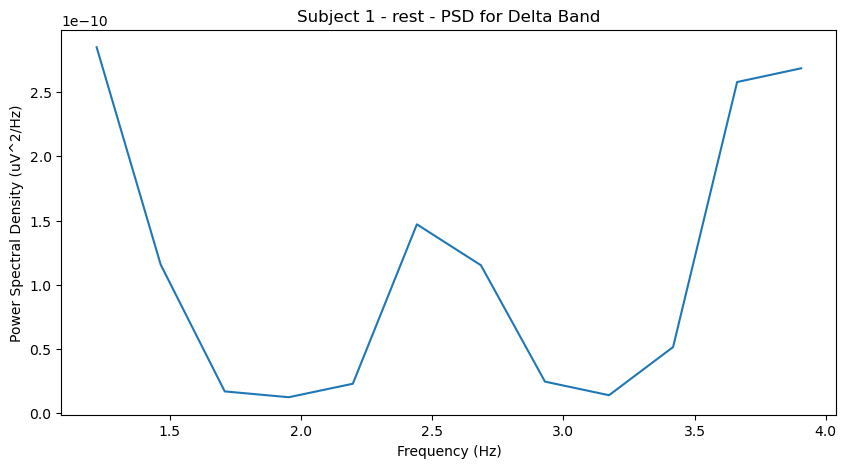

Effective window size : 4.096 (s)


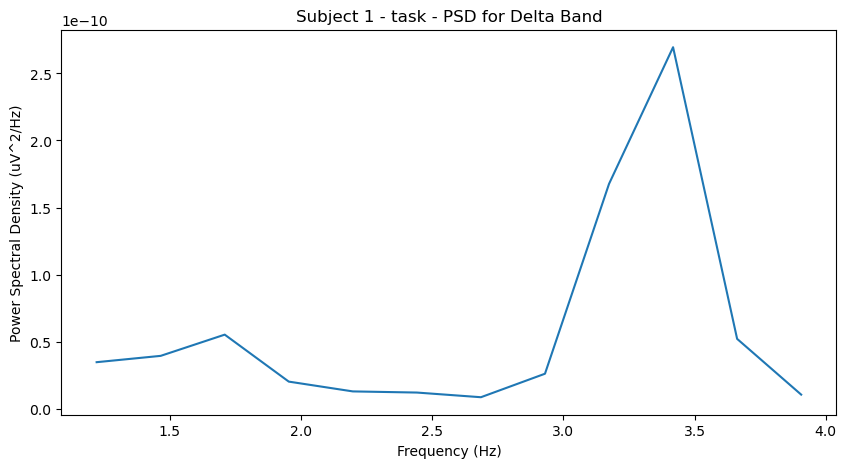

Effective window size : 4.096 (s)


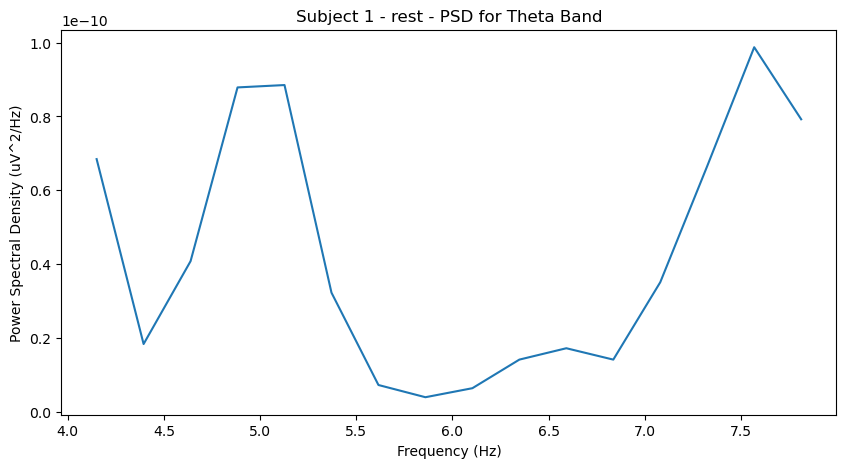

Effective window size : 4.096 (s)


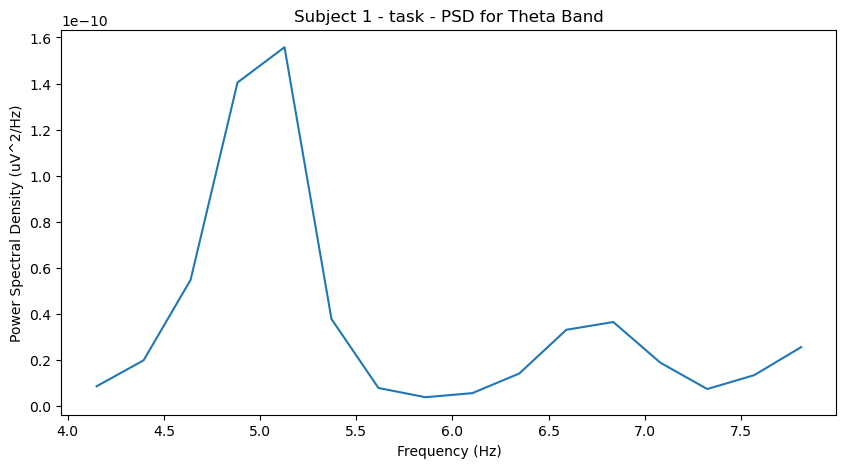

Effective window size : 4.096 (s)


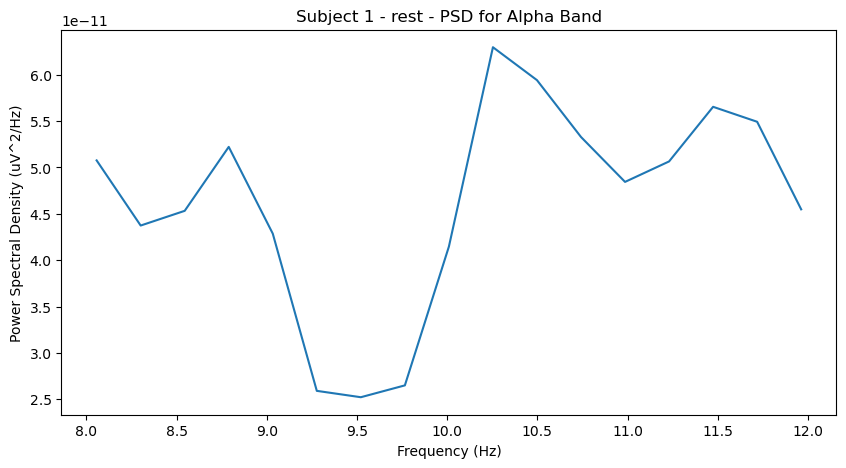

Effective window size : 4.096 (s)


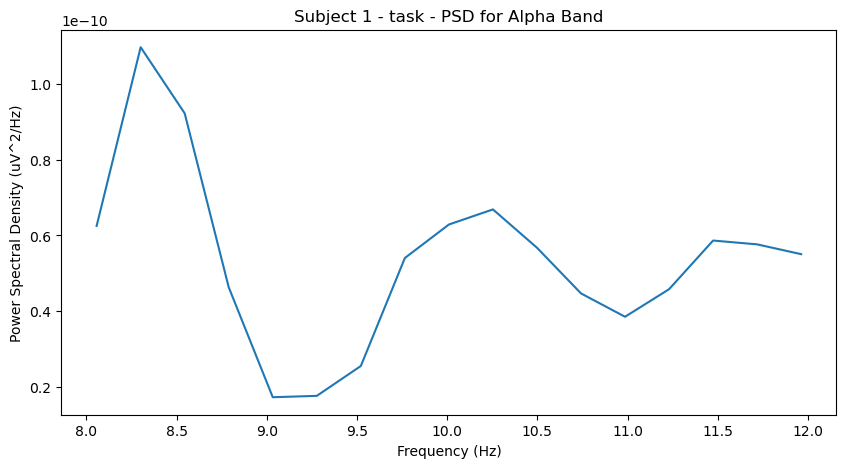

Effective window size : 4.096 (s)


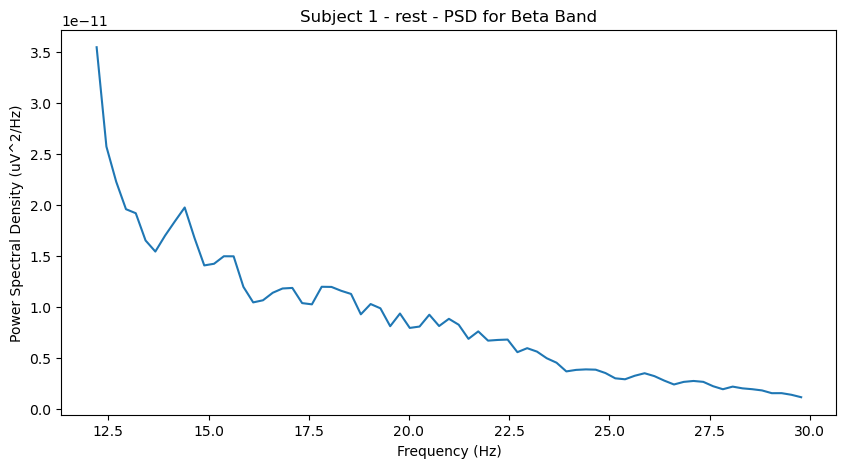

Effective window size : 4.096 (s)


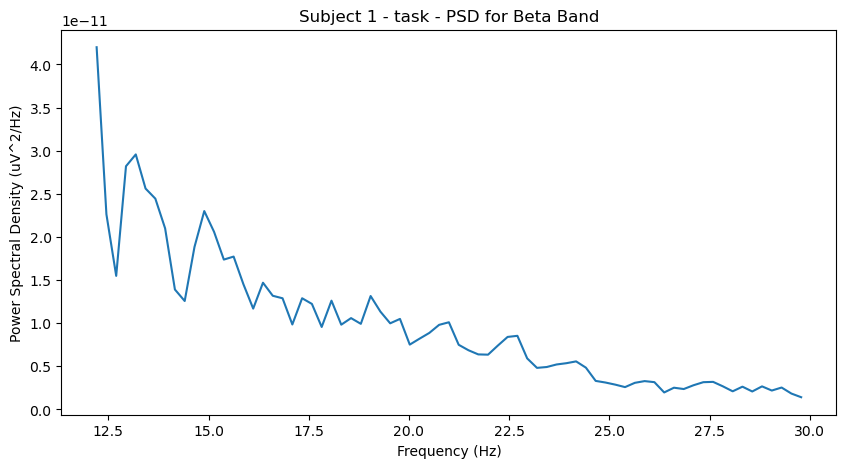

Effective window size : 4.096 (s)


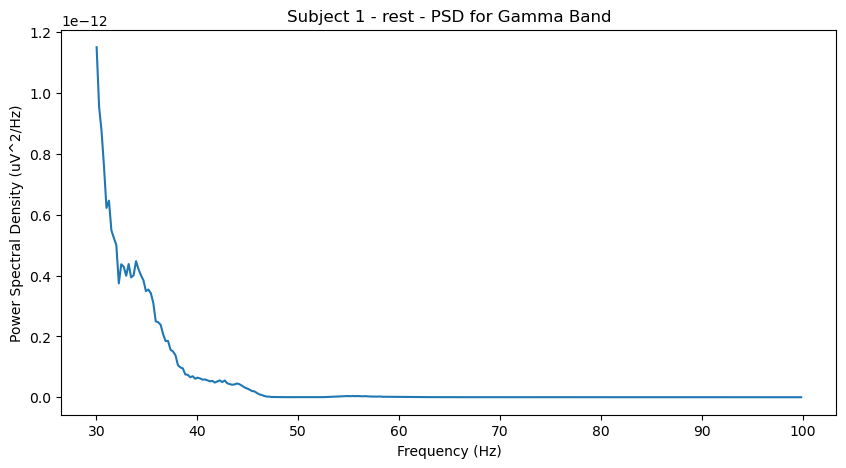

Effective window size : 4.096 (s)


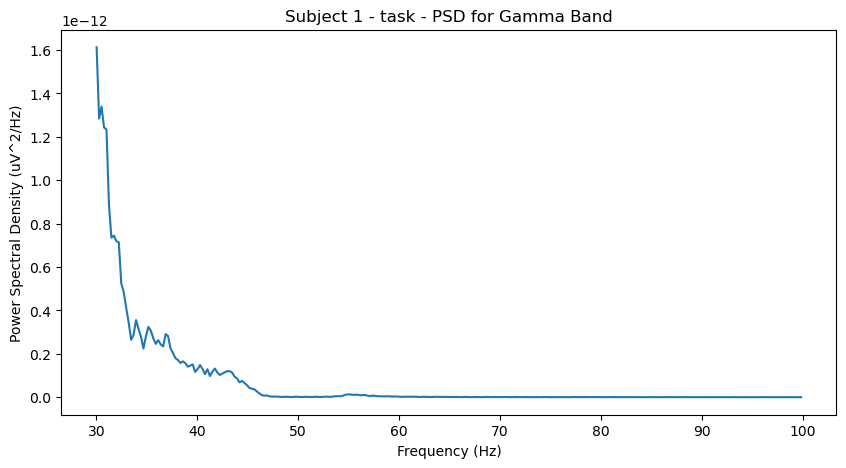

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 1/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject01_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject01_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


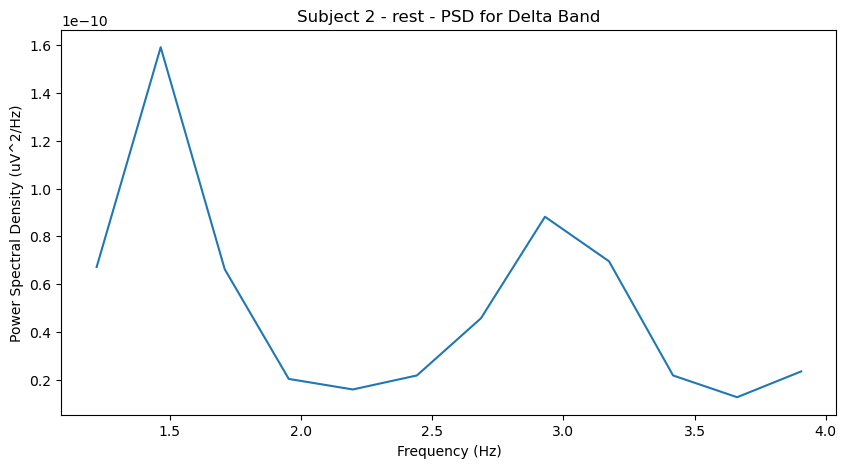

Effective window size : 4.096 (s)


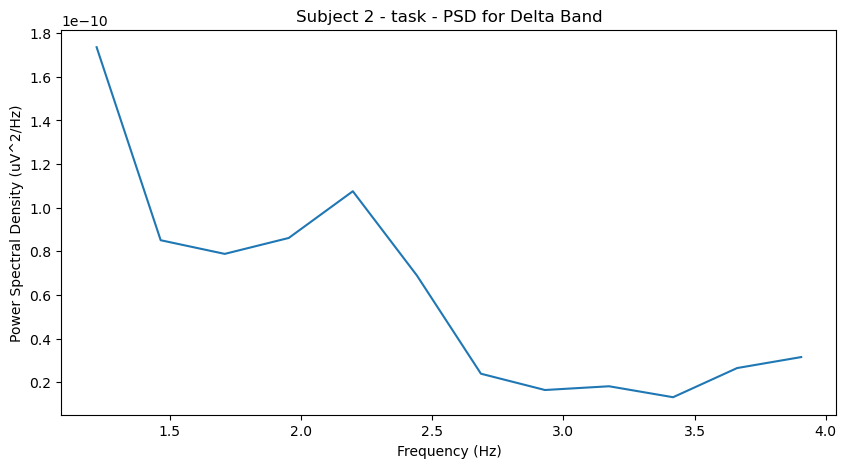

Effective window size : 4.096 (s)


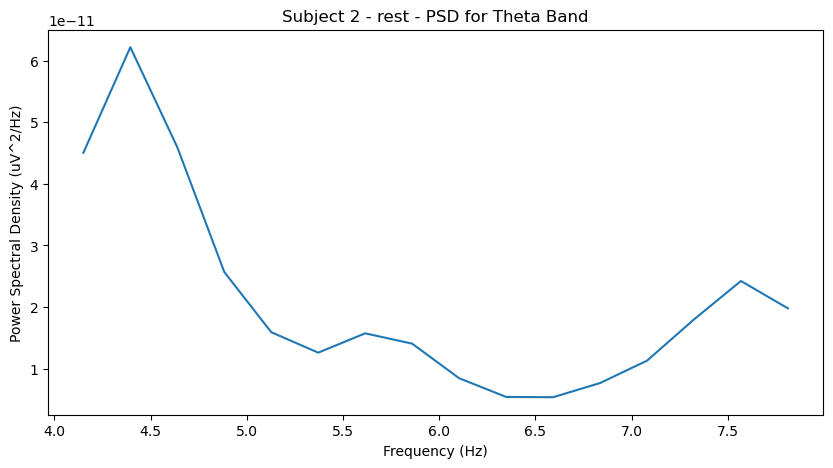

Effective window size : 4.096 (s)


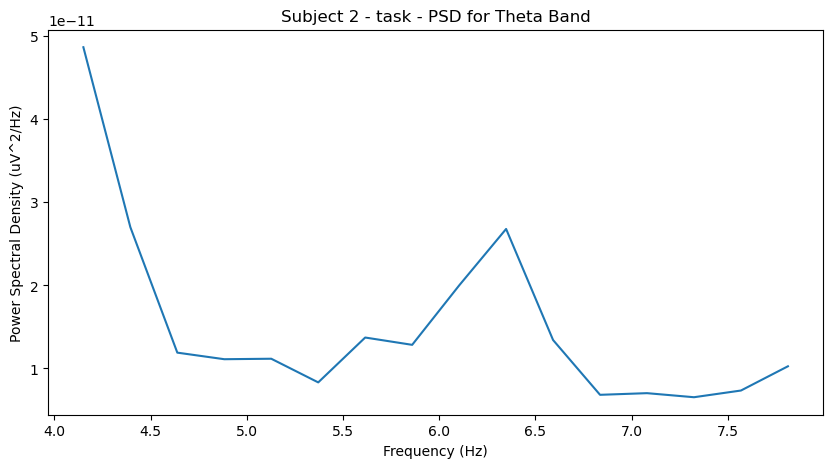

Effective window size : 4.096 (s)


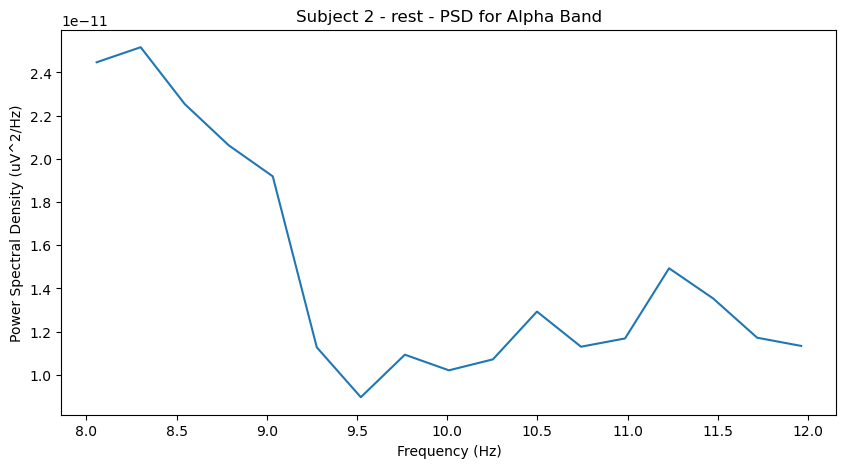

Effective window size : 4.096 (s)


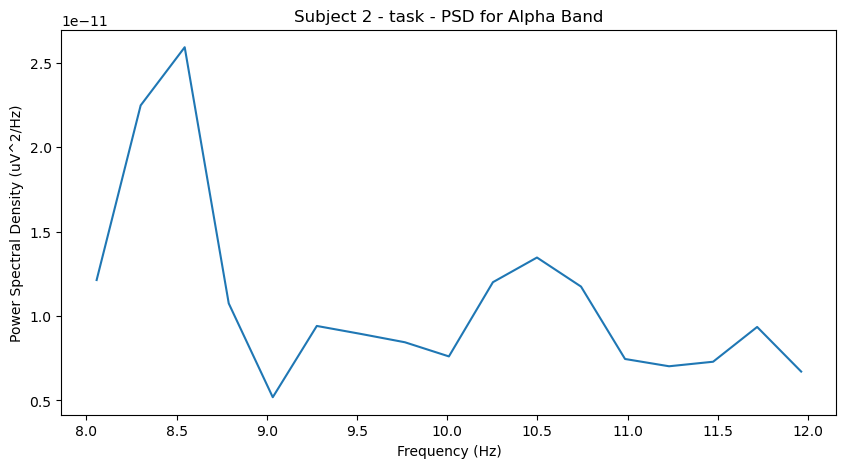

Effective window size : 4.096 (s)


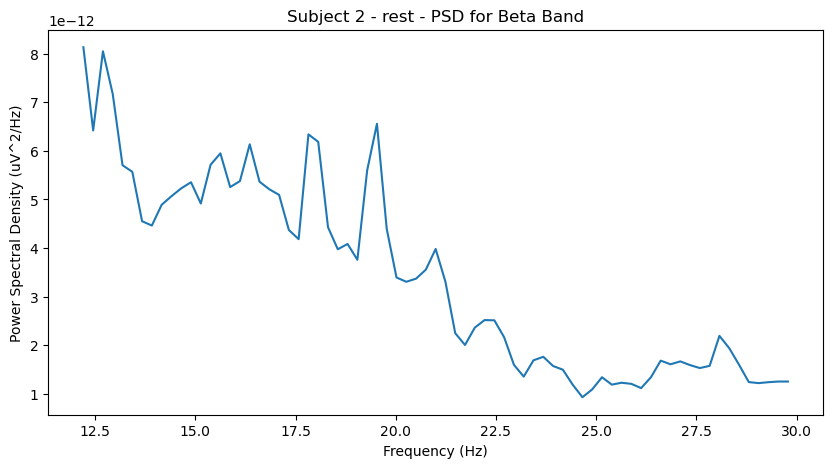

Effective window size : 4.096 (s)


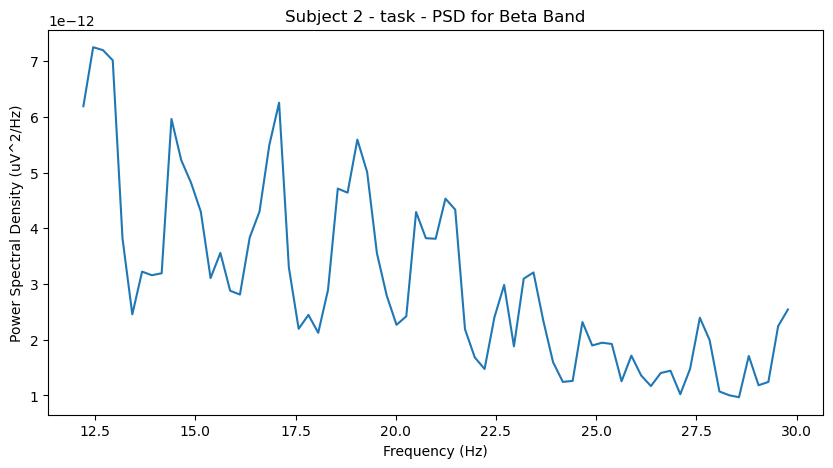

Effective window size : 4.096 (s)


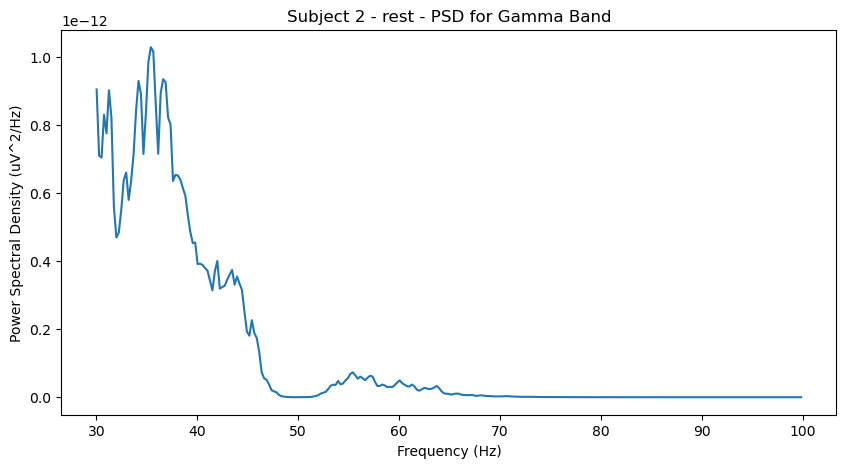

Effective window size : 4.096 (s)


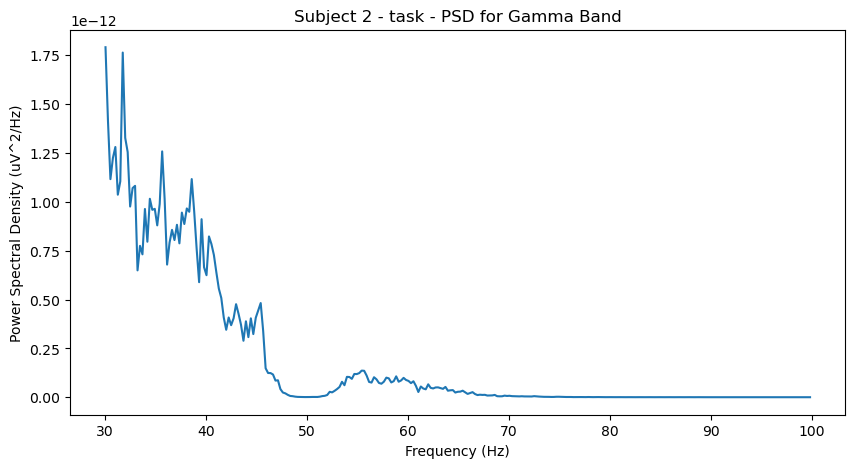

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 2/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject02_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject02_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


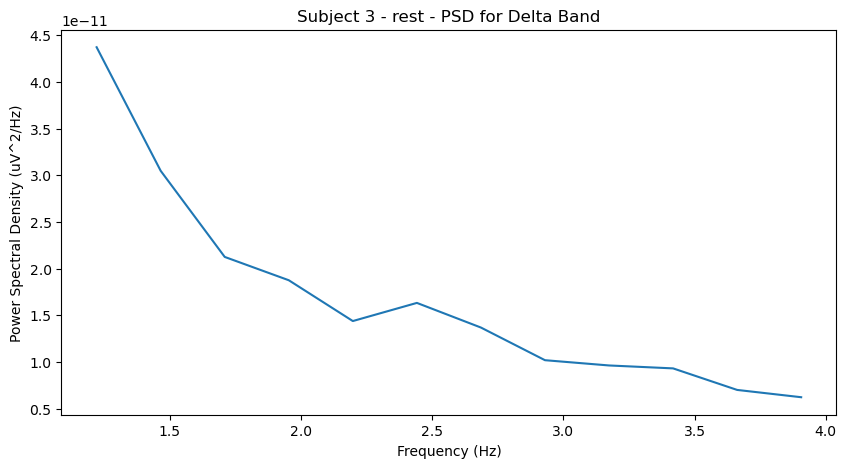

Effective window size : 4.096 (s)


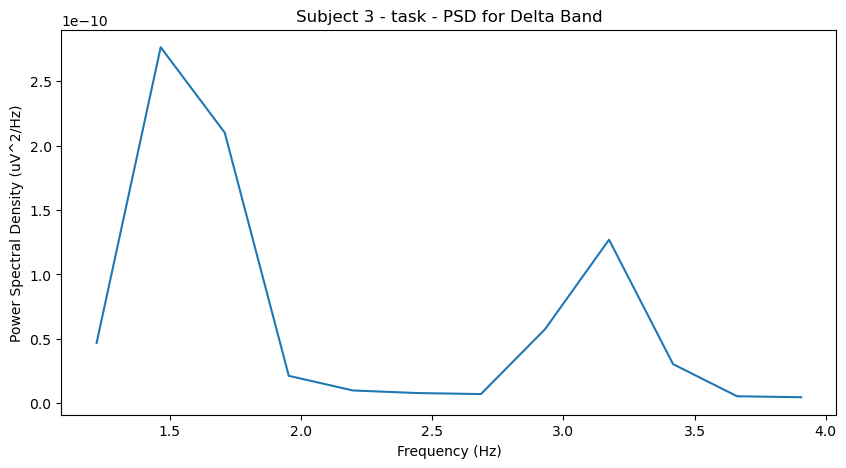

Effective window size : 4.096 (s)


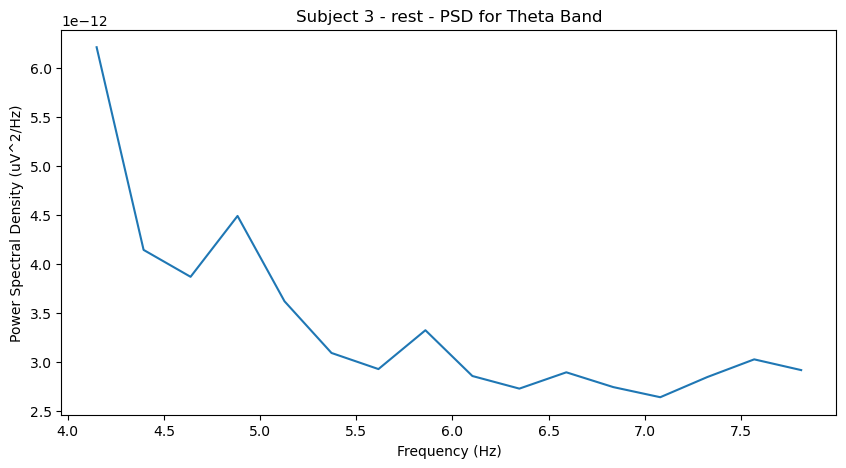

Effective window size : 4.096 (s)


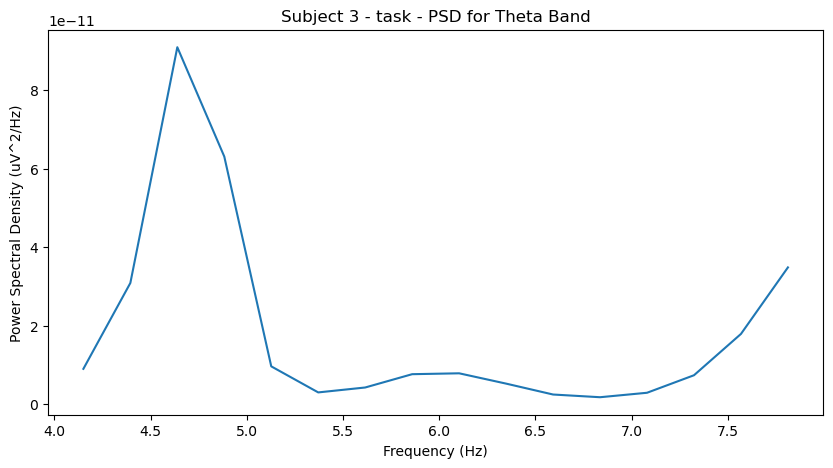

Effective window size : 4.096 (s)


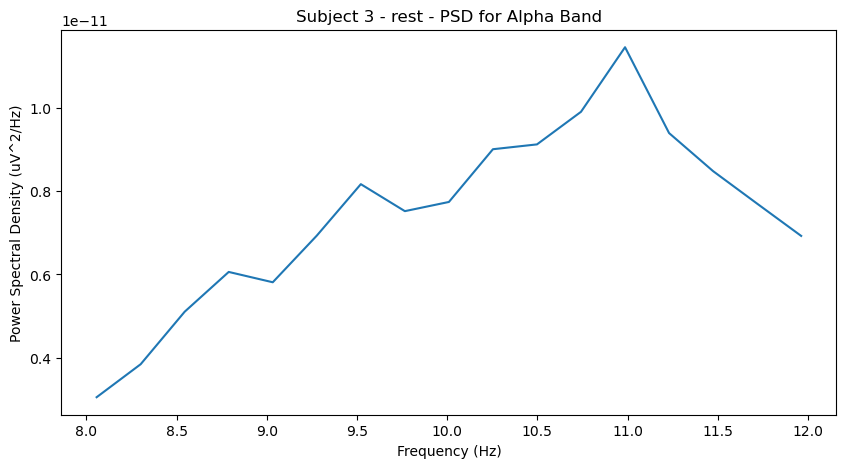

Effective window size : 4.096 (s)


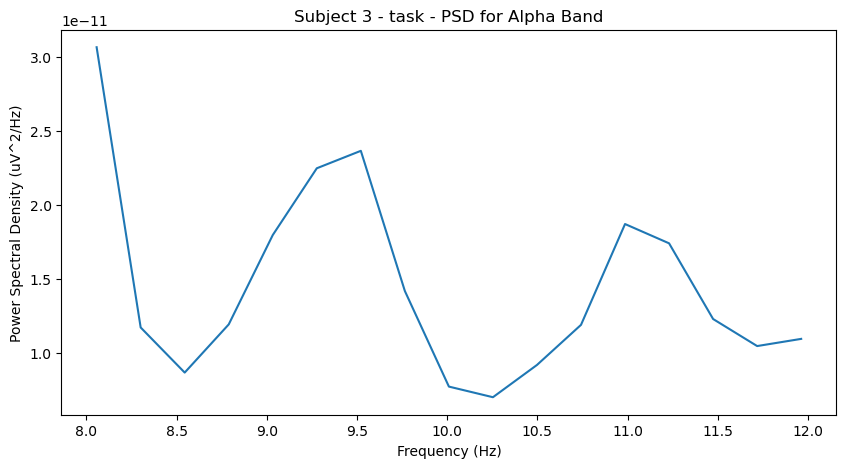

Effective window size : 4.096 (s)


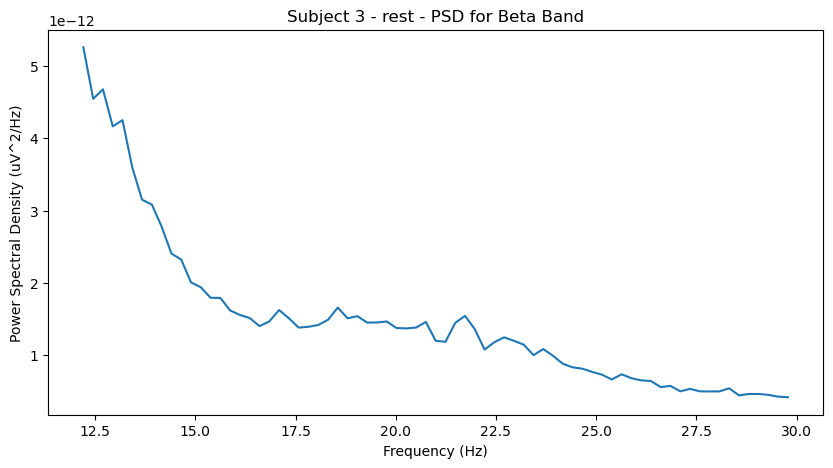

Effective window size : 4.096 (s)


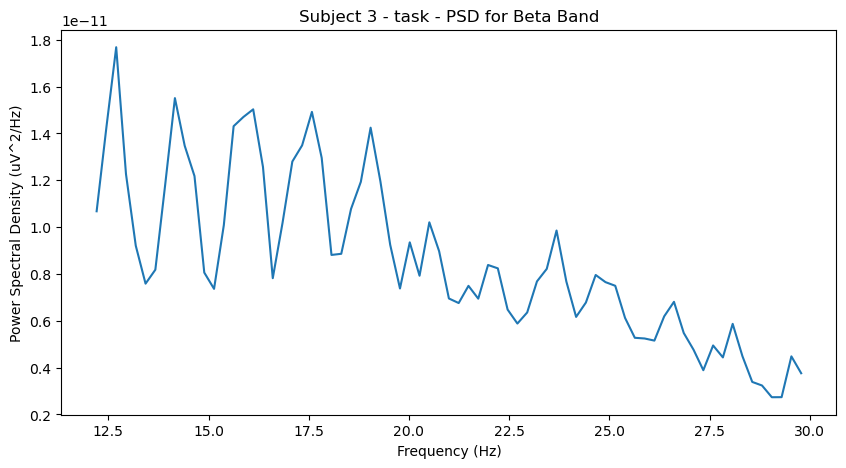

Effective window size : 4.096 (s)


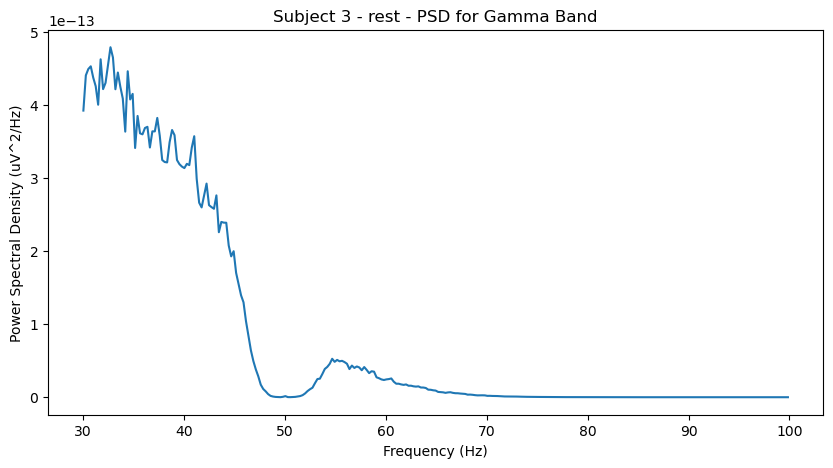

Effective window size : 4.096 (s)


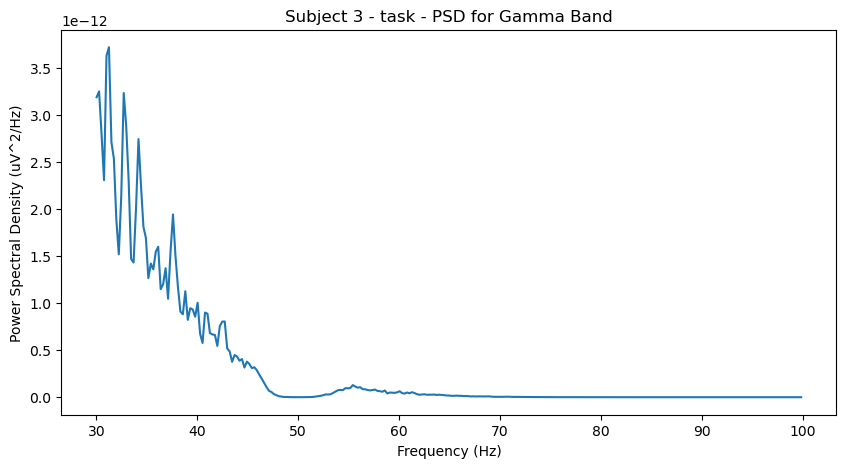

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 3/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject03_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject03_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


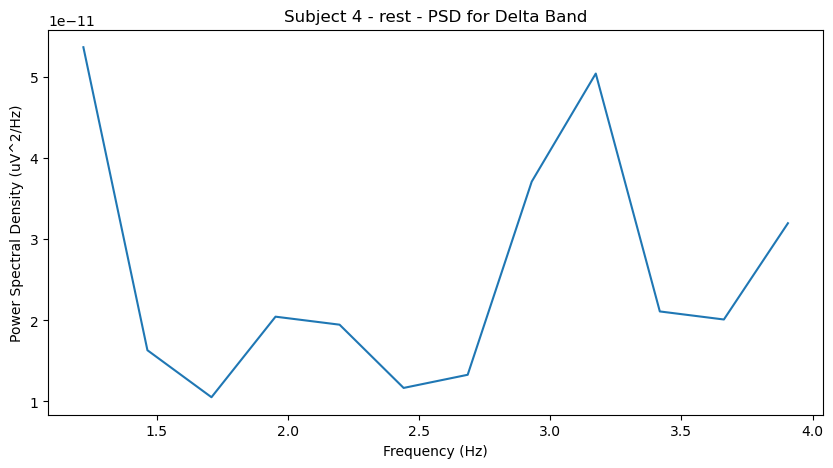

Effective window size : 4.096 (s)


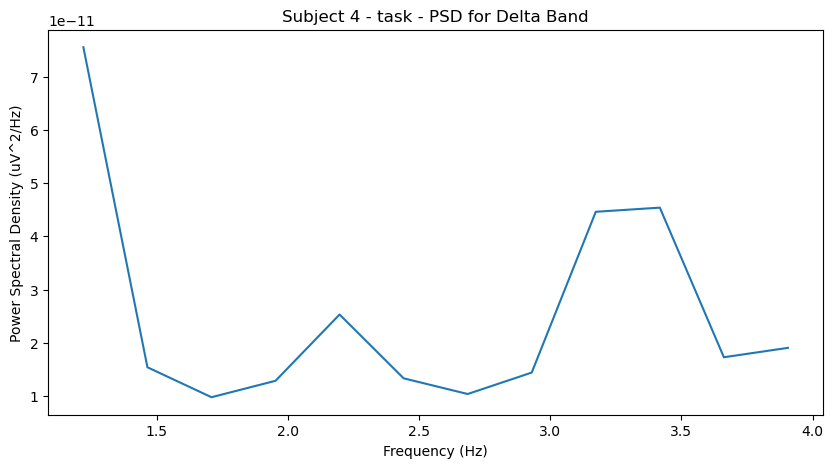

Effective window size : 4.096 (s)


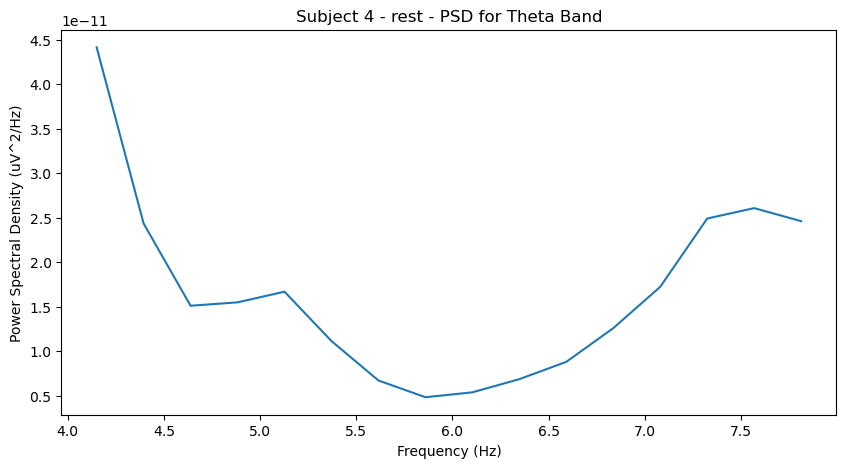

Effective window size : 4.096 (s)


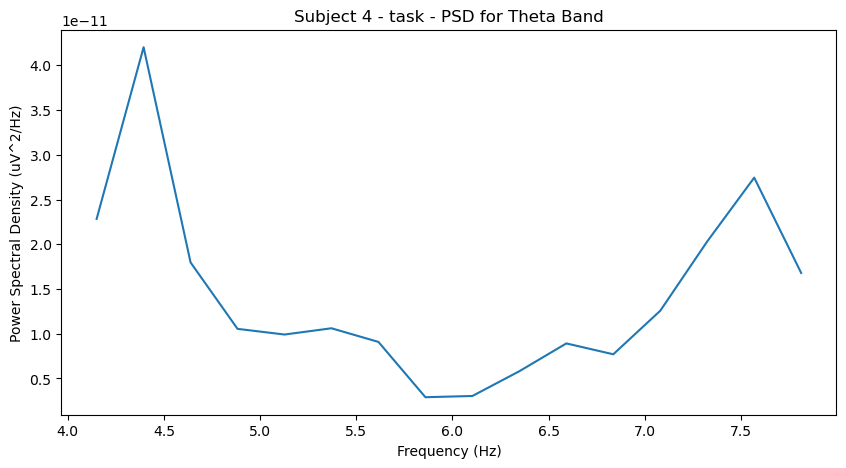

Effective window size : 4.096 (s)


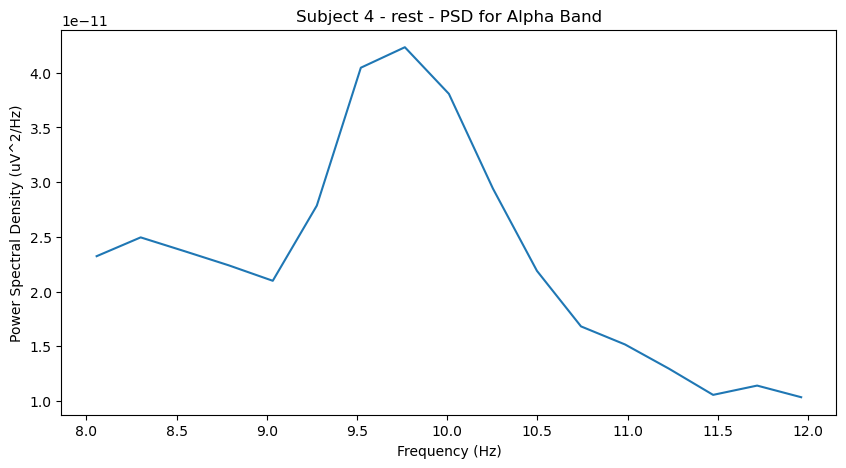

Effective window size : 4.096 (s)


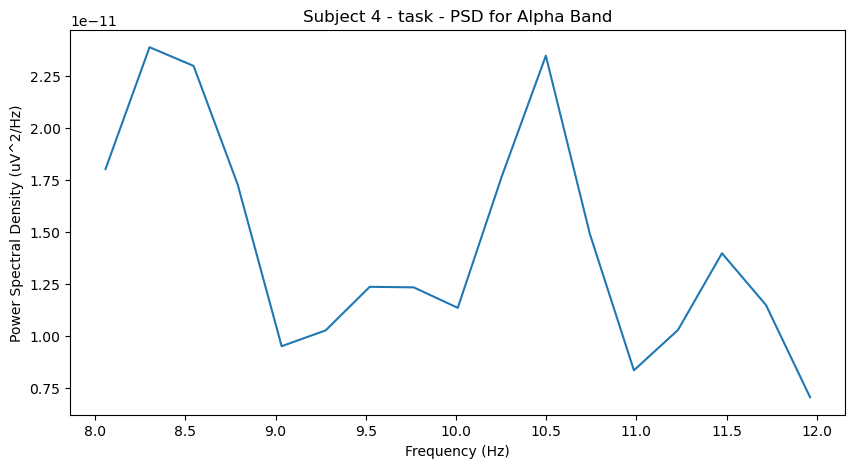

Effective window size : 4.096 (s)


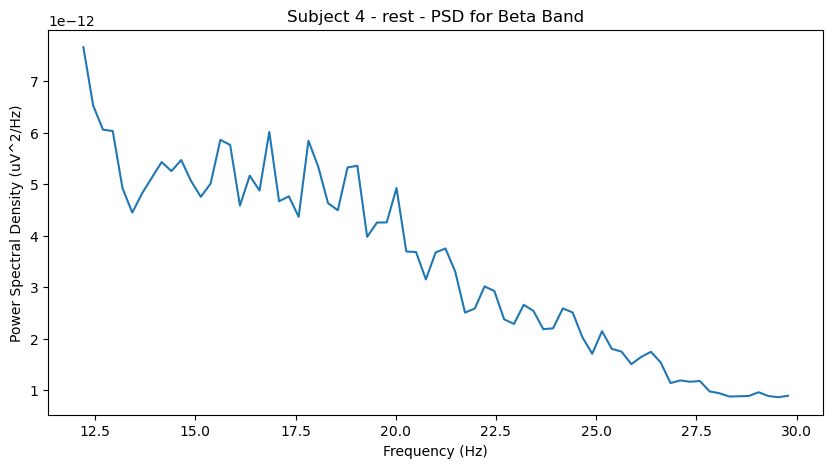

Effective window size : 4.096 (s)


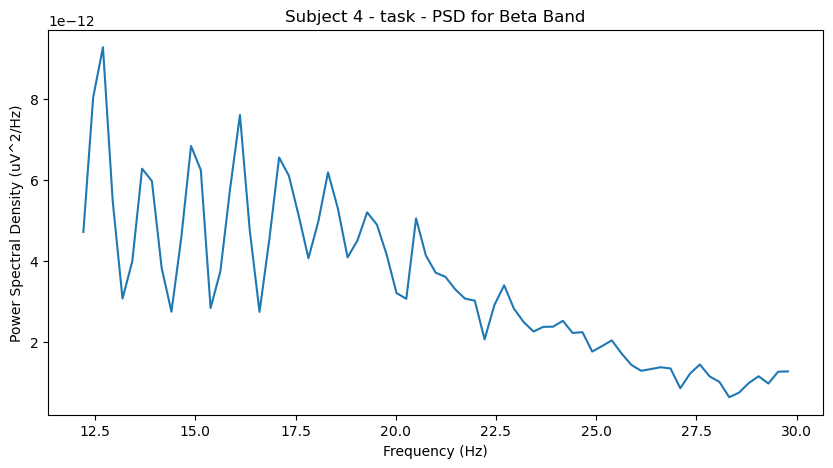

Effective window size : 4.096 (s)


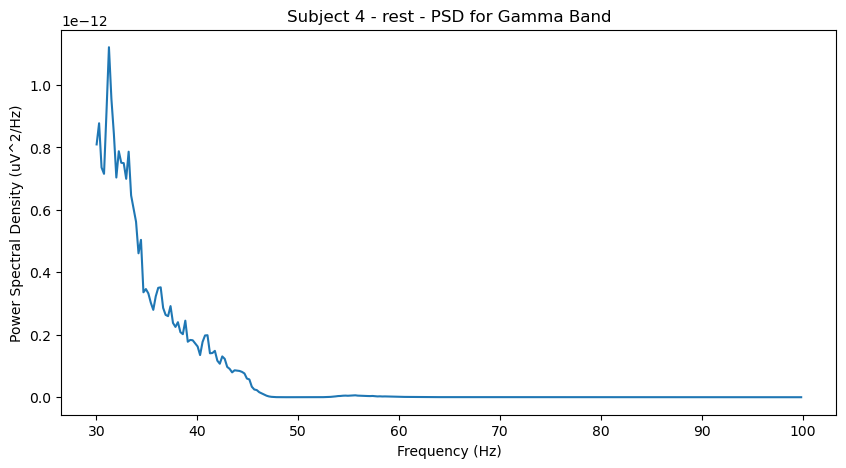

Effective window size : 4.096 (s)


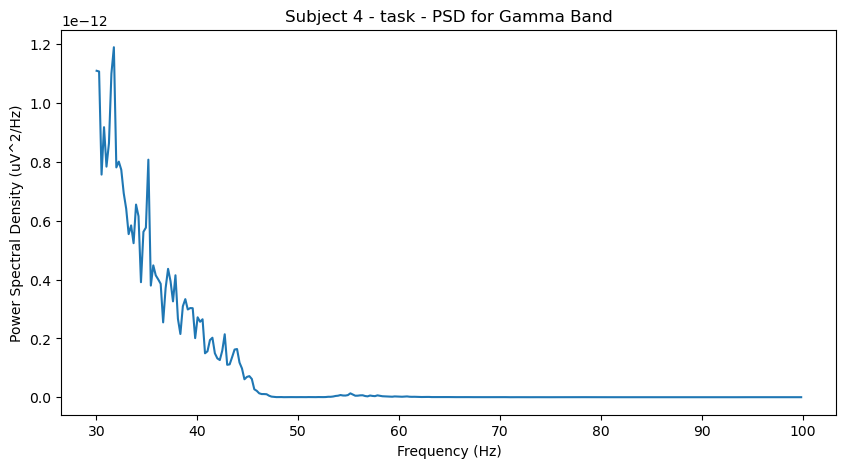

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 4/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject04_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 84999  =      0.000 ...   169.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject04_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


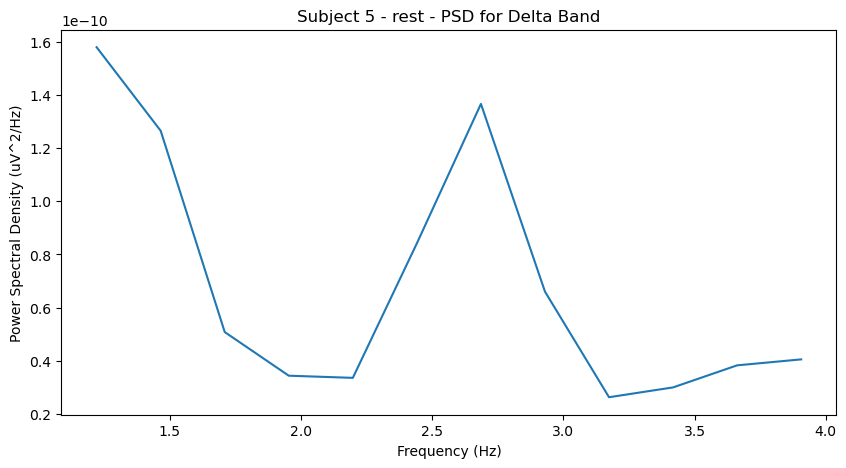

Effective window size : 4.096 (s)


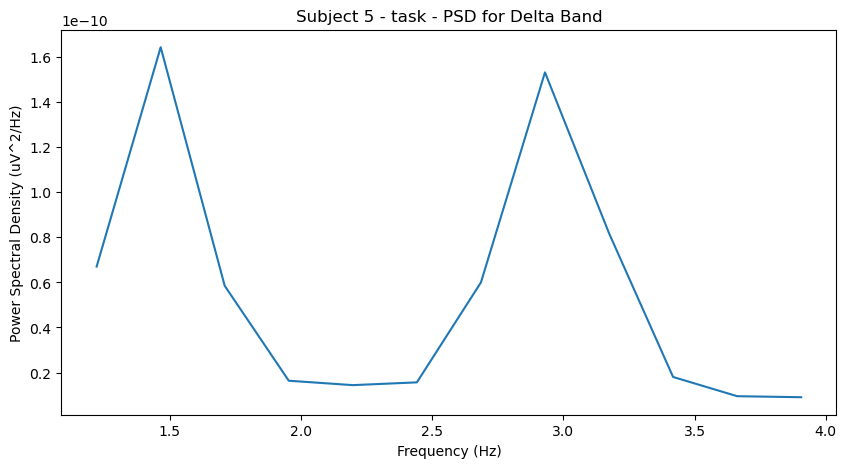

Effective window size : 4.096 (s)


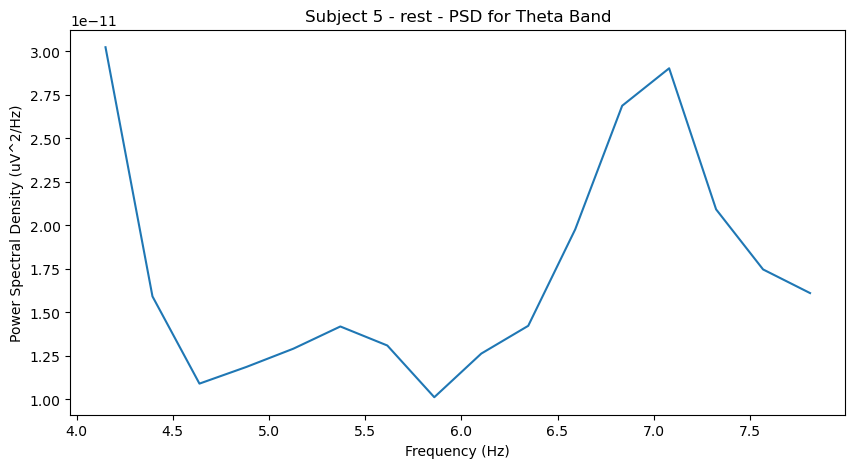

Effective window size : 4.096 (s)


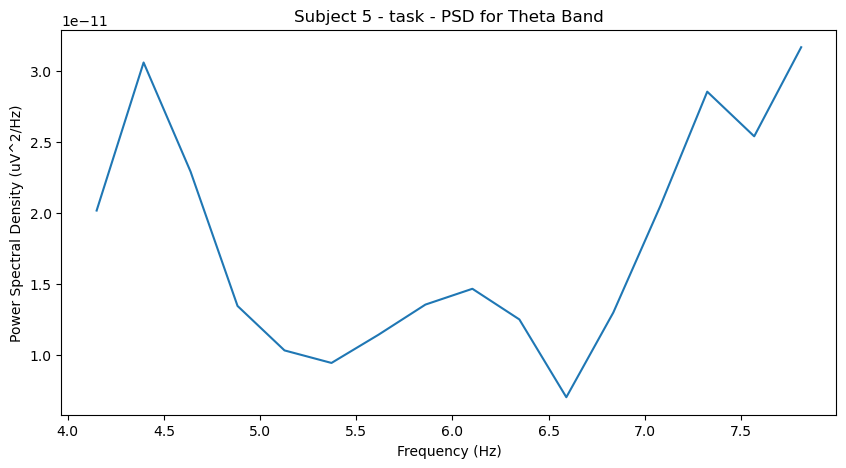

Effective window size : 4.096 (s)


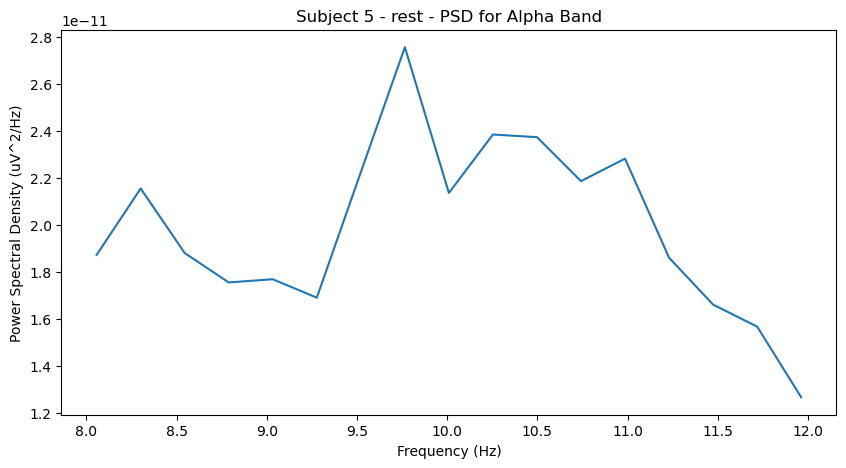

Effective window size : 4.096 (s)


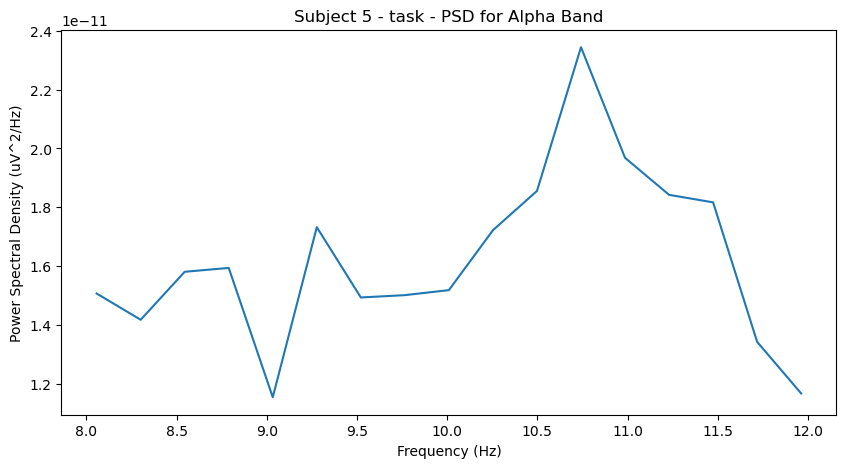

Effective window size : 4.096 (s)


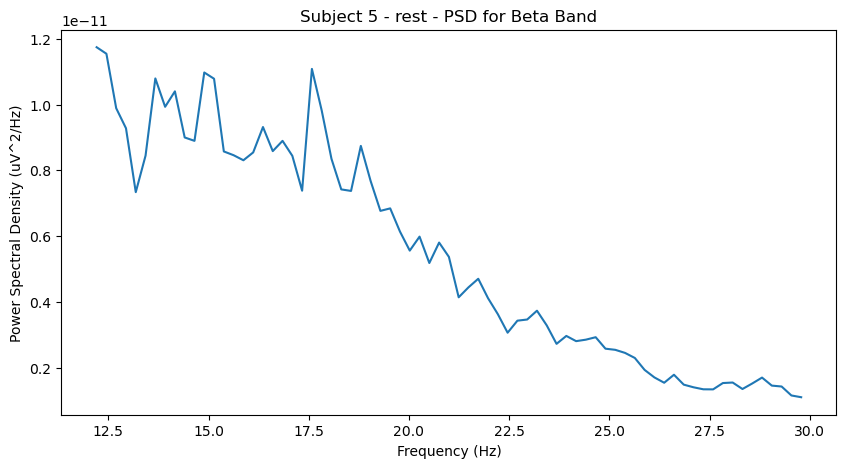

Effective window size : 4.096 (s)


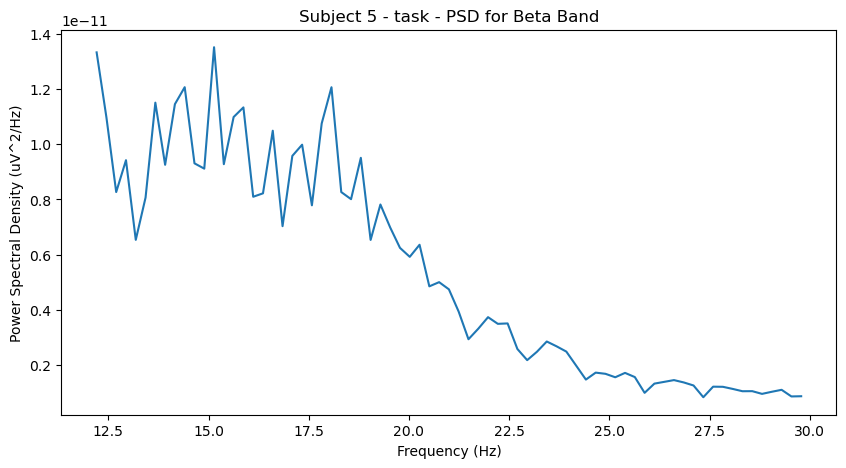

Effective window size : 4.096 (s)


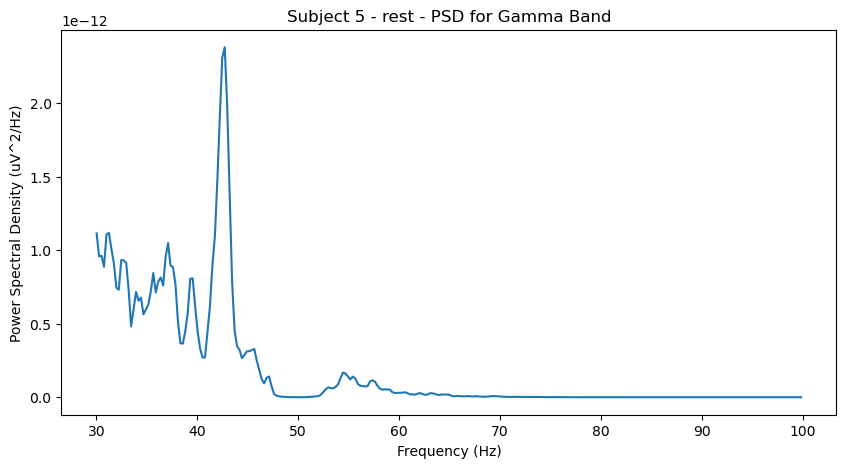

Effective window size : 4.096 (s)


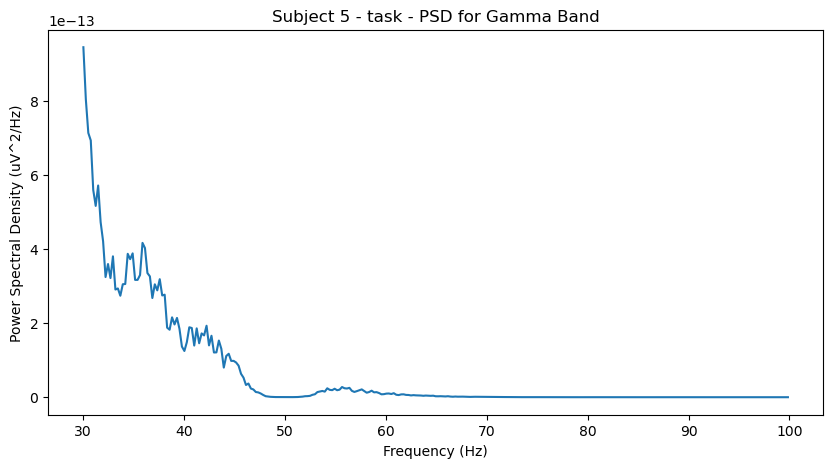

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 5/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject05_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject05_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


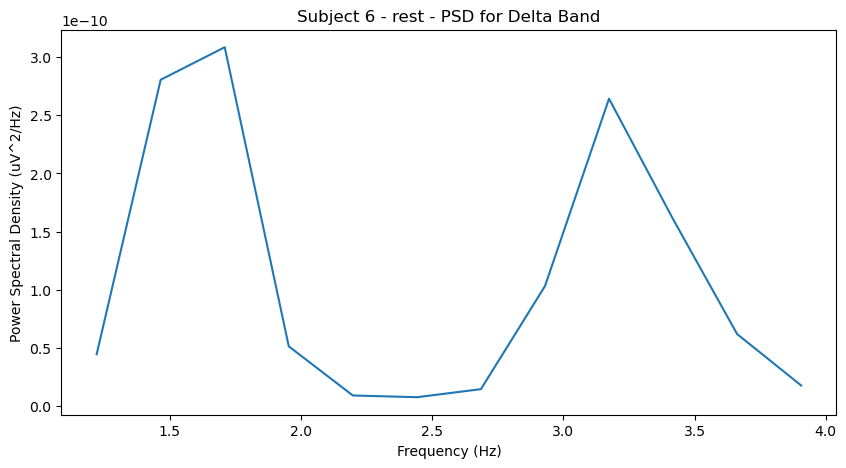

Effective window size : 4.096 (s)


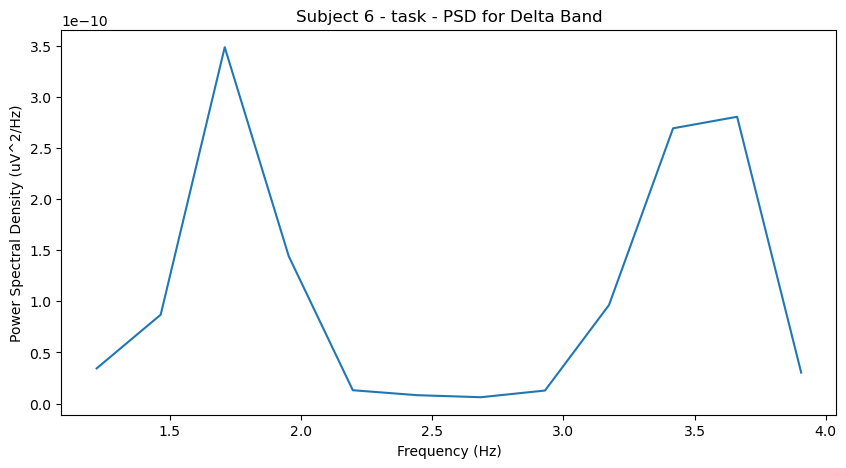

Effective window size : 4.096 (s)


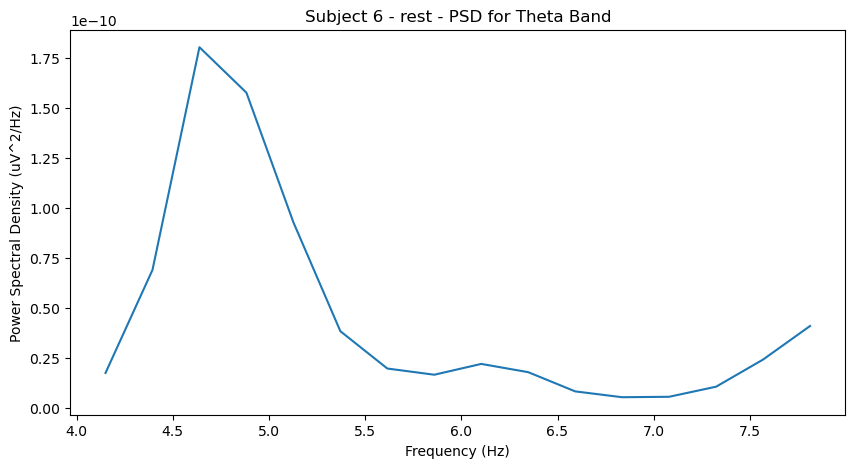

Effective window size : 4.096 (s)


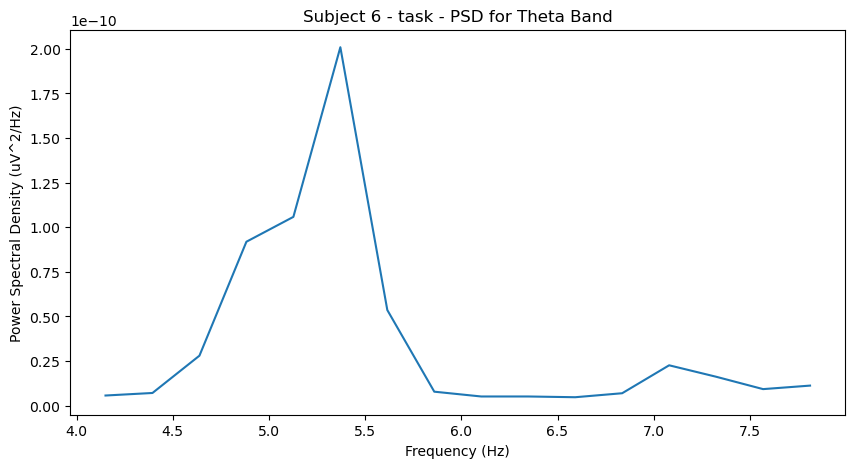

Effective window size : 4.096 (s)


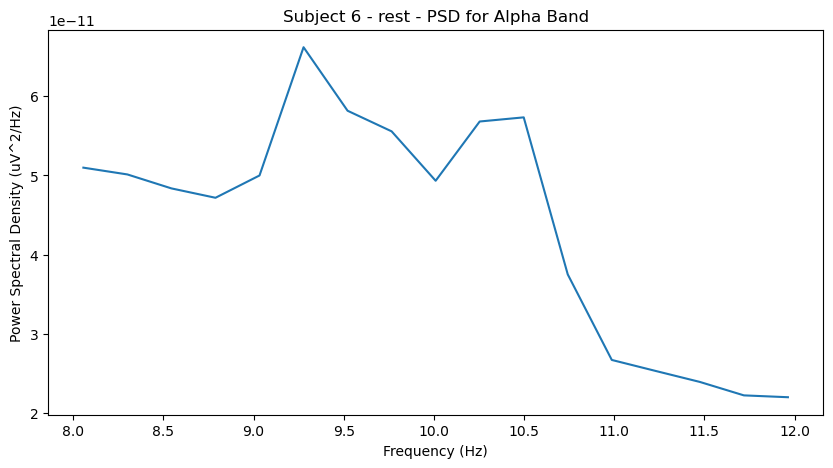

Effective window size : 4.096 (s)


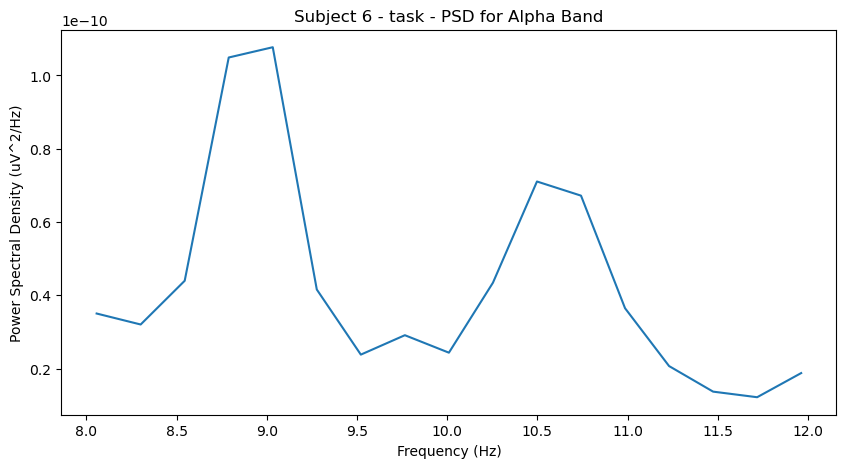

Effective window size : 4.096 (s)


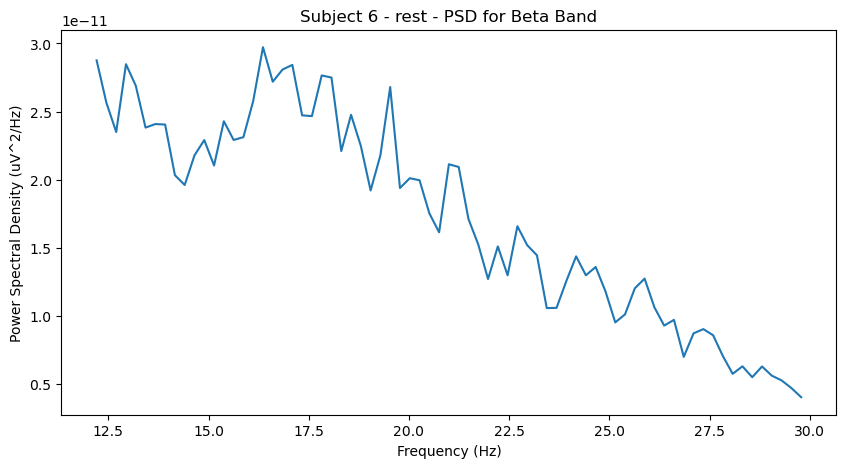

Effective window size : 4.096 (s)


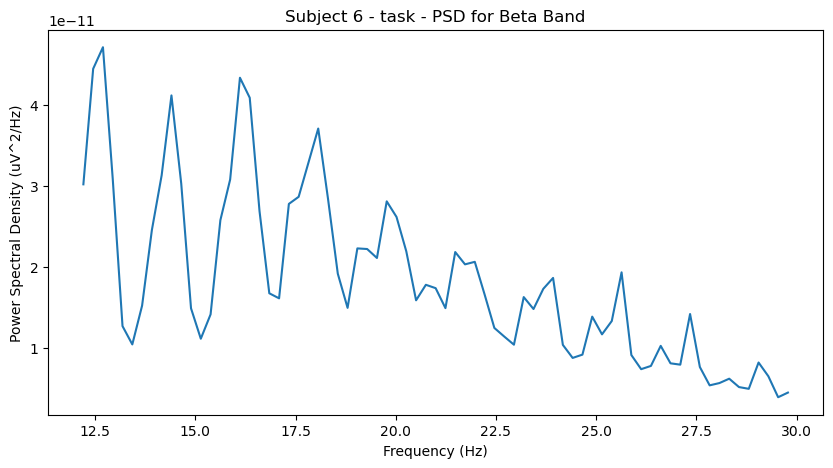

Effective window size : 4.096 (s)


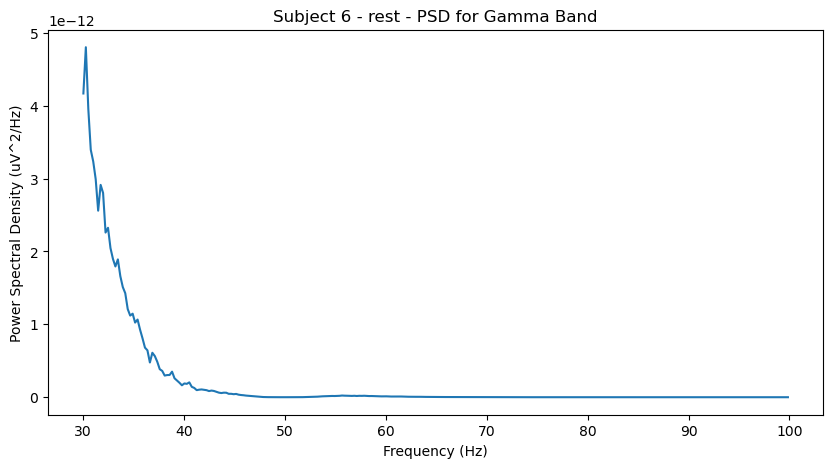

Effective window size : 4.096 (s)


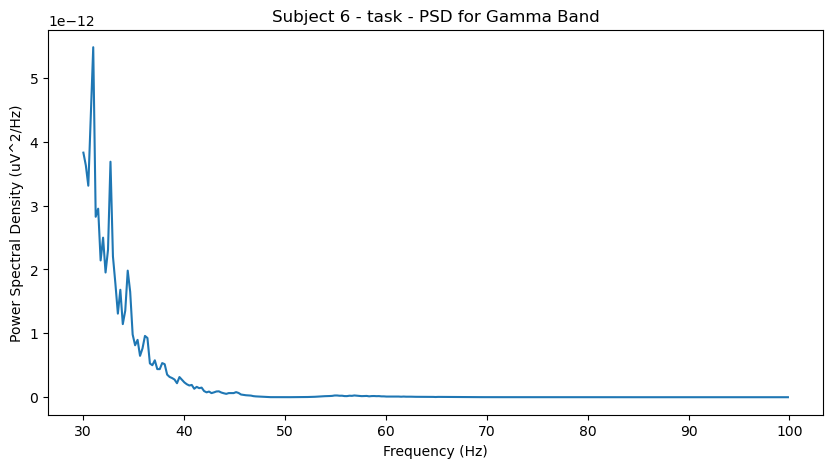

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 6/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject06_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject06_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


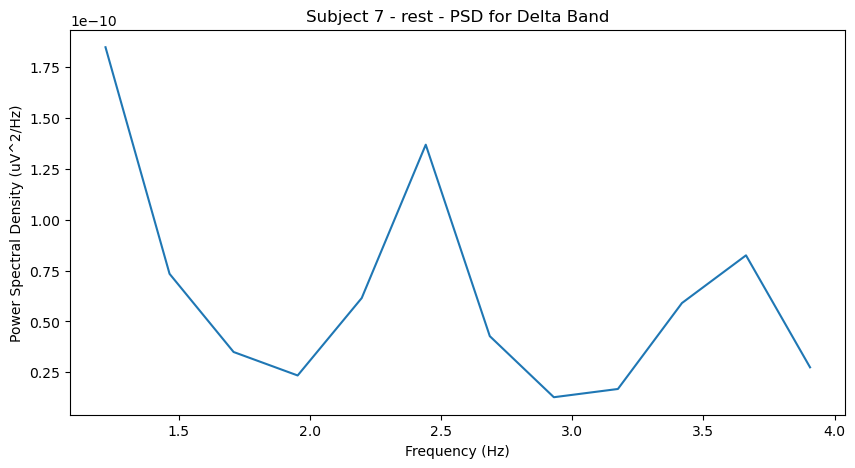

Effective window size : 4.096 (s)


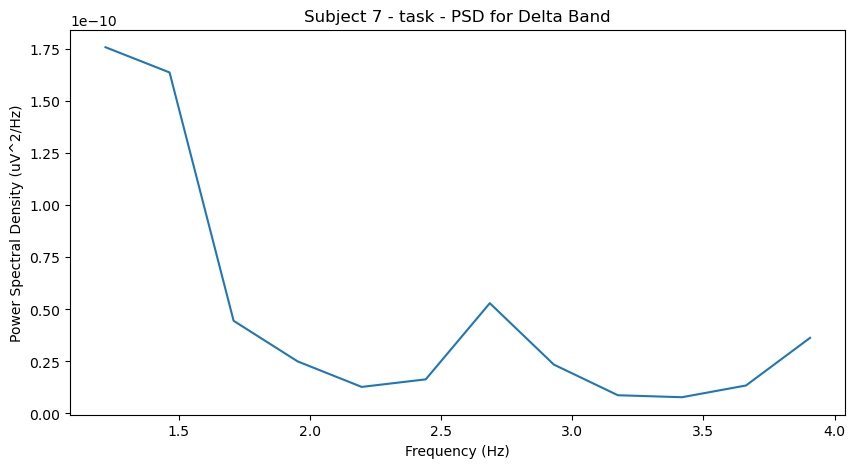

Effective window size : 4.096 (s)


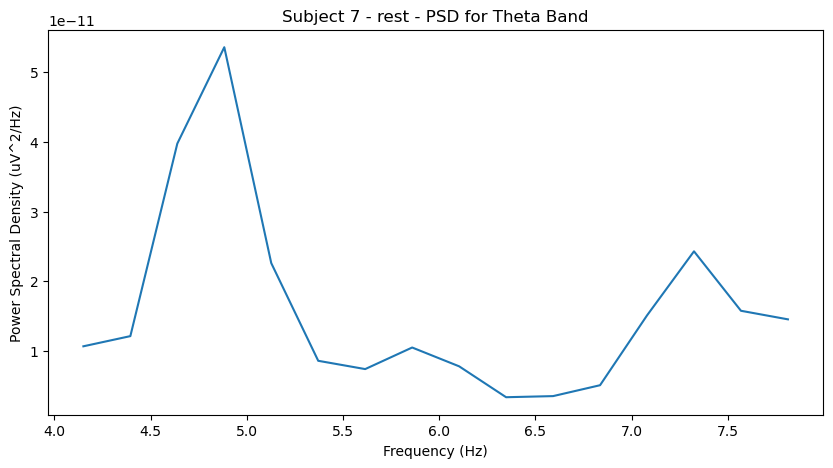

Effective window size : 4.096 (s)


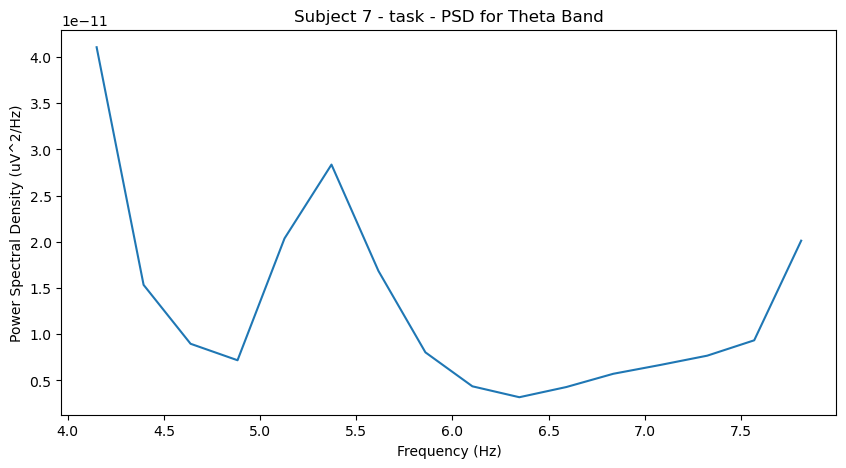

Effective window size : 4.096 (s)


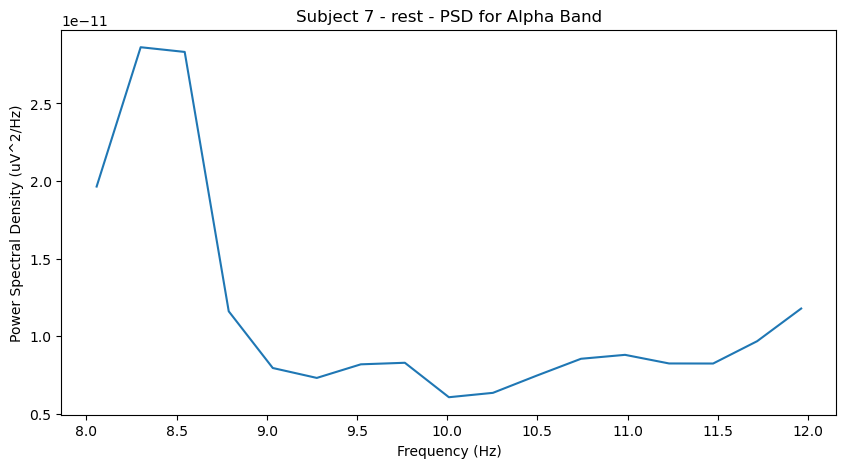

Effective window size : 4.096 (s)


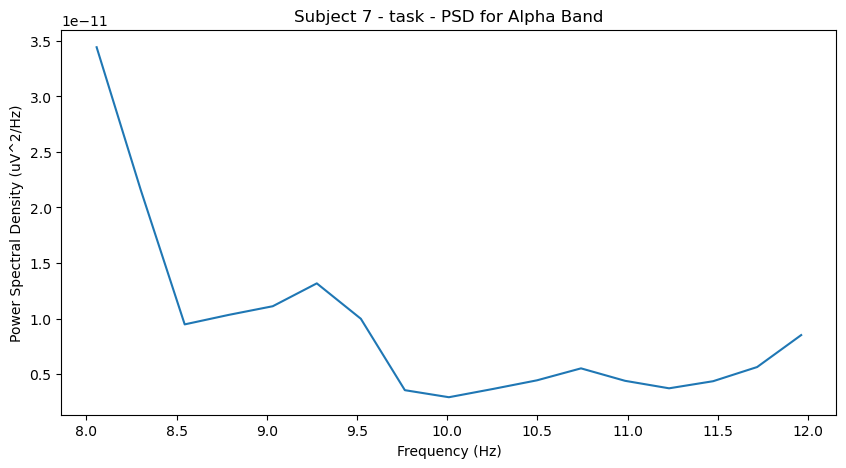

Effective window size : 4.096 (s)


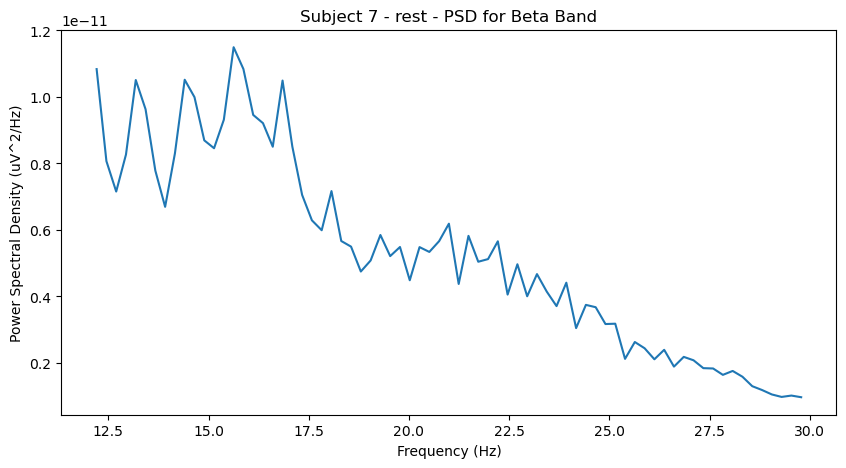

Effective window size : 4.096 (s)


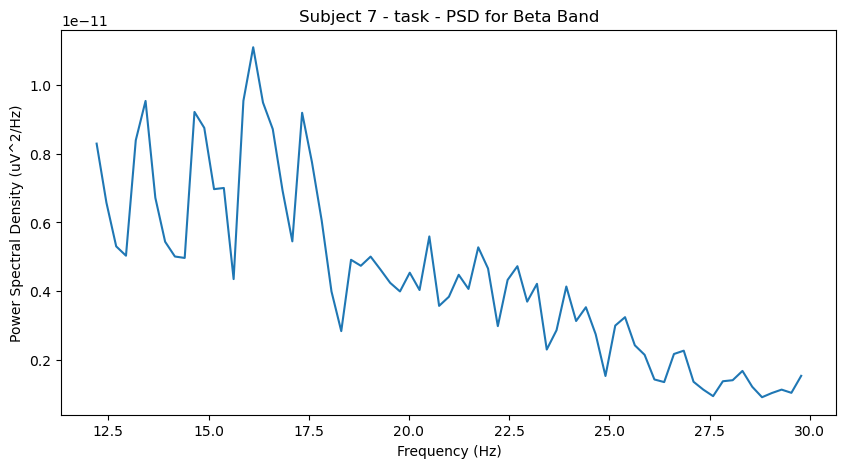

Effective window size : 4.096 (s)


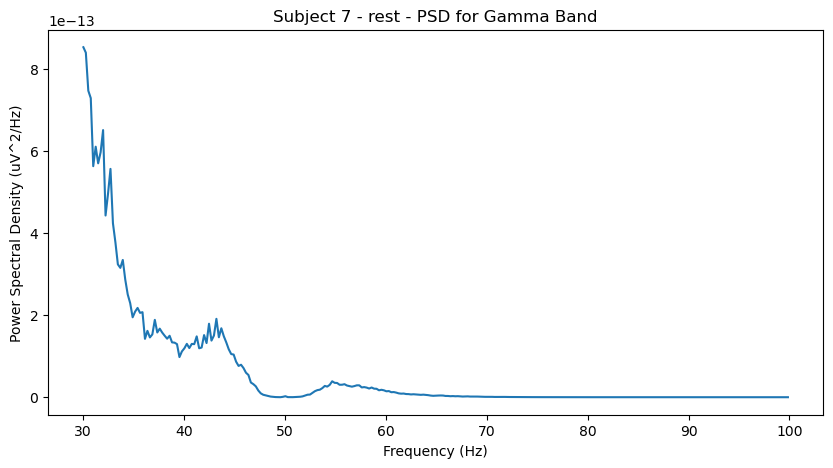

Effective window size : 4.096 (s)


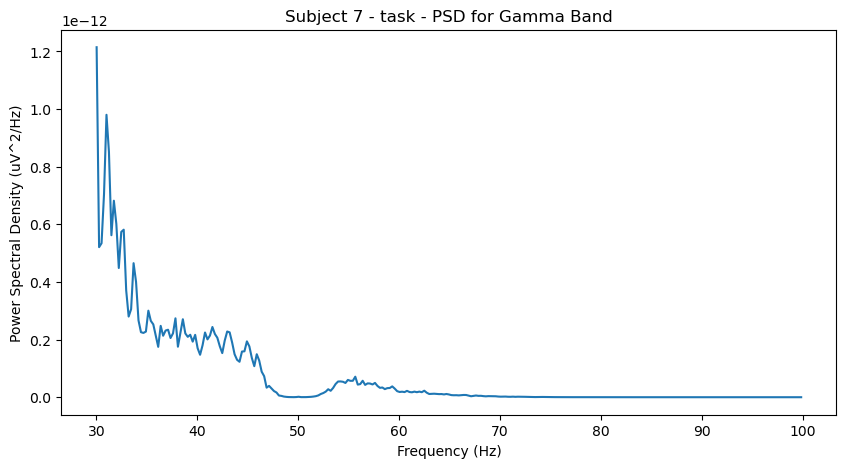

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 7/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject07_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject07_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


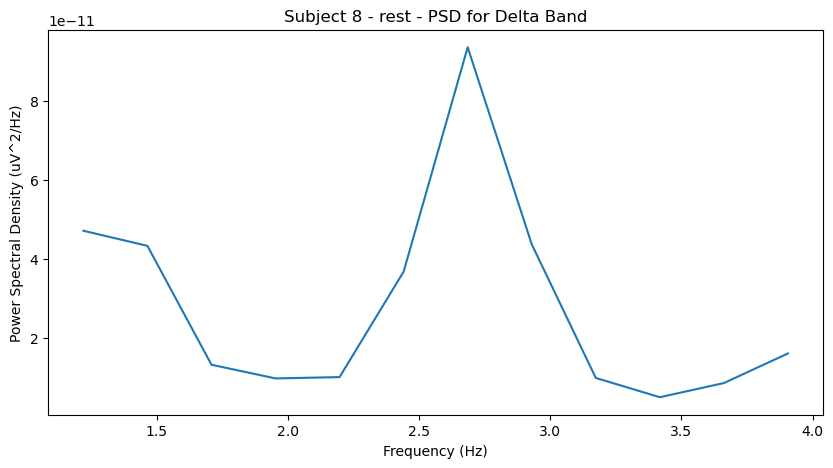

Effective window size : 4.096 (s)


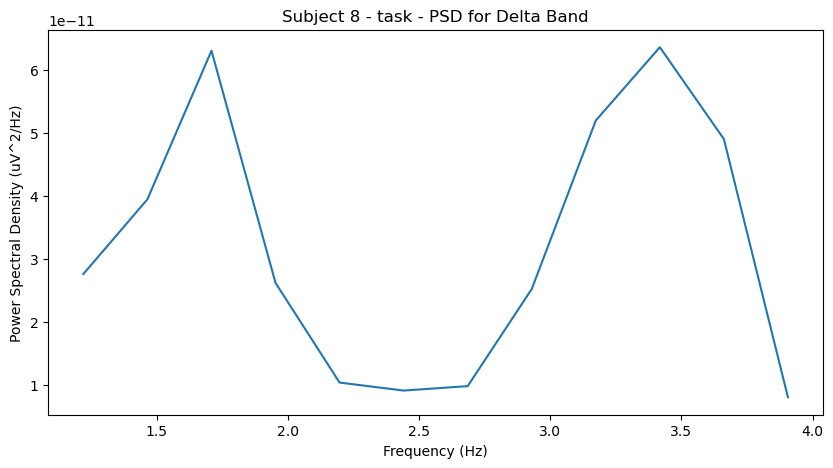

Effective window size : 4.096 (s)


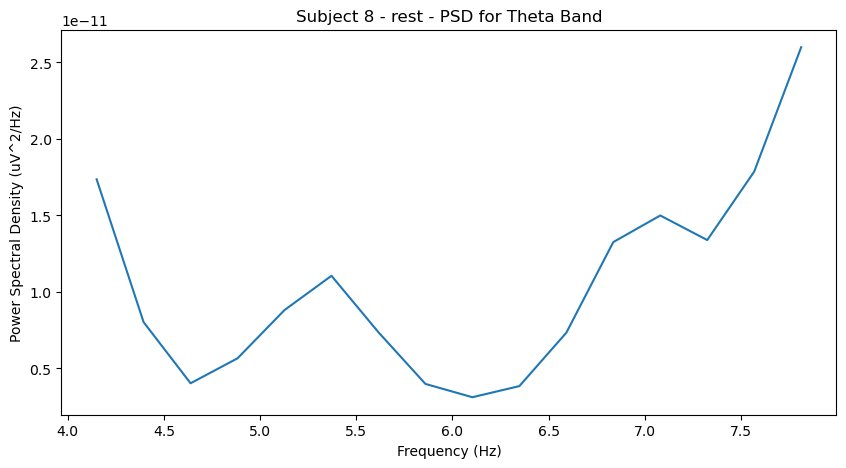

Effective window size : 4.096 (s)


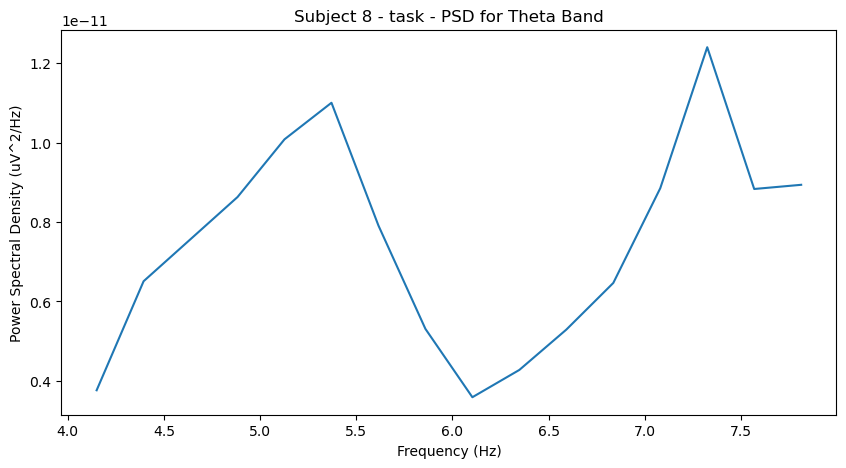

Effective window size : 4.096 (s)


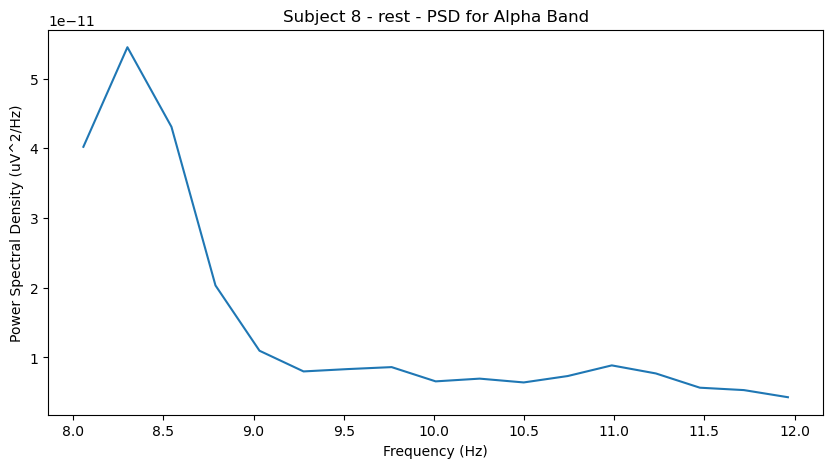

Effective window size : 4.096 (s)


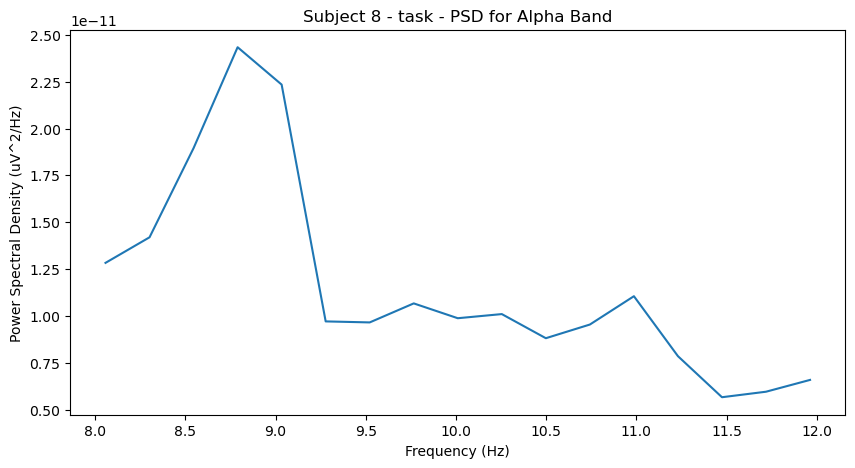

Effective window size : 4.096 (s)


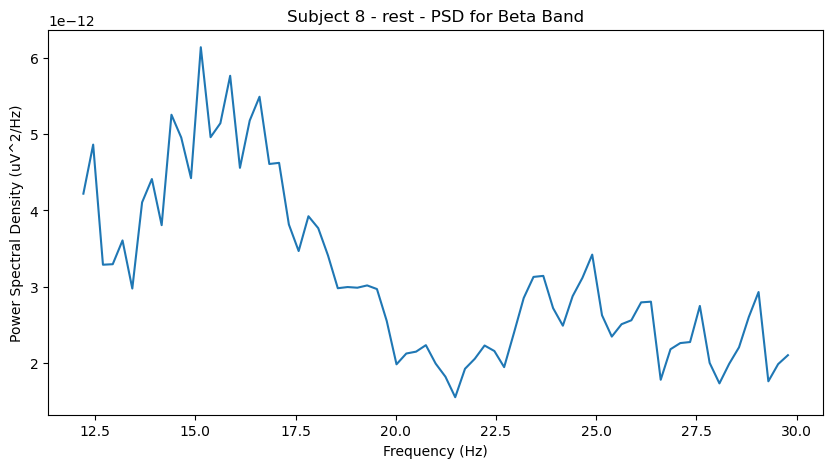

Effective window size : 4.096 (s)


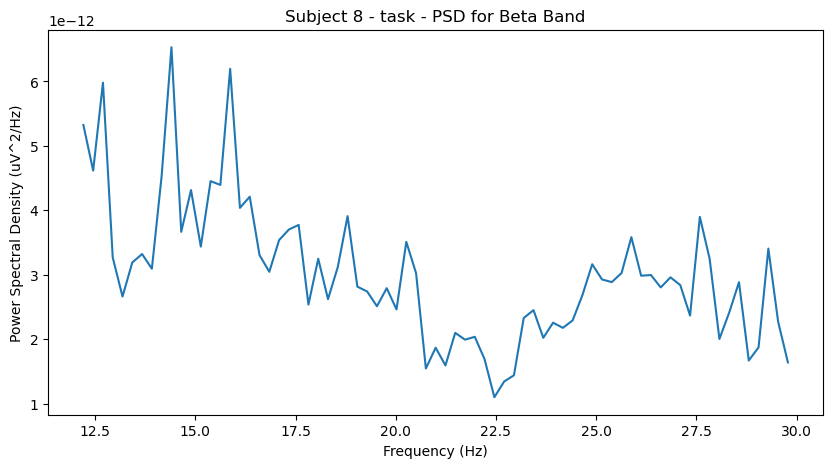

Effective window size : 4.096 (s)


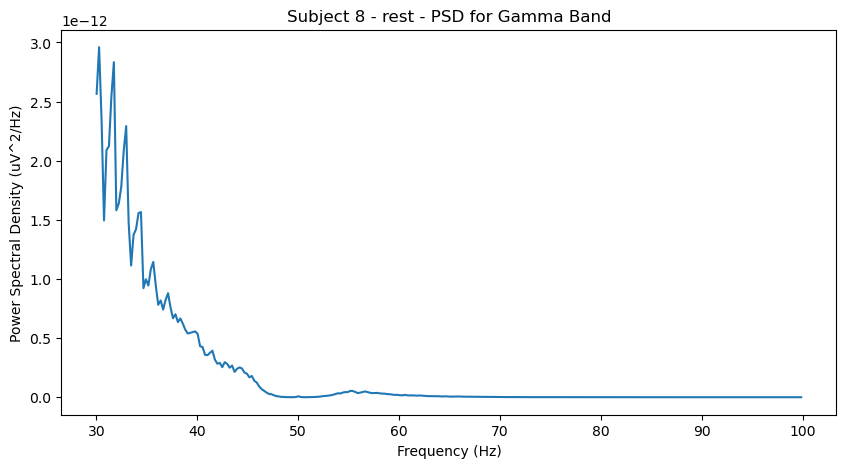

Effective window size : 4.096 (s)


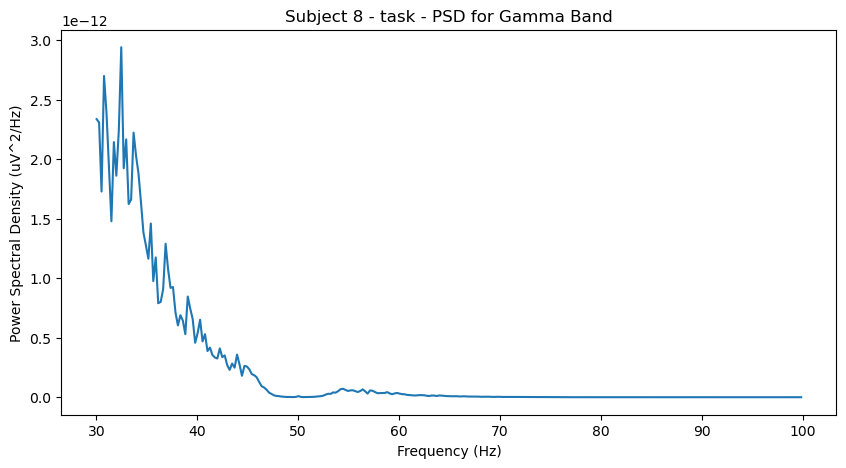

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 8/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject08_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject08_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


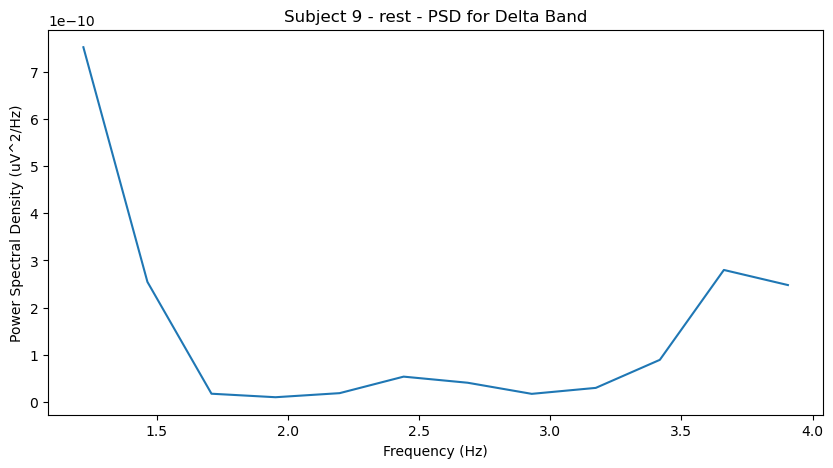

Effective window size : 4.096 (s)


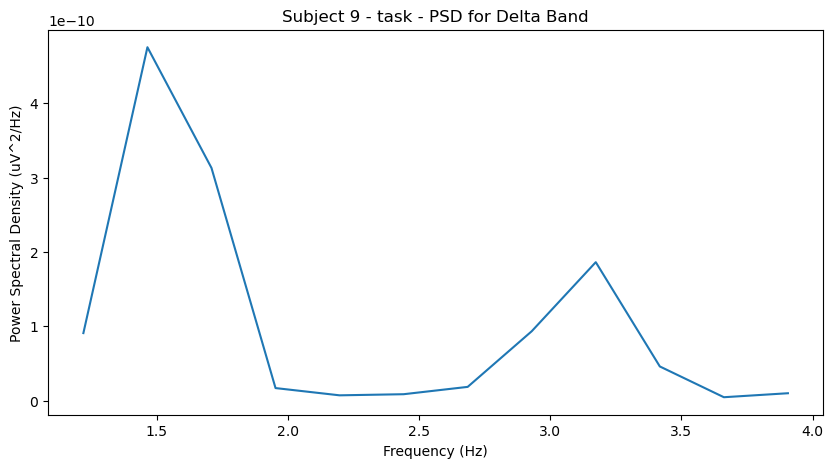

Effective window size : 4.096 (s)


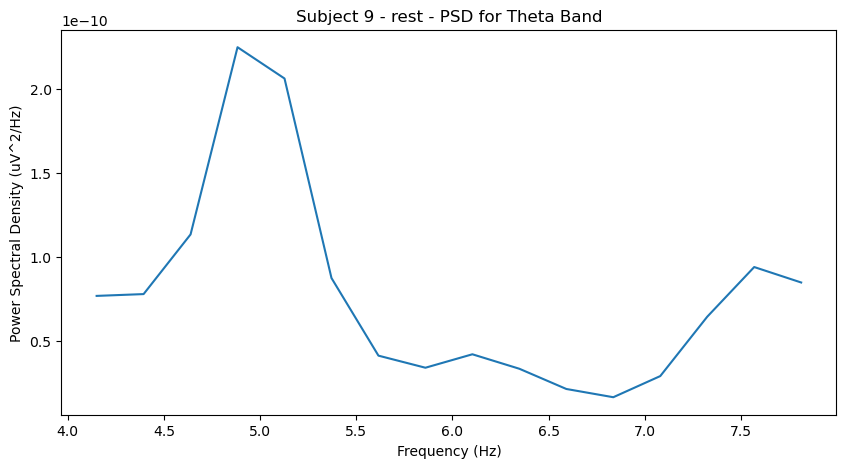

Effective window size : 4.096 (s)


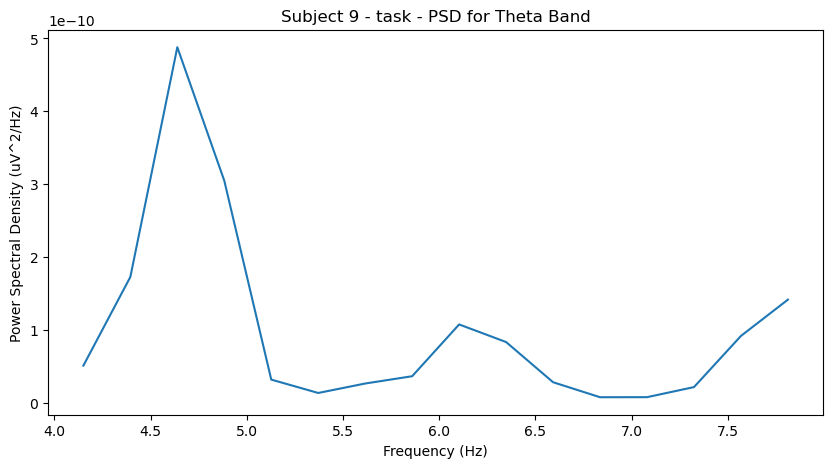

Effective window size : 4.096 (s)


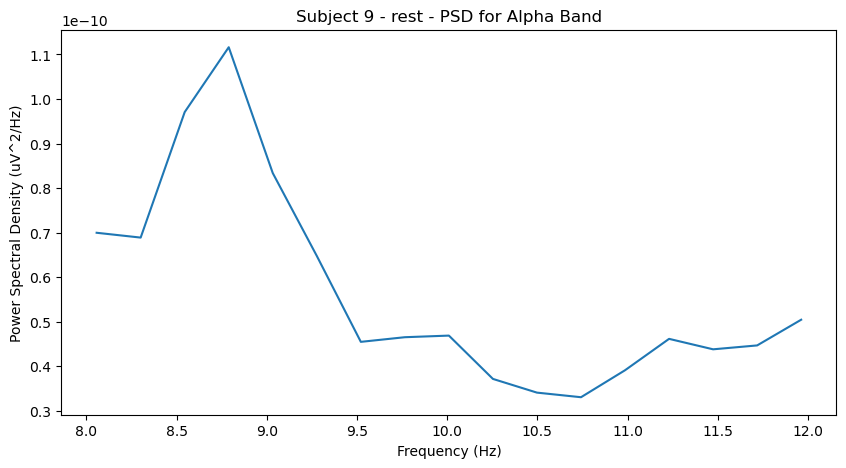

Effective window size : 4.096 (s)


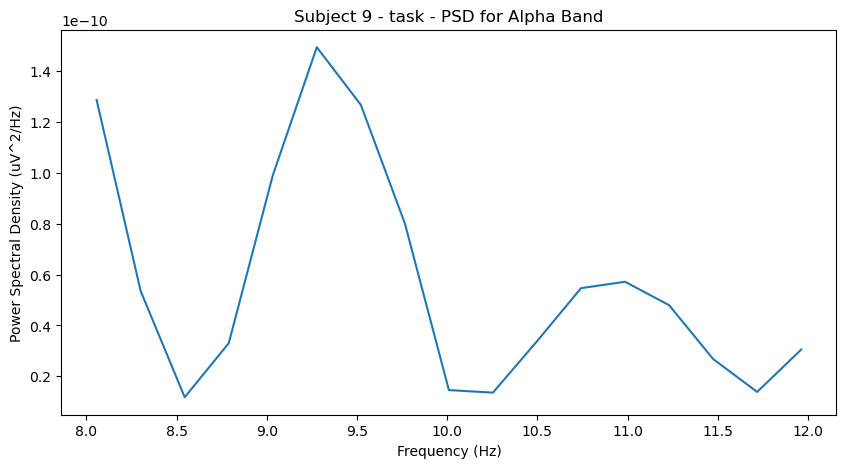

Effective window size : 4.096 (s)


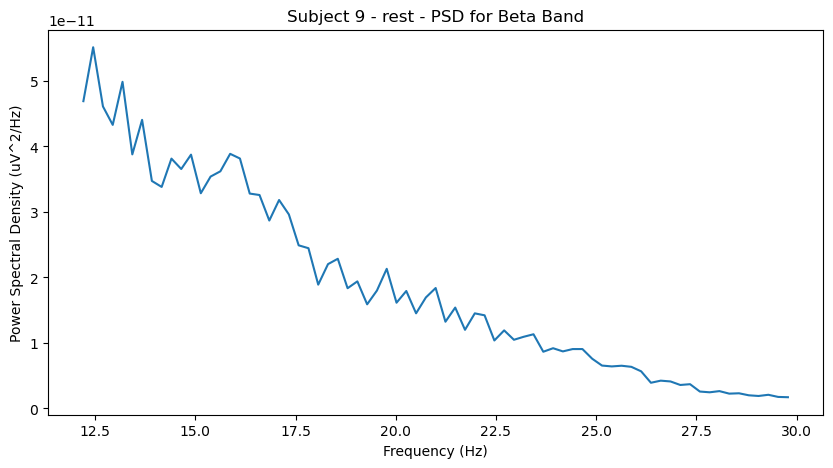

Effective window size : 4.096 (s)


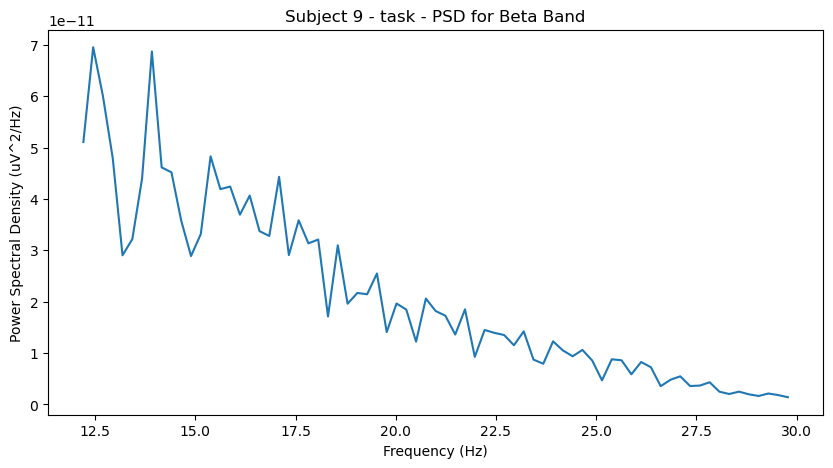

Effective window size : 4.096 (s)


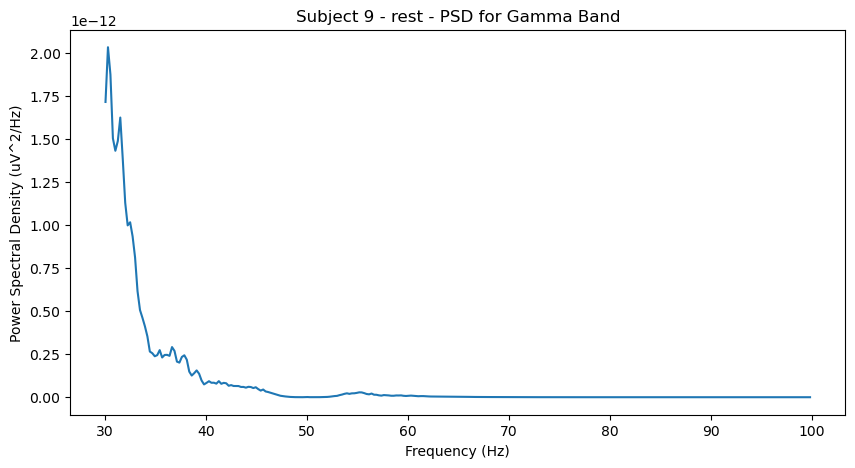

Effective window size : 4.096 (s)


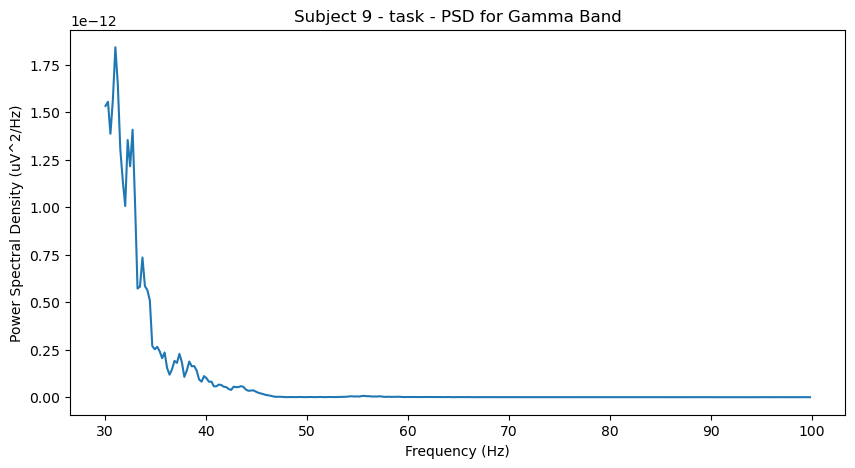

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 9/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject09_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject09_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


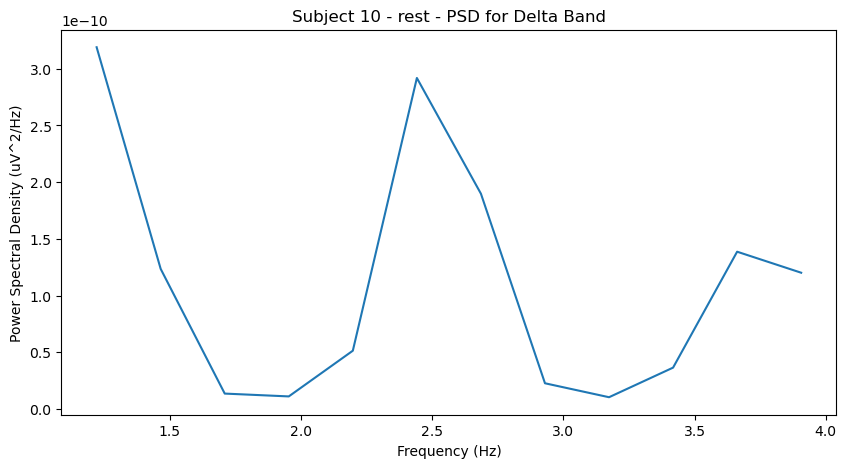

Effective window size : 4.096 (s)


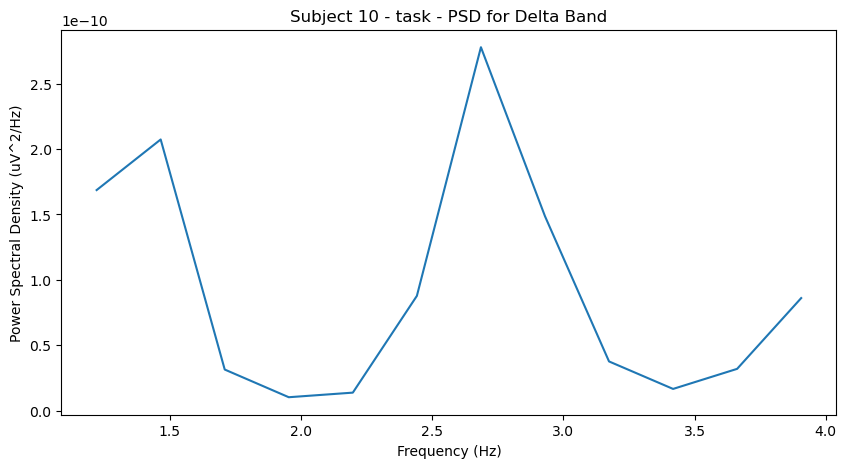

Effective window size : 4.096 (s)


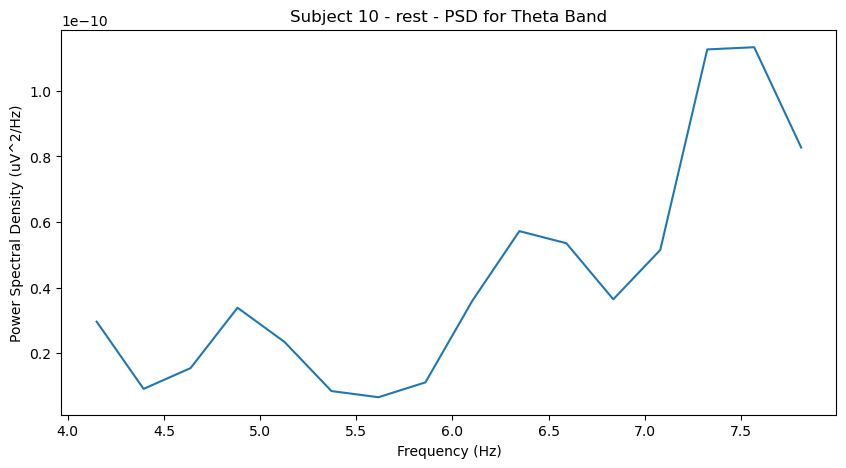

Effective window size : 4.096 (s)


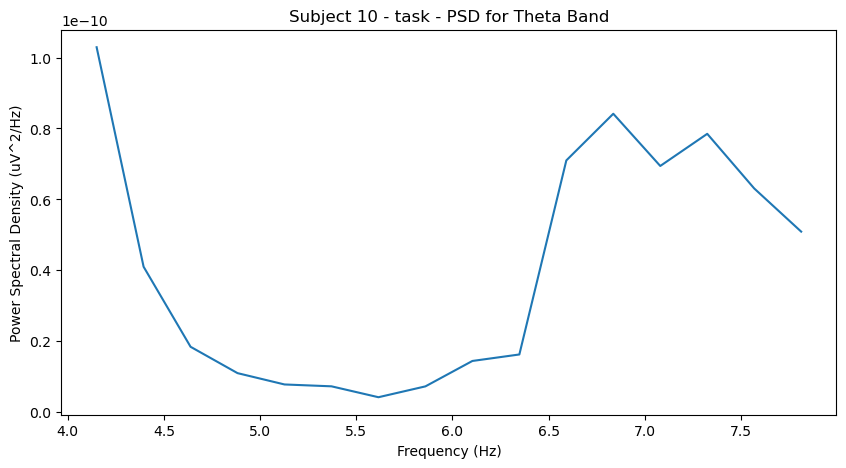

Effective window size : 4.096 (s)


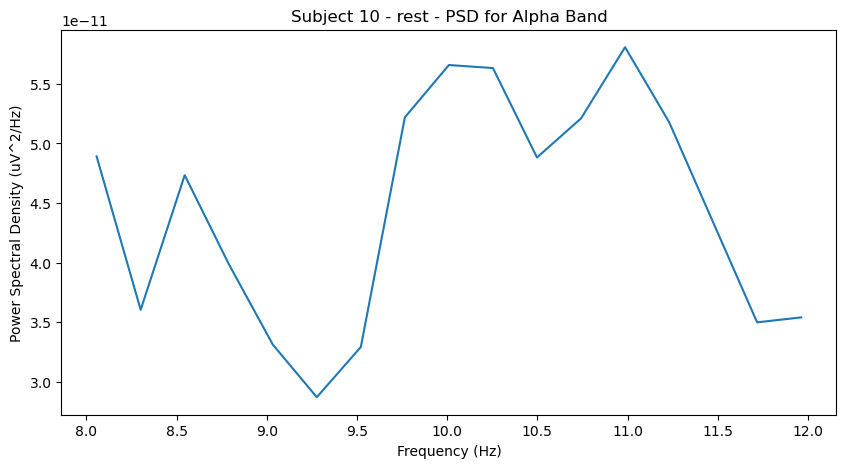

Effective window size : 4.096 (s)


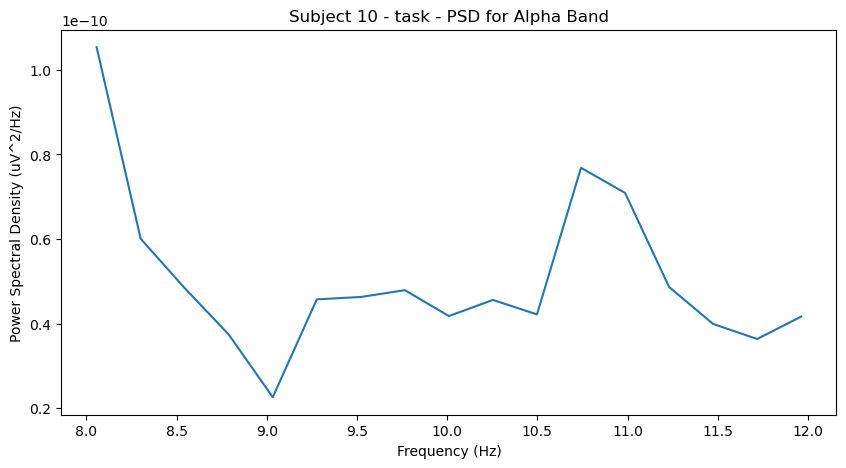

Effective window size : 4.096 (s)


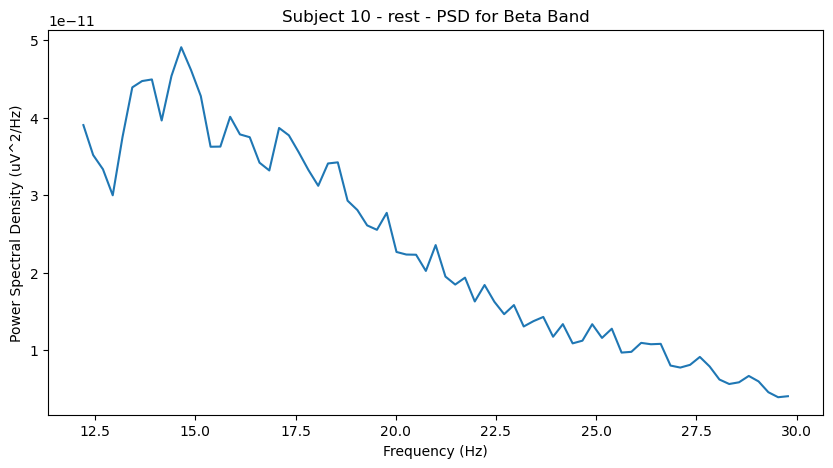

Effective window size : 4.096 (s)


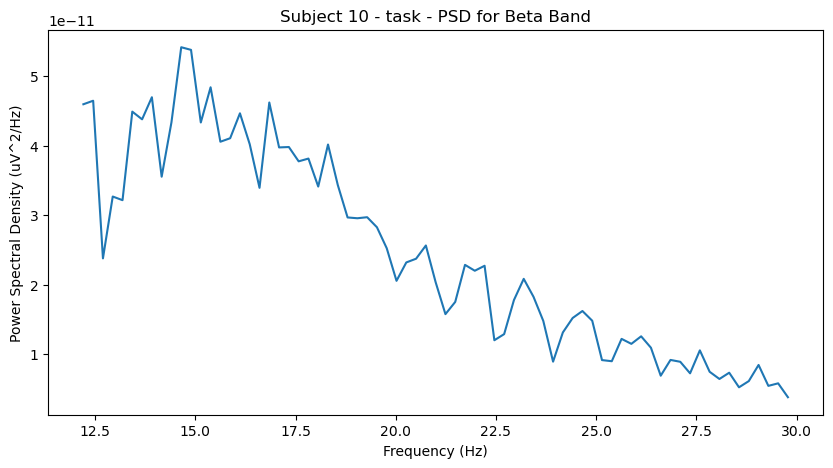

Effective window size : 4.096 (s)


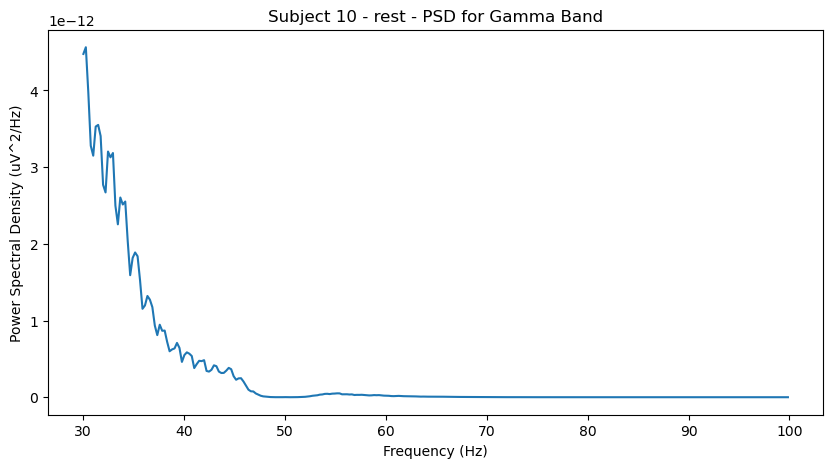

Effective window size : 4.096 (s)


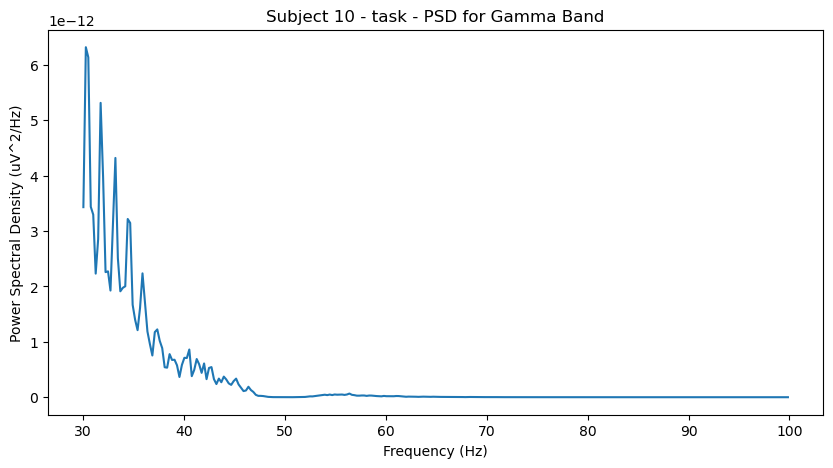

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 10/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject10_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 93999  =      0.000 ...   187.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject10_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


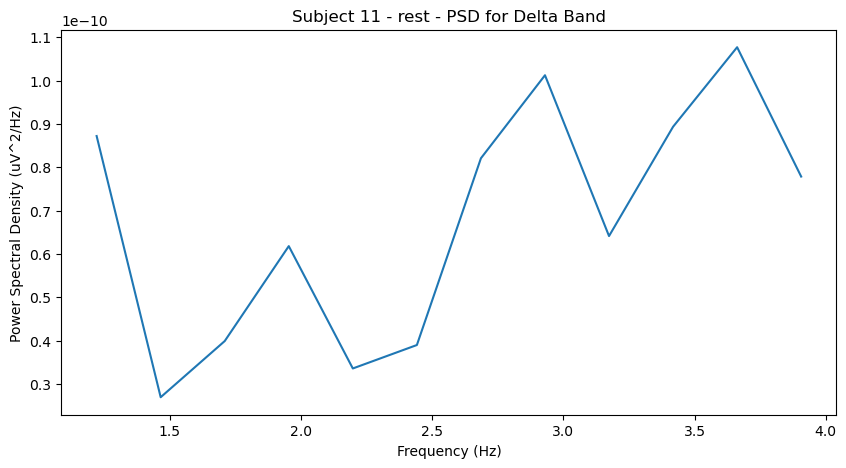

Effective window size : 4.096 (s)


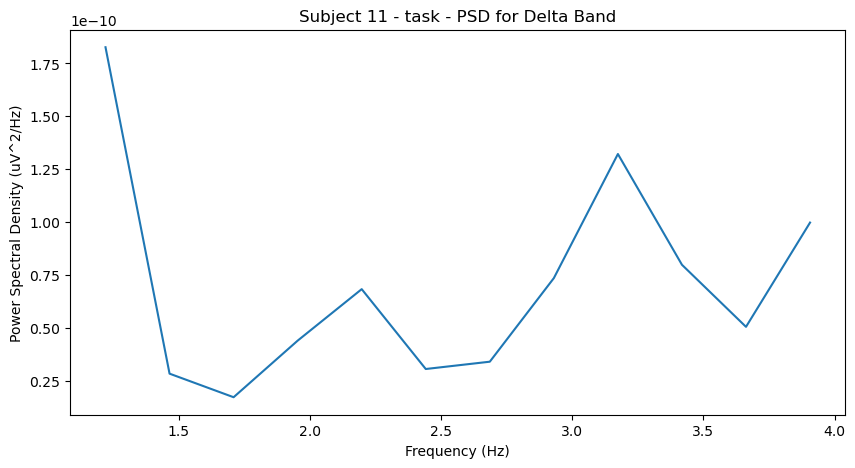

Effective window size : 4.096 (s)


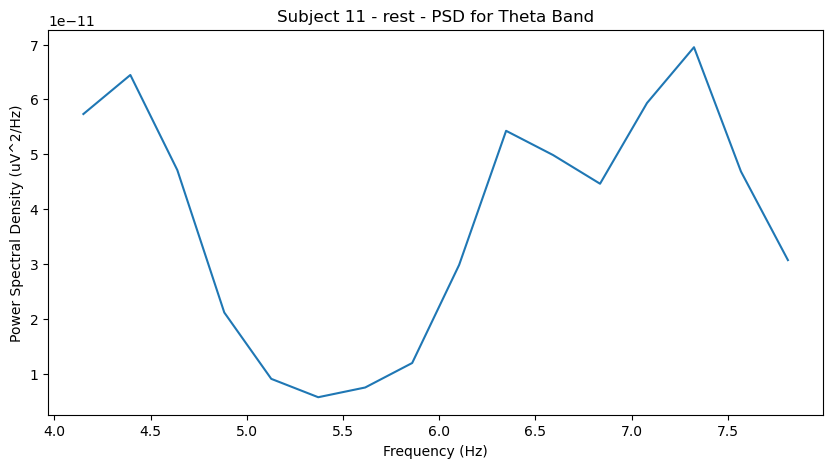

Effective window size : 4.096 (s)


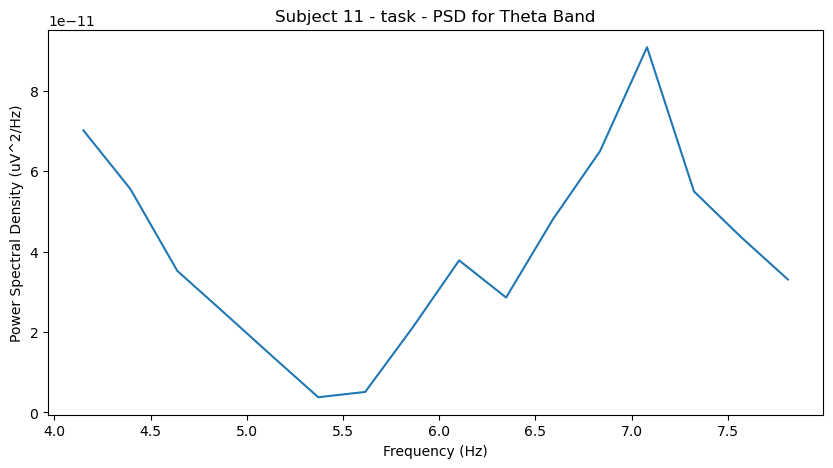

Effective window size : 4.096 (s)


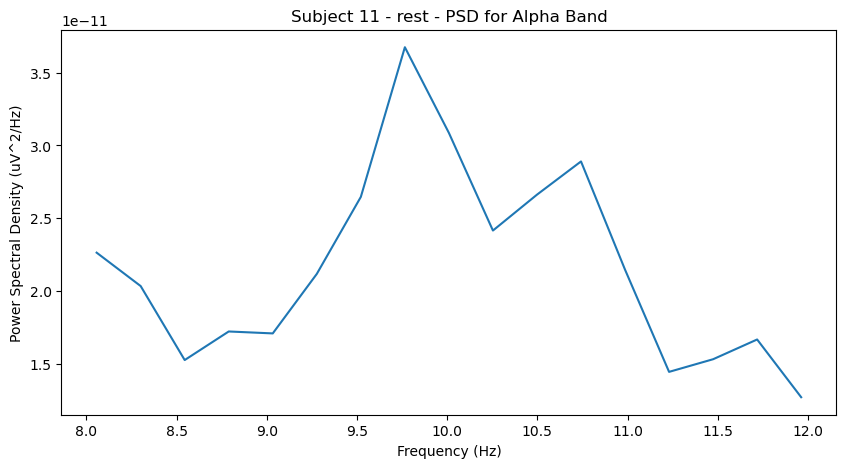

Effective window size : 4.096 (s)


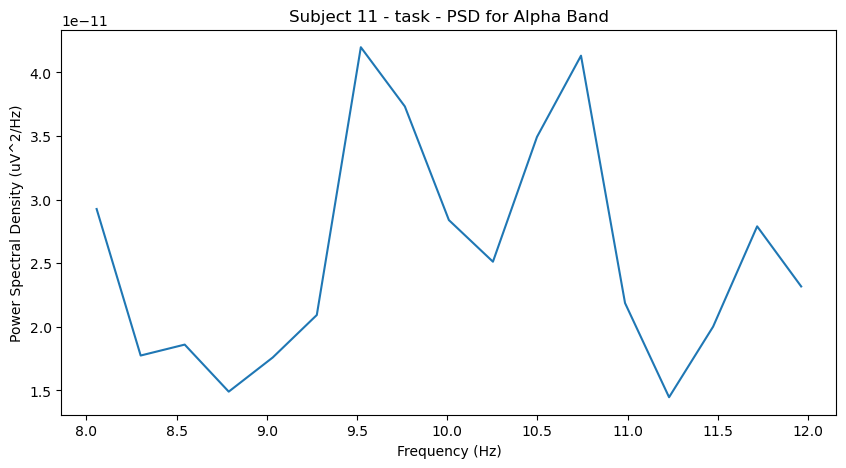

Effective window size : 4.096 (s)


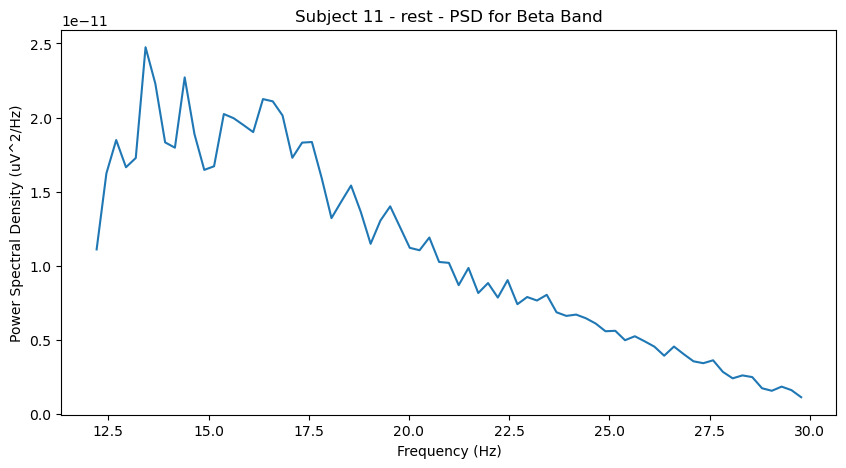

Effective window size : 4.096 (s)


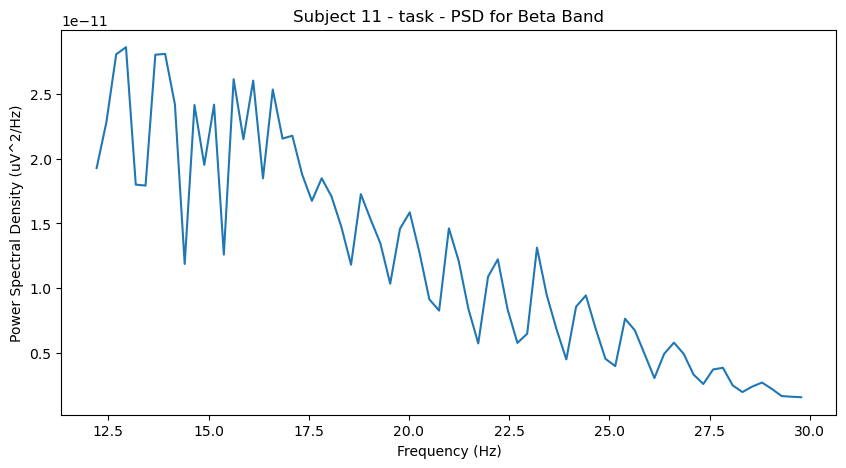

Effective window size : 4.096 (s)


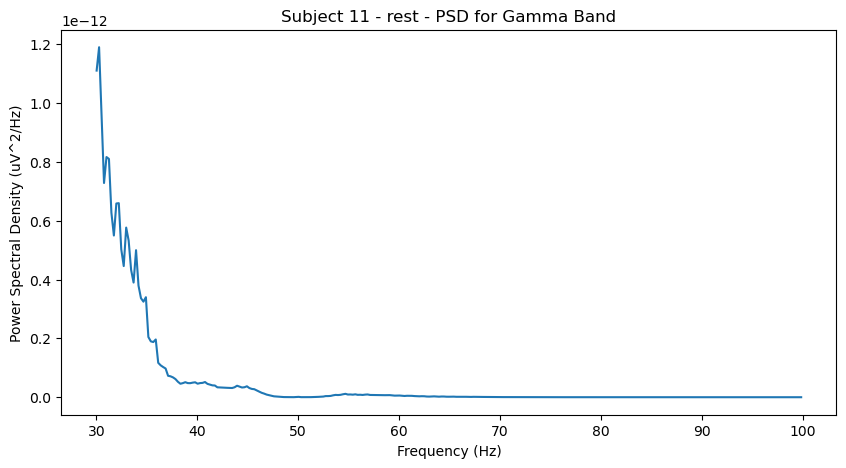

Effective window size : 4.096 (s)


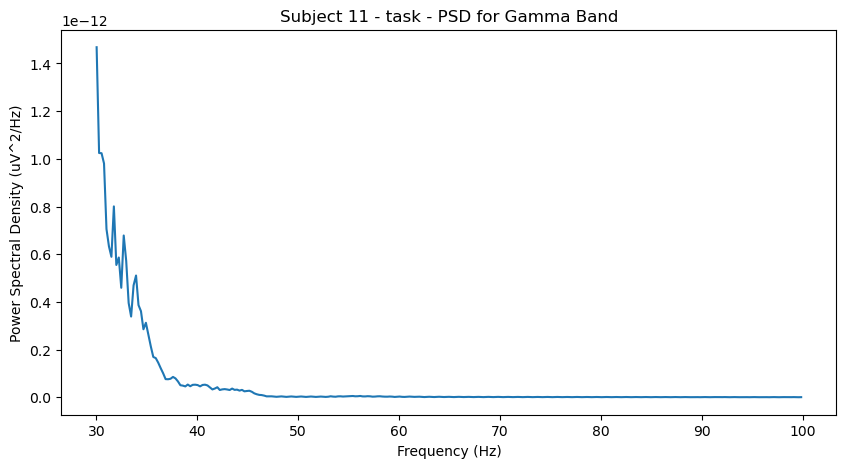

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 11/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject11_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject11_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


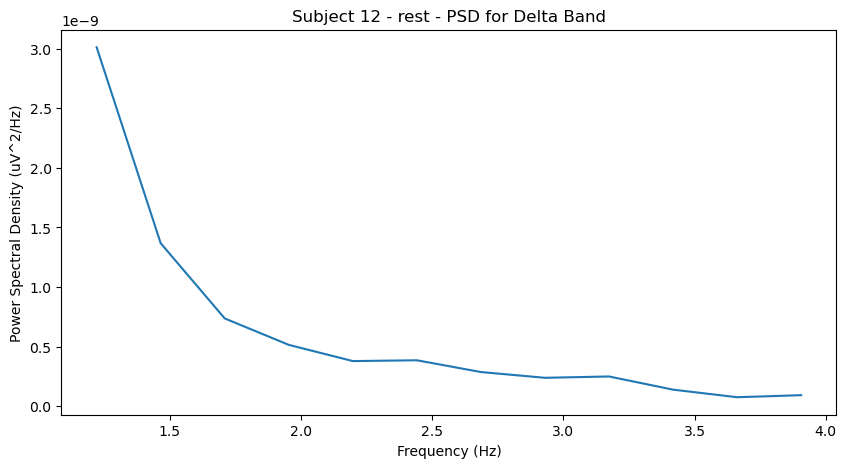

Effective window size : 4.096 (s)


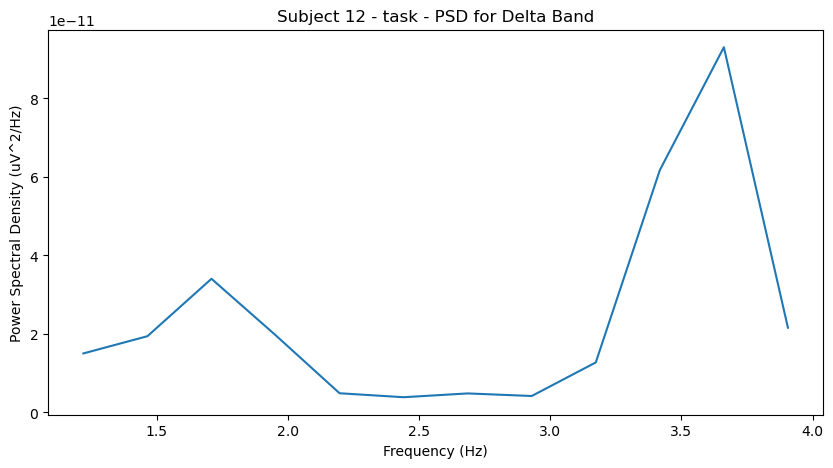

Effective window size : 4.096 (s)


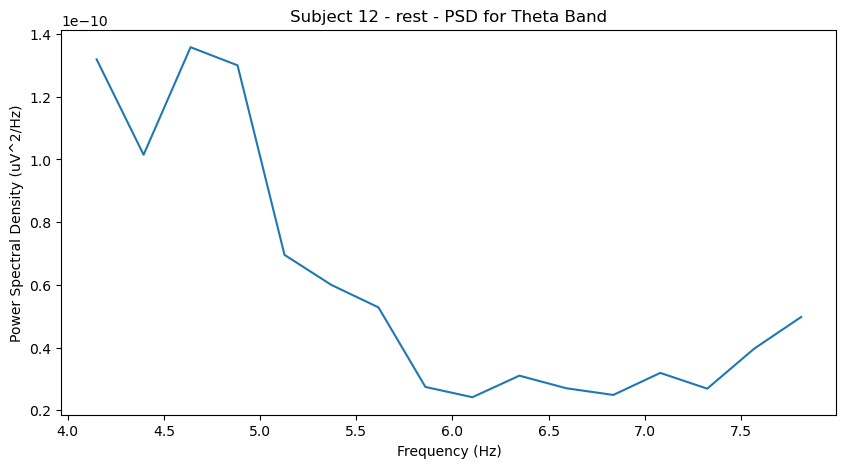

Effective window size : 4.096 (s)


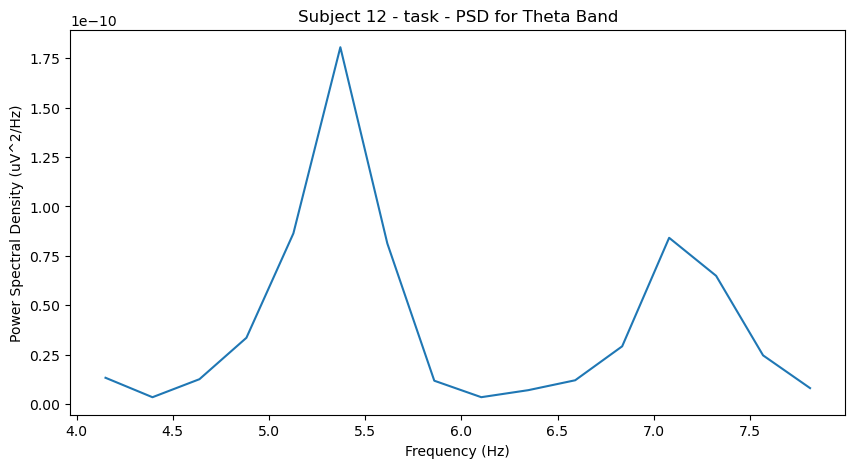

Effective window size : 4.096 (s)


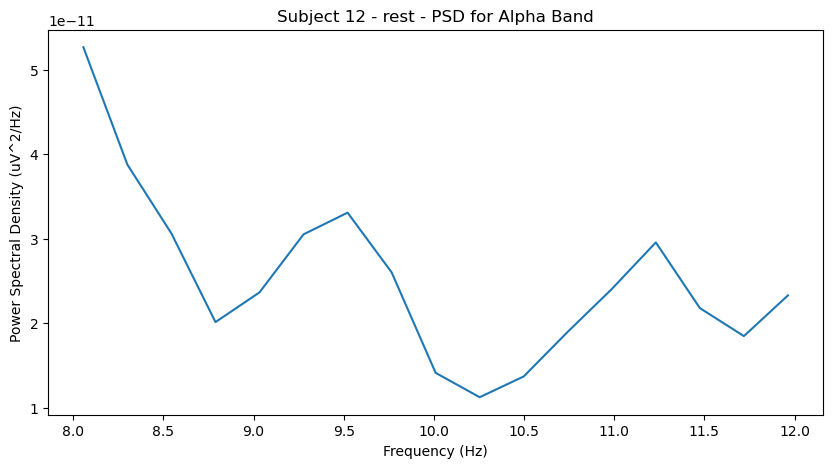

Effective window size : 4.096 (s)


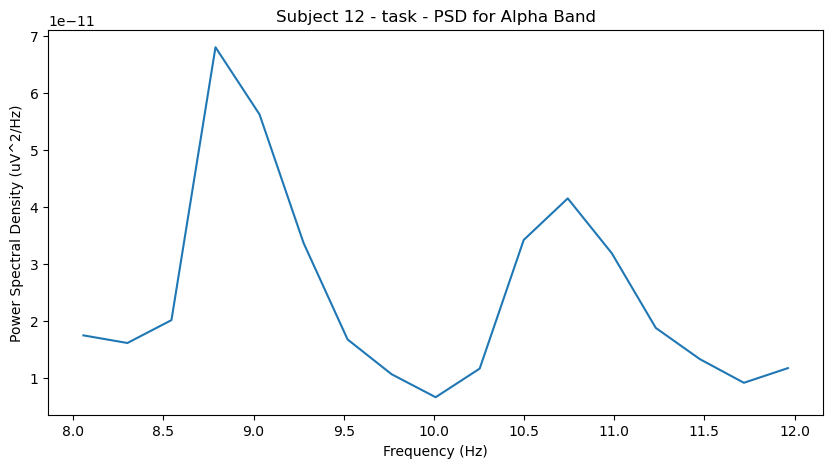

Effective window size : 4.096 (s)


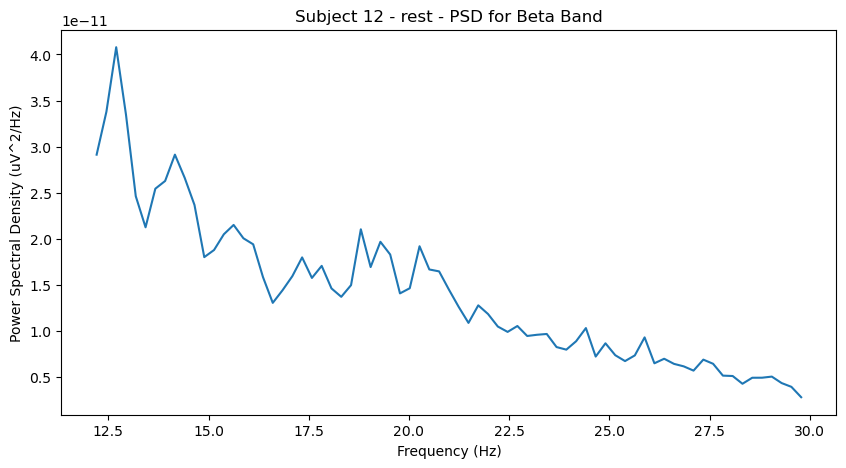

Effective window size : 4.096 (s)


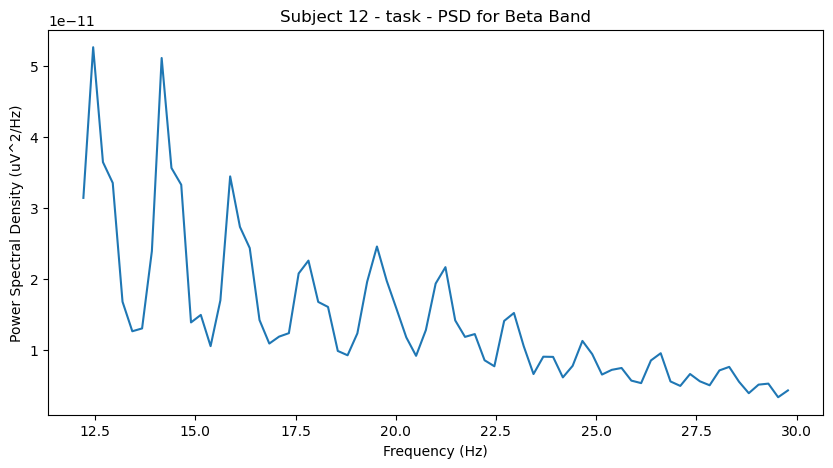

Effective window size : 4.096 (s)


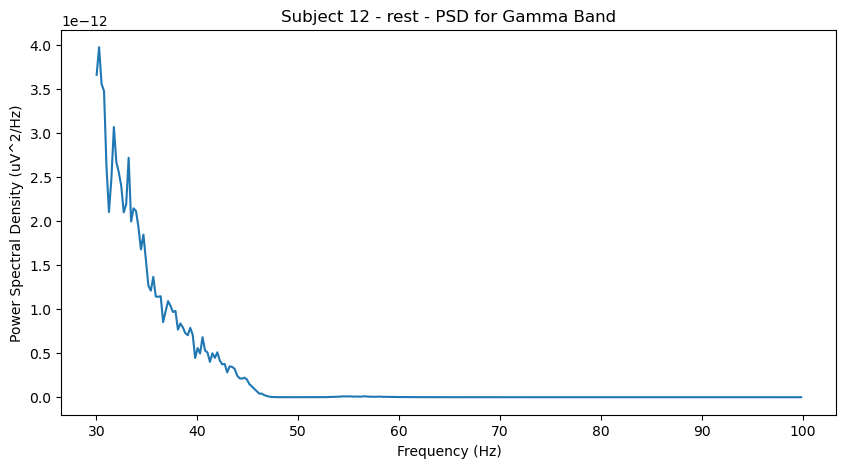

Effective window size : 4.096 (s)


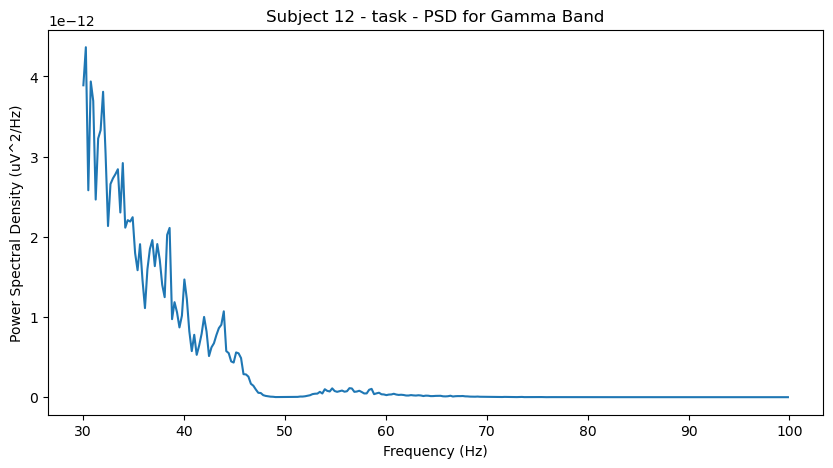

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 12/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject12_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject12_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


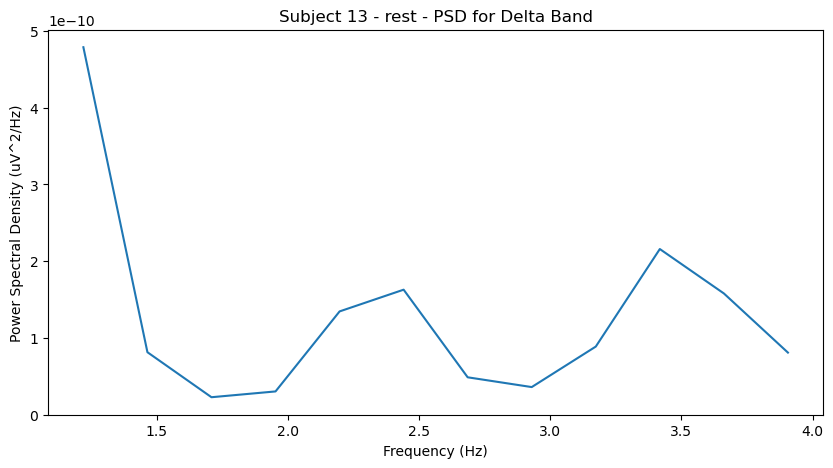

Effective window size : 4.096 (s)


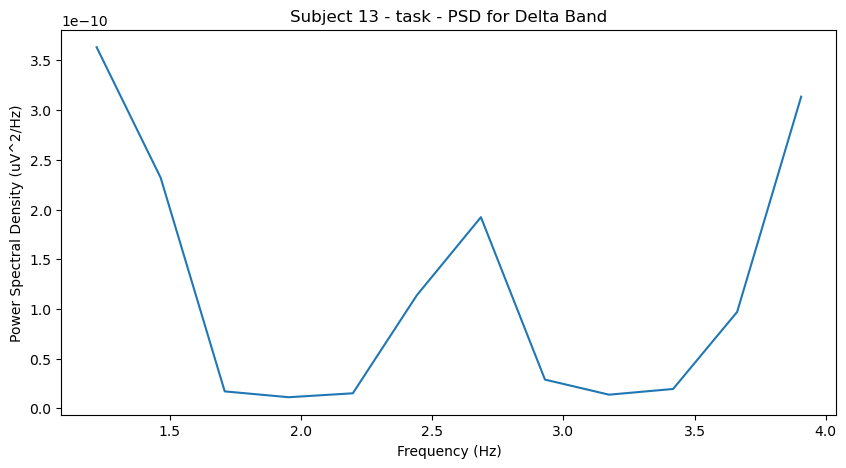

Effective window size : 4.096 (s)


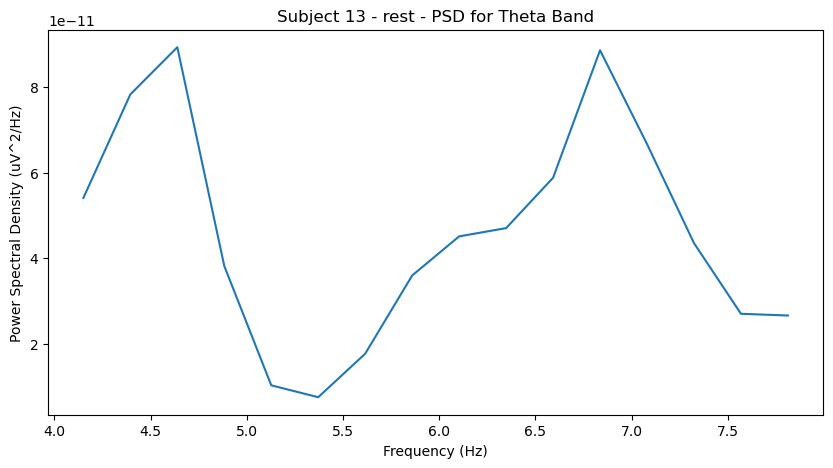

Effective window size : 4.096 (s)


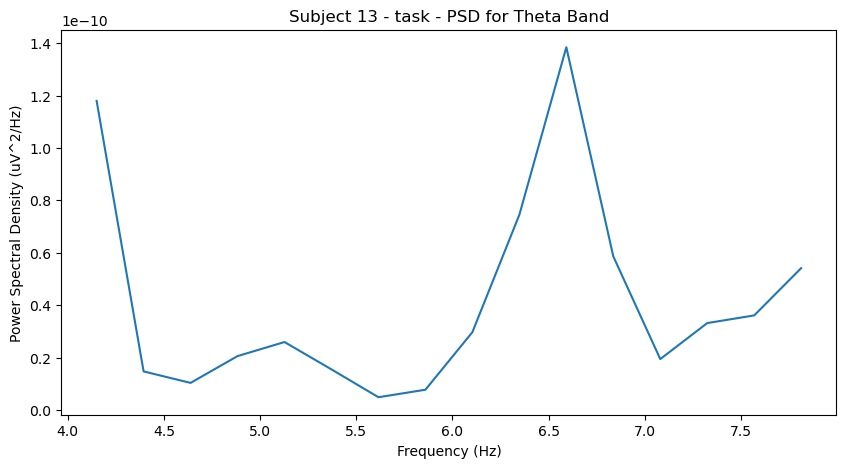

Effective window size : 4.096 (s)


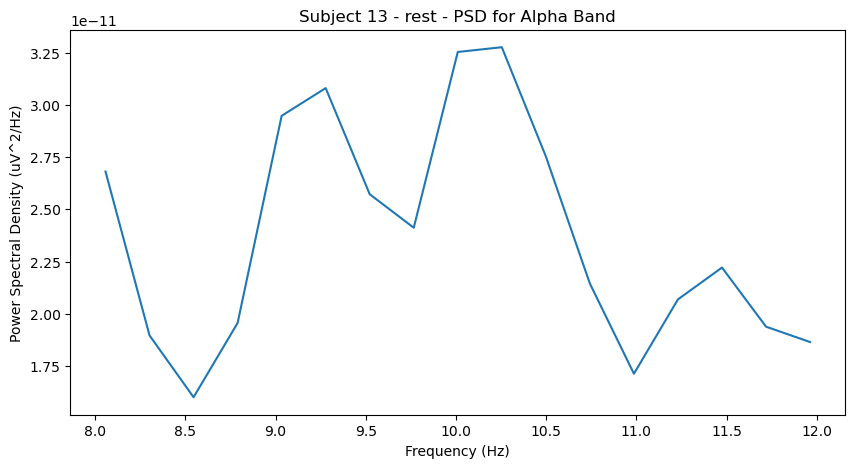

Effective window size : 4.096 (s)


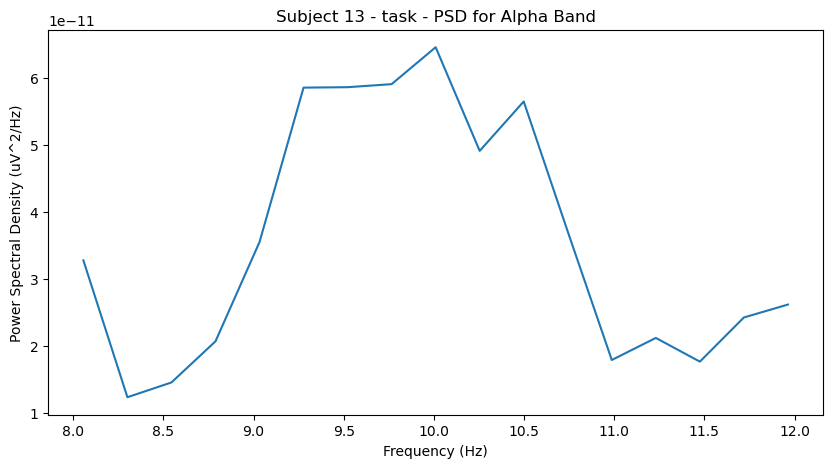

Effective window size : 4.096 (s)


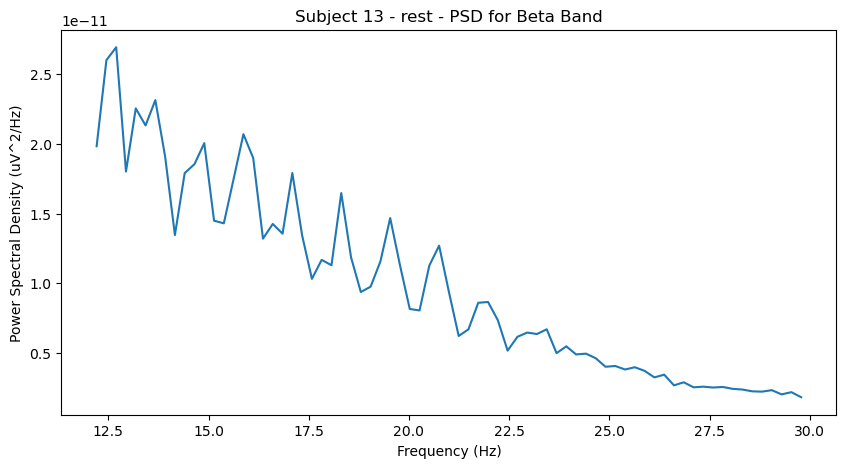

Effective window size : 4.096 (s)


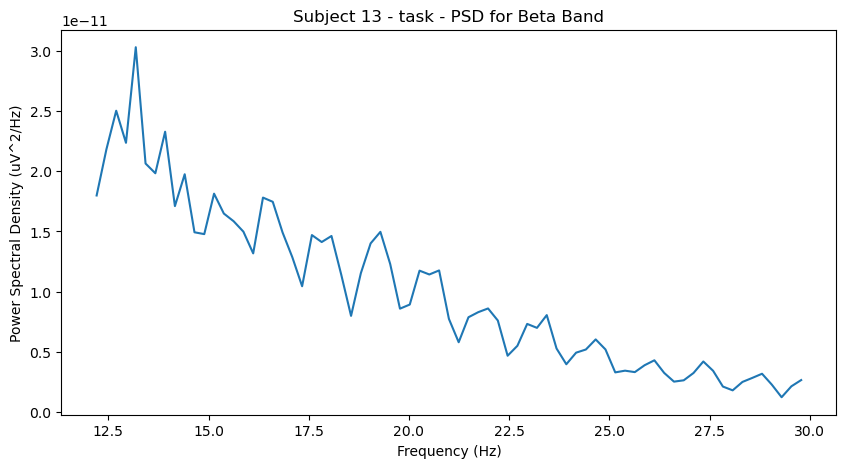

Effective window size : 4.096 (s)


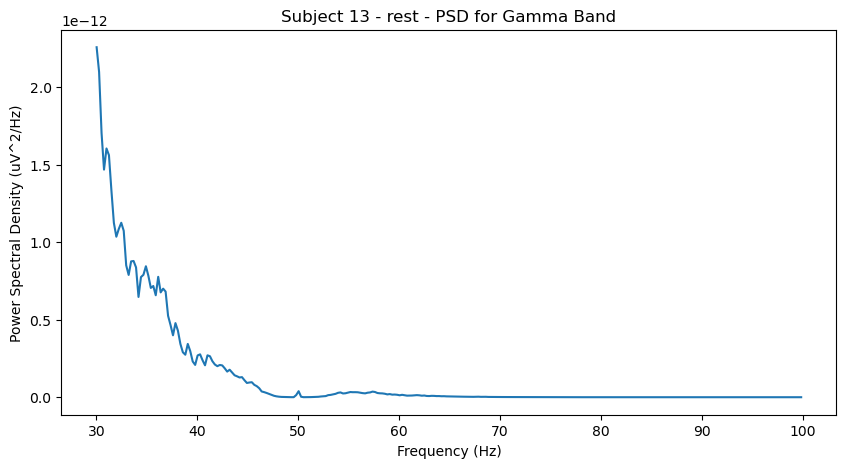

Effective window size : 4.096 (s)


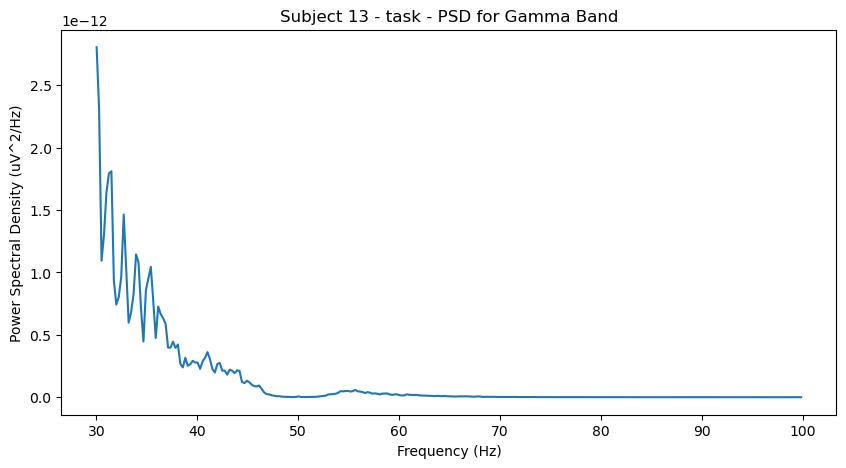

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 13/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject13_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject13_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


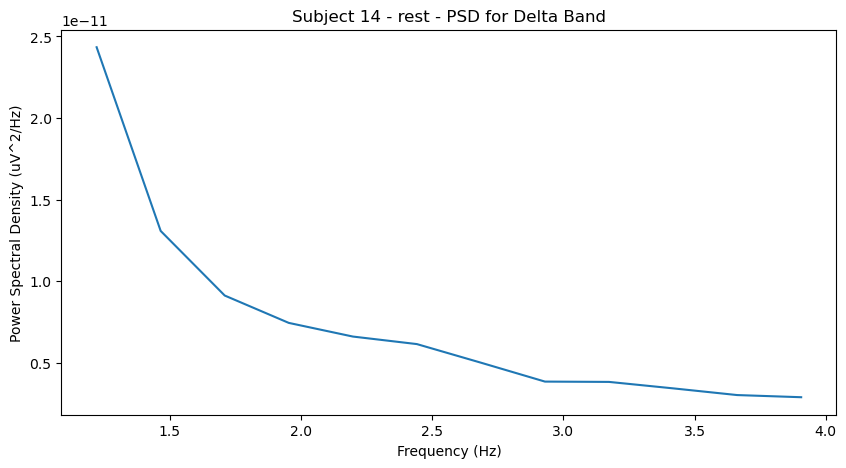

Effective window size : 4.096 (s)


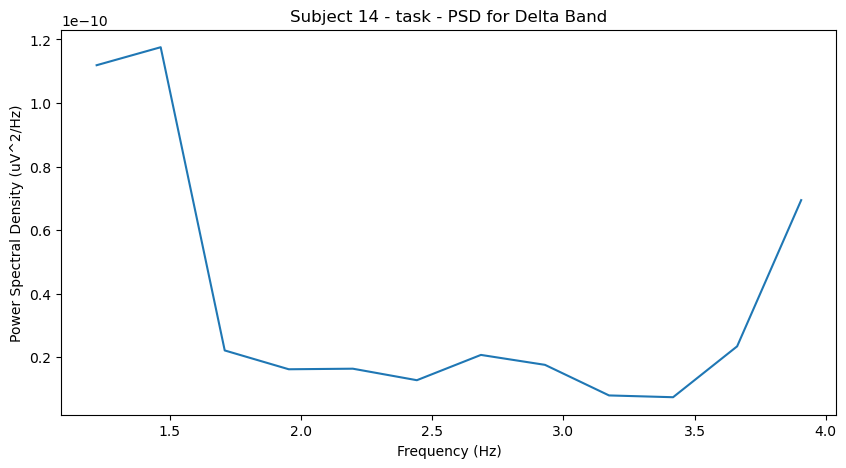

Effective window size : 4.096 (s)


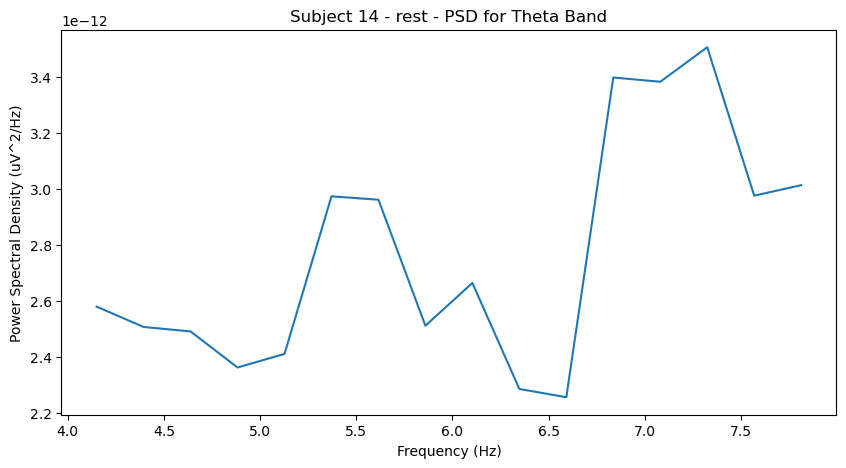

Effective window size : 4.096 (s)


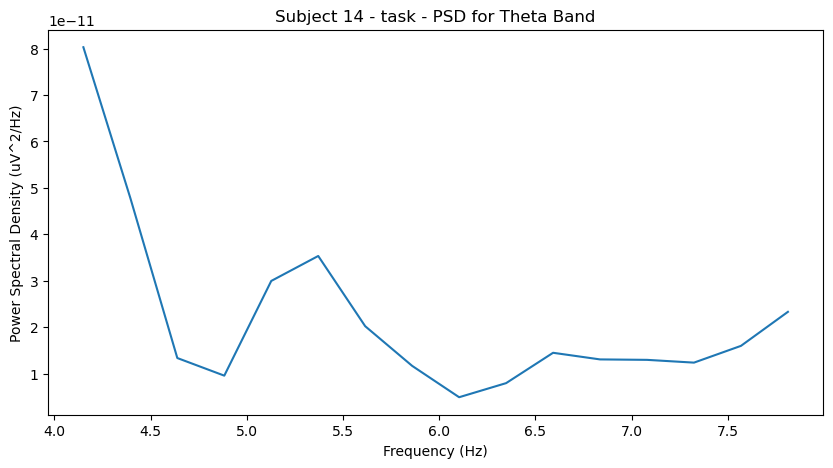

Effective window size : 4.096 (s)


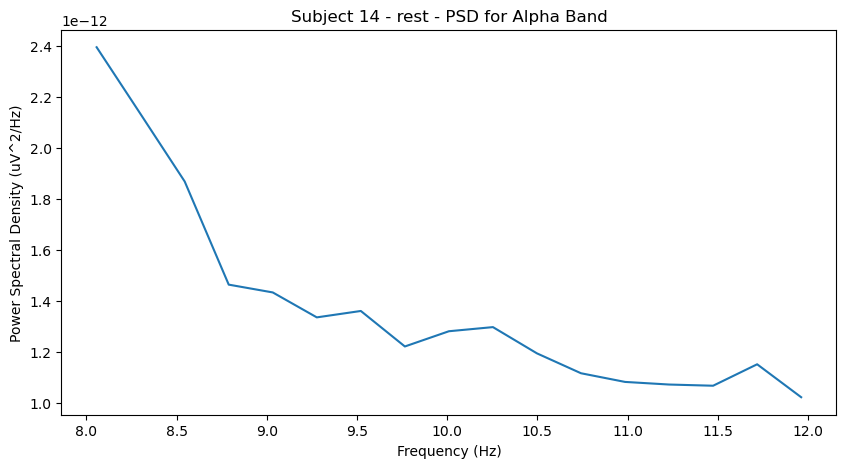

Effective window size : 4.096 (s)


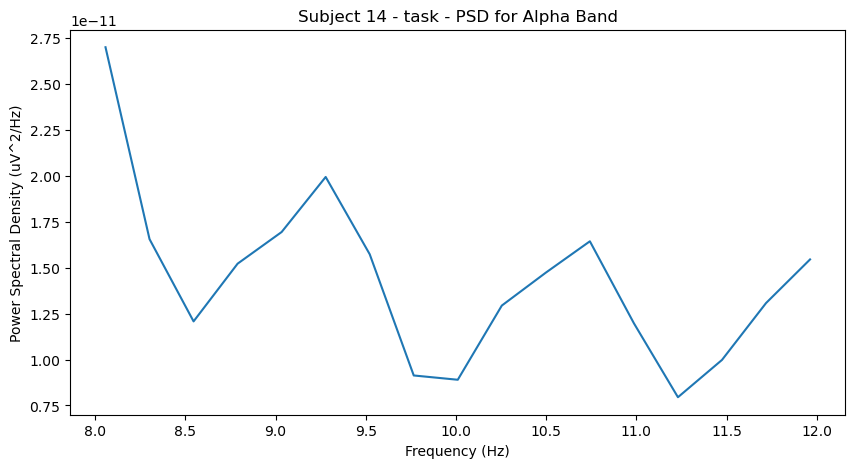

Effective window size : 4.096 (s)


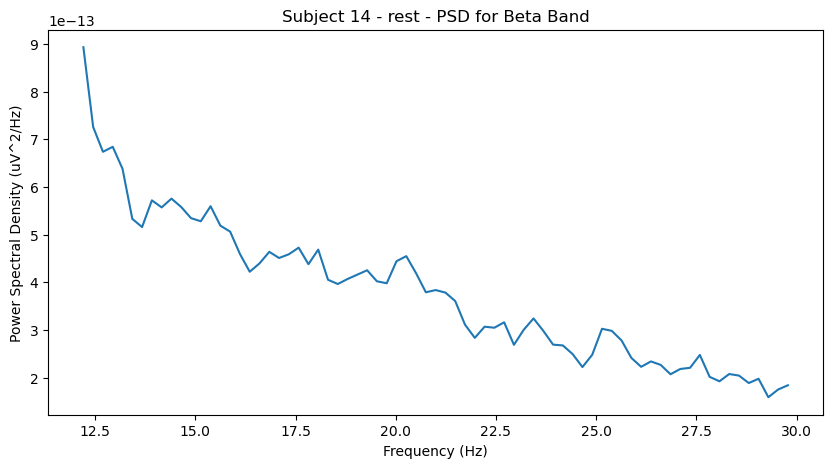

Effective window size : 4.096 (s)


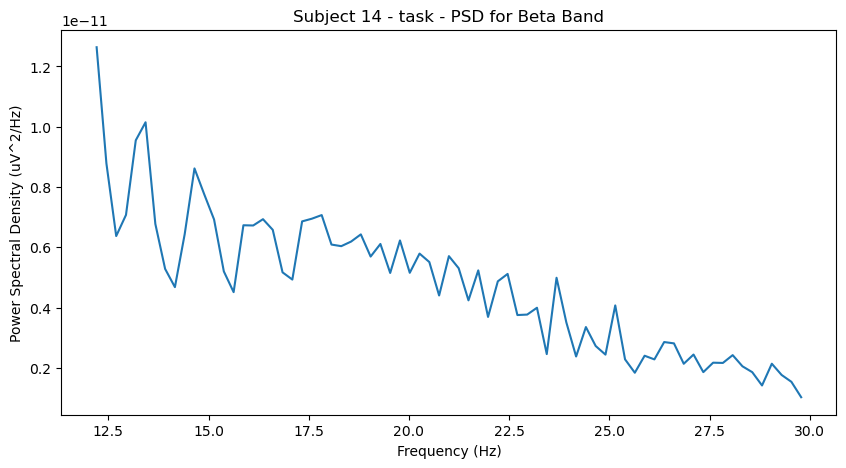

Effective window size : 4.096 (s)


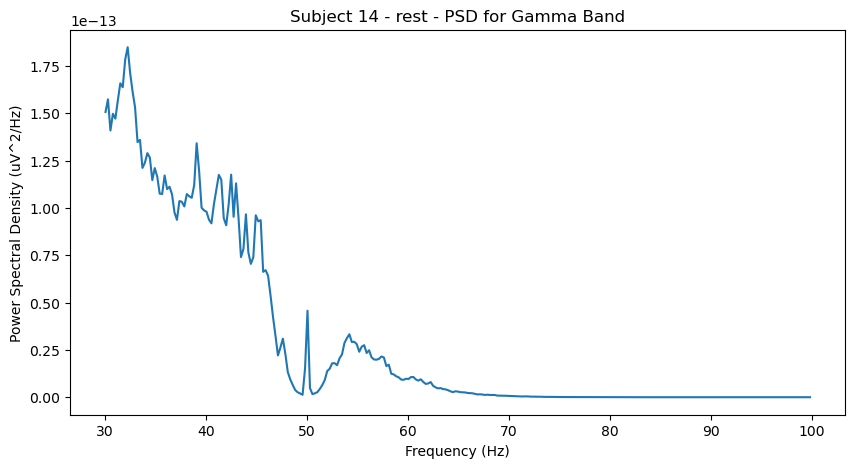

Effective window size : 4.096 (s)


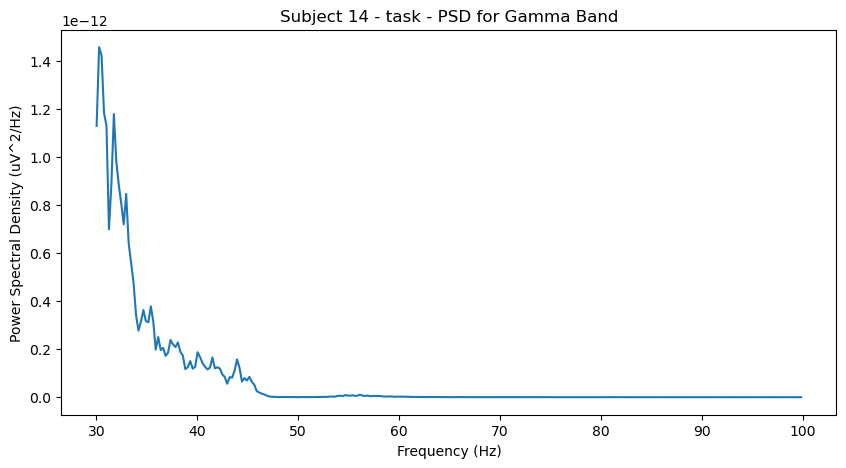

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 14/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject14_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject14_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


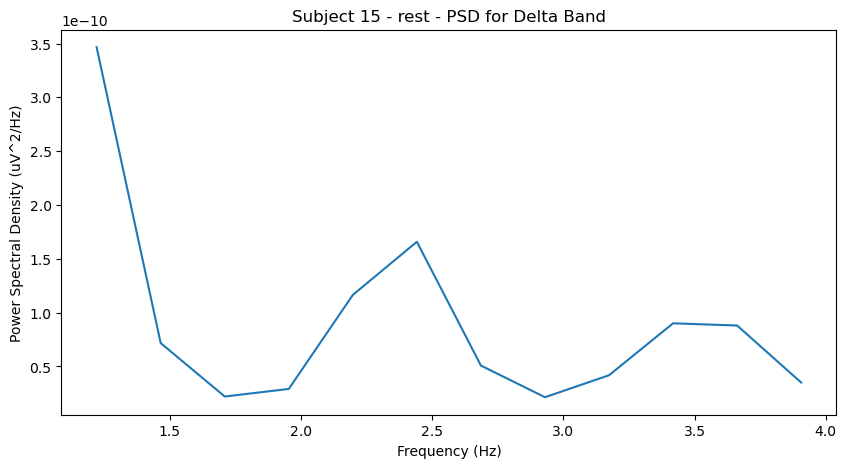

Effective window size : 4.096 (s)


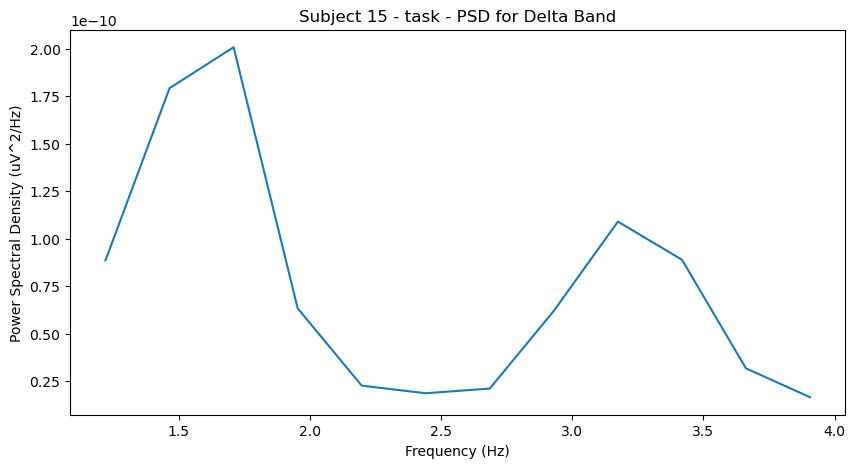

Effective window size : 4.096 (s)


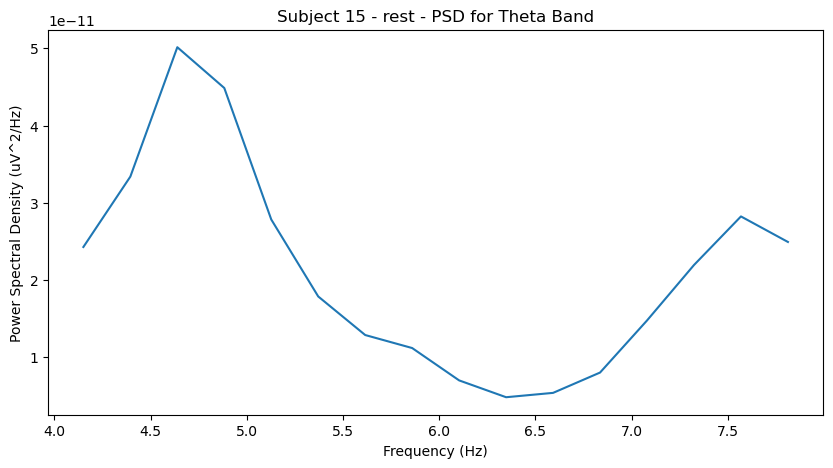

Effective window size : 4.096 (s)


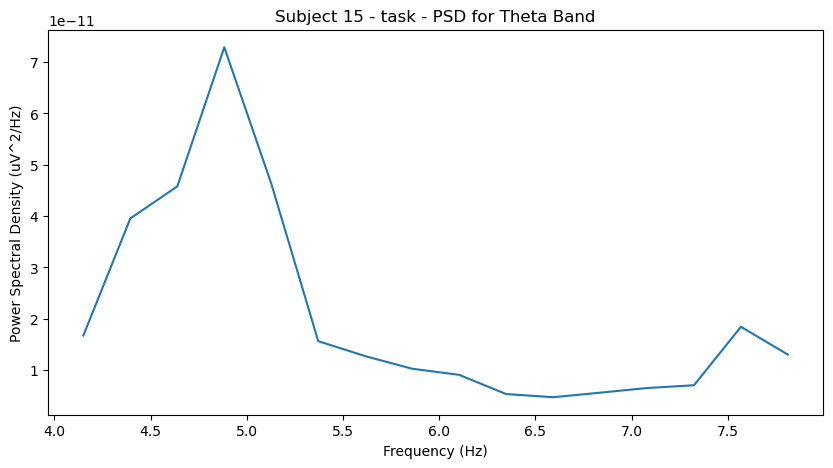

Effective window size : 4.096 (s)


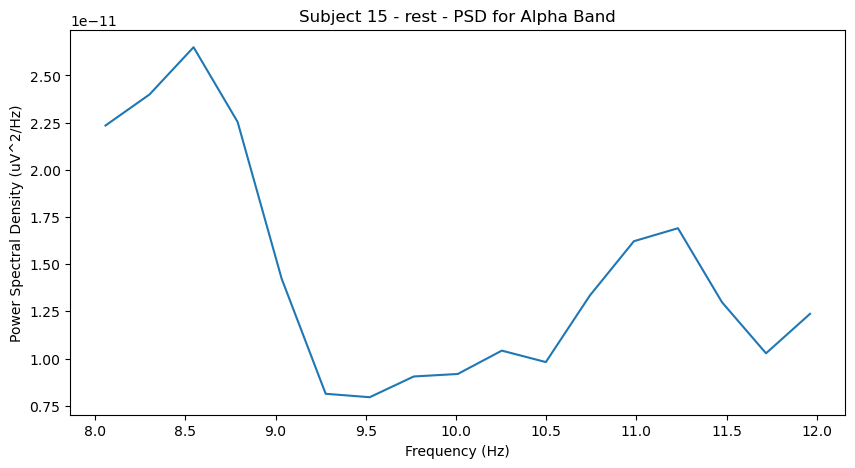

Effective window size : 4.096 (s)


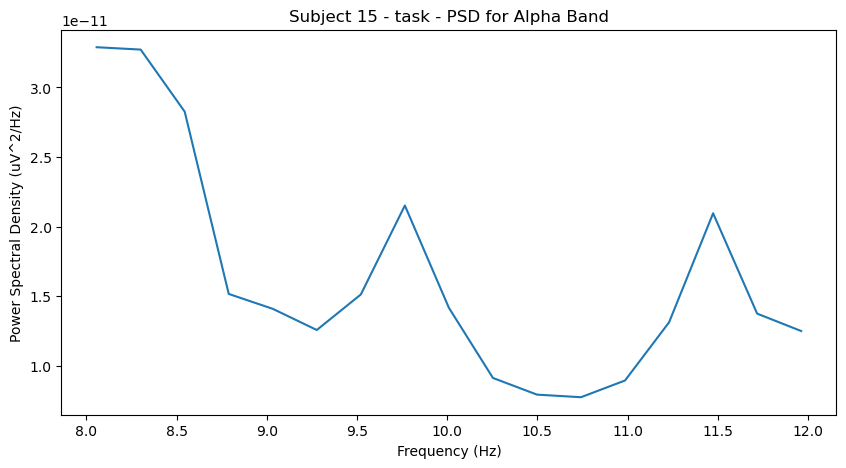

Effective window size : 4.096 (s)


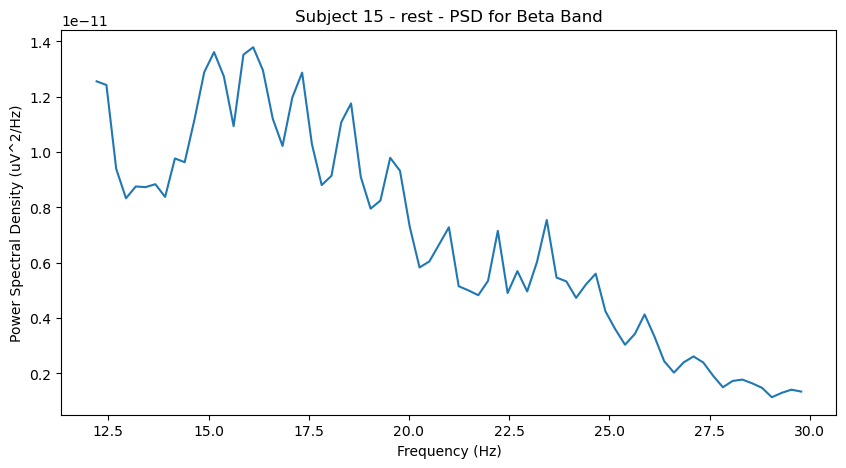

Effective window size : 4.096 (s)


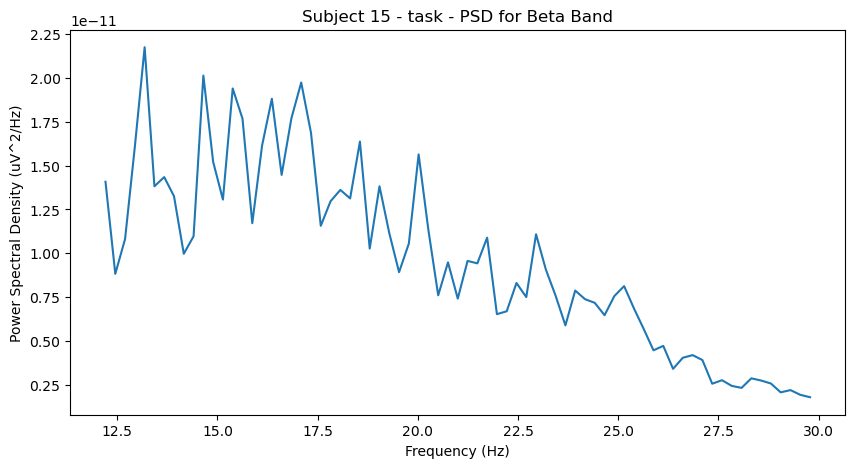

Effective window size : 4.096 (s)


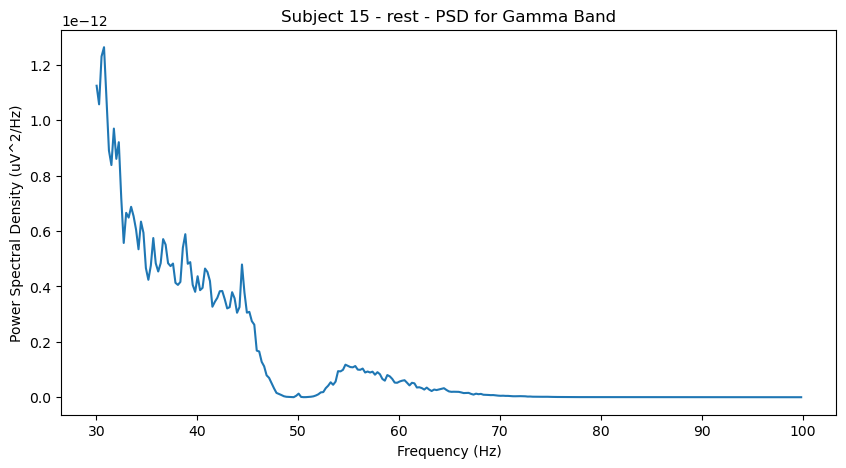

Effective window size : 4.096 (s)


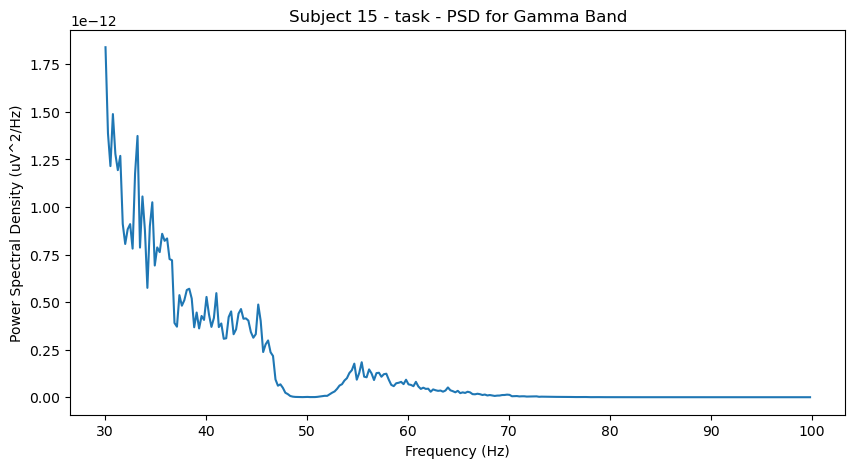

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 15/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject15_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject15_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


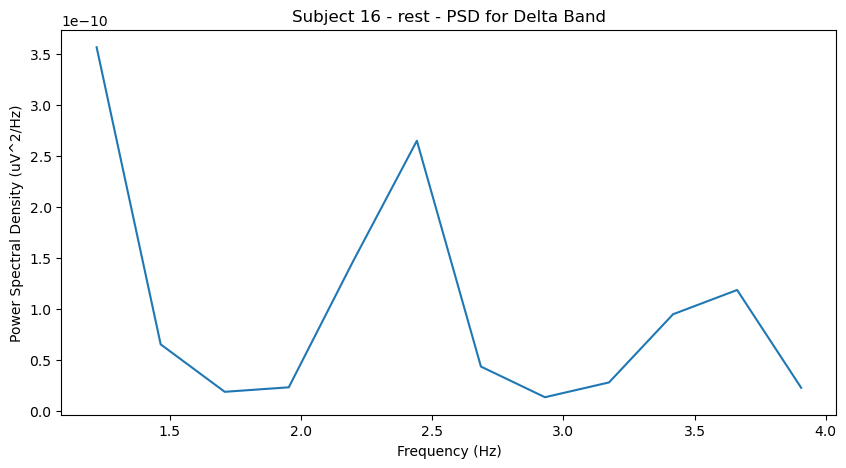

Effective window size : 4.096 (s)


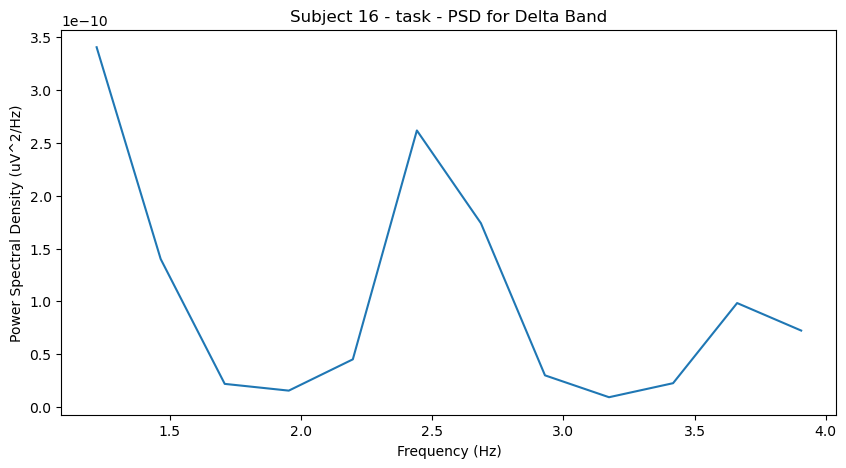

Effective window size : 4.096 (s)


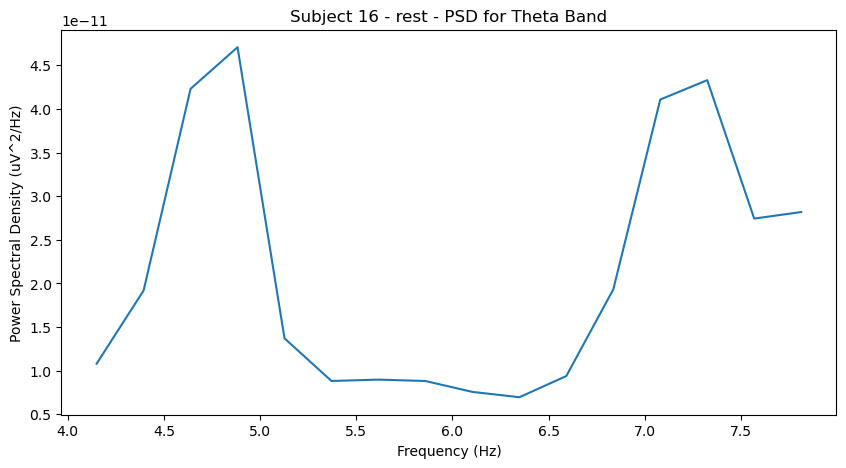

Effective window size : 4.096 (s)


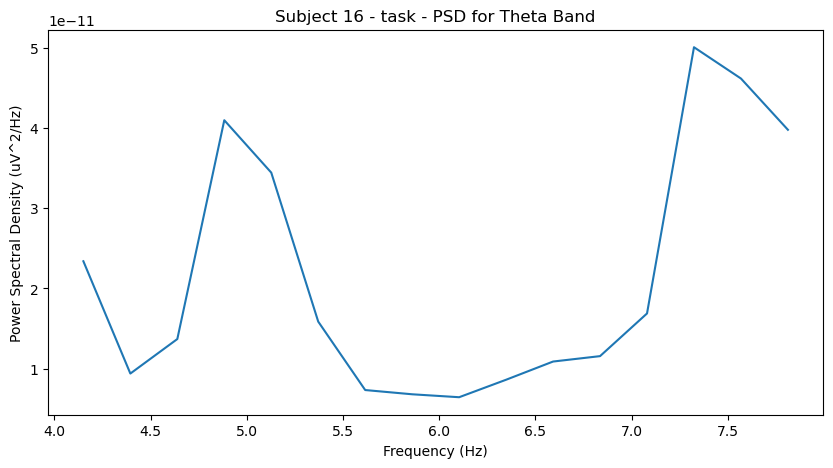

Effective window size : 4.096 (s)


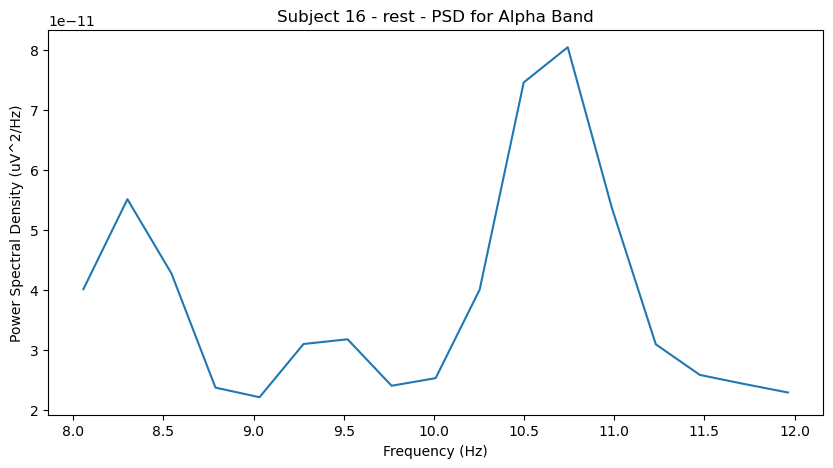

Effective window size : 4.096 (s)


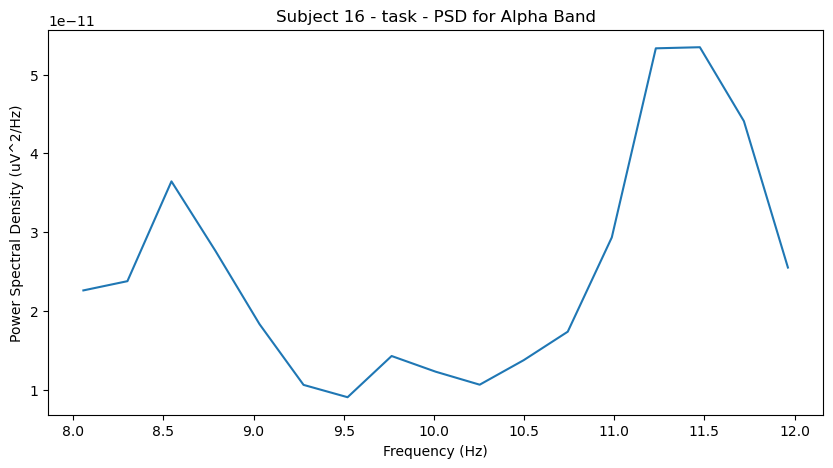

Effective window size : 4.096 (s)


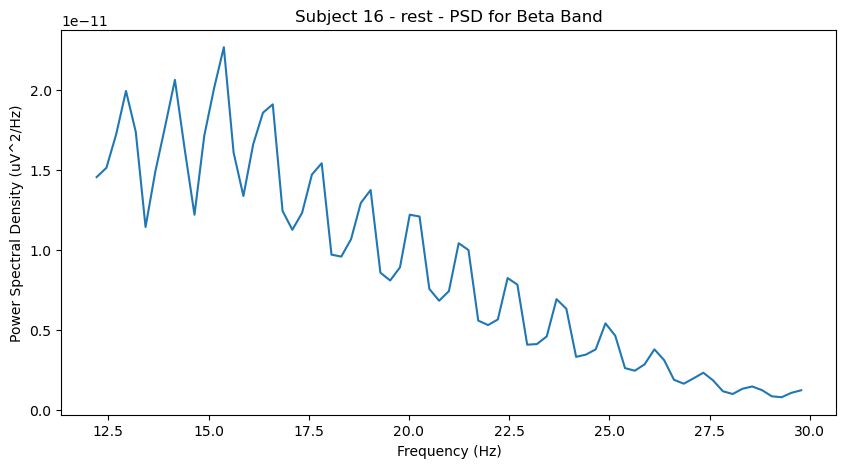

Effective window size : 4.096 (s)


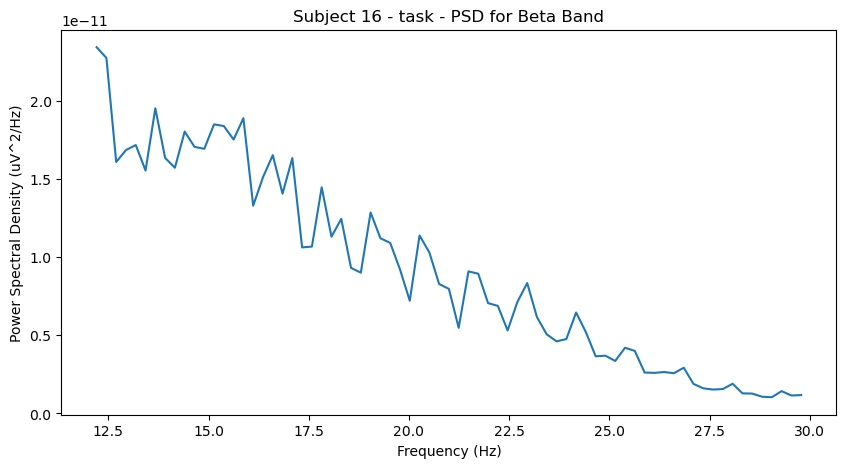

Effective window size : 4.096 (s)


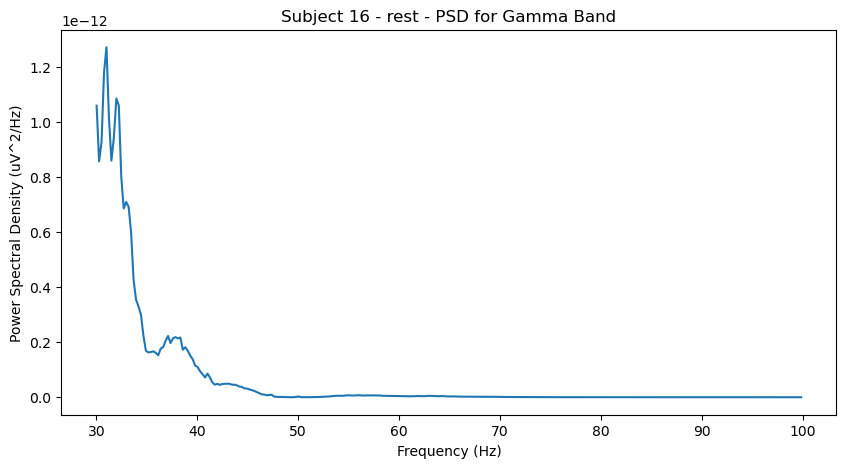

Effective window size : 4.096 (s)


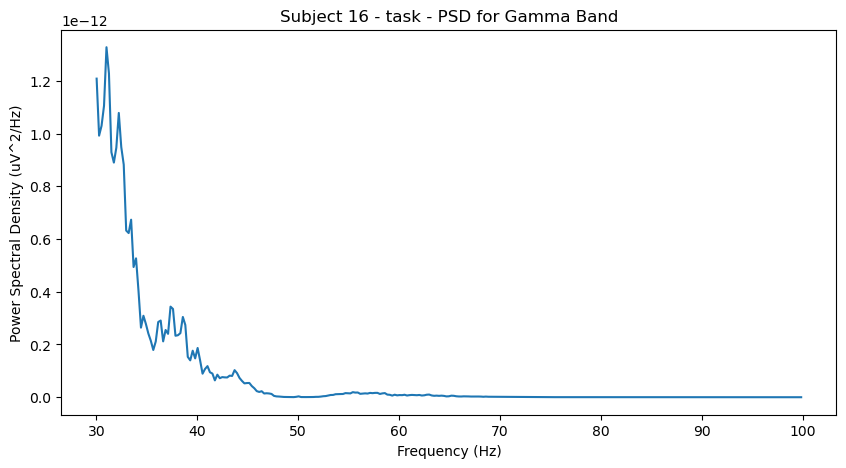

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 16/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject16_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject16_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


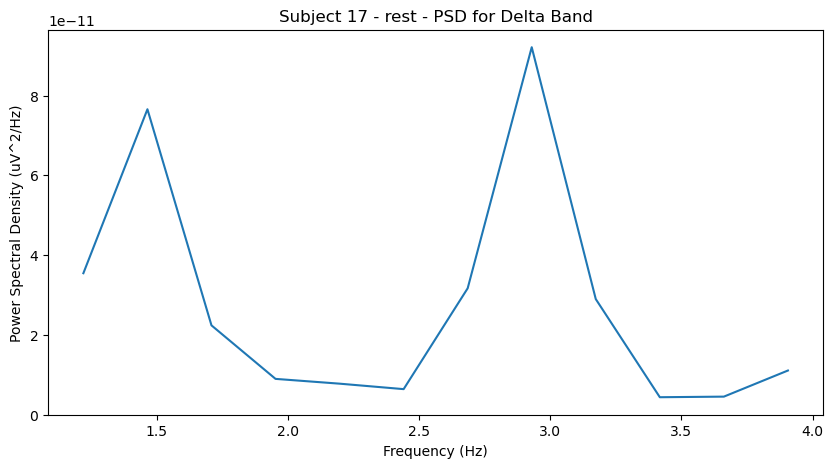

Effective window size : 4.096 (s)


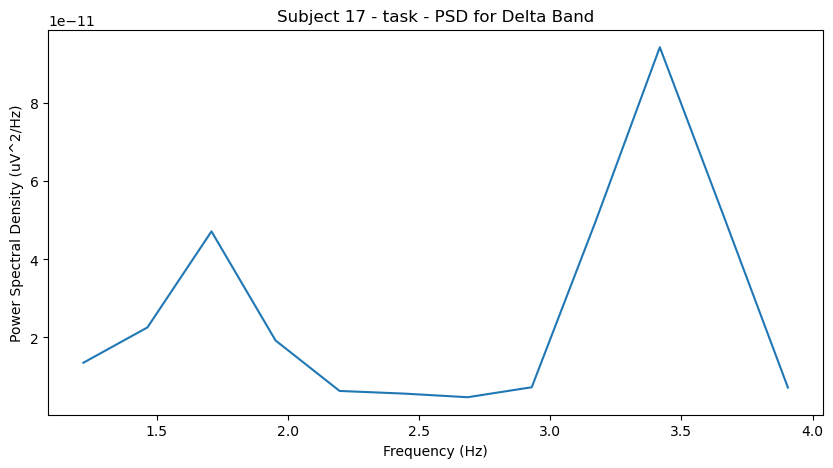

Effective window size : 4.096 (s)


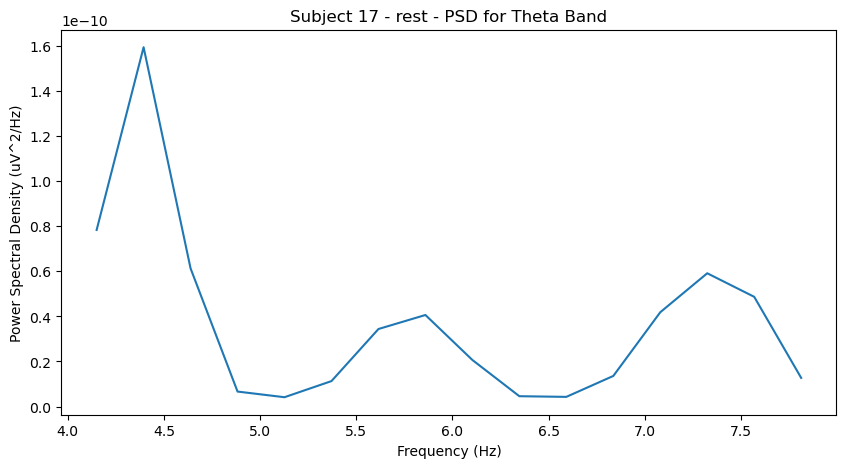

Effective window size : 4.096 (s)


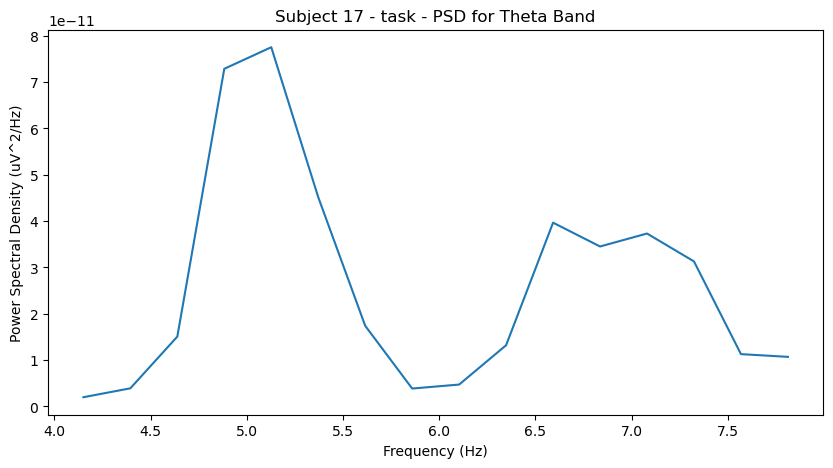

Effective window size : 4.096 (s)


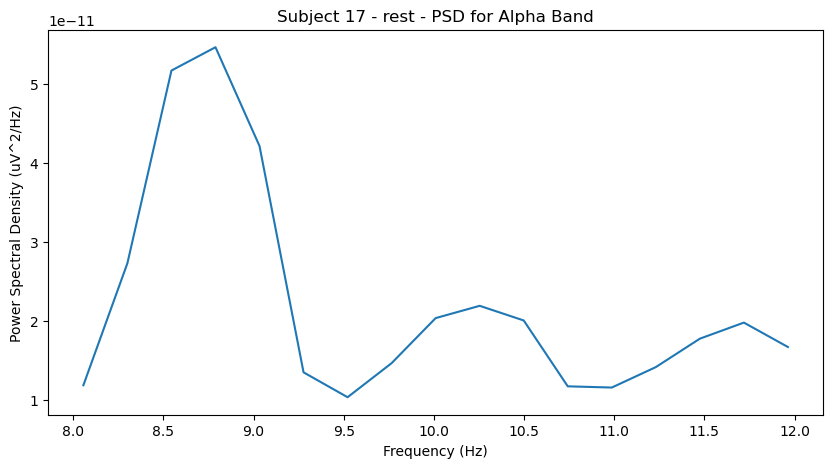

Effective window size : 4.096 (s)


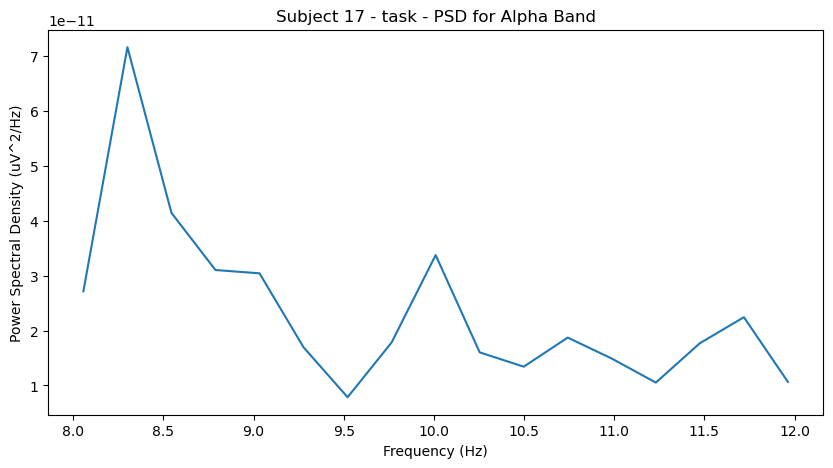

Effective window size : 4.096 (s)


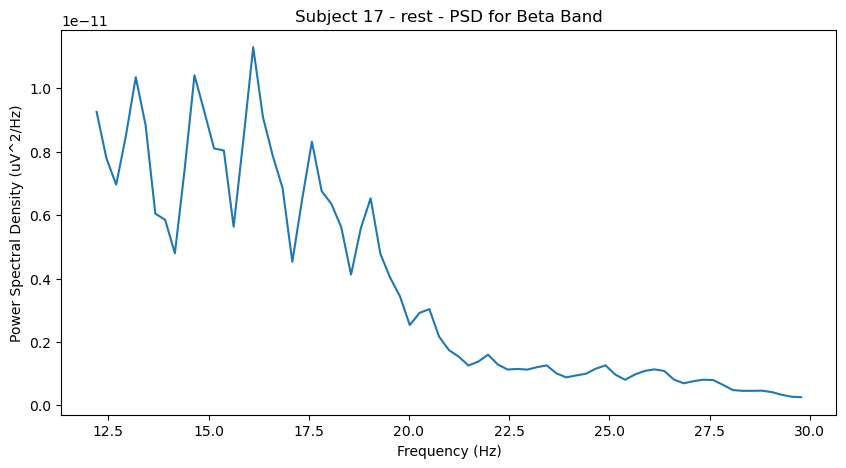

Effective window size : 4.096 (s)


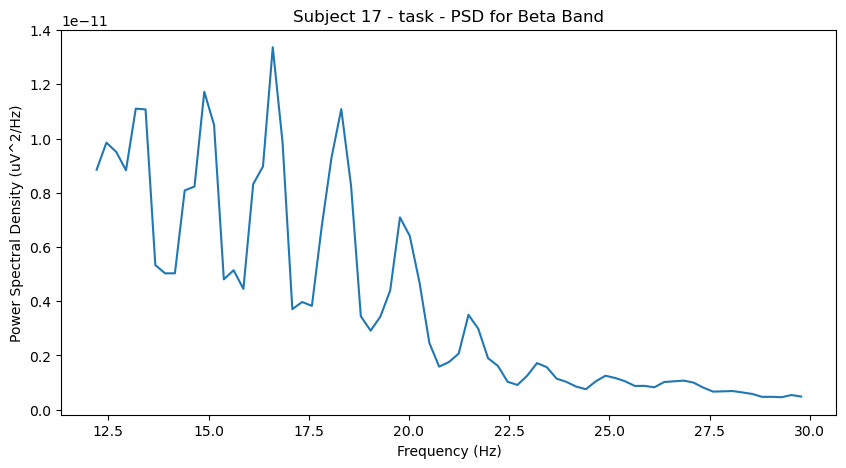

Effective window size : 4.096 (s)


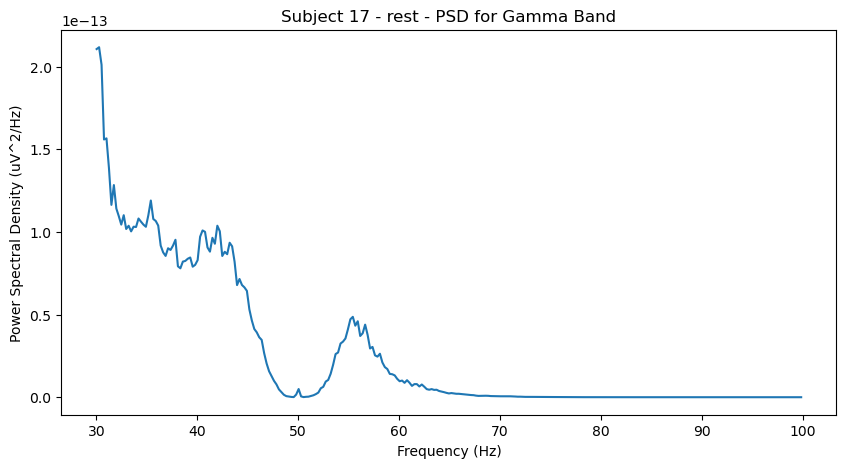

Effective window size : 4.096 (s)


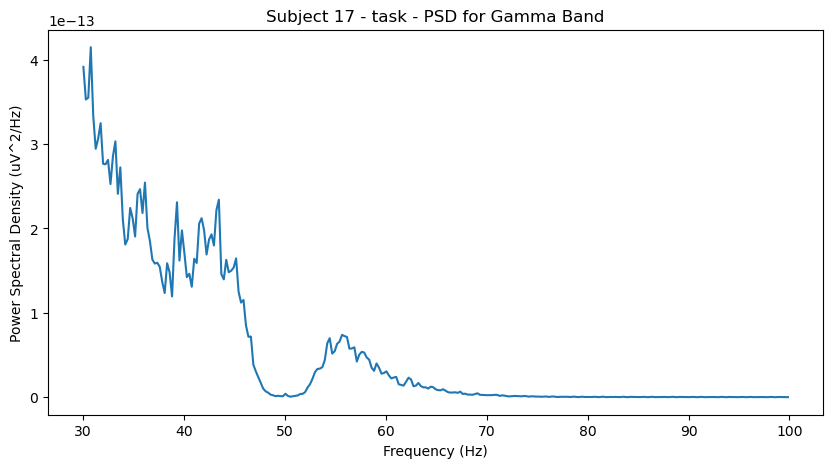

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 17/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject17_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject17_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


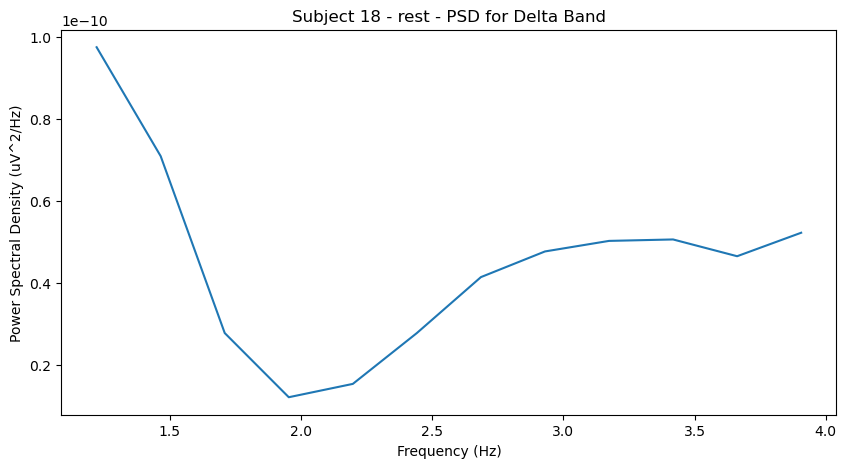

Effective window size : 4.096 (s)


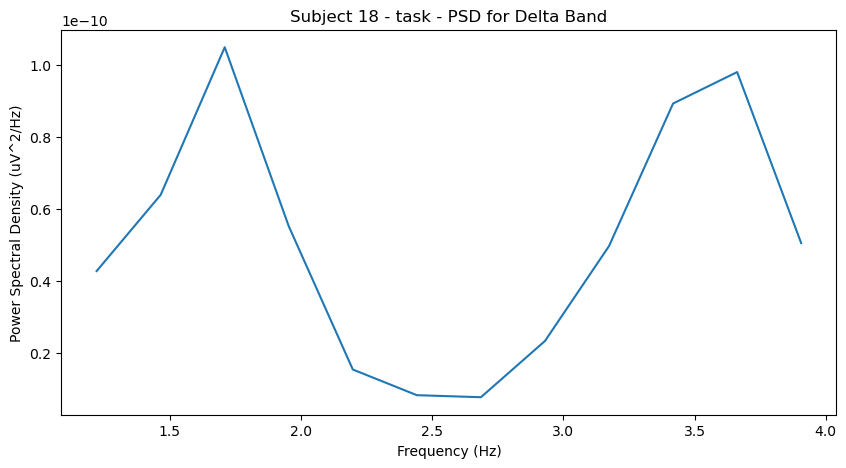

Effective window size : 4.096 (s)


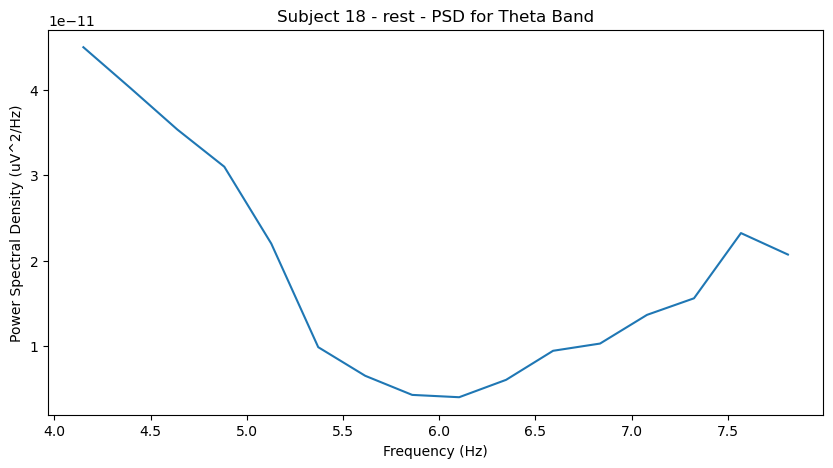

Effective window size : 4.096 (s)


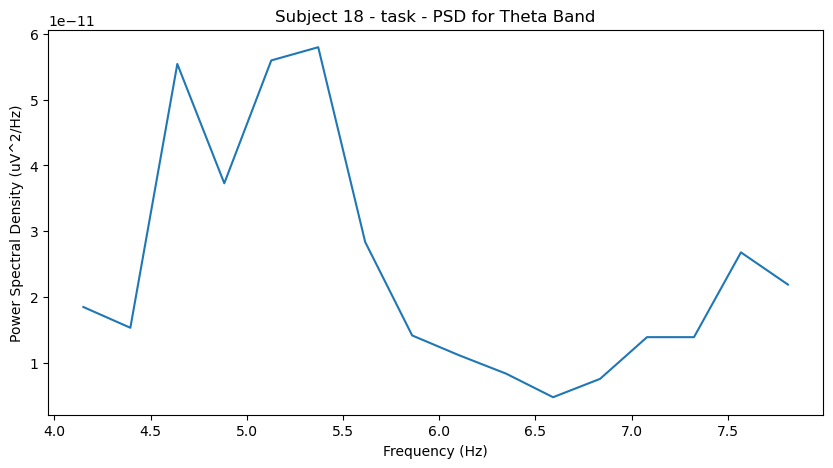

Effective window size : 4.096 (s)


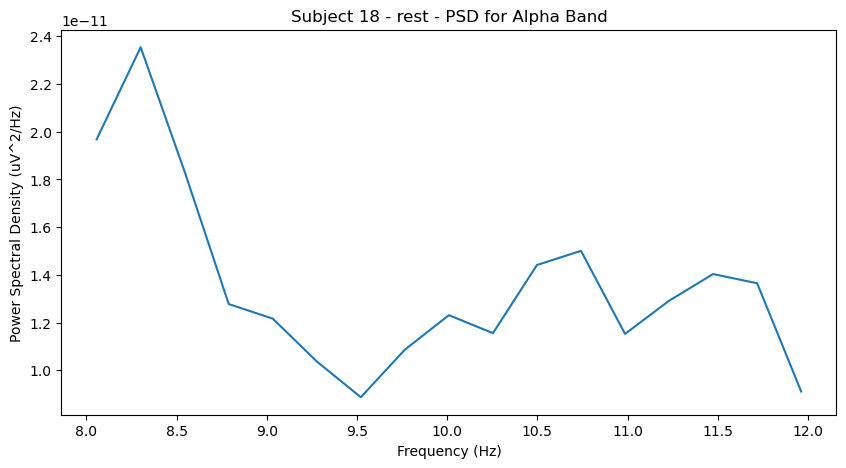

Effective window size : 4.096 (s)


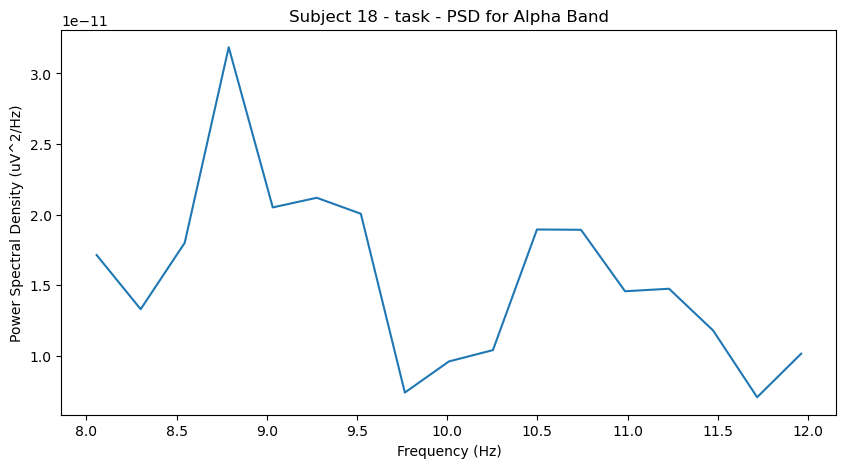

Effective window size : 4.096 (s)


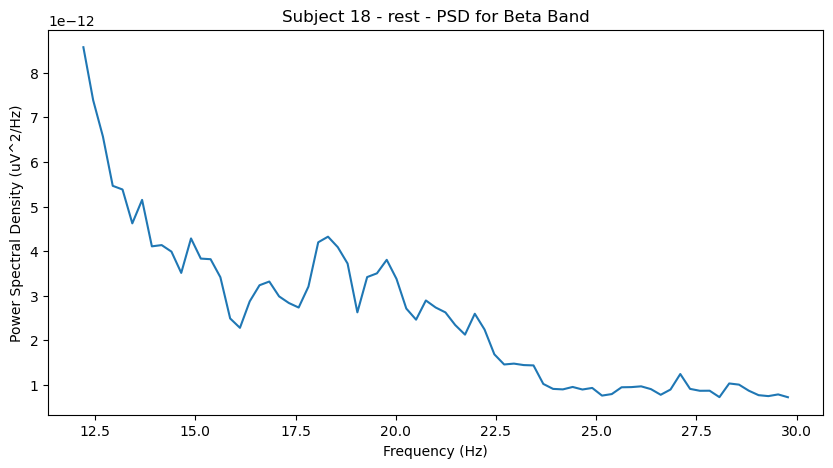

Effective window size : 4.096 (s)


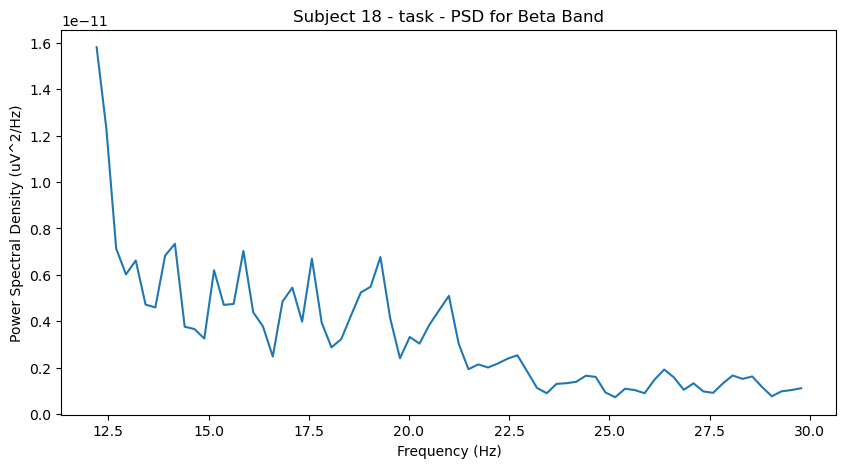

Effective window size : 4.096 (s)


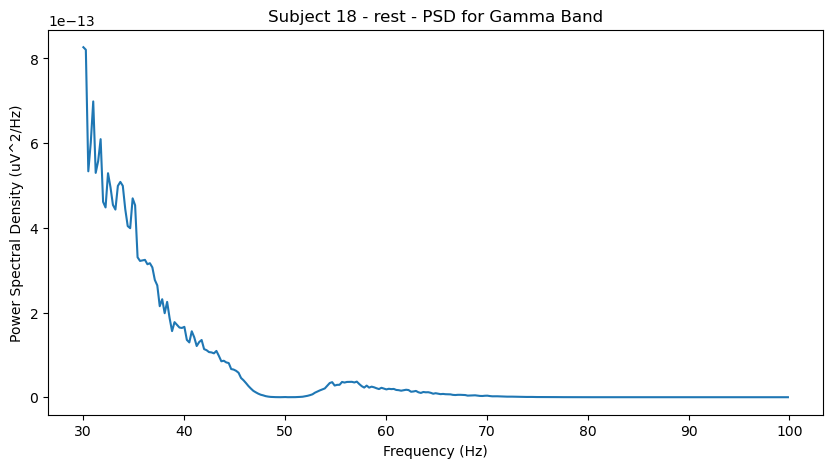

Effective window size : 4.096 (s)


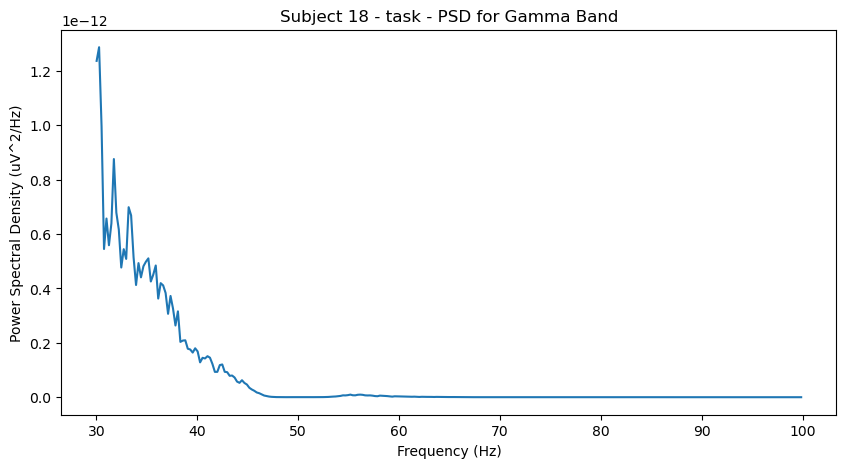

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 18/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject18_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject18_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


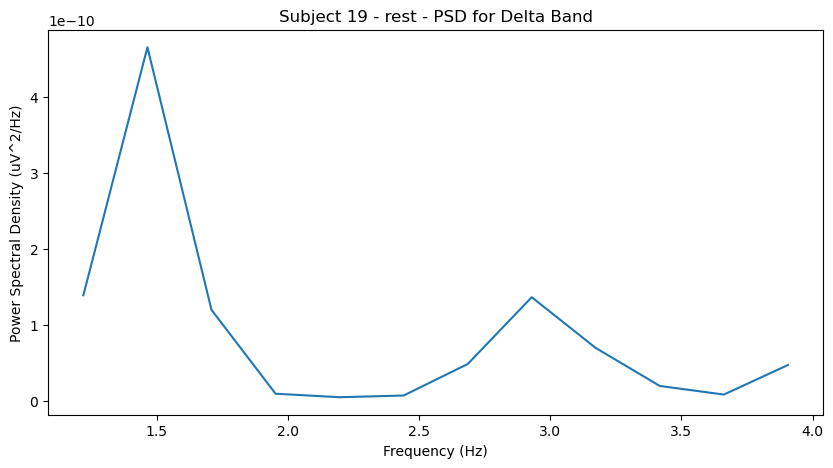

Effective window size : 4.096 (s)


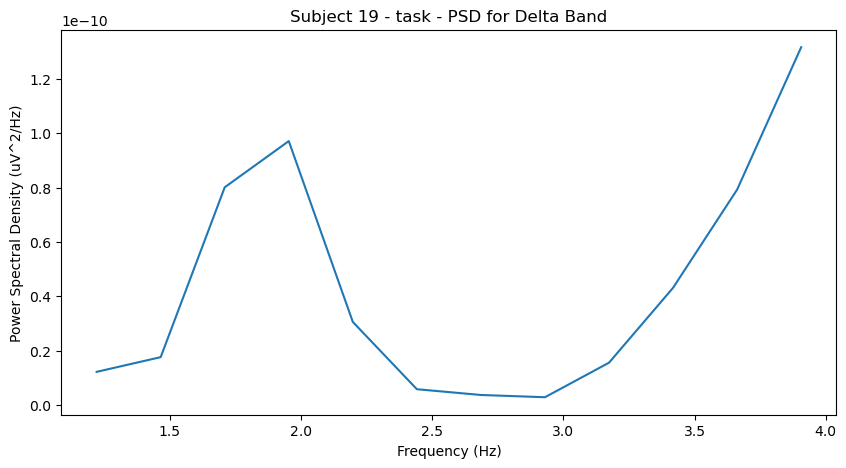

Effective window size : 4.096 (s)


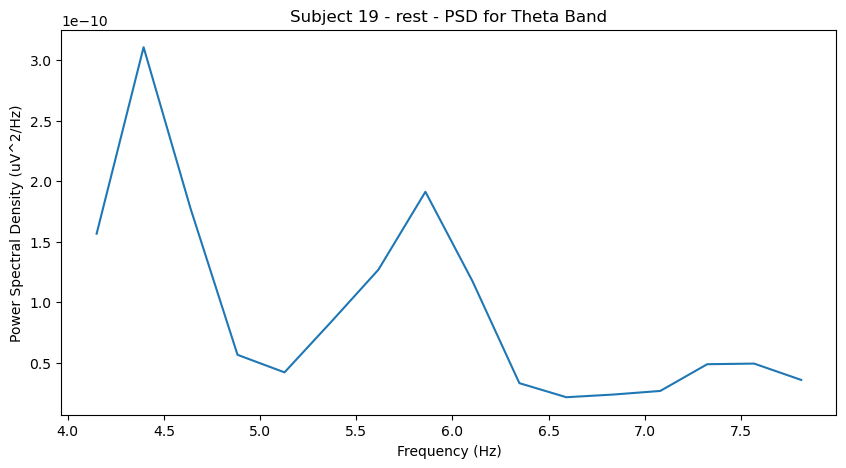

Effective window size : 4.096 (s)


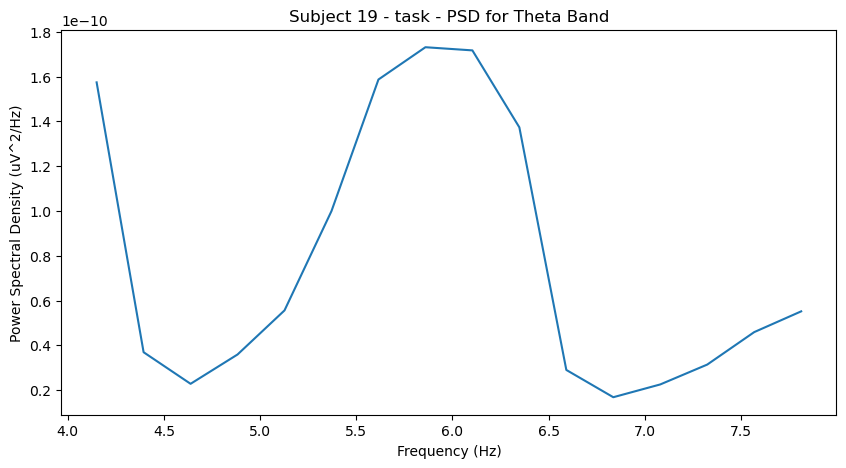

Effective window size : 4.096 (s)


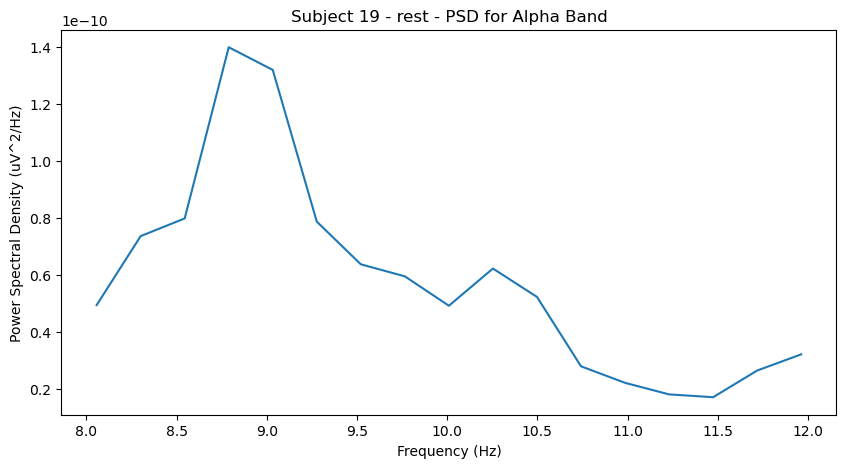

Effective window size : 4.096 (s)


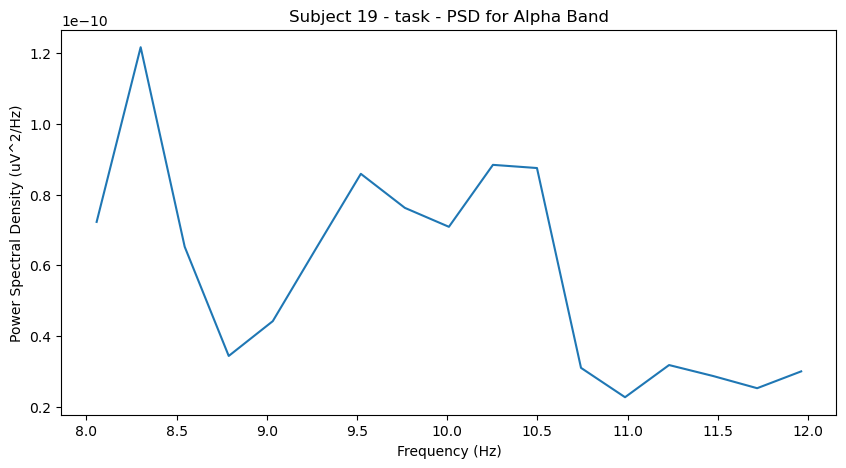

Effective window size : 4.096 (s)


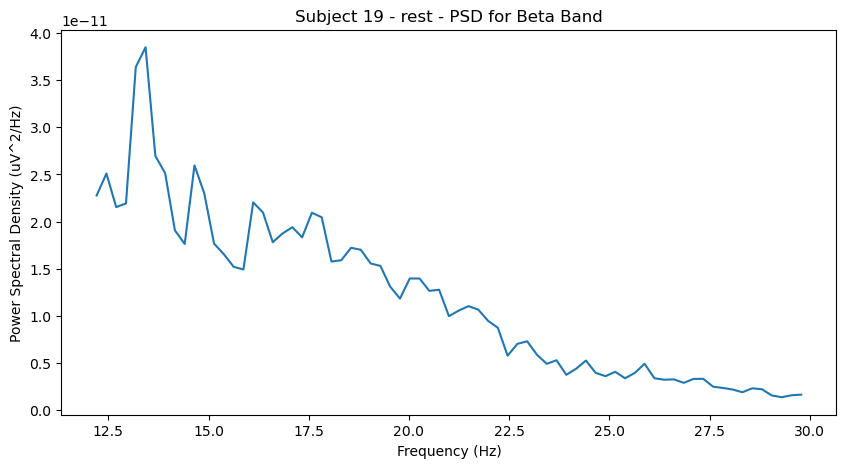

Effective window size : 4.096 (s)


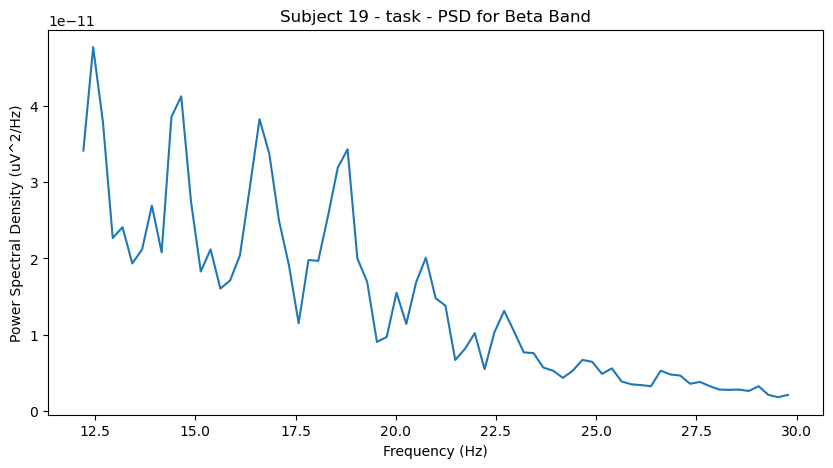

Effective window size : 4.096 (s)


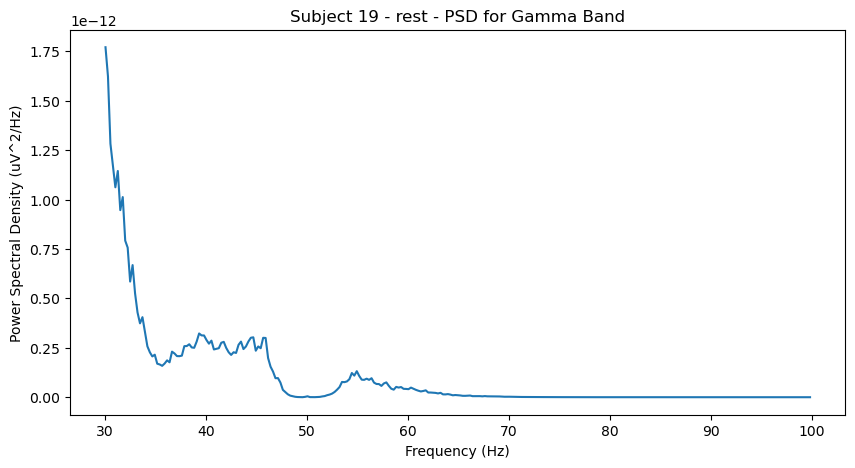

Effective window size : 4.096 (s)


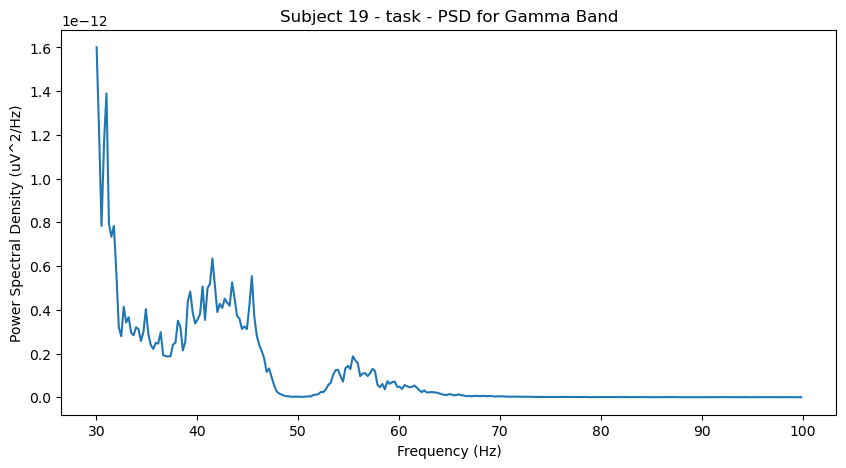

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 19/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject19_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject19_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


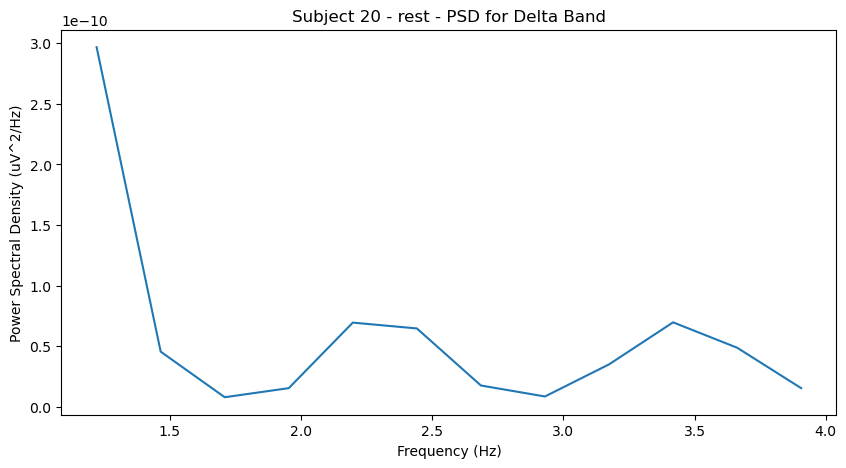

Effective window size : 4.096 (s)


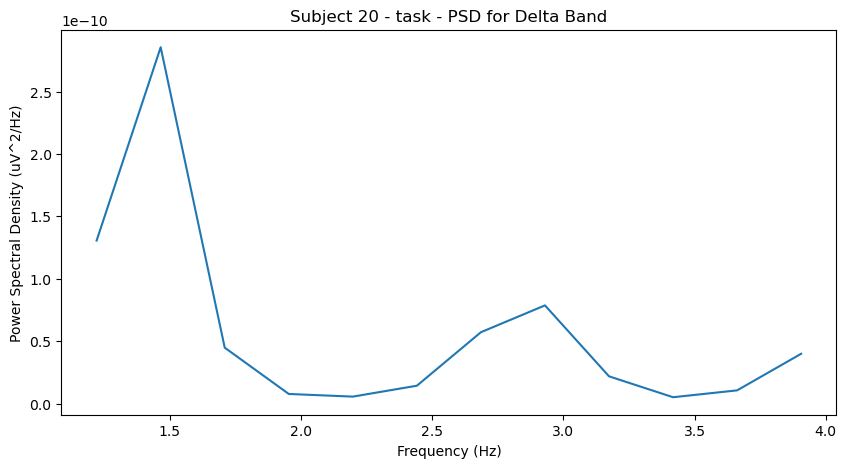

Effective window size : 4.096 (s)


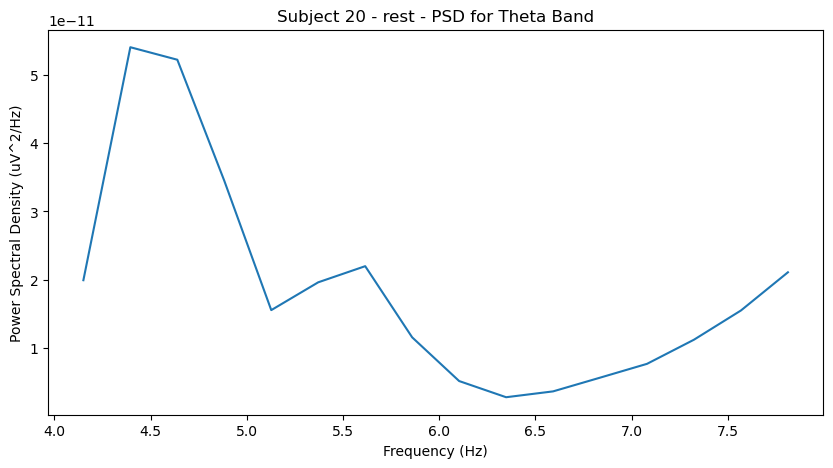

Effective window size : 4.096 (s)


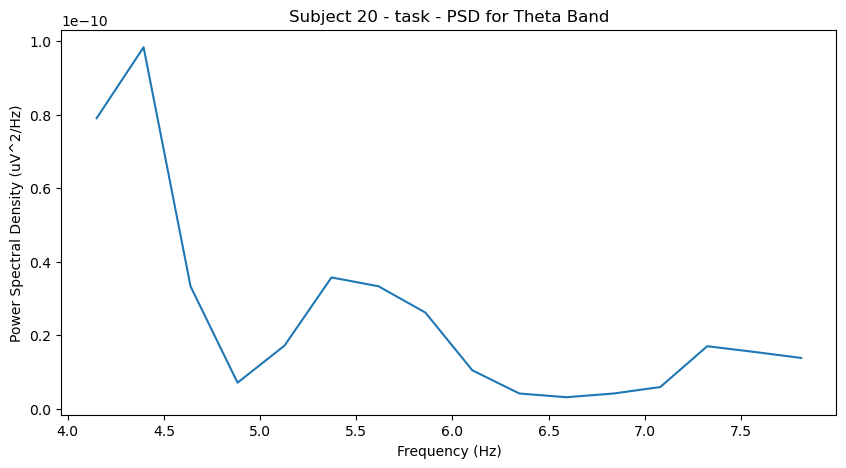

Effective window size : 4.096 (s)


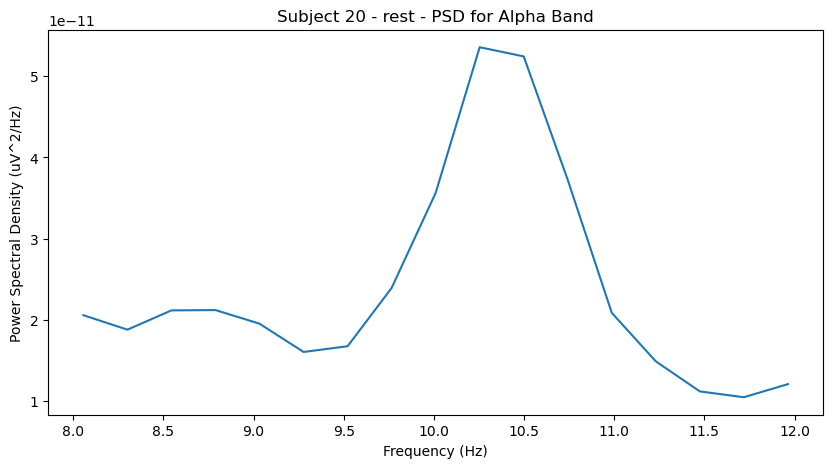

Effective window size : 4.096 (s)


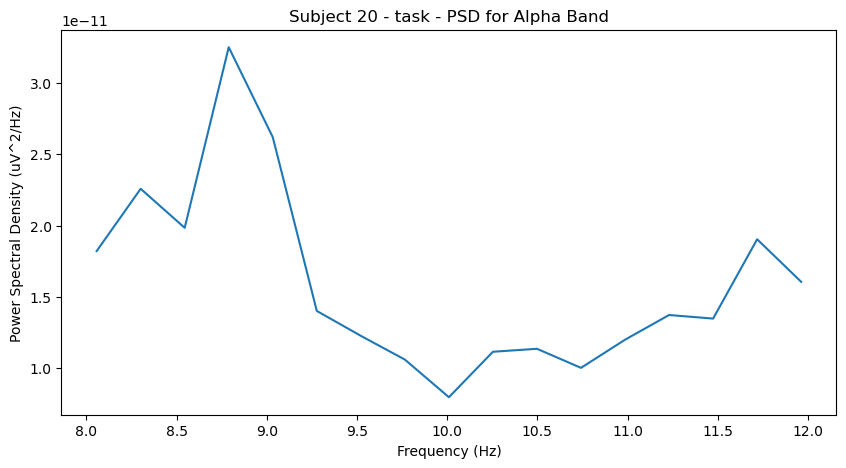

Effective window size : 4.096 (s)


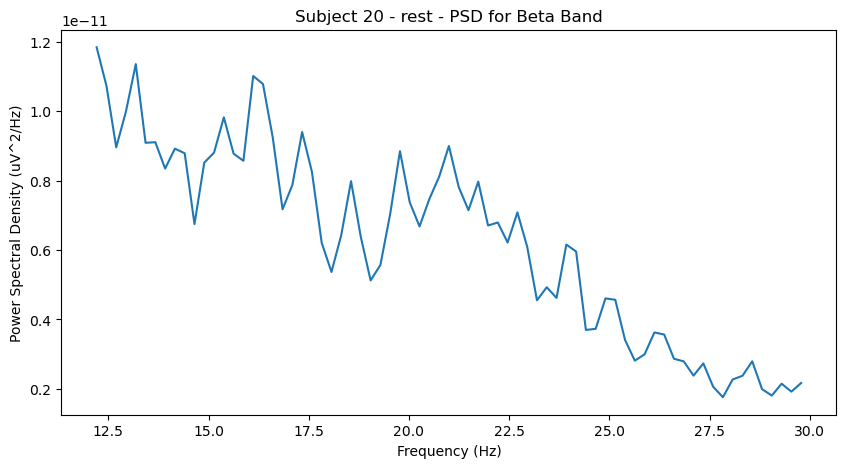

Effective window size : 4.096 (s)


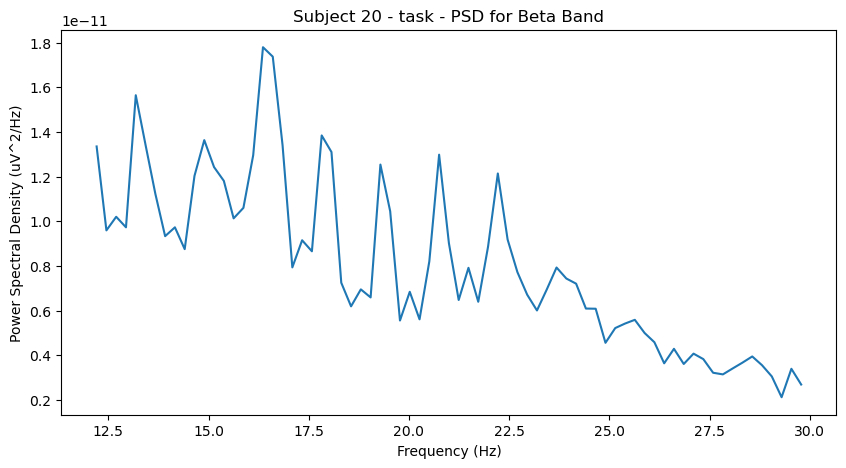

Effective window size : 4.096 (s)


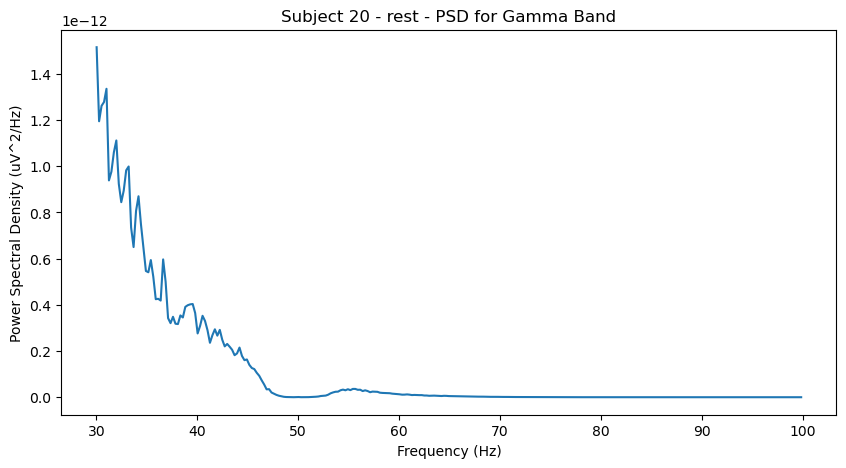

Effective window size : 4.096 (s)


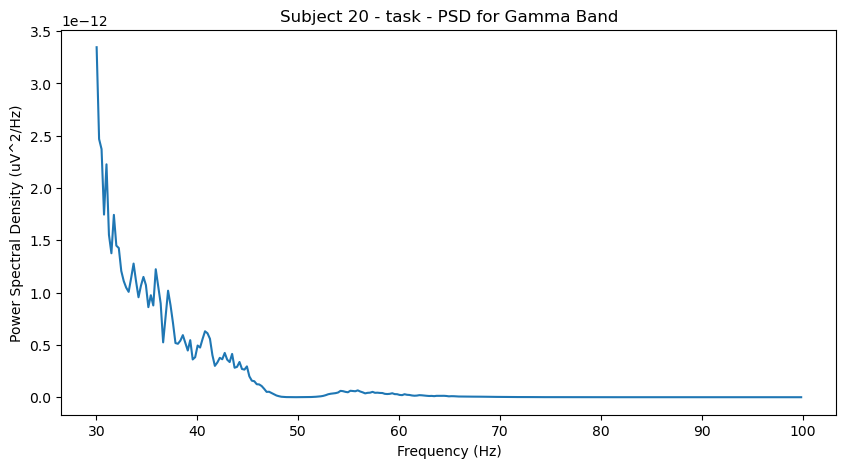

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 20/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject20_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject20_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


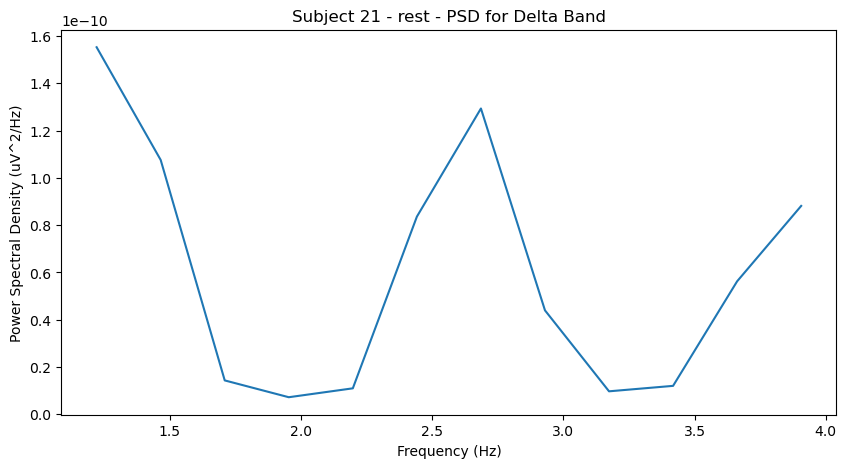

Effective window size : 4.096 (s)


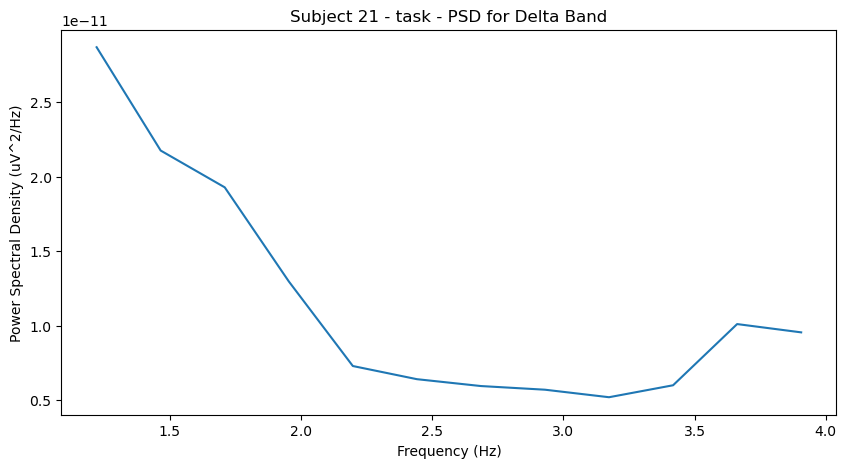

Effective window size : 4.096 (s)


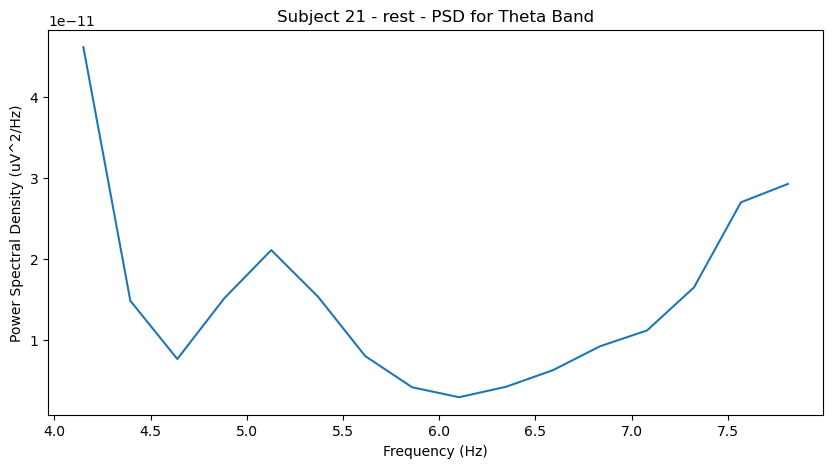

Effective window size : 4.096 (s)


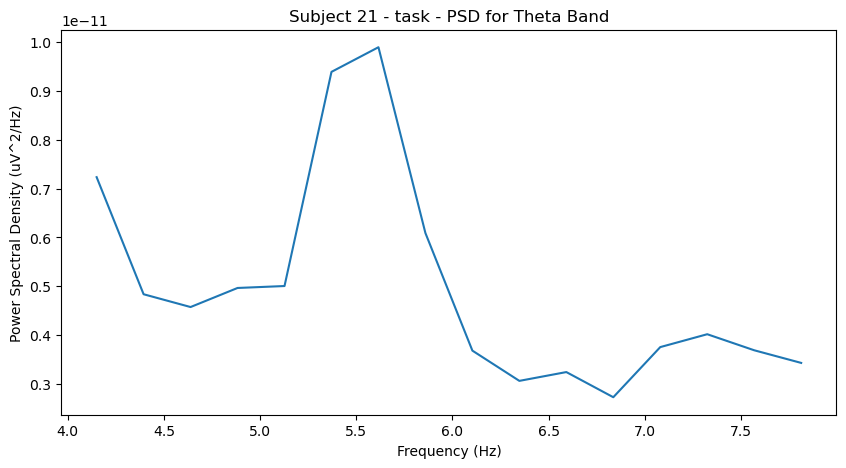

Effective window size : 4.096 (s)


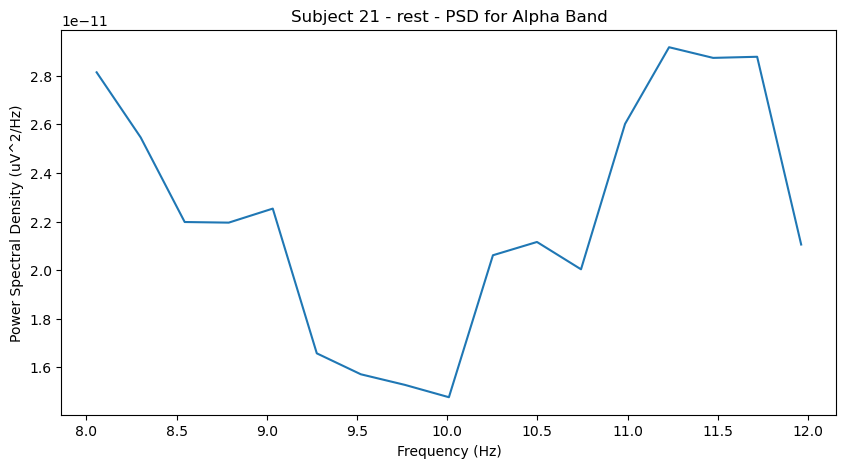

Effective window size : 4.096 (s)


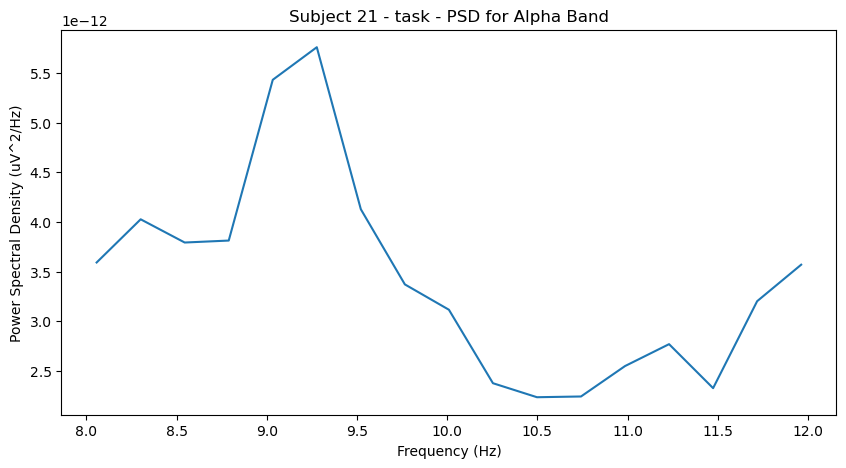

Effective window size : 4.096 (s)


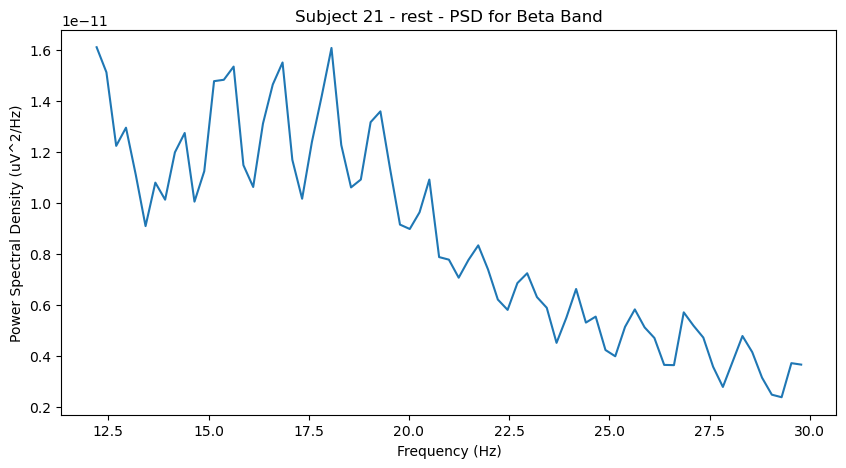

Effective window size : 4.096 (s)


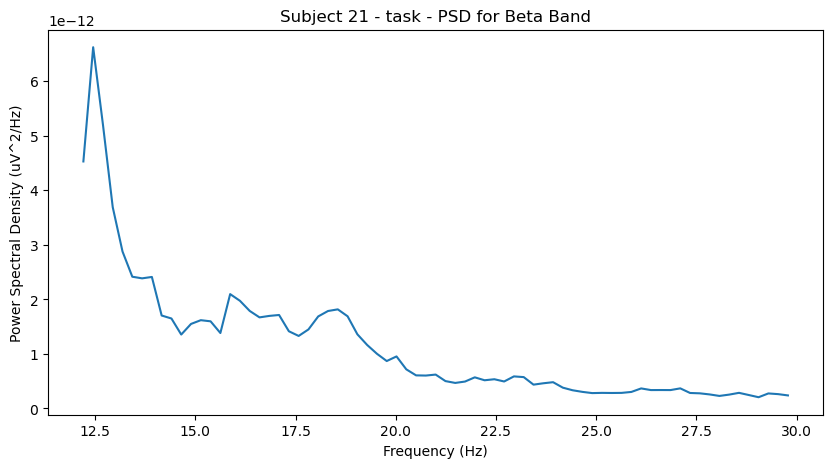

Effective window size : 4.096 (s)


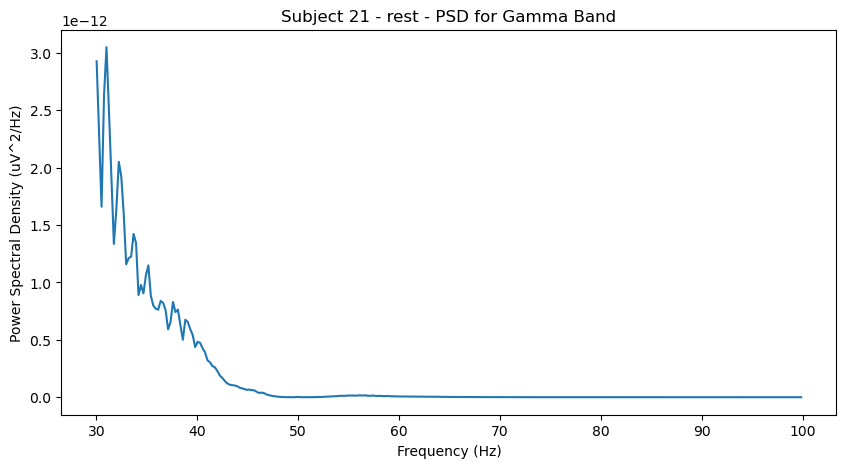

Effective window size : 4.096 (s)


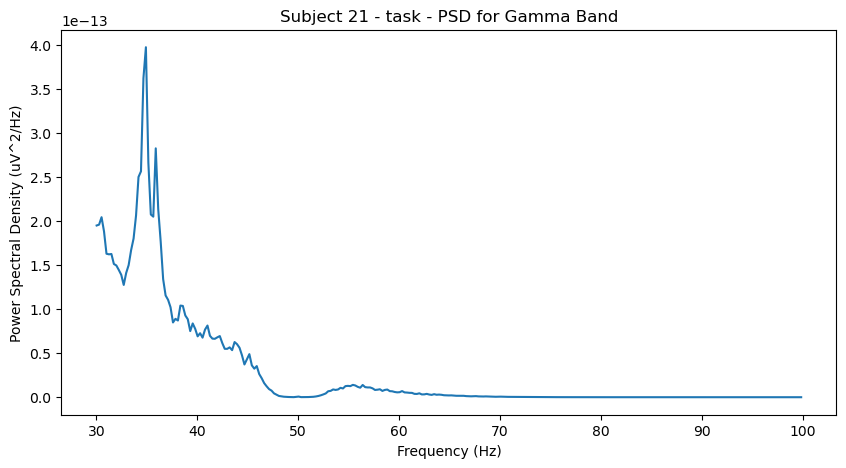

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 21/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject21_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject21_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


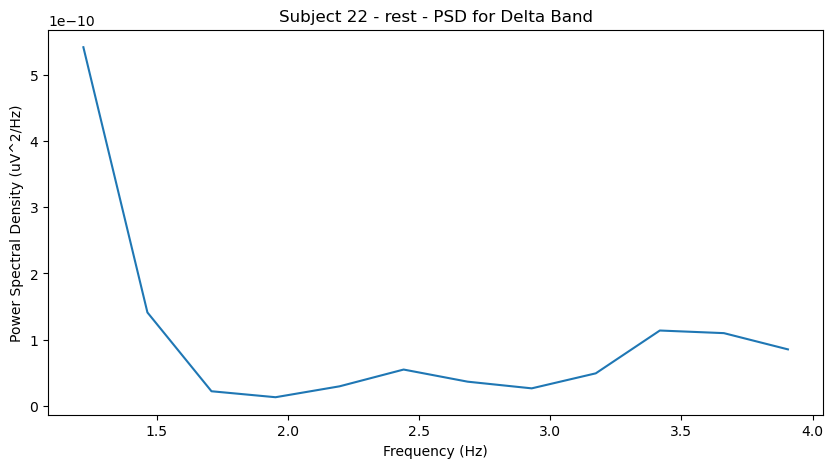

Effective window size : 4.096 (s)


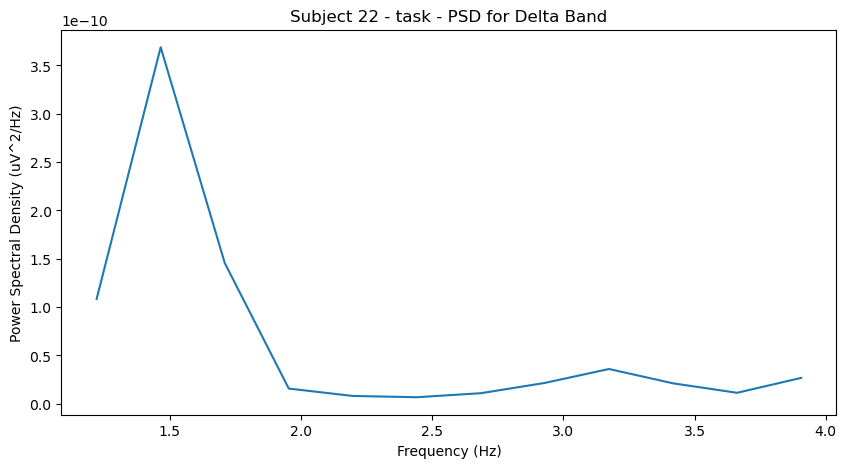

Effective window size : 4.096 (s)


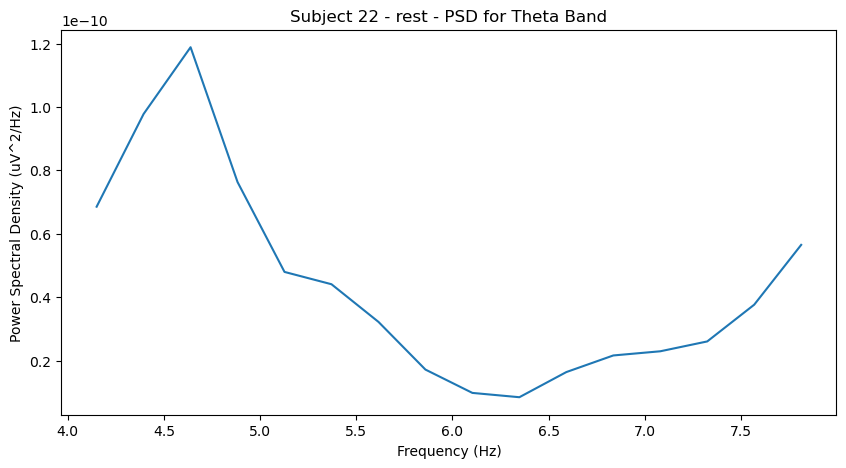

Effective window size : 4.096 (s)


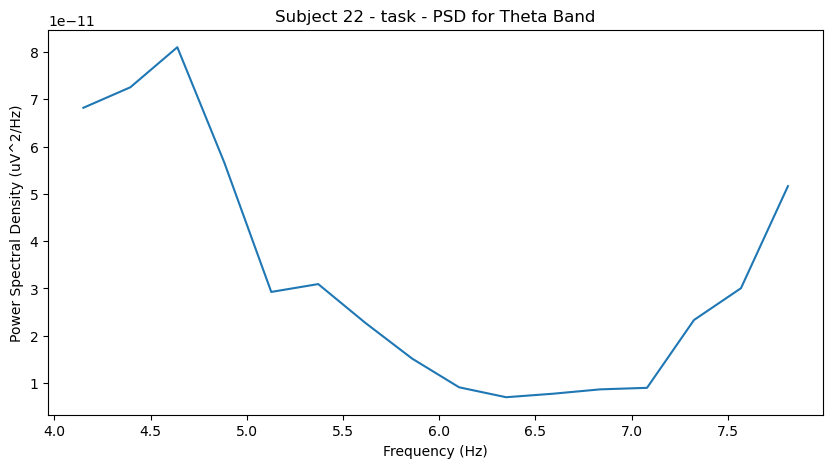

Effective window size : 4.096 (s)


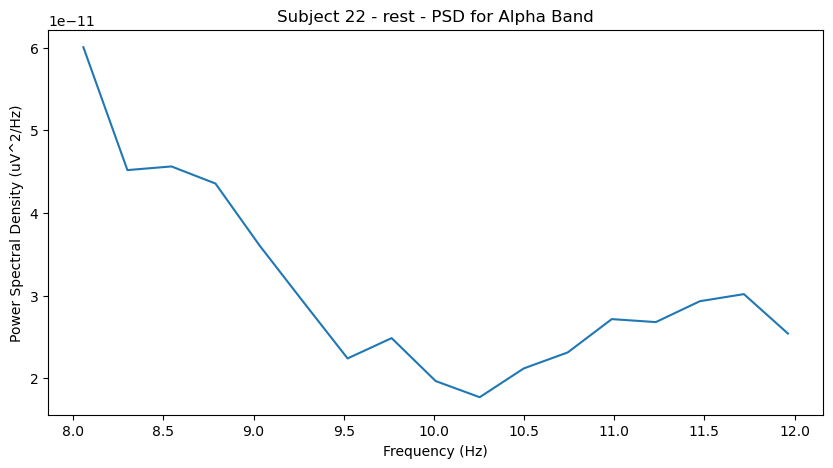

Effective window size : 4.096 (s)


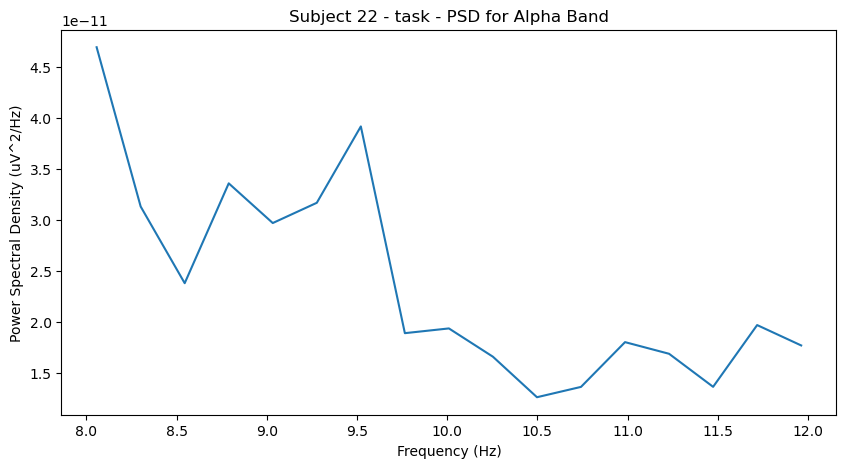

Effective window size : 4.096 (s)


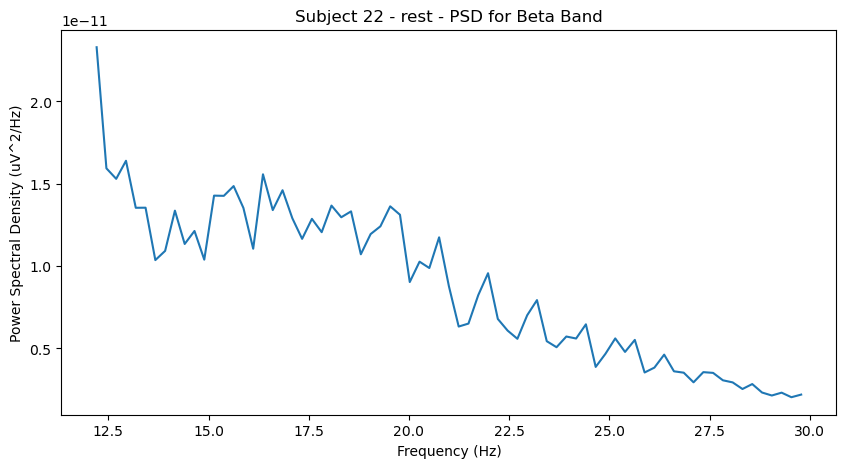

Effective window size : 4.096 (s)


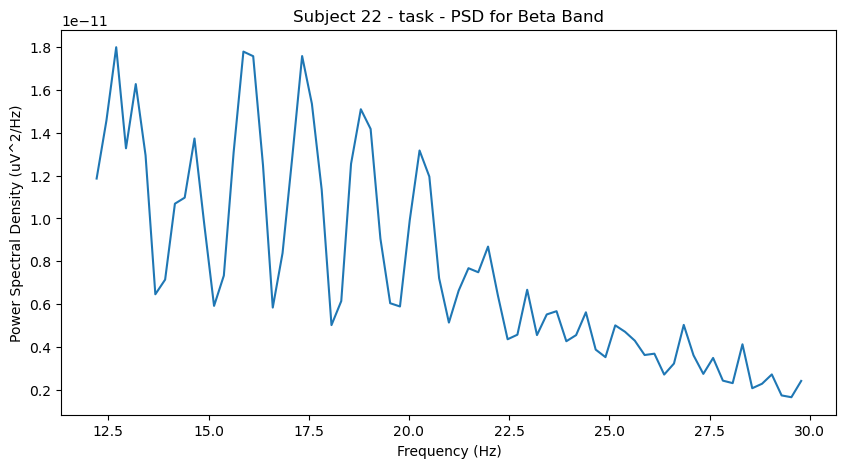

Effective window size : 4.096 (s)


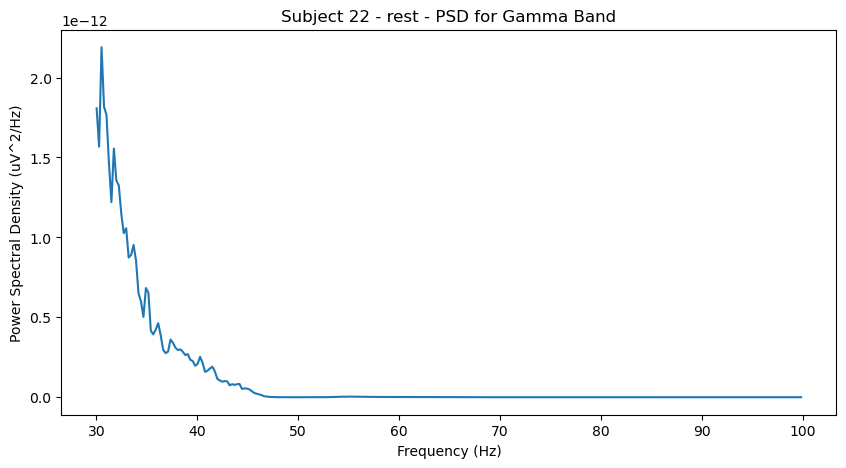

Effective window size : 4.096 (s)


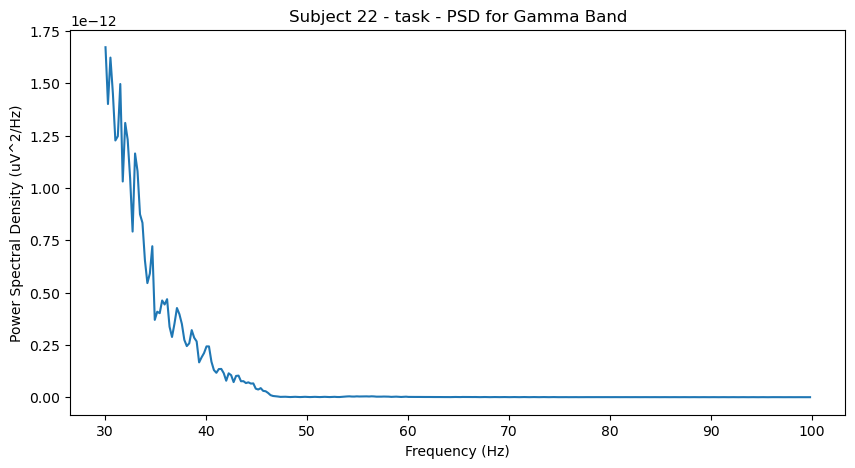

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 22/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject22_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject22_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


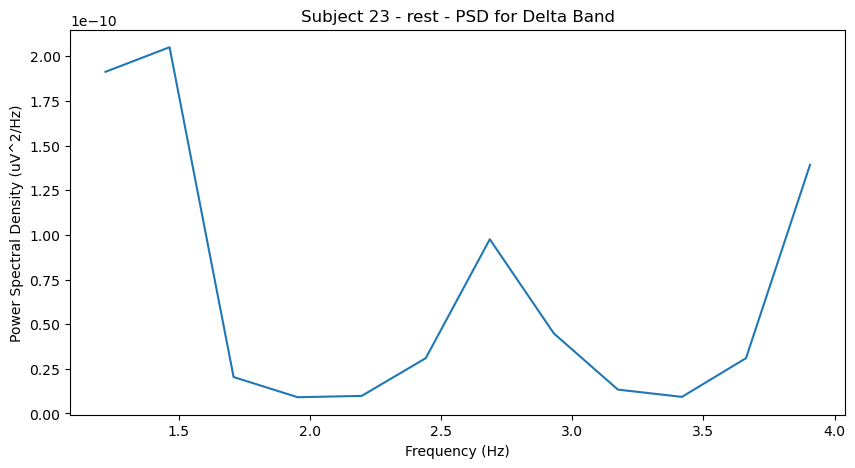

Effective window size : 4.096 (s)


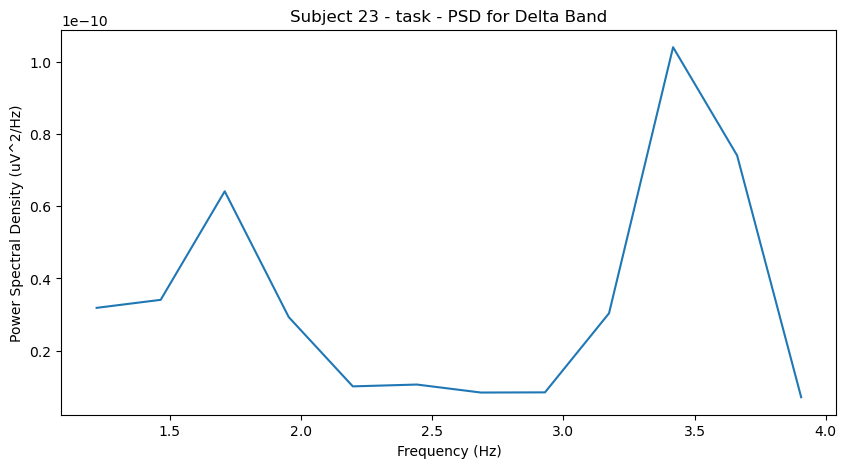

Effective window size : 4.096 (s)


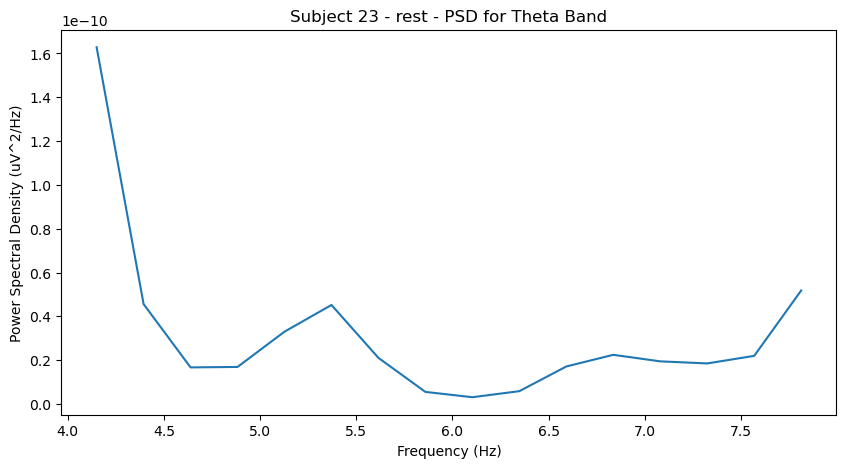

Effective window size : 4.096 (s)


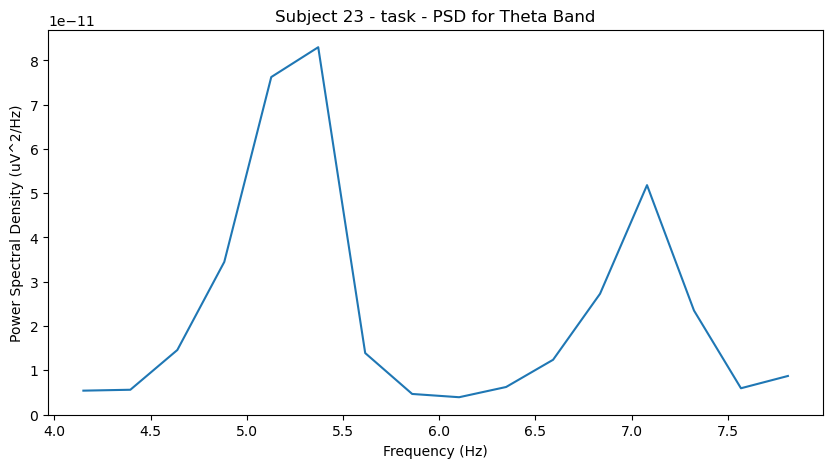

Effective window size : 4.096 (s)


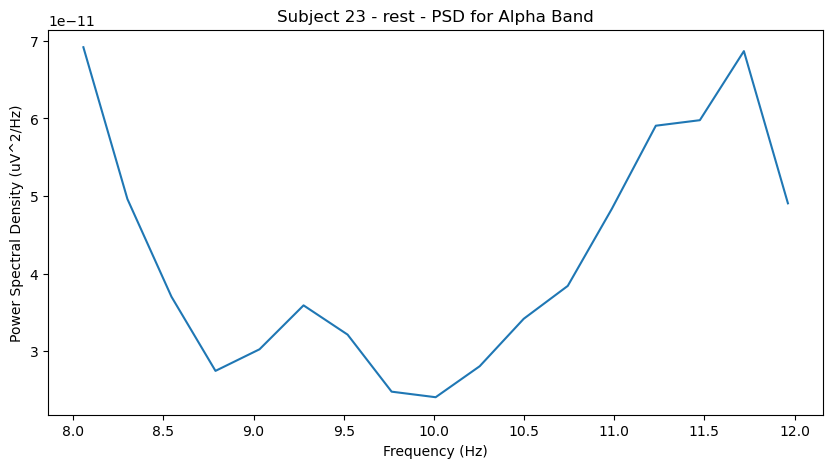

Effective window size : 4.096 (s)


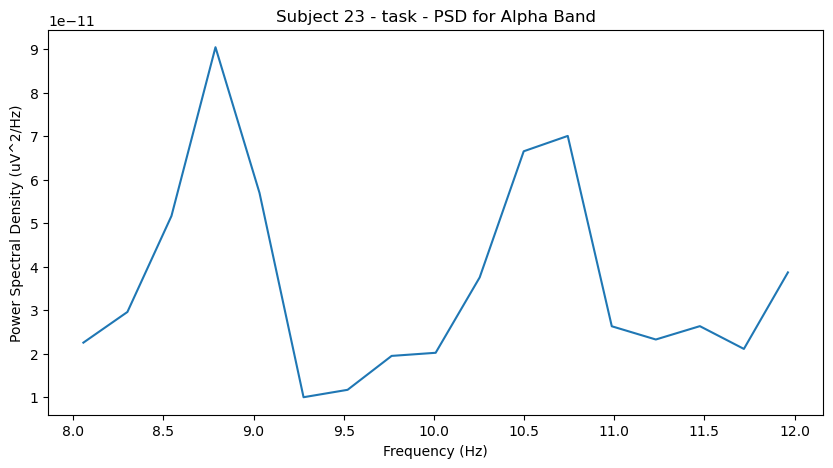

Effective window size : 4.096 (s)


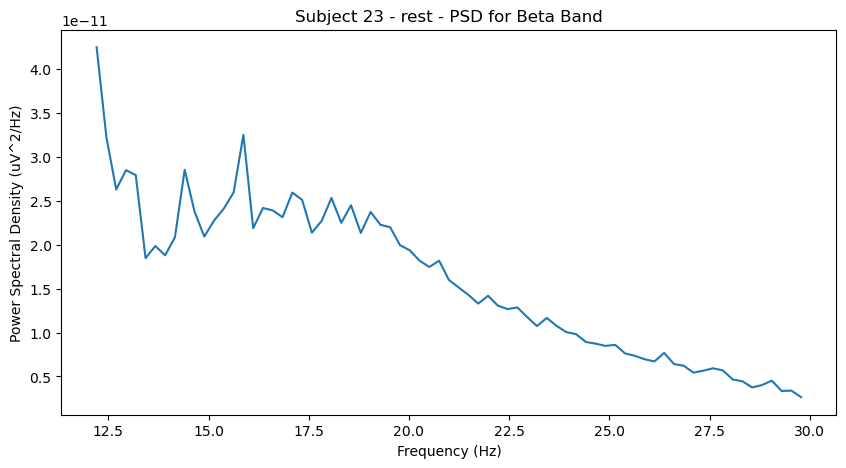

Effective window size : 4.096 (s)


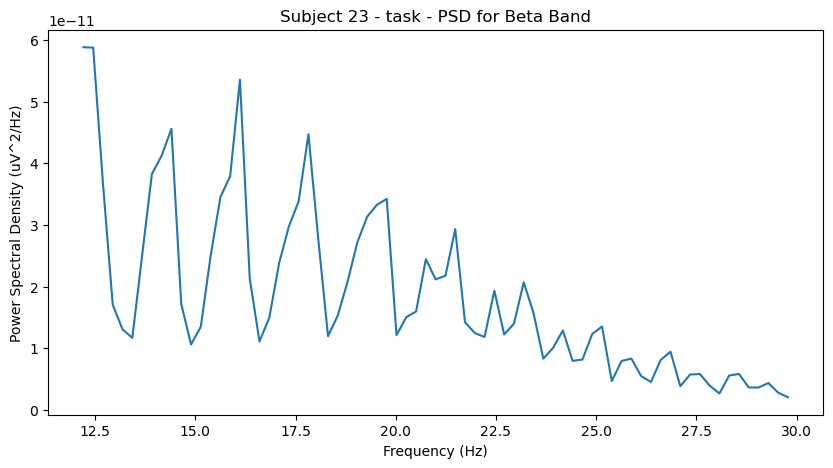

Effective window size : 4.096 (s)


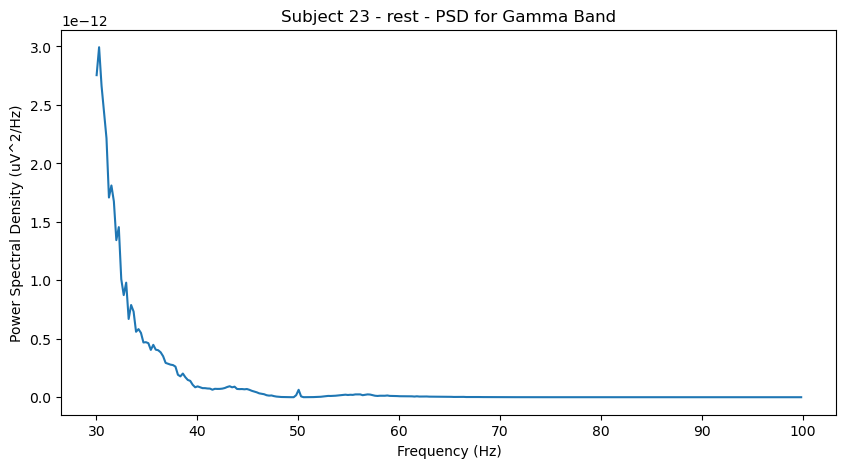

Effective window size : 4.096 (s)


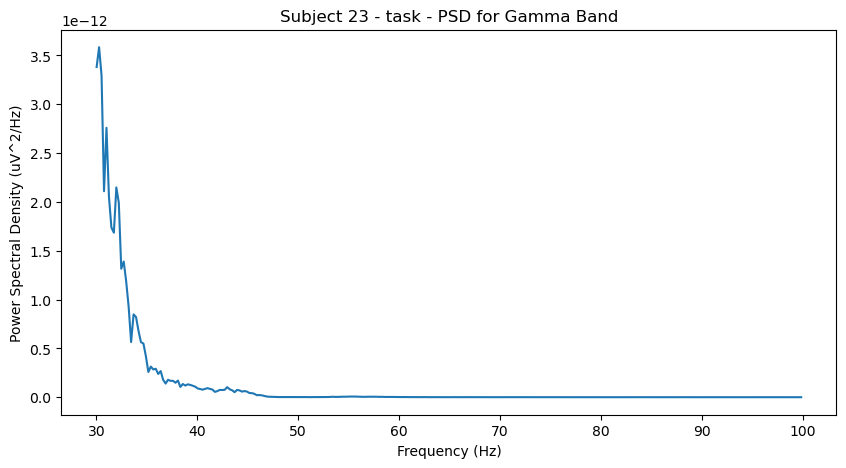

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 23/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject23_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject23_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


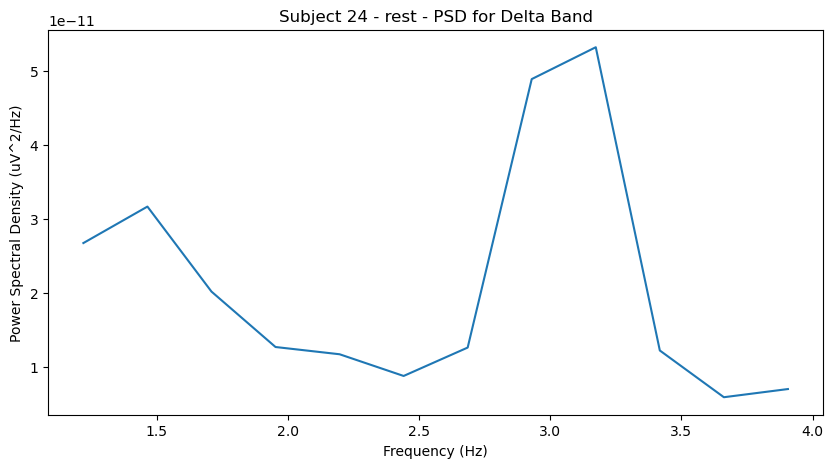

Effective window size : 4.096 (s)


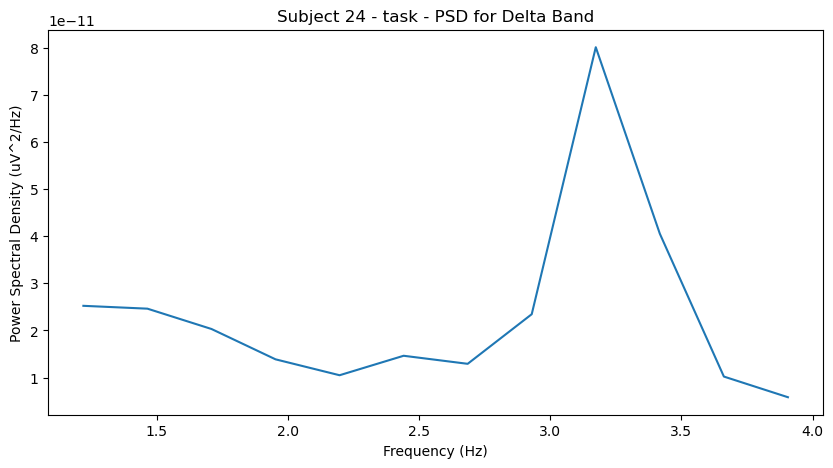

Effective window size : 4.096 (s)


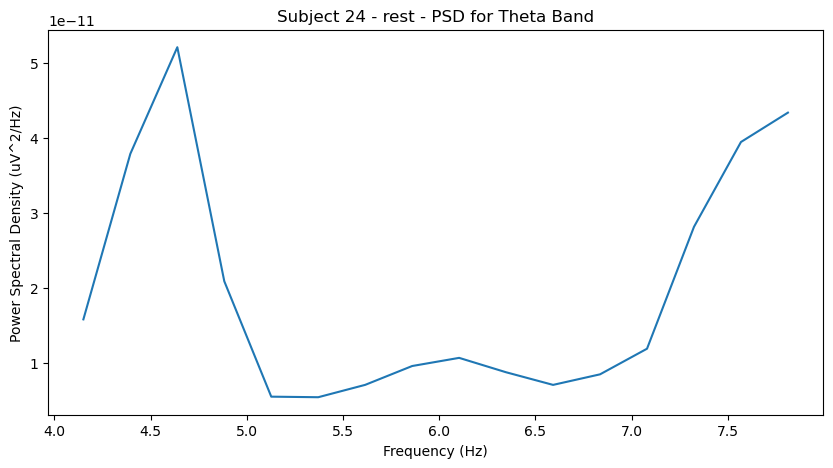

Effective window size : 4.096 (s)


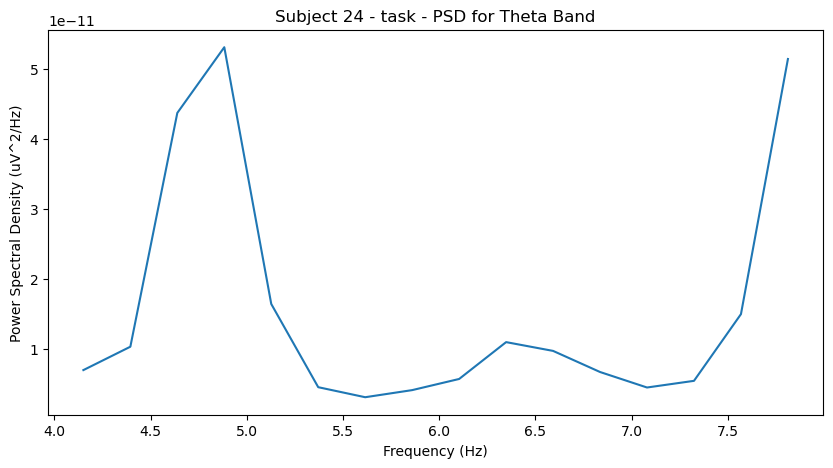

Effective window size : 4.096 (s)


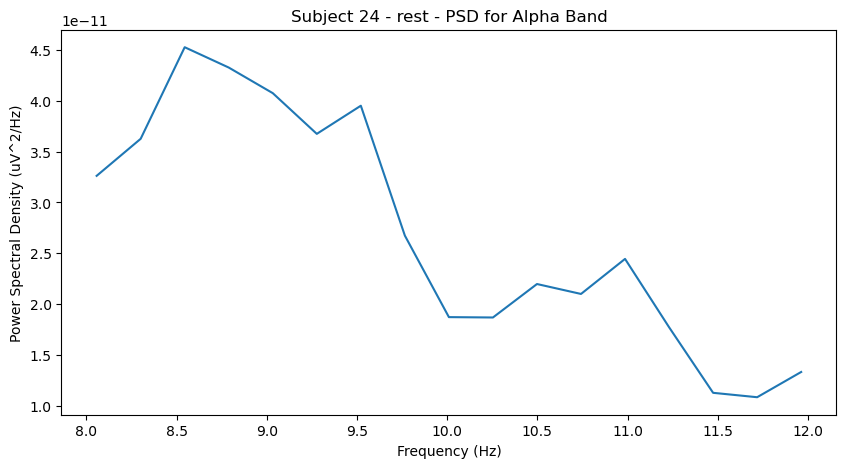

Effective window size : 4.096 (s)


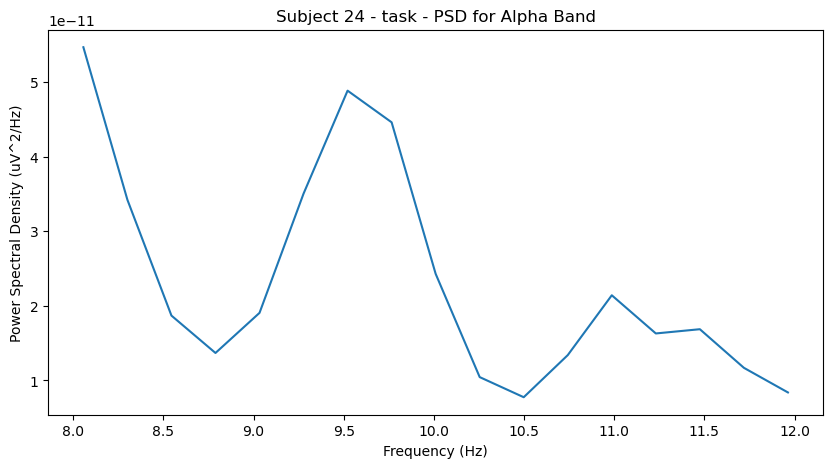

Effective window size : 4.096 (s)


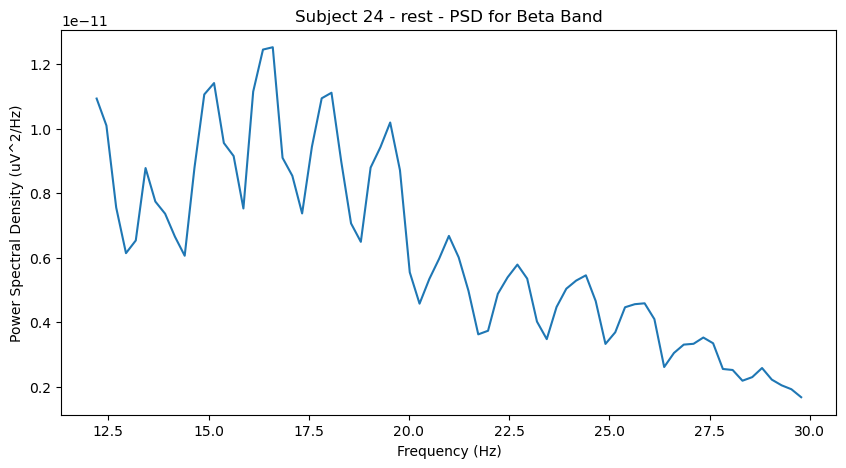

Effective window size : 4.096 (s)


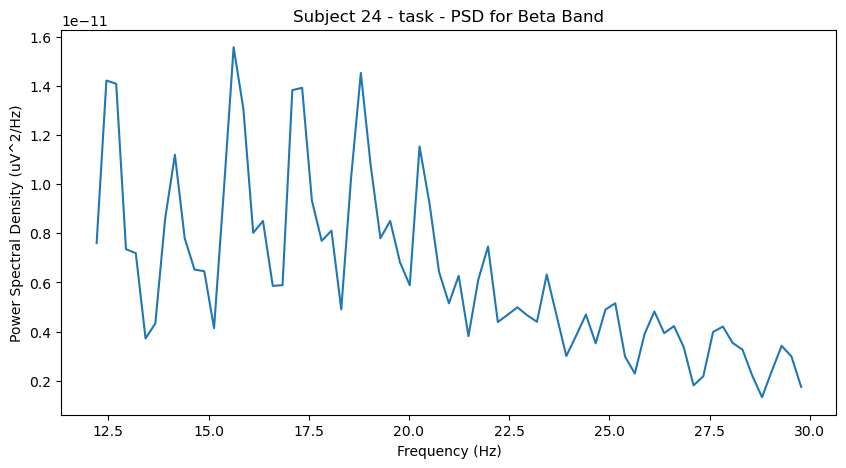

Effective window size : 4.096 (s)


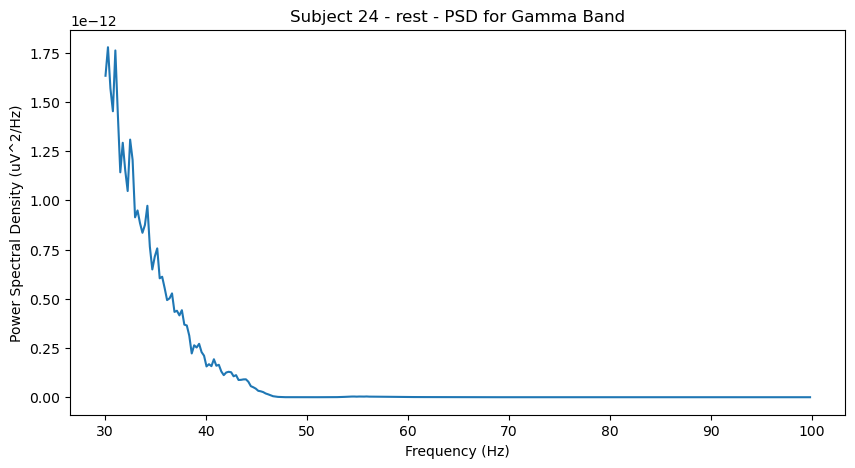

Effective window size : 4.096 (s)


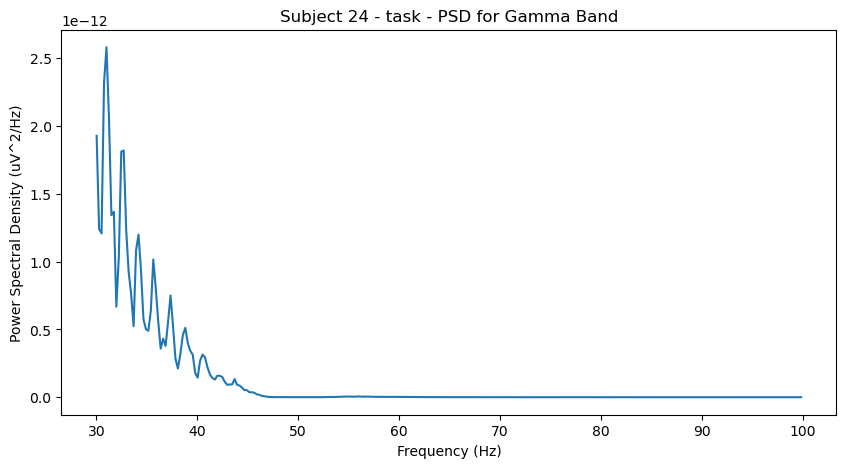

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 24/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject24_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject24_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


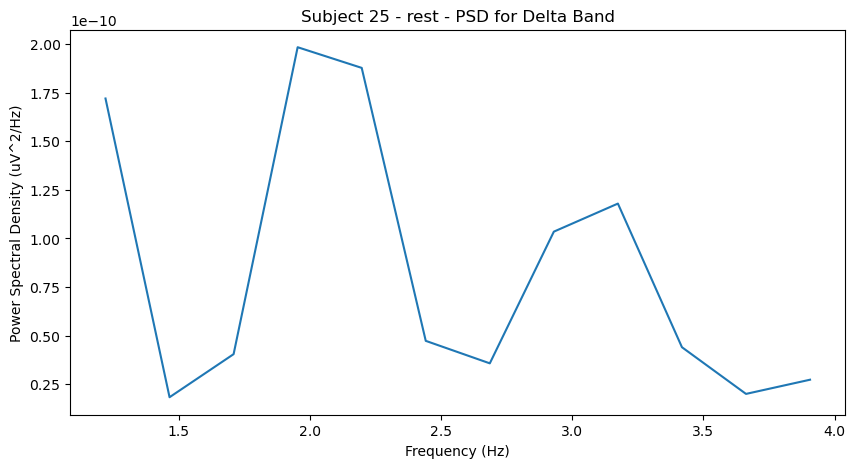

Effective window size : 4.096 (s)


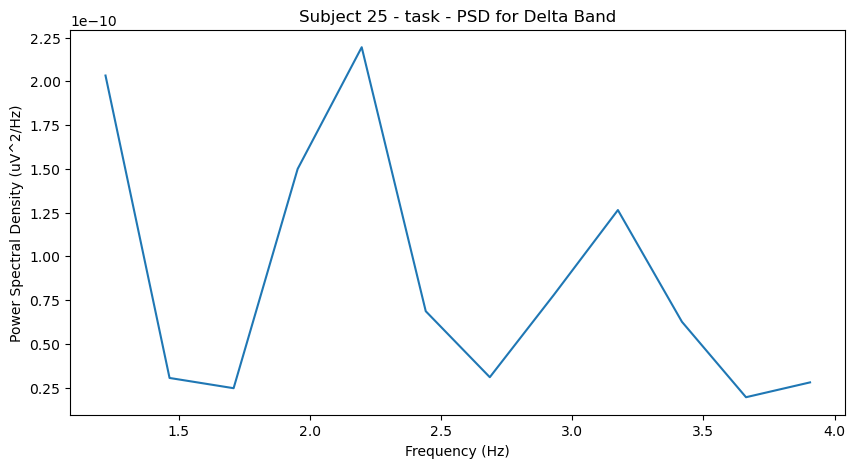

Effective window size : 4.096 (s)


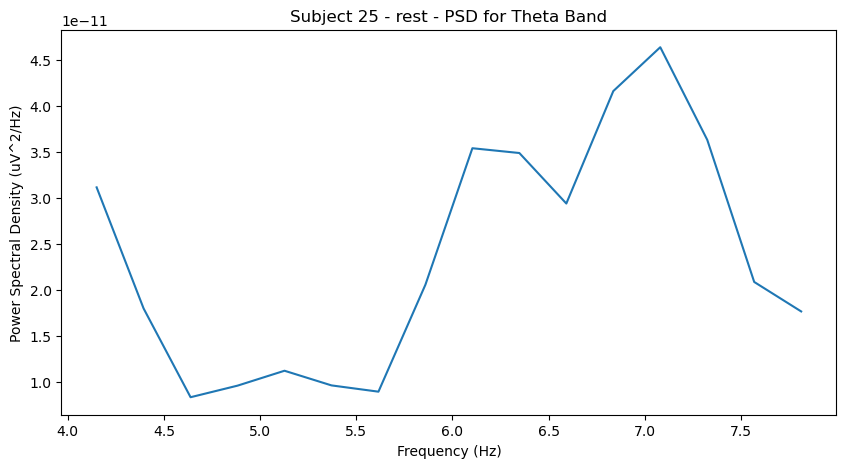

Effective window size : 4.096 (s)


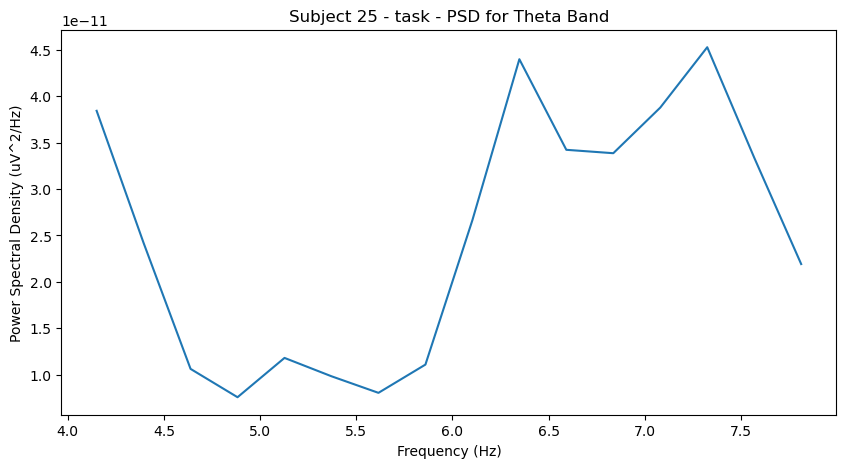

Effective window size : 4.096 (s)


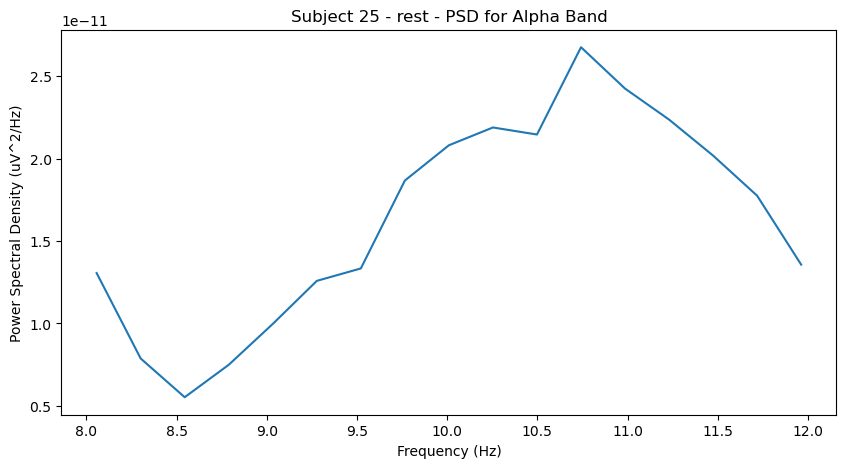

Effective window size : 4.096 (s)


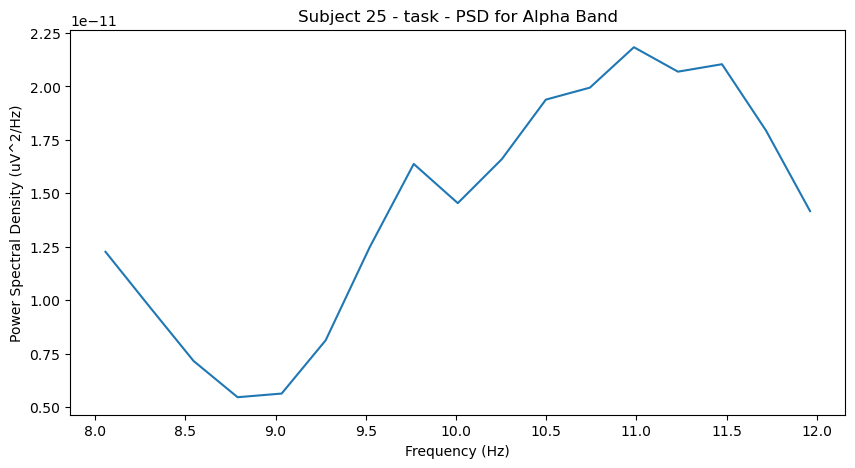

Effective window size : 4.096 (s)


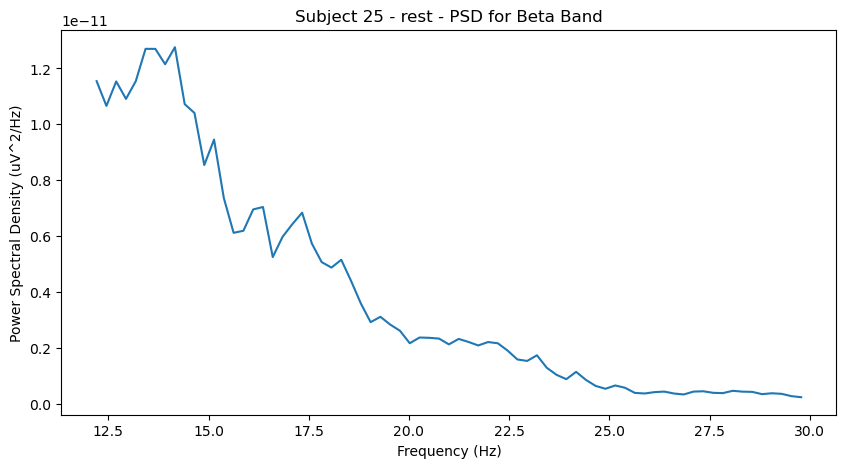

Effective window size : 4.096 (s)


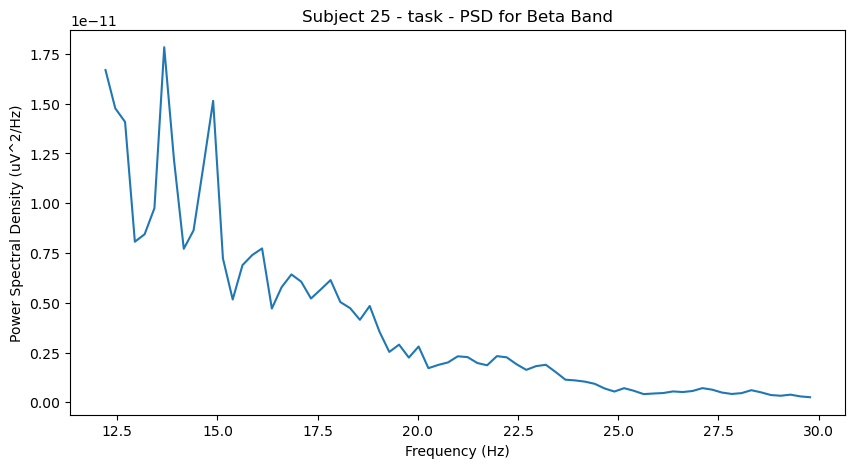

Effective window size : 4.096 (s)


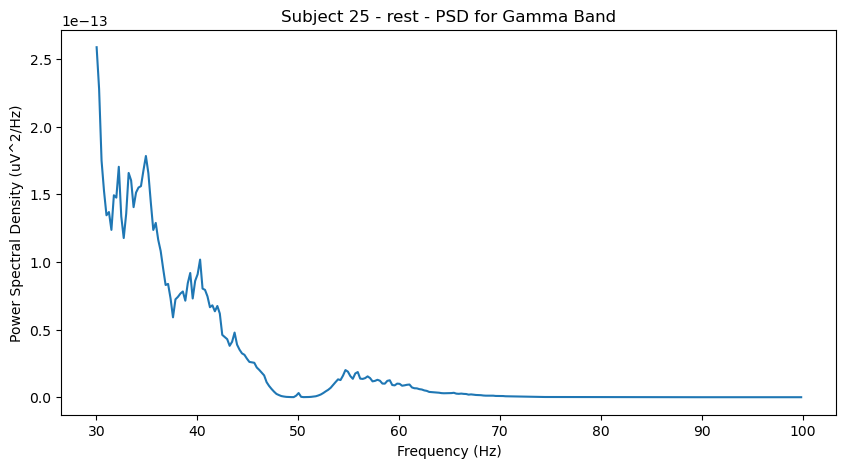

Effective window size : 4.096 (s)


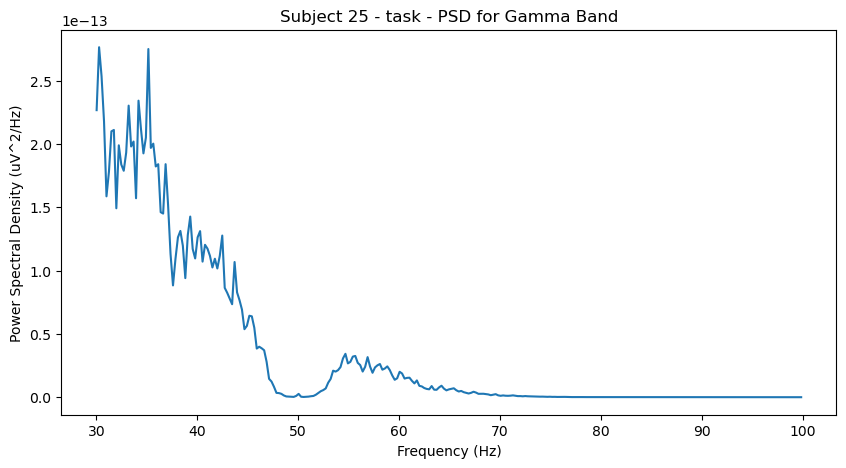

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 25/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject25_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject25_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


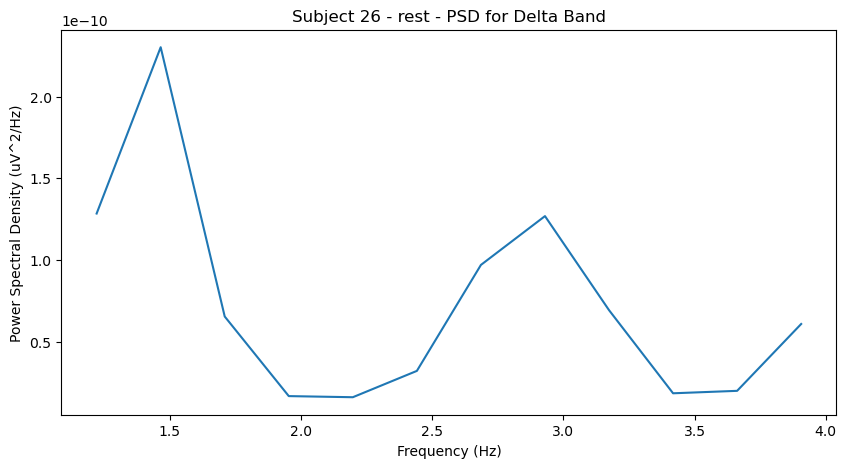

Effective window size : 4.096 (s)


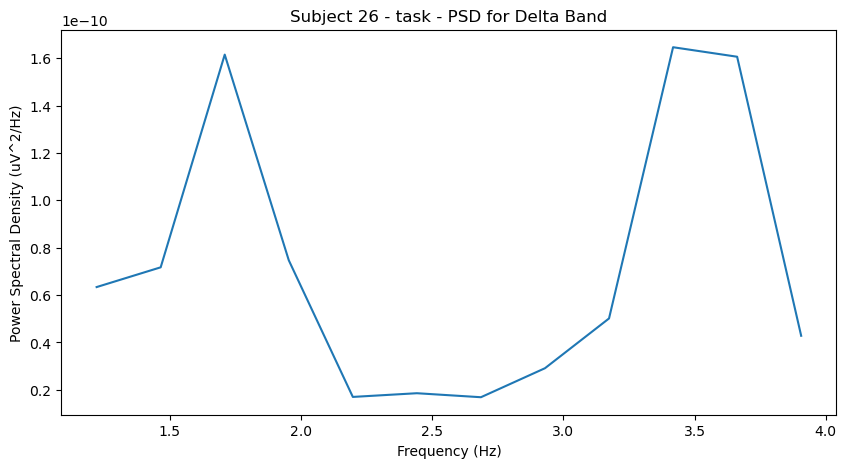

Effective window size : 4.096 (s)


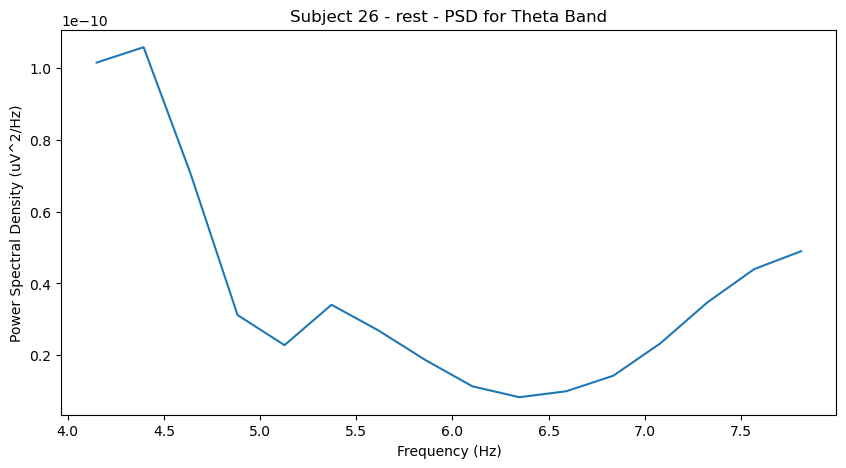

Effective window size : 4.096 (s)


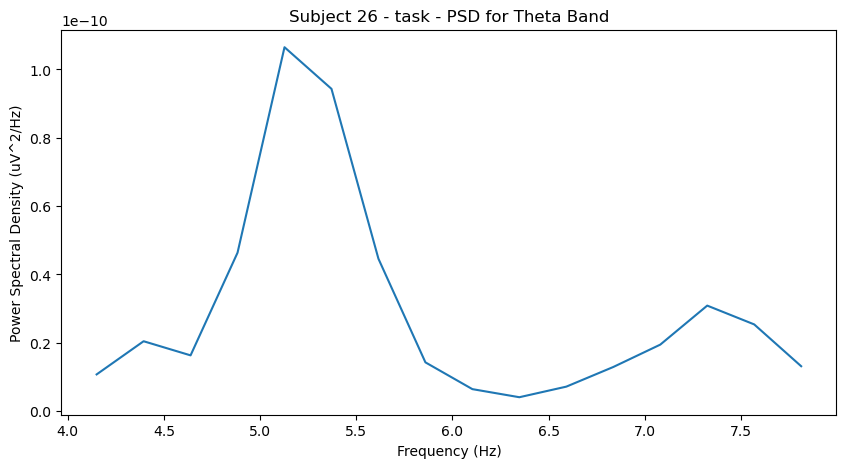

Effective window size : 4.096 (s)


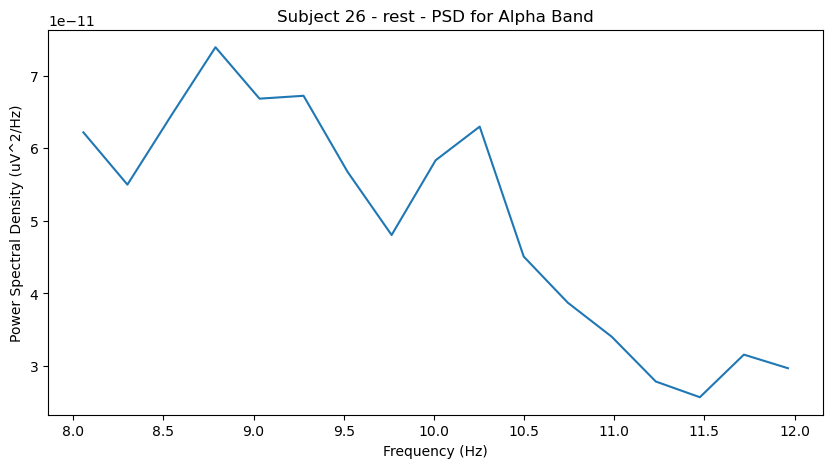

Effective window size : 4.096 (s)


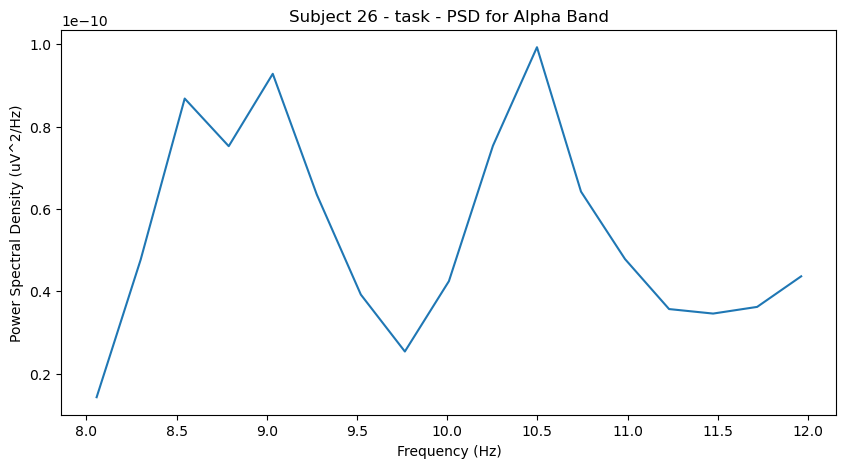

Effective window size : 4.096 (s)


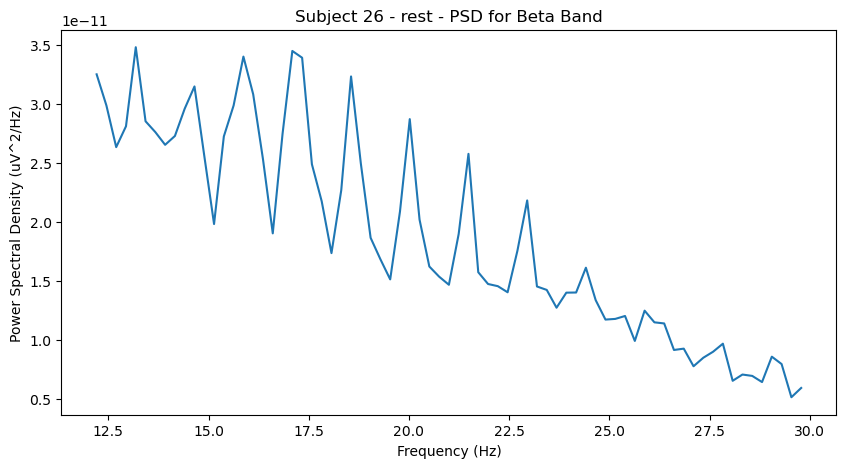

Effective window size : 4.096 (s)


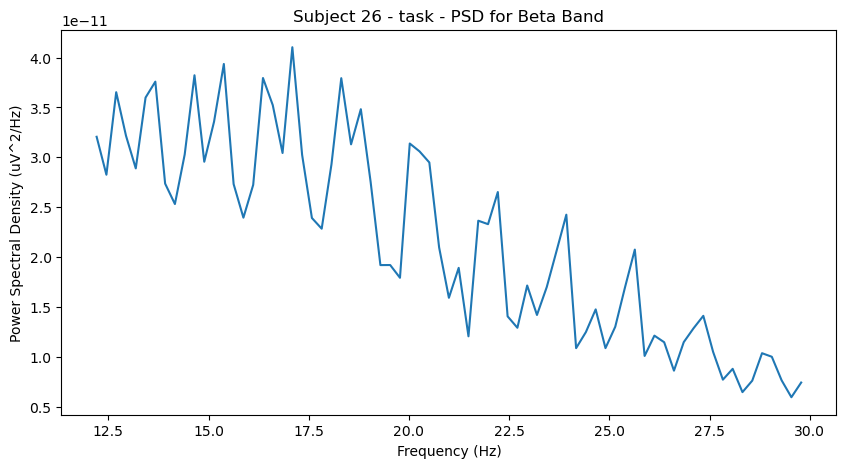

Effective window size : 4.096 (s)


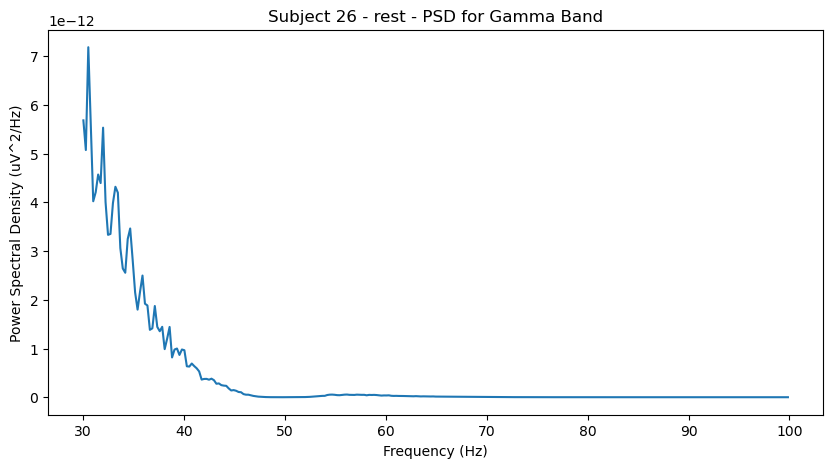

Effective window size : 4.096 (s)


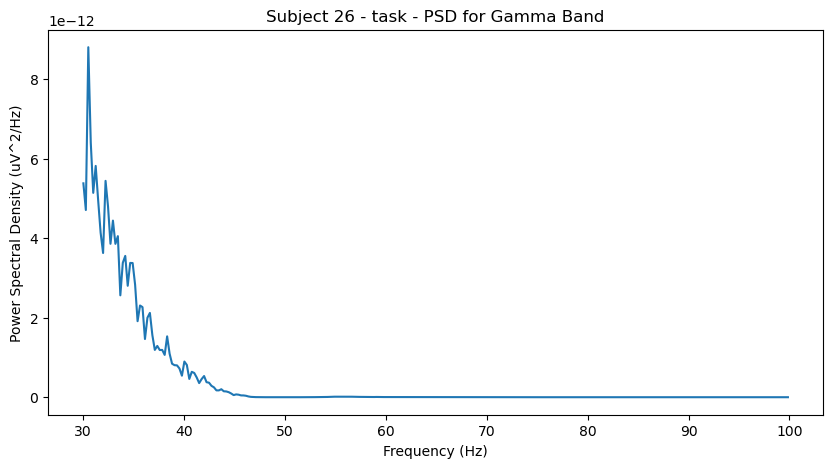

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 26/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject26_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject26_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


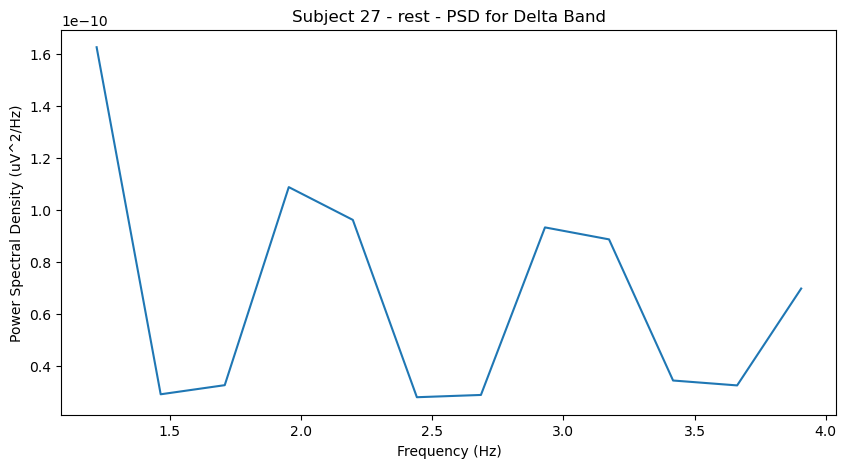

Effective window size : 4.096 (s)


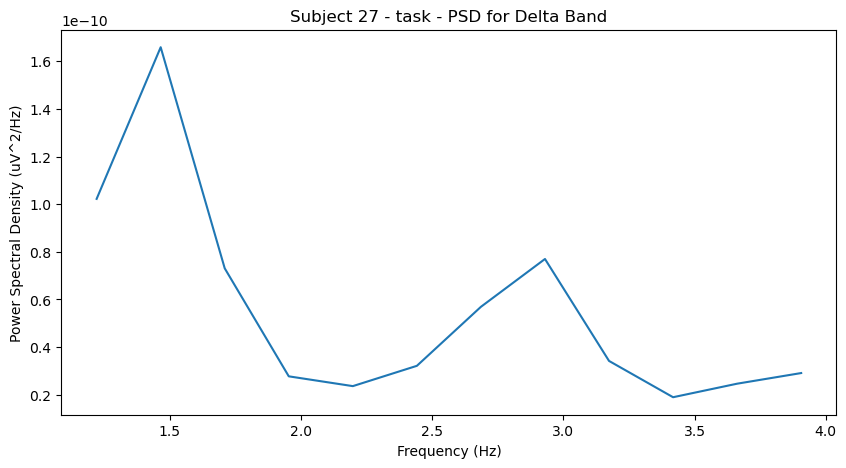

Effective window size : 4.096 (s)


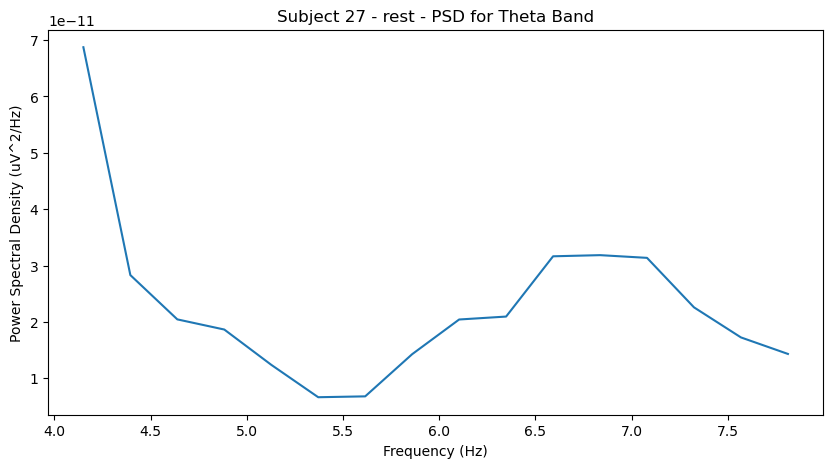

Effective window size : 4.096 (s)


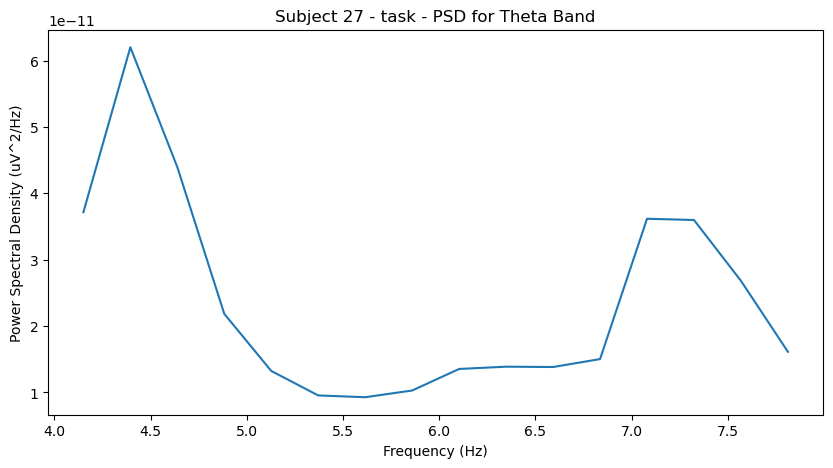

Effective window size : 4.096 (s)


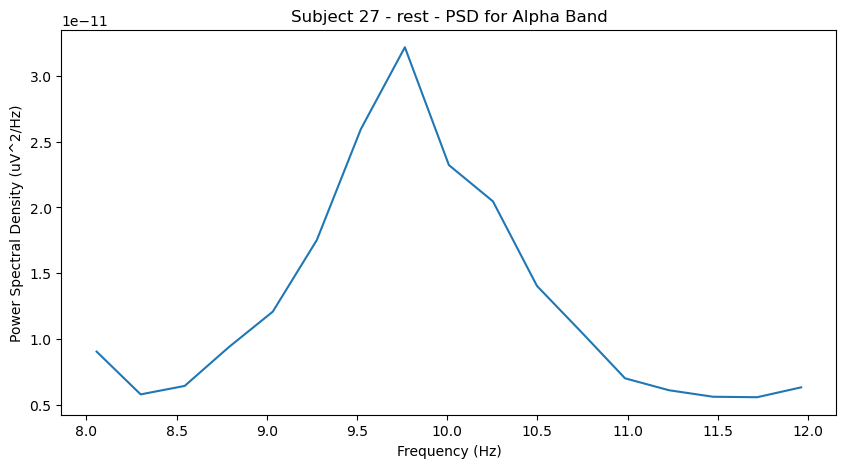

Effective window size : 4.096 (s)


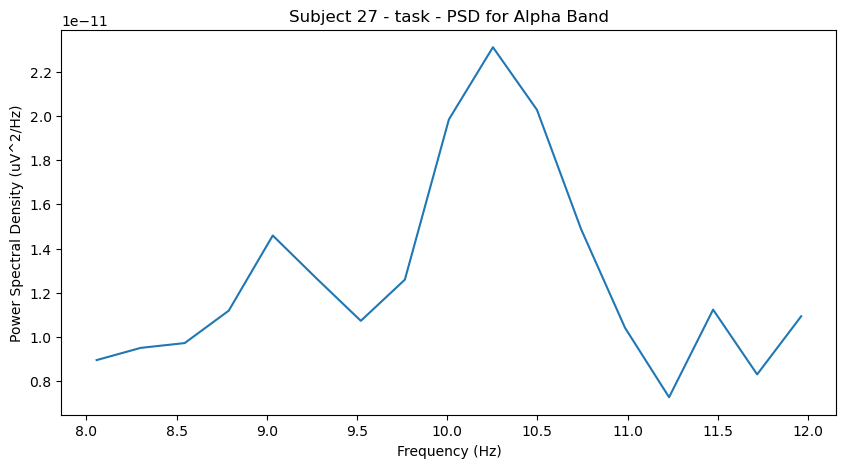

Effective window size : 4.096 (s)


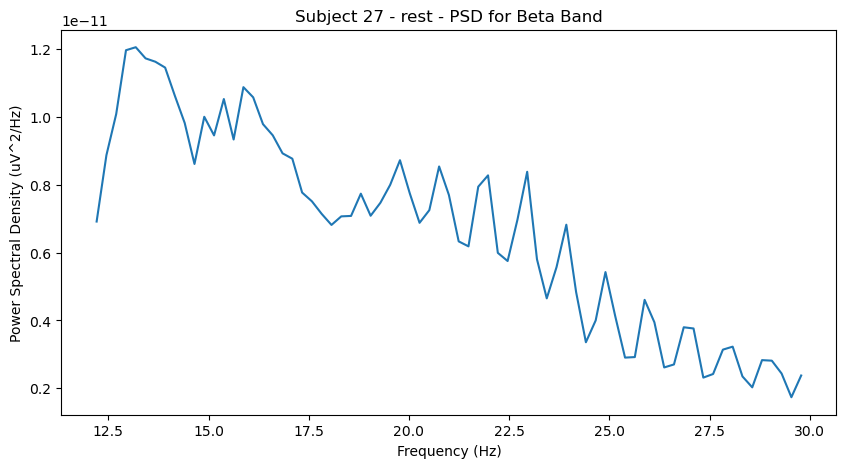

Effective window size : 4.096 (s)


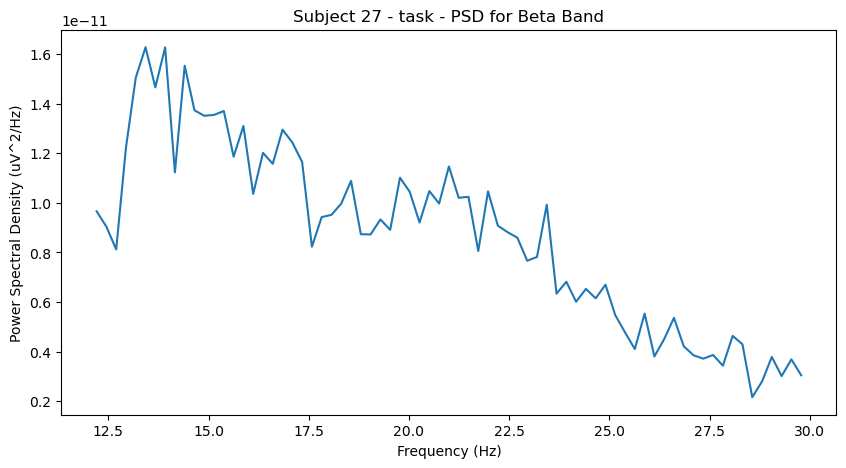

Effective window size : 4.096 (s)


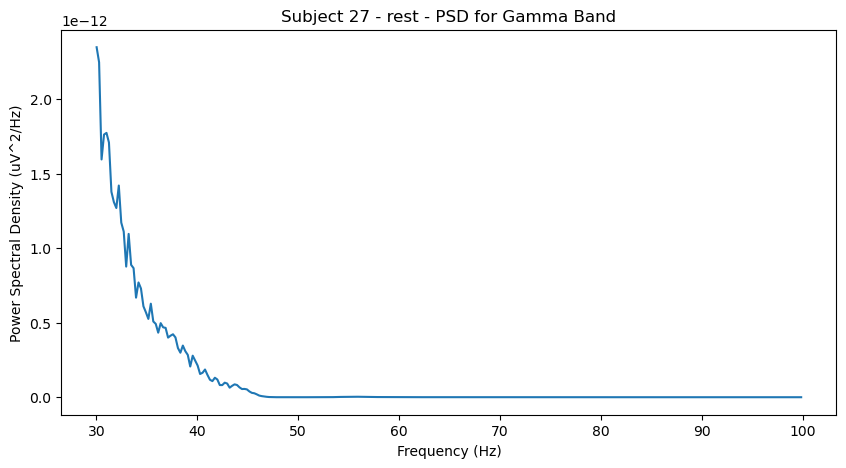

Effective window size : 4.096 (s)


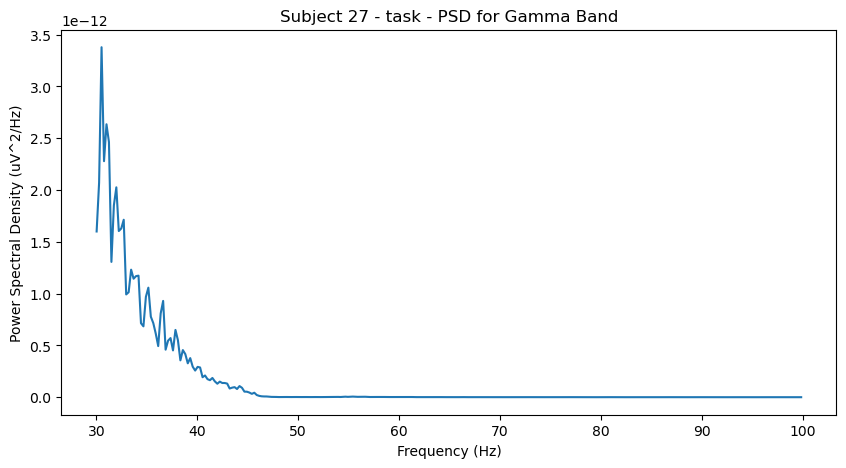

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 27/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject27_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject27_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


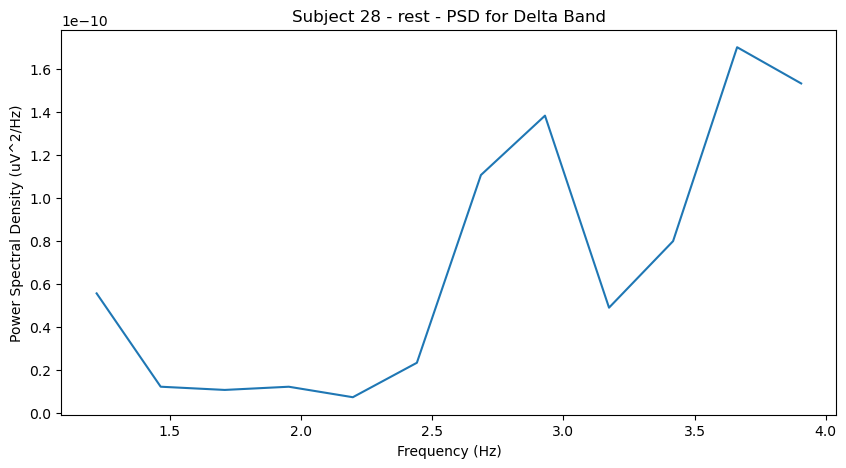

Effective window size : 4.096 (s)


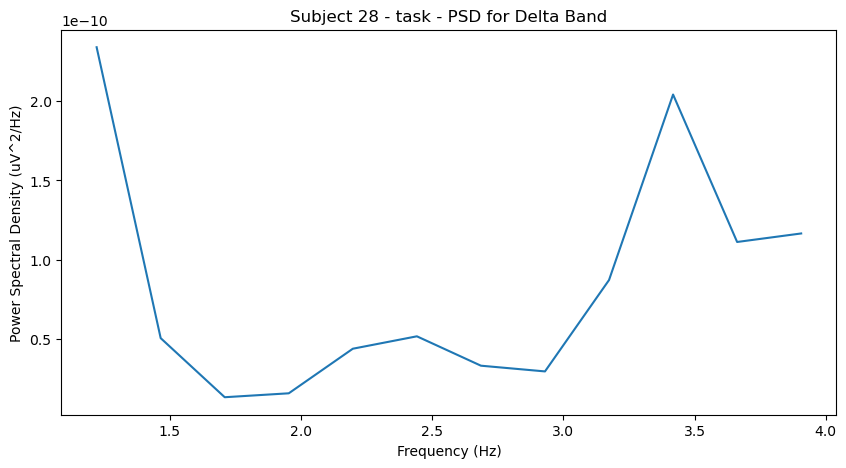

Effective window size : 4.096 (s)


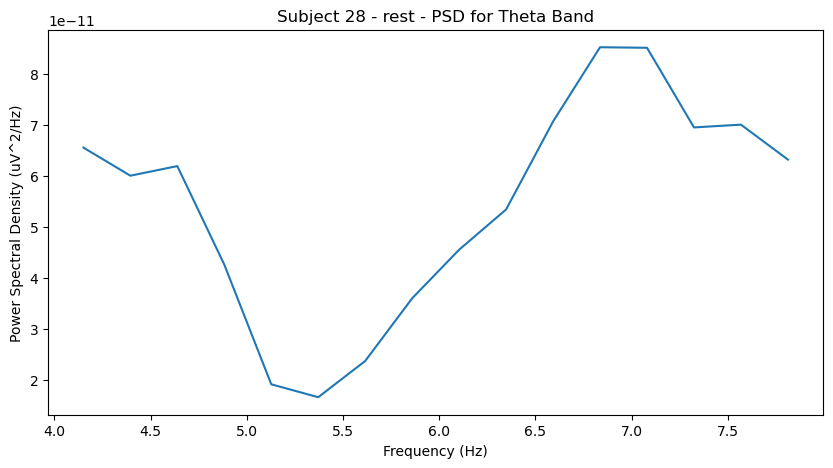

Effective window size : 4.096 (s)


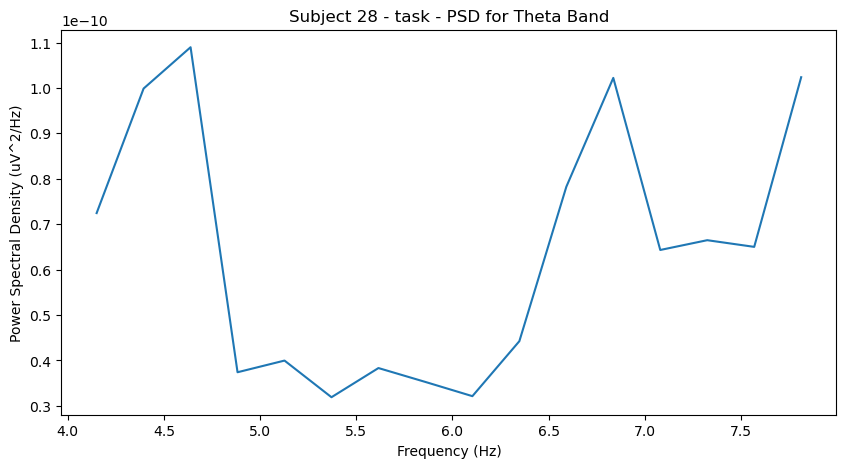

Effective window size : 4.096 (s)


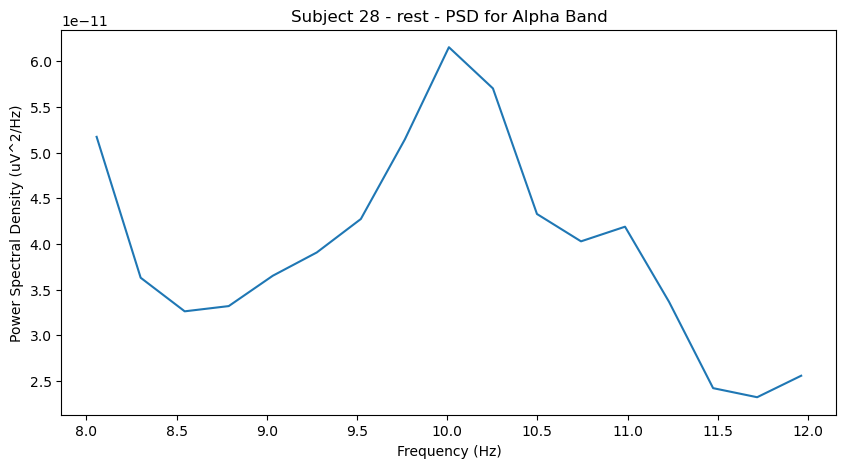

Effective window size : 4.096 (s)


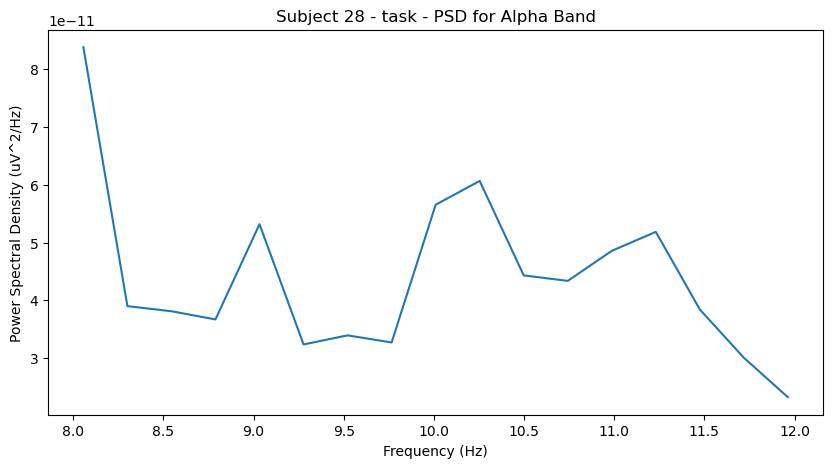

Effective window size : 4.096 (s)


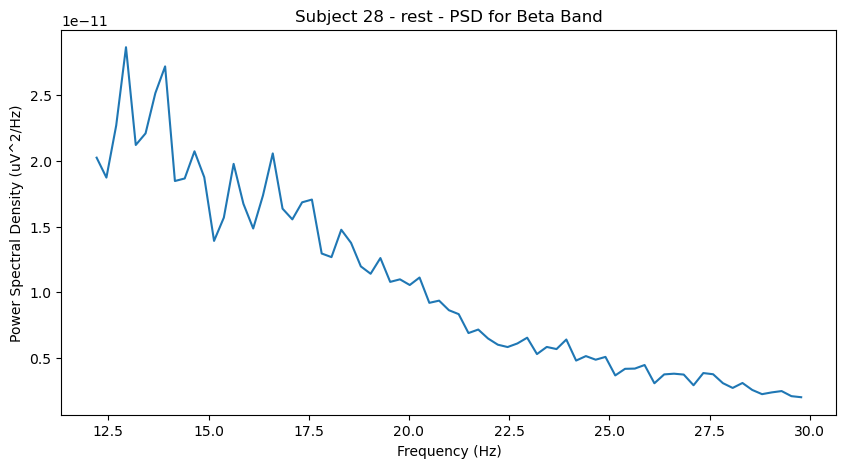

Effective window size : 4.096 (s)


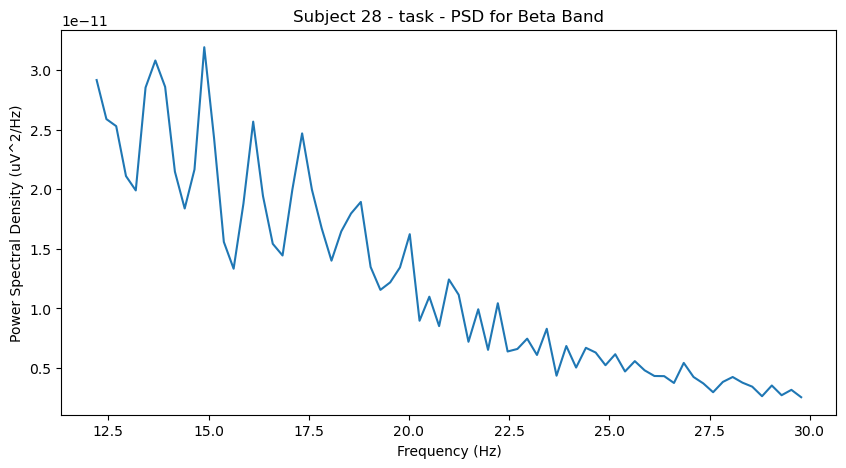

Effective window size : 4.096 (s)


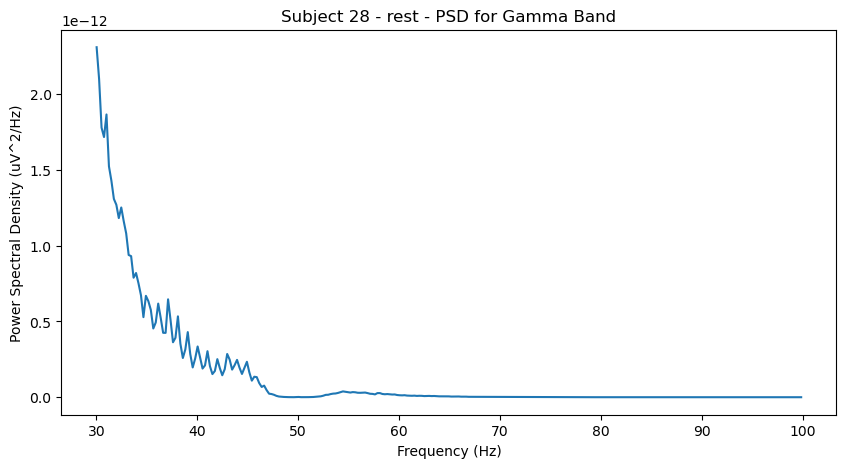

Effective window size : 4.096 (s)


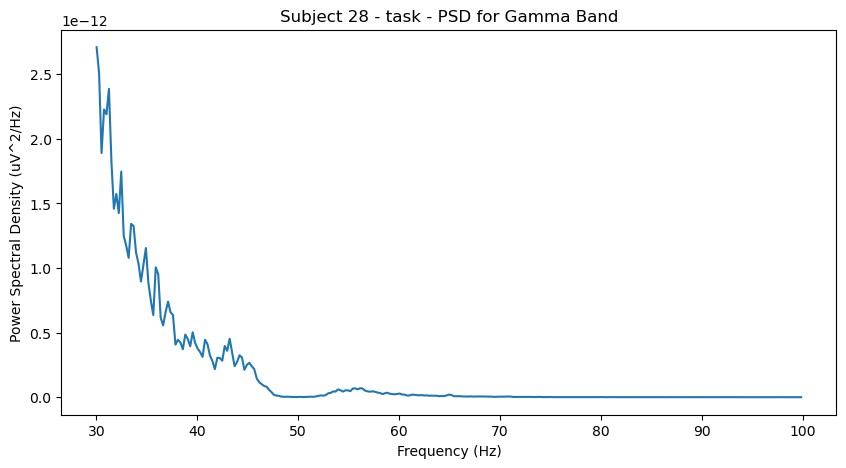

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 28/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject28_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject28_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


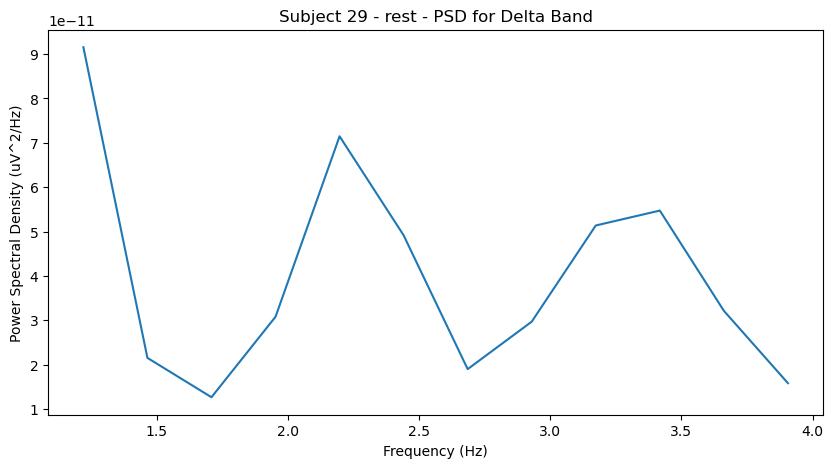

Effective window size : 4.096 (s)


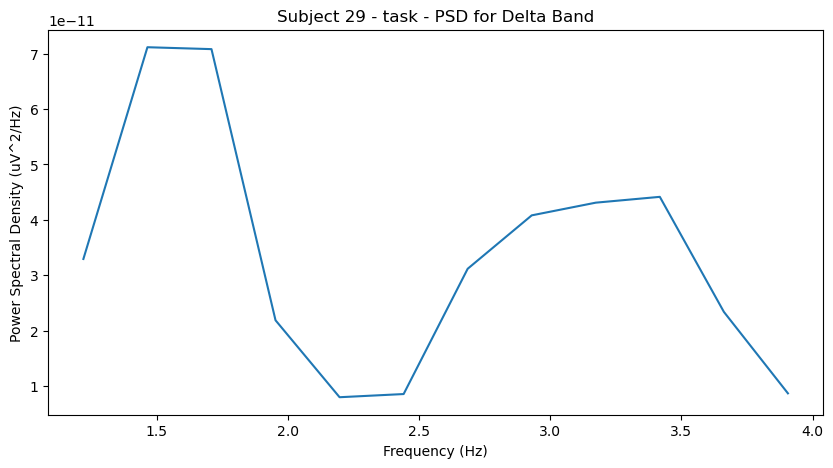

Effective window size : 4.096 (s)


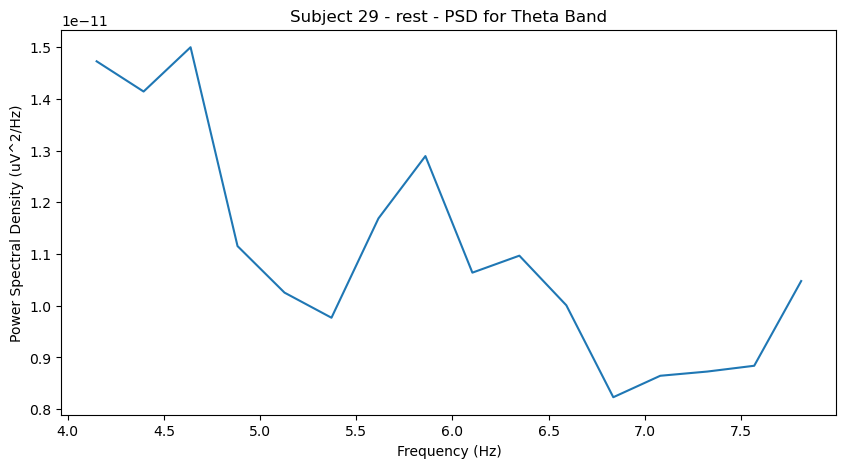

Effective window size : 4.096 (s)


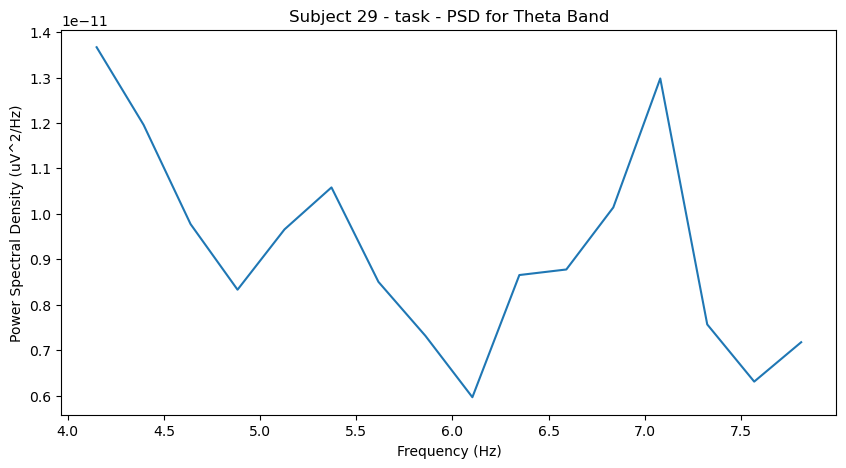

Effective window size : 4.096 (s)


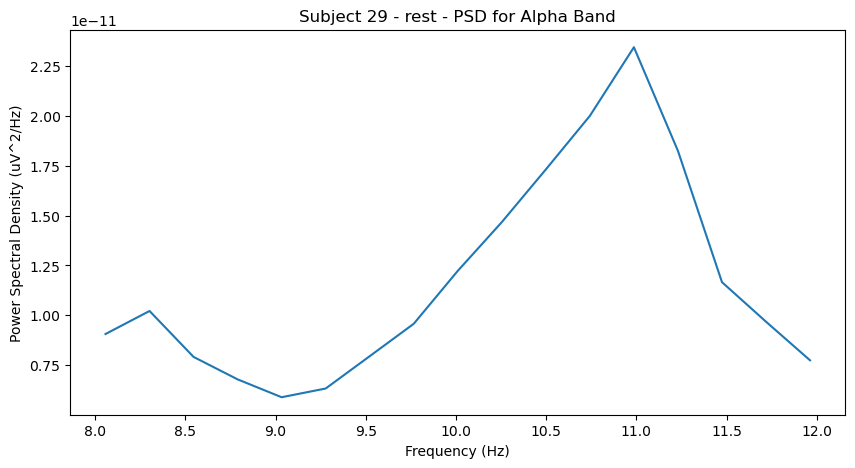

Effective window size : 4.096 (s)


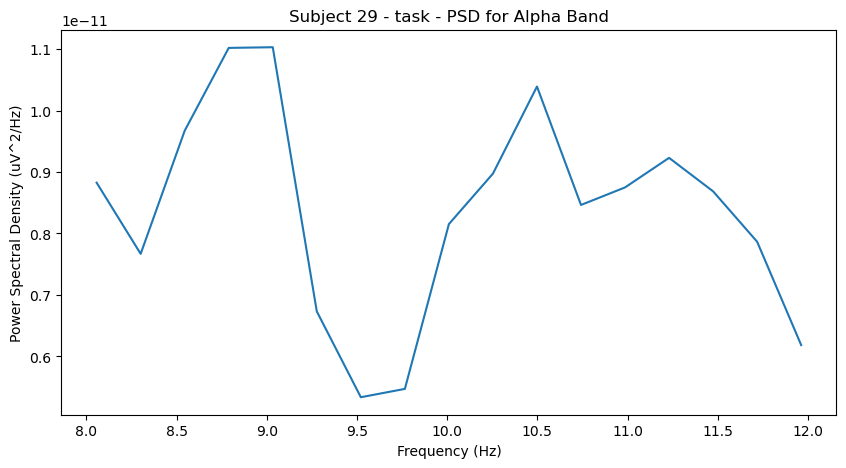

Effective window size : 4.096 (s)


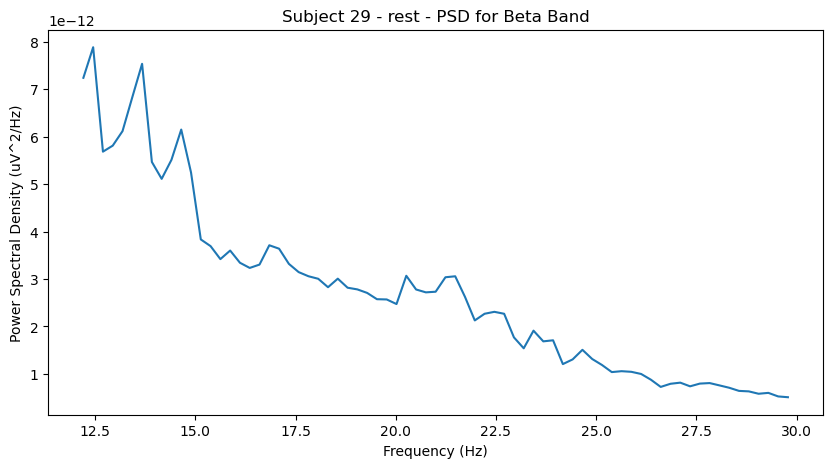

Effective window size : 4.096 (s)


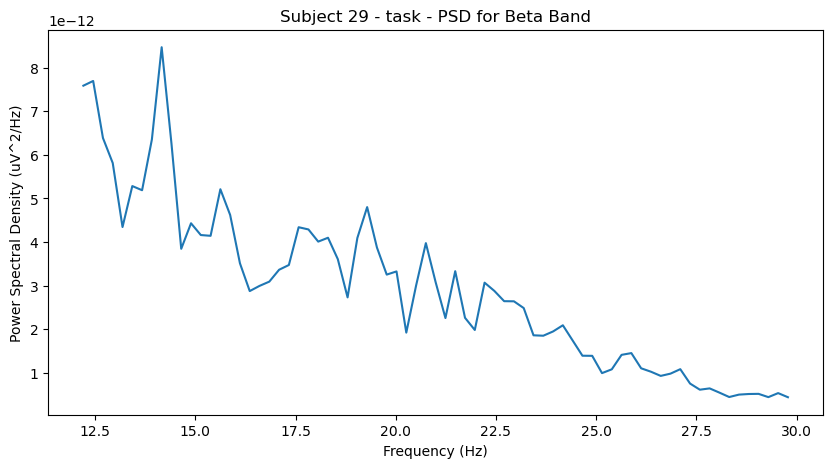

Effective window size : 4.096 (s)


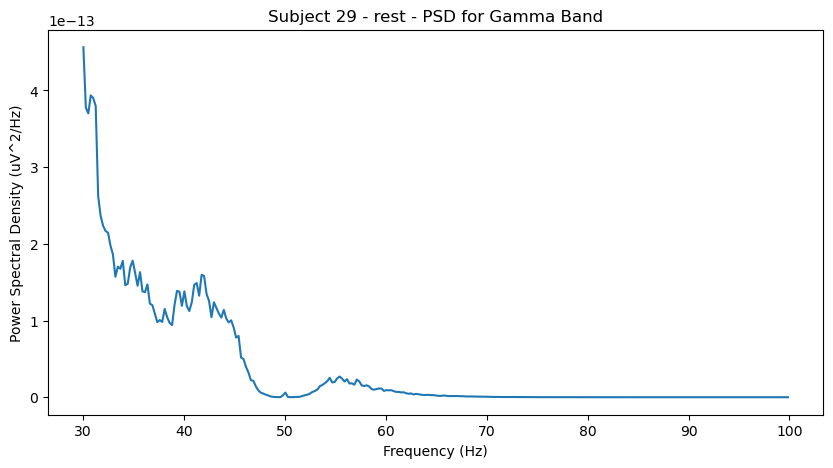

Effective window size : 4.096 (s)


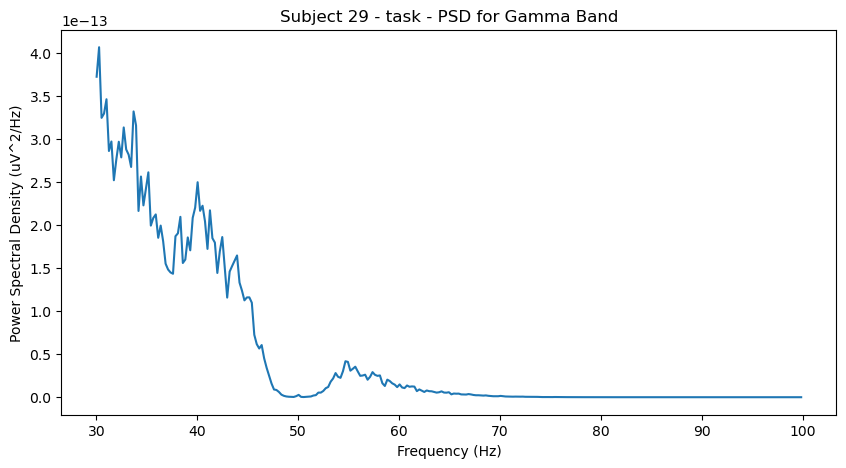

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 29/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject29_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject29_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


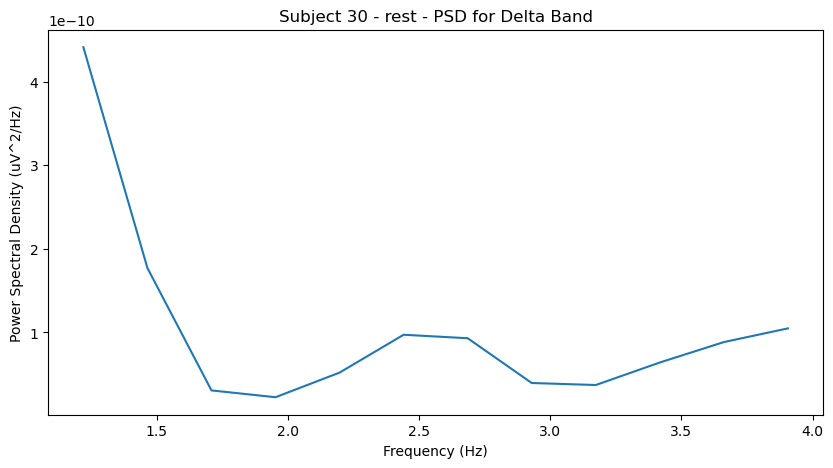

Effective window size : 4.096 (s)


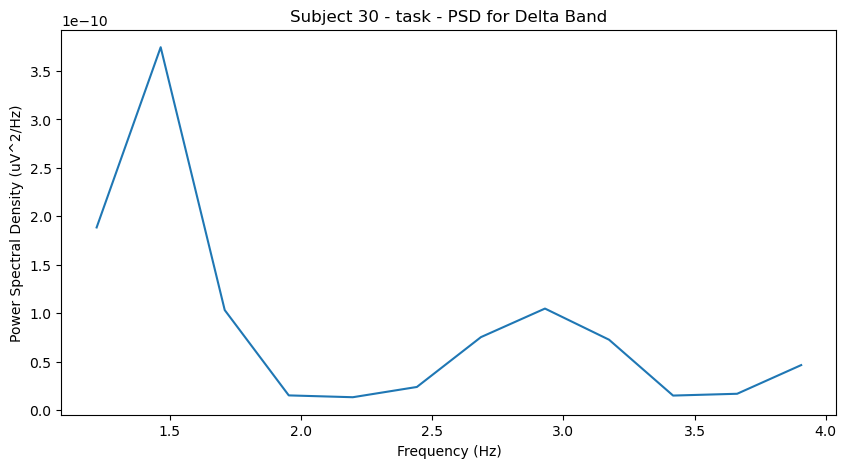

Effective window size : 4.096 (s)


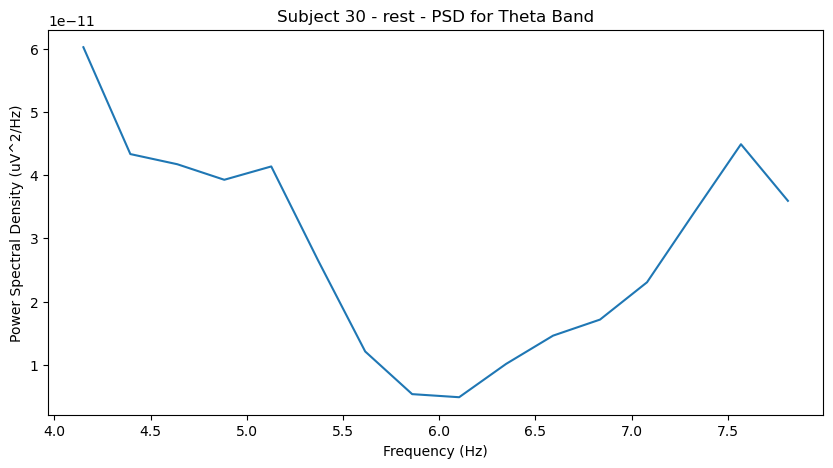

Effective window size : 4.096 (s)


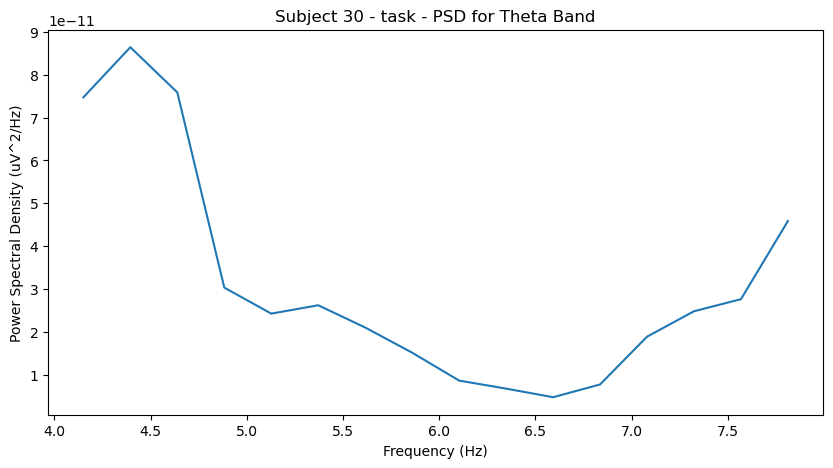

Effective window size : 4.096 (s)


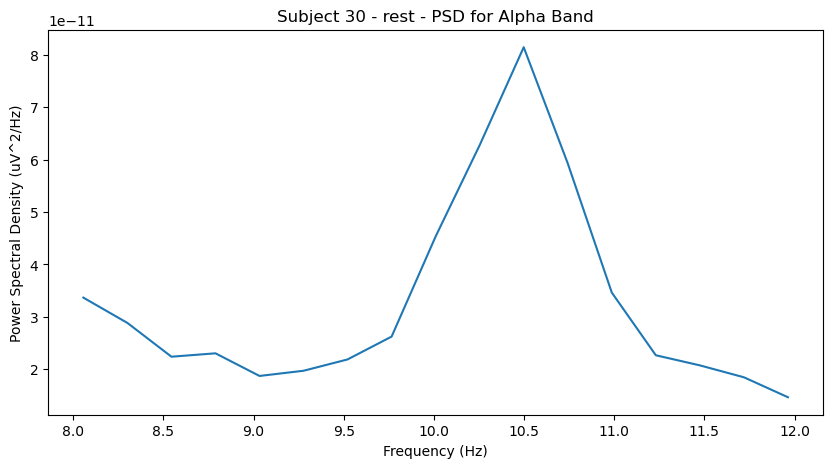

Effective window size : 4.096 (s)


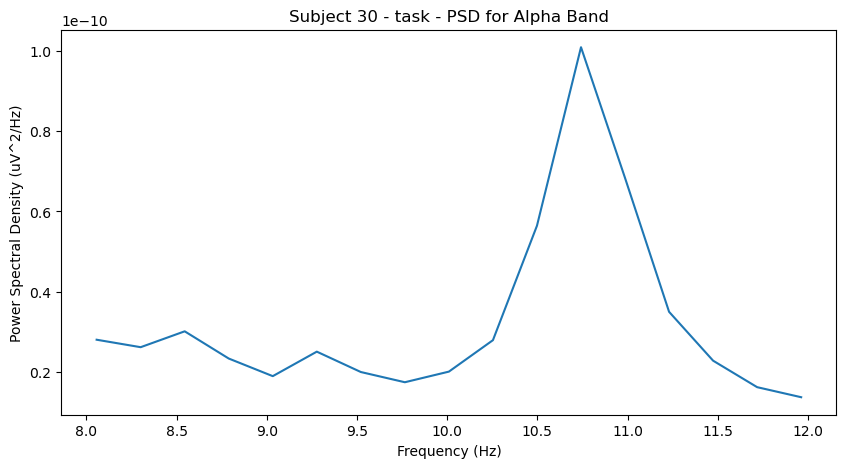

Effective window size : 4.096 (s)


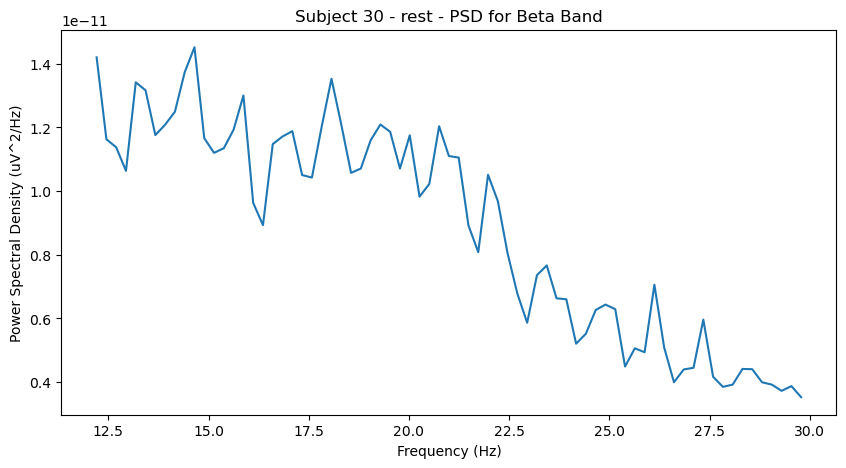

Effective window size : 4.096 (s)


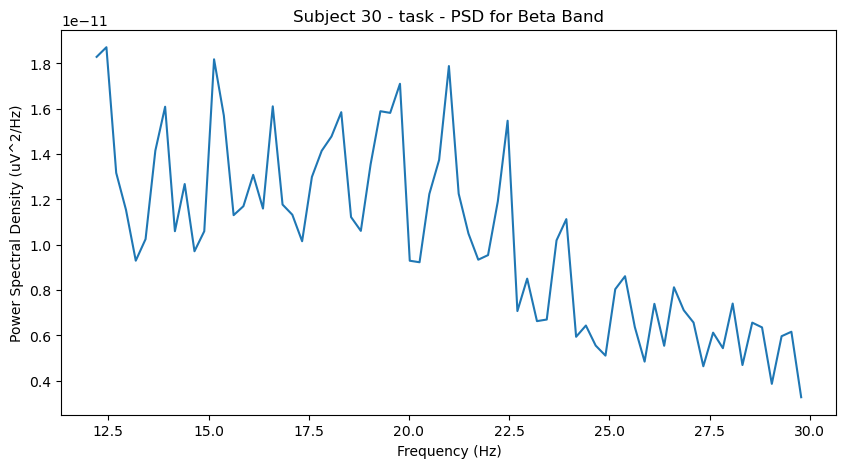

Effective window size : 4.096 (s)


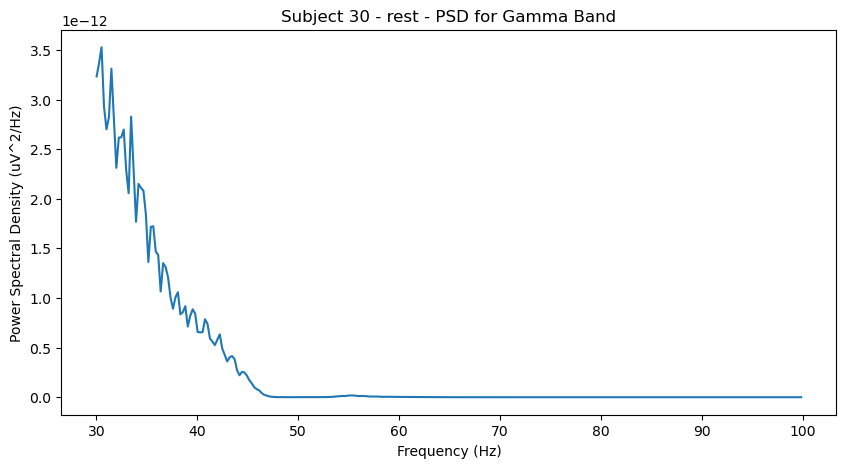

Effective window size : 4.096 (s)


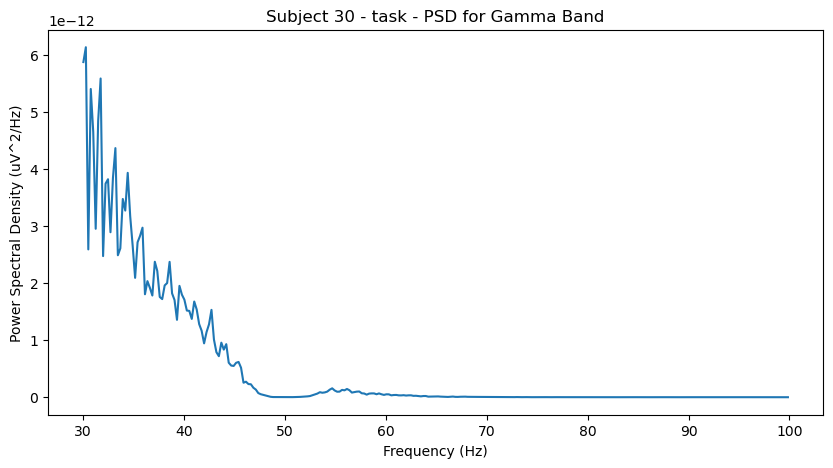

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 30/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject30_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject30_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


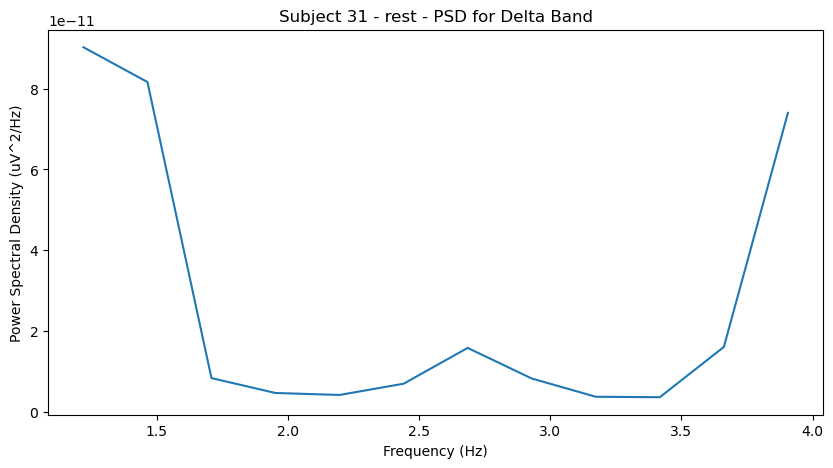

Effective window size : 4.096 (s)


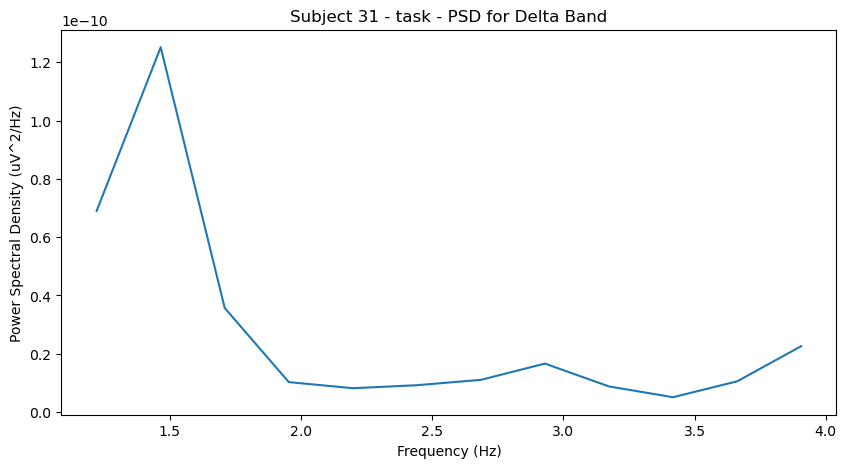

Effective window size : 4.096 (s)


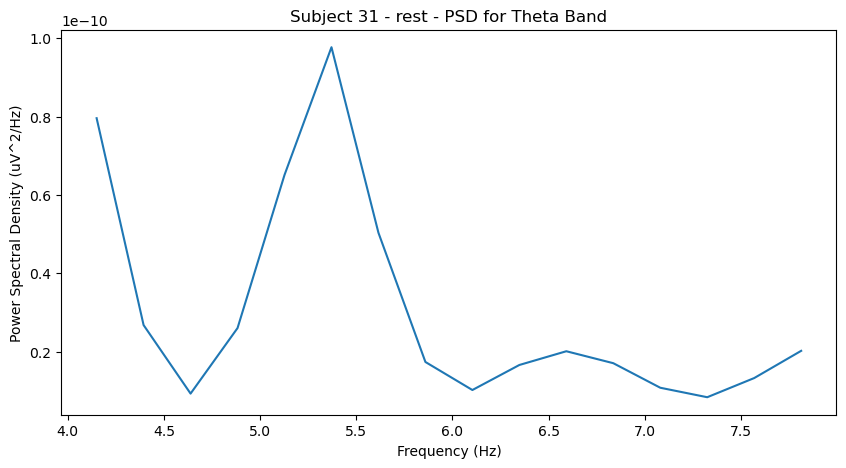

Effective window size : 4.096 (s)


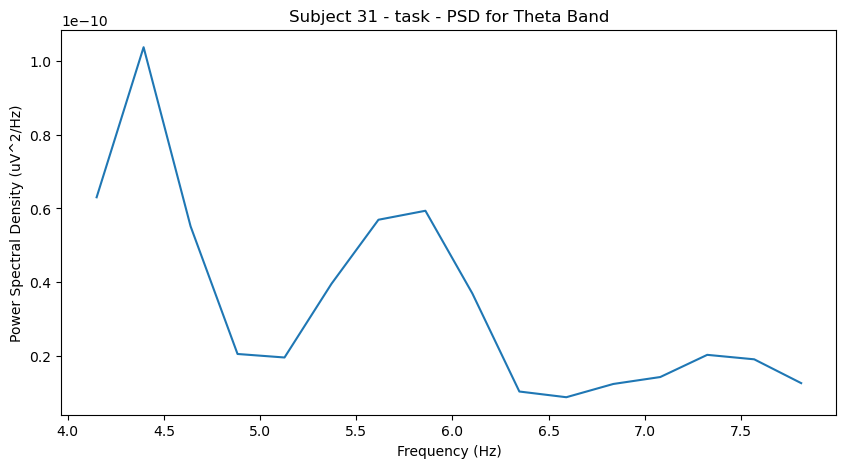

Effective window size : 4.096 (s)


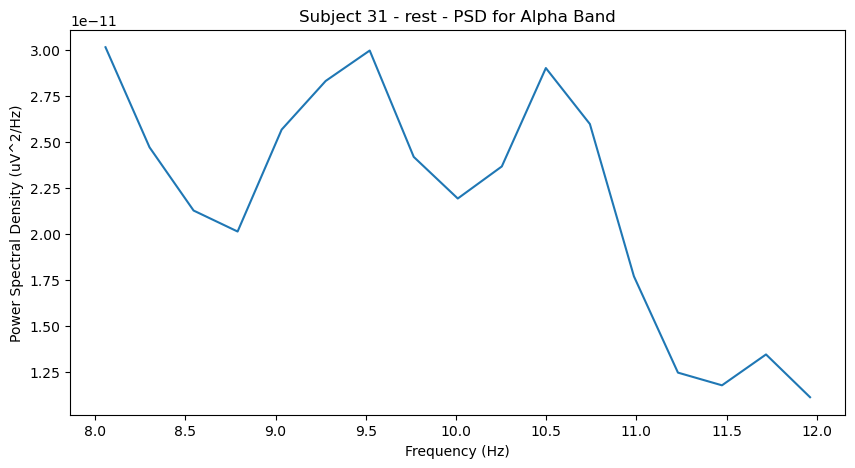

Effective window size : 4.096 (s)


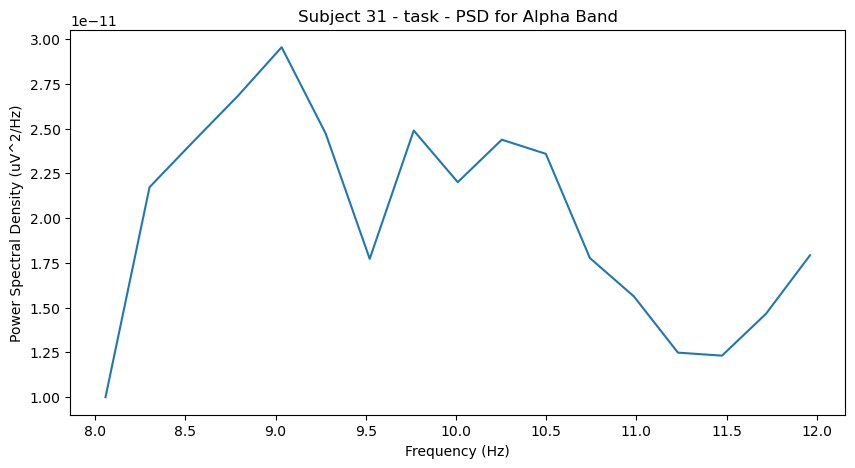

Effective window size : 4.096 (s)


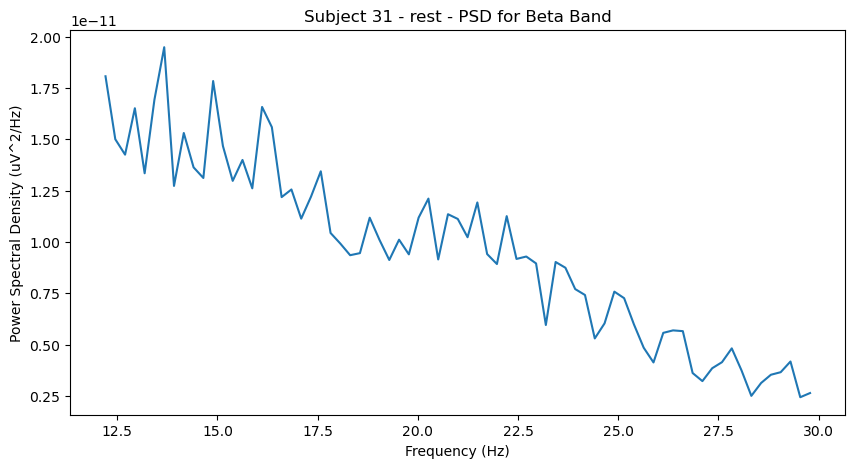

Effective window size : 4.096 (s)


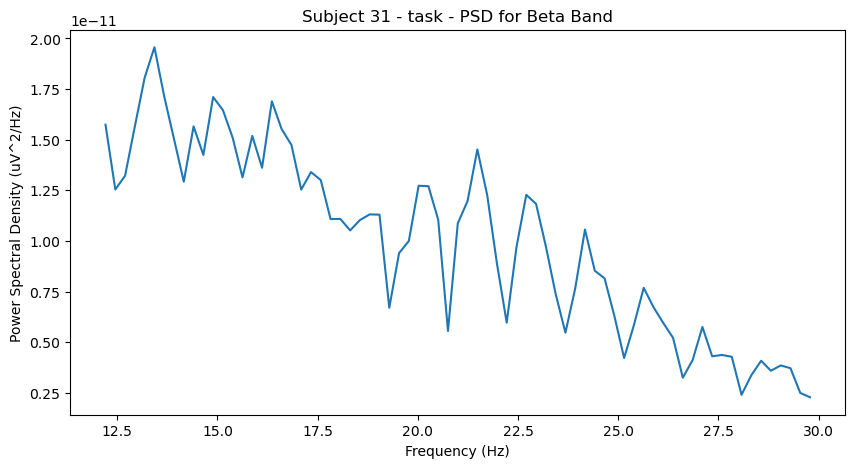

Effective window size : 4.096 (s)


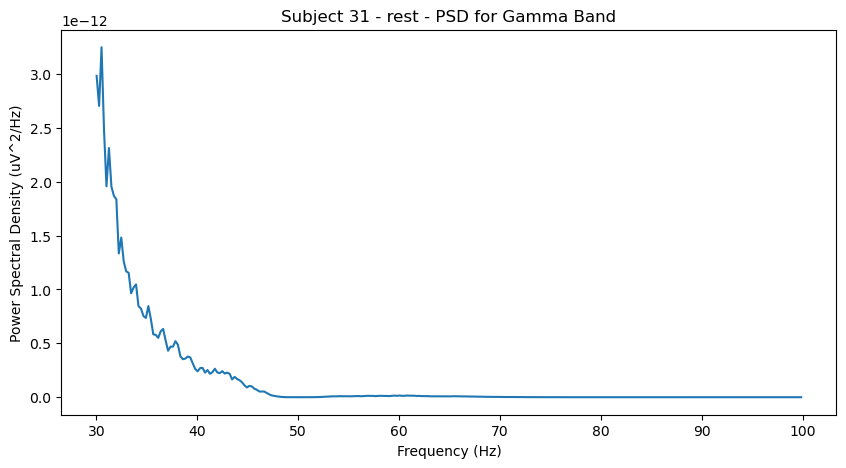

Effective window size : 4.096 (s)


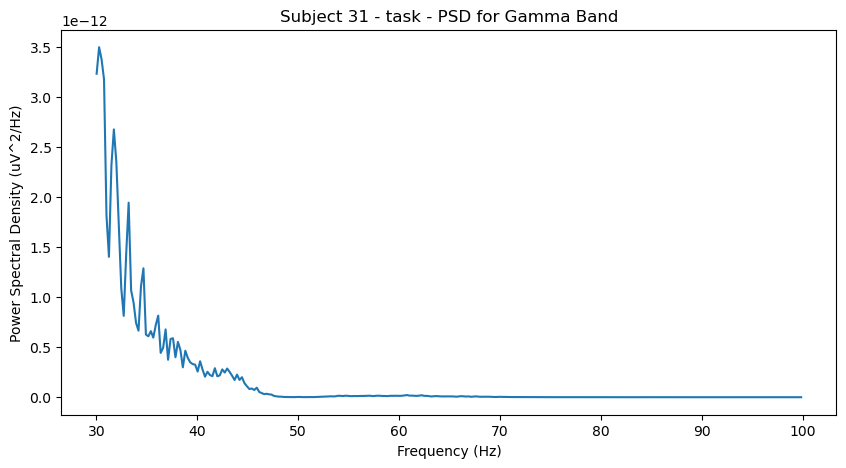

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 31/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject31_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 39999  =      0.000 ...    79.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject31_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


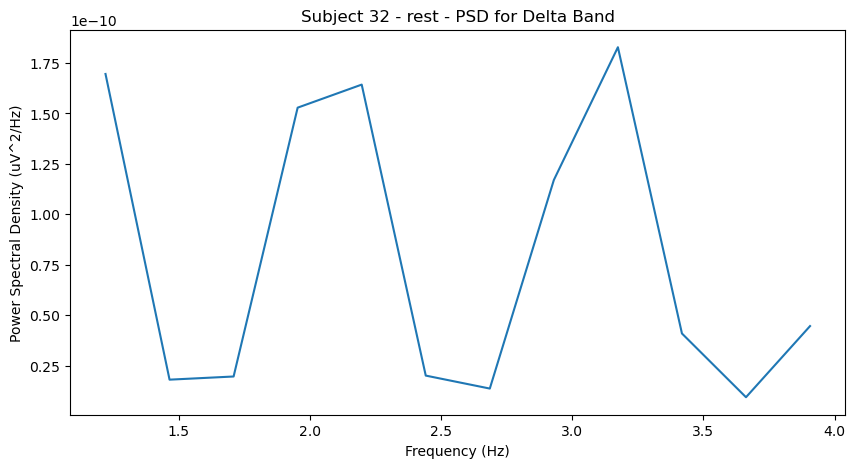

Effective window size : 4.096 (s)


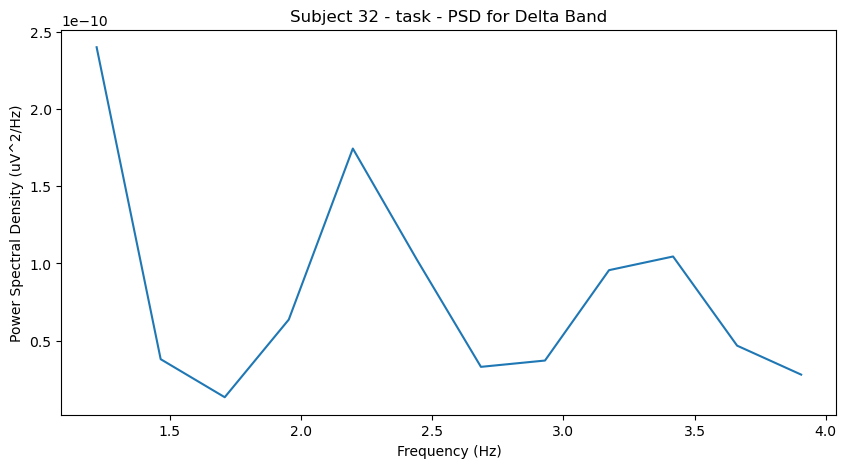

Effective window size : 4.096 (s)


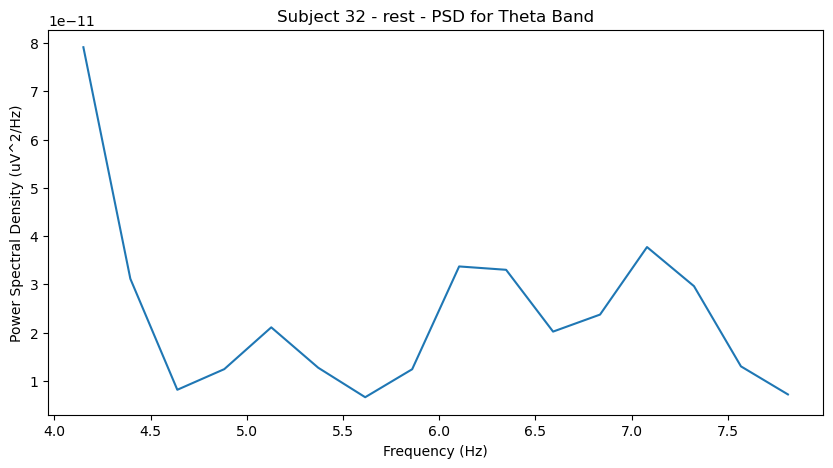

Effective window size : 4.096 (s)


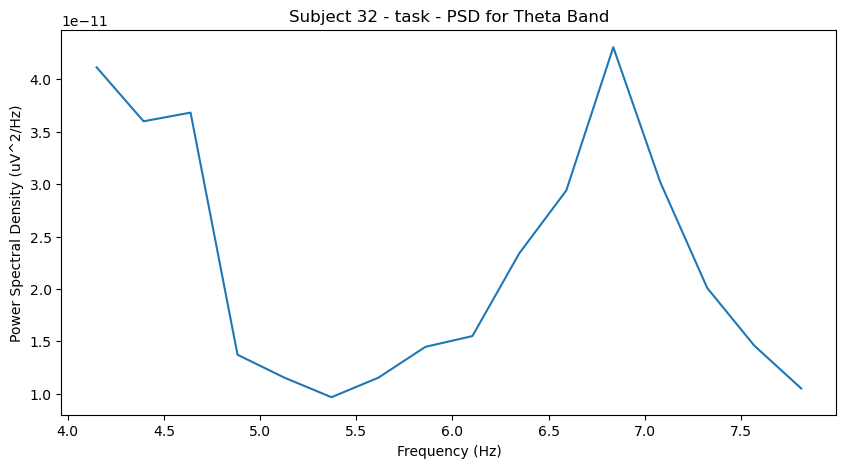

Effective window size : 4.096 (s)


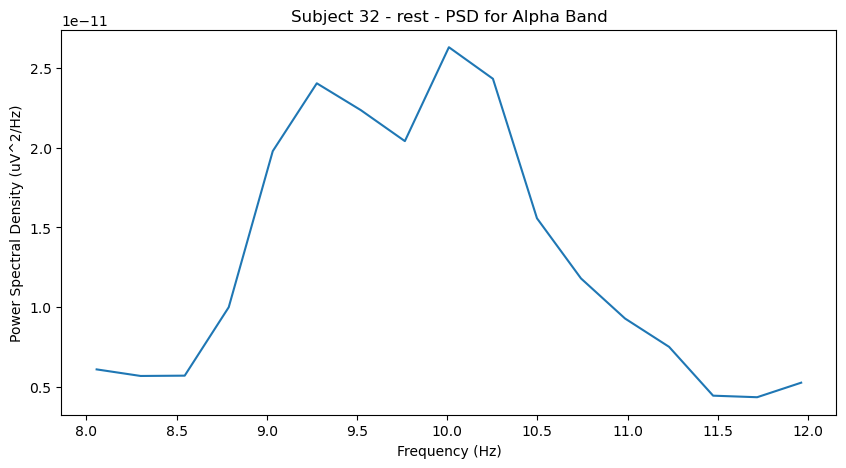

Effective window size : 4.096 (s)


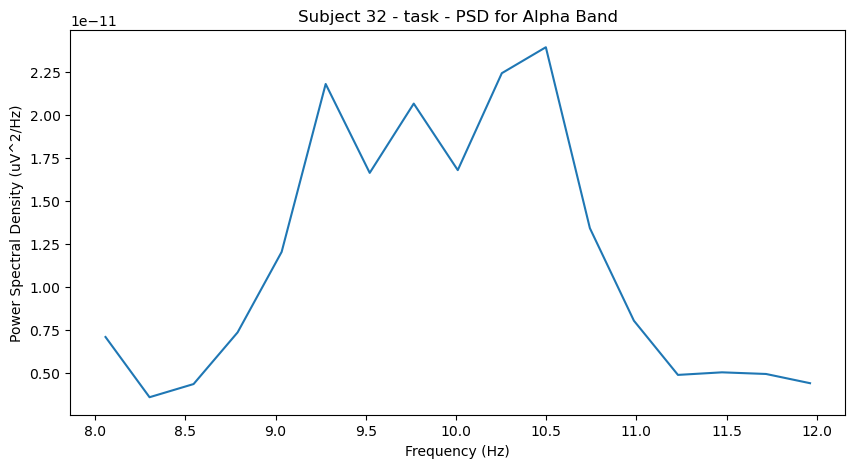

Effective window size : 4.096 (s)


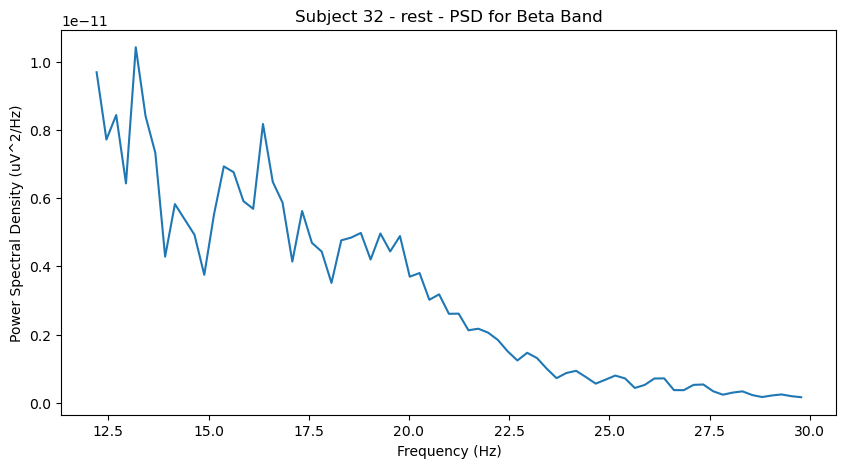

Effective window size : 4.096 (s)


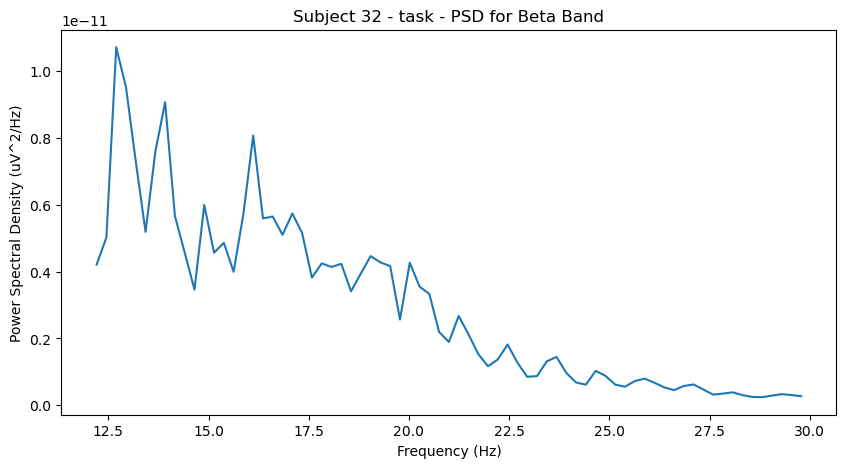

Effective window size : 4.096 (s)


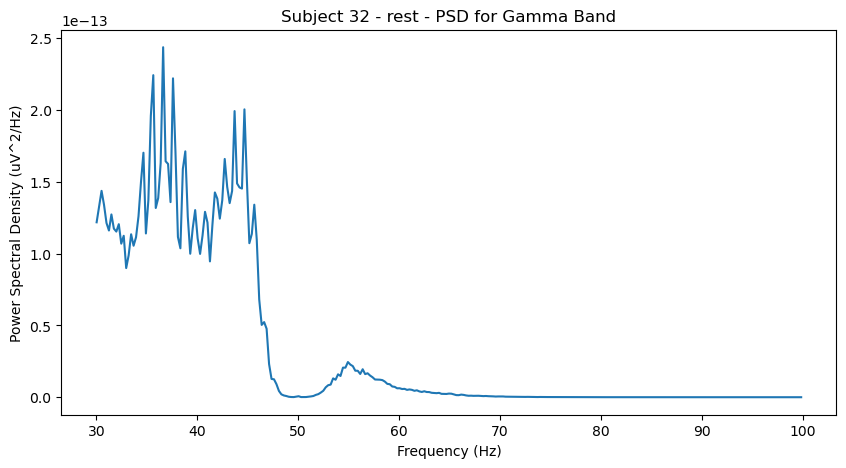

Effective window size : 4.096 (s)


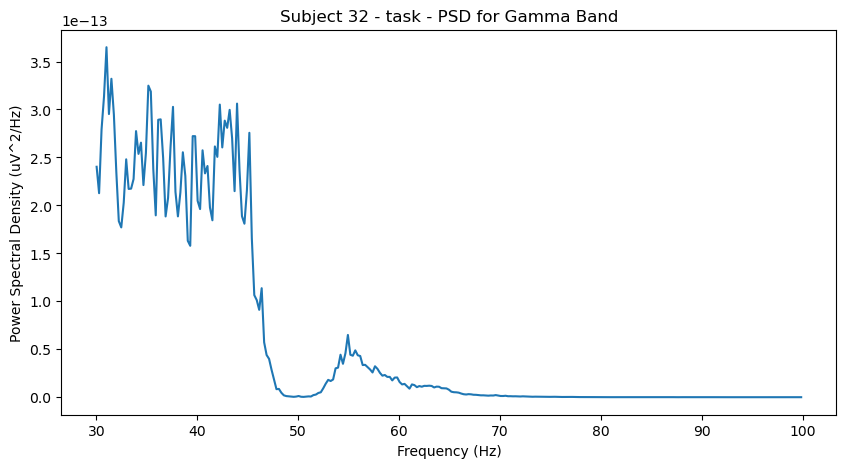

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 32/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject32_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject32_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


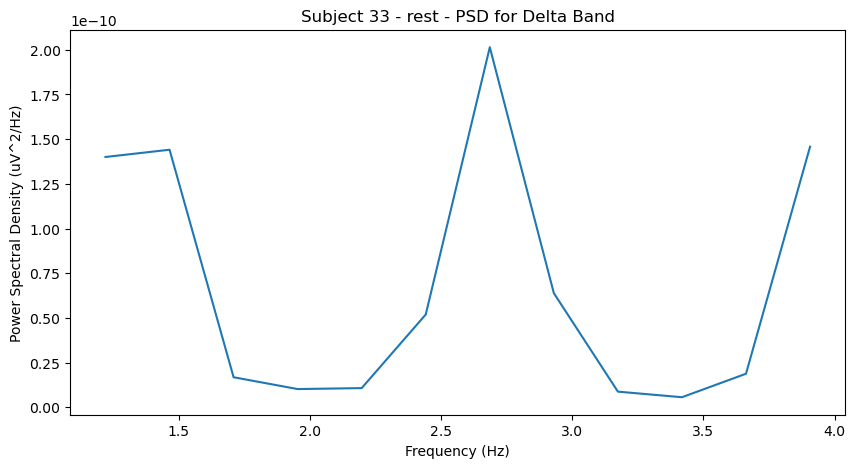

Effective window size : 4.096 (s)


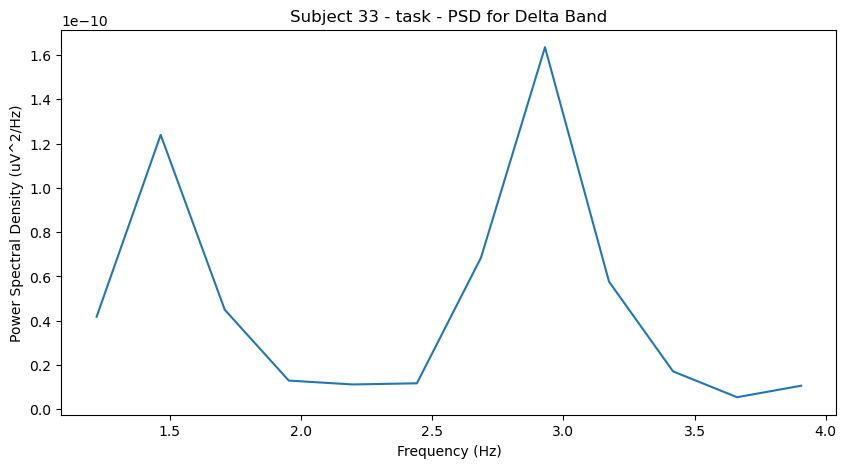

Effective window size : 4.096 (s)


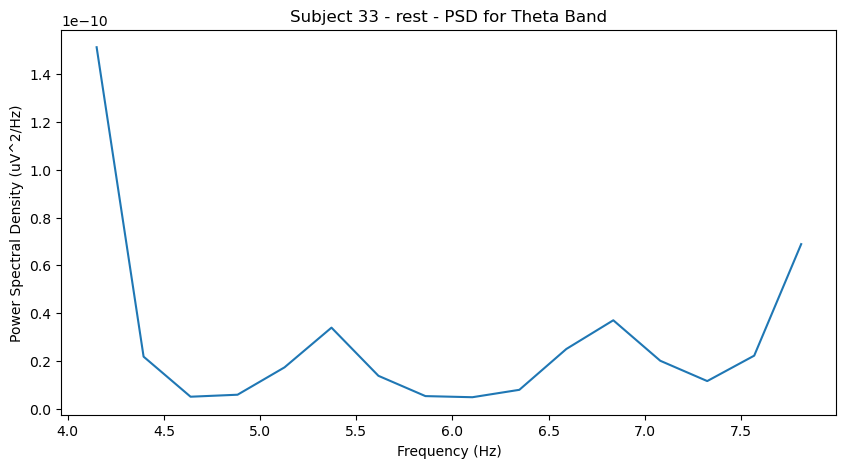

Effective window size : 4.096 (s)


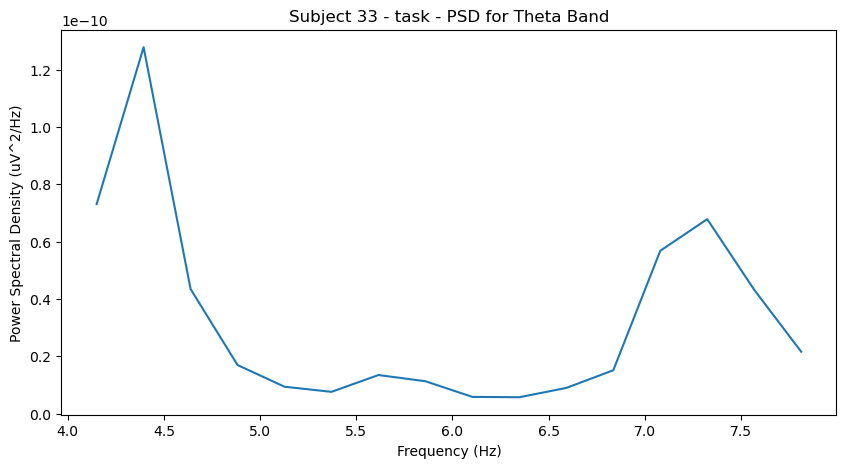

Effective window size : 4.096 (s)


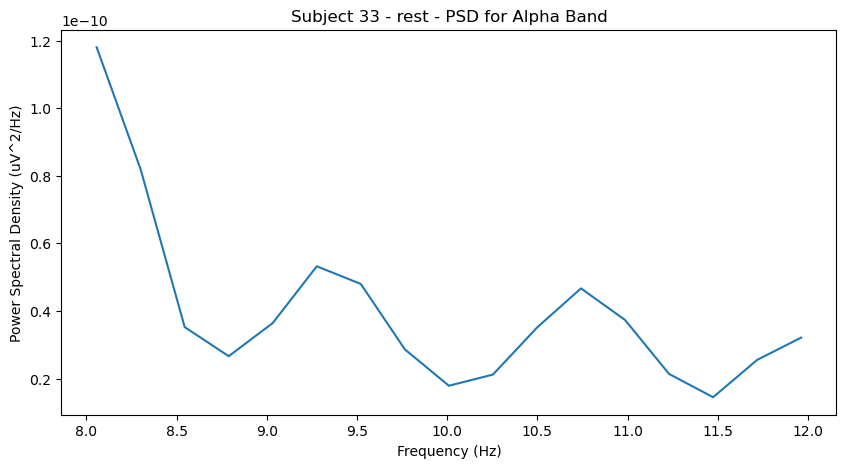

Effective window size : 4.096 (s)


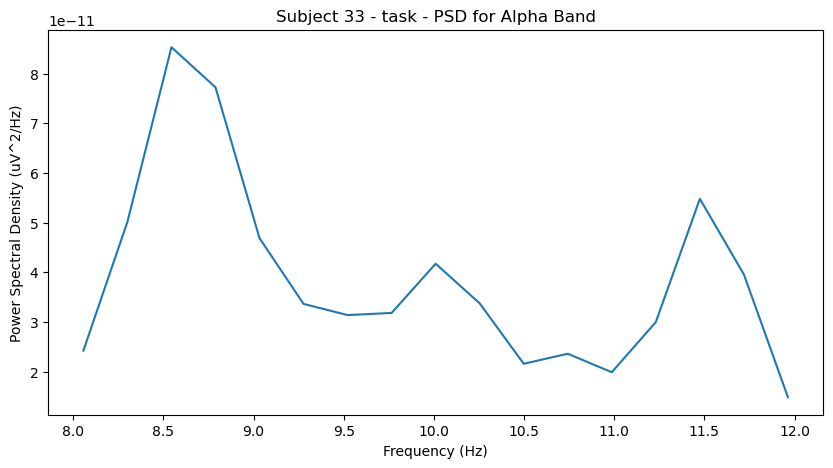

Effective window size : 4.096 (s)


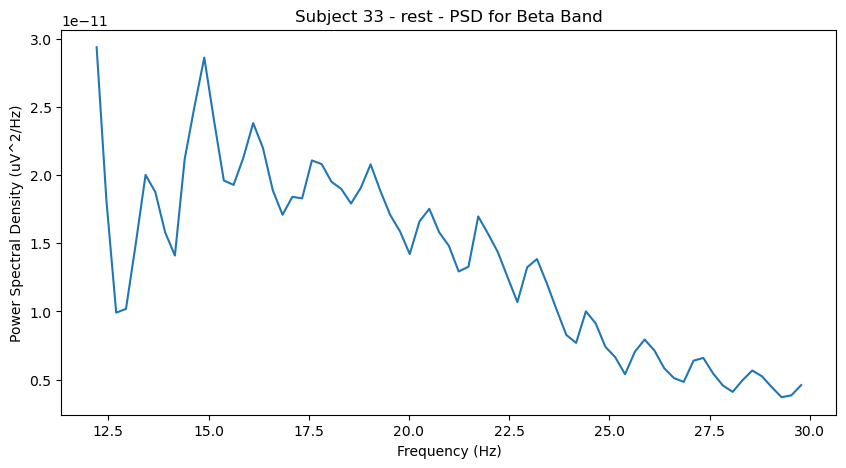

Effective window size : 4.096 (s)


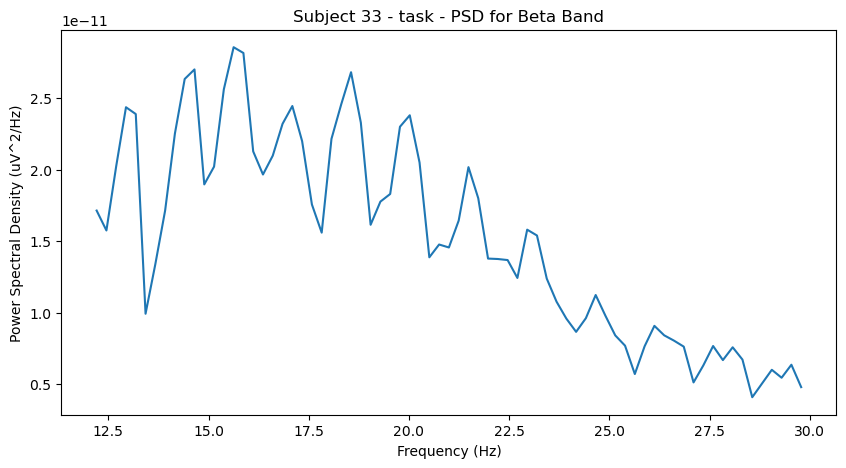

Effective window size : 4.096 (s)


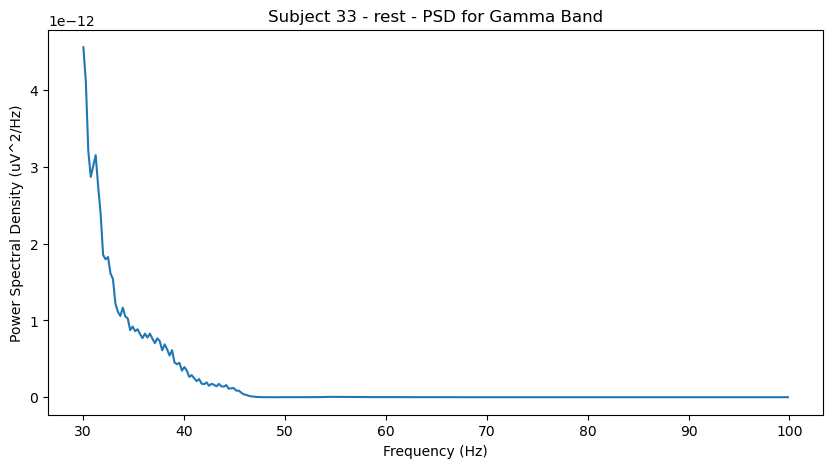

Effective window size : 4.096 (s)


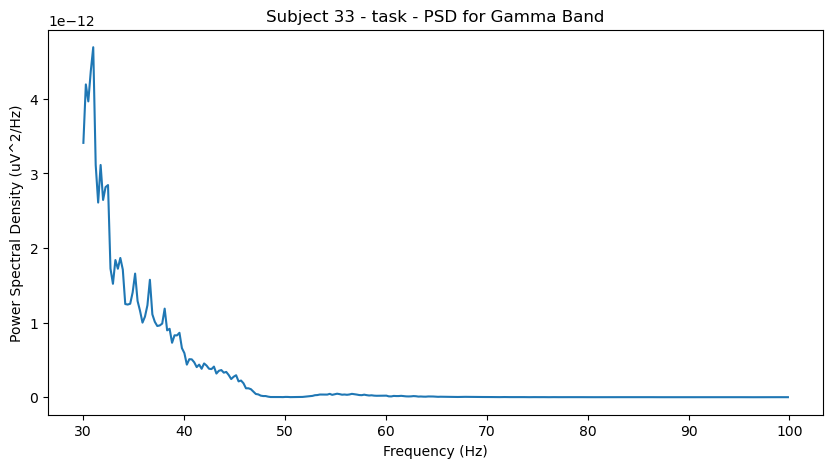

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 33/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject33_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject33_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


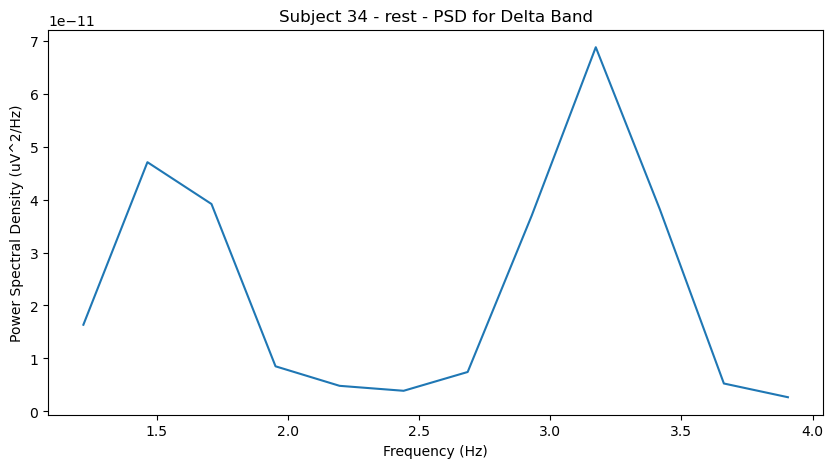

Effective window size : 4.096 (s)


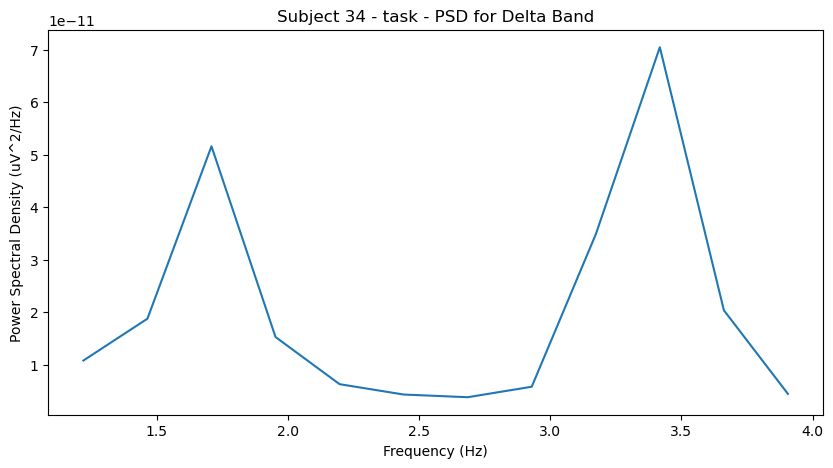

Effective window size : 4.096 (s)


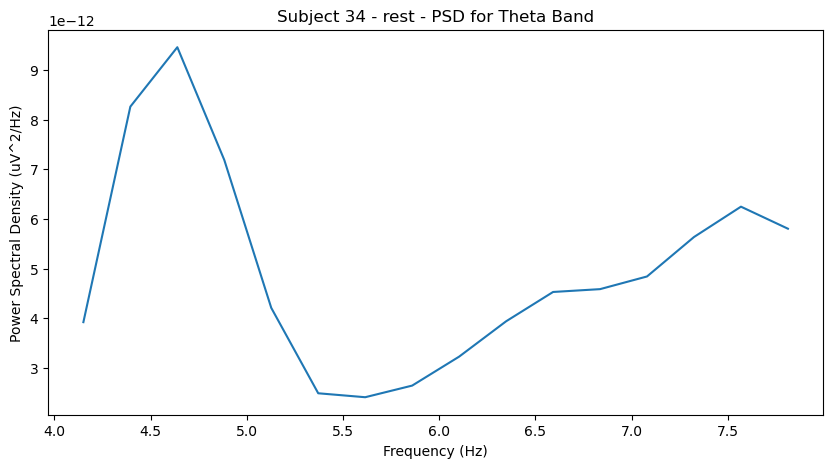

Effective window size : 4.096 (s)


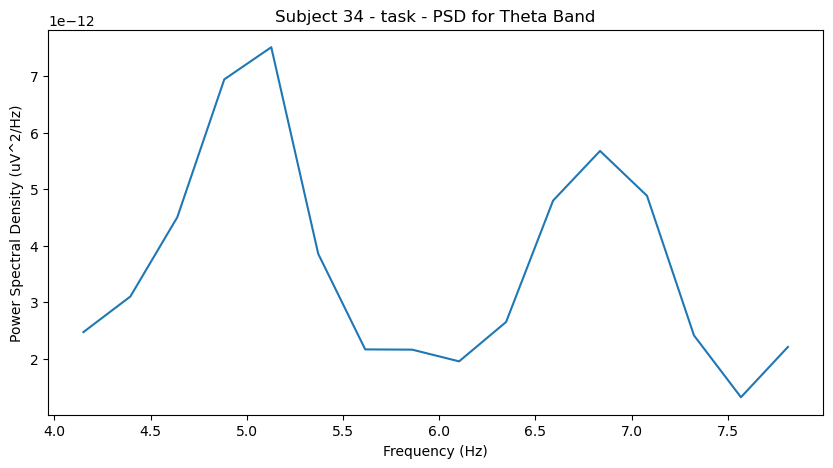

Effective window size : 4.096 (s)


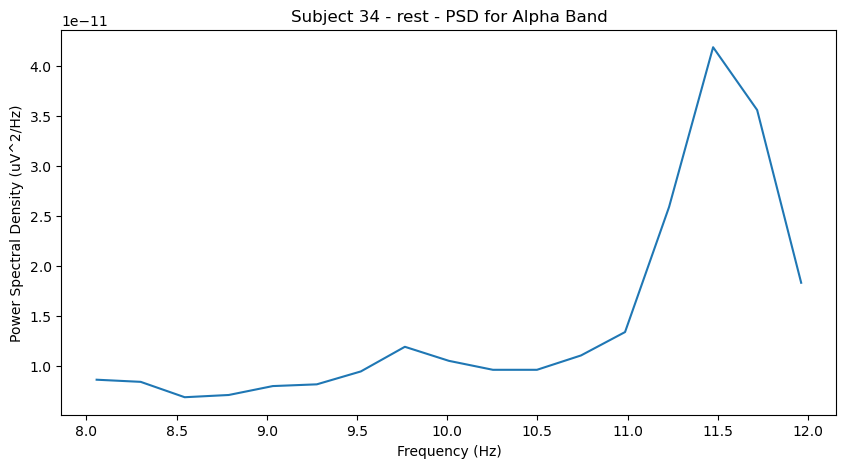

Effective window size : 4.096 (s)


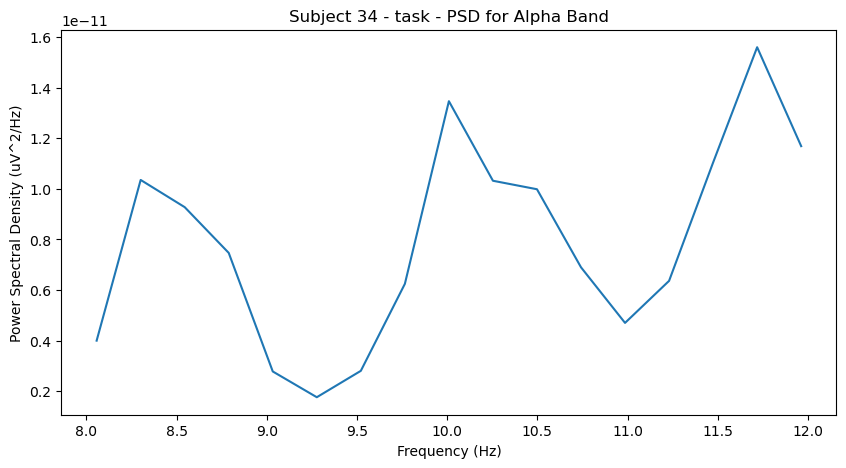

Effective window size : 4.096 (s)


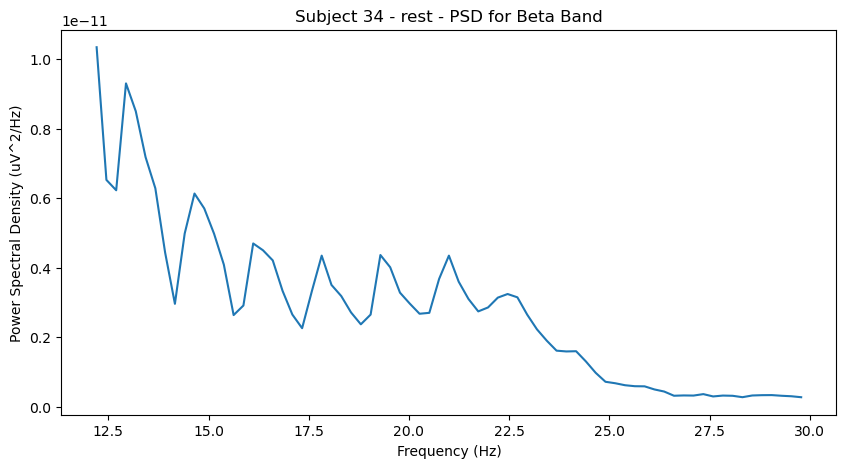

Effective window size : 4.096 (s)


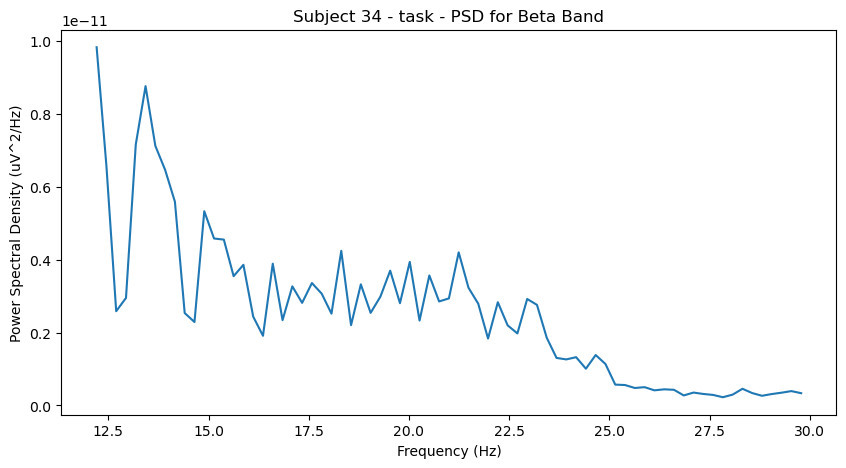

Effective window size : 4.096 (s)


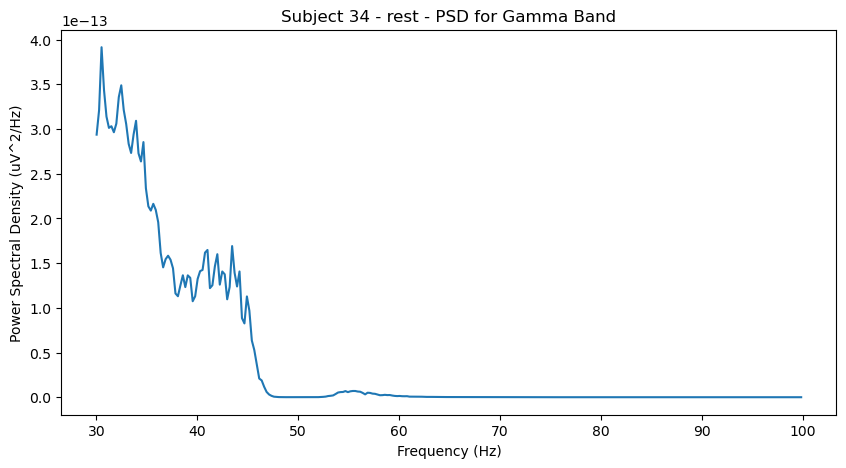

Effective window size : 4.096 (s)


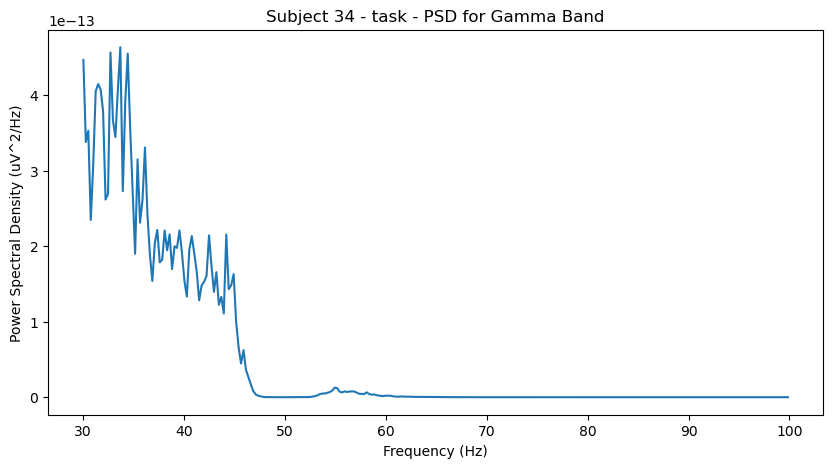

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 34/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject34_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject34_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


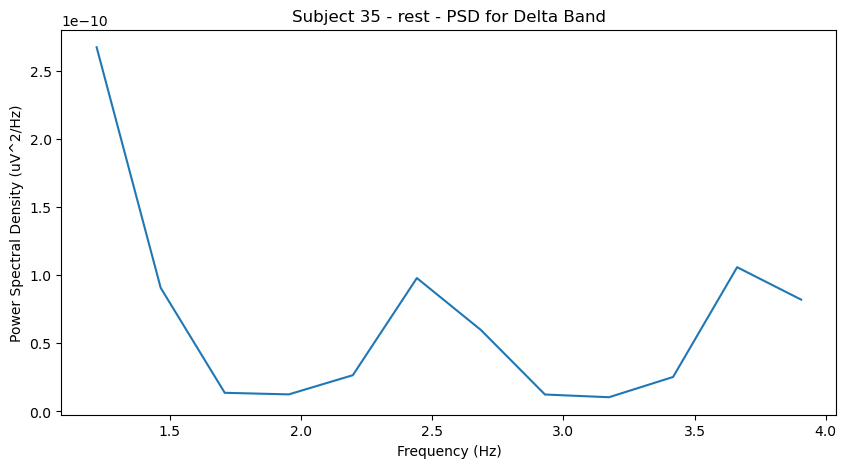

Effective window size : 4.096 (s)


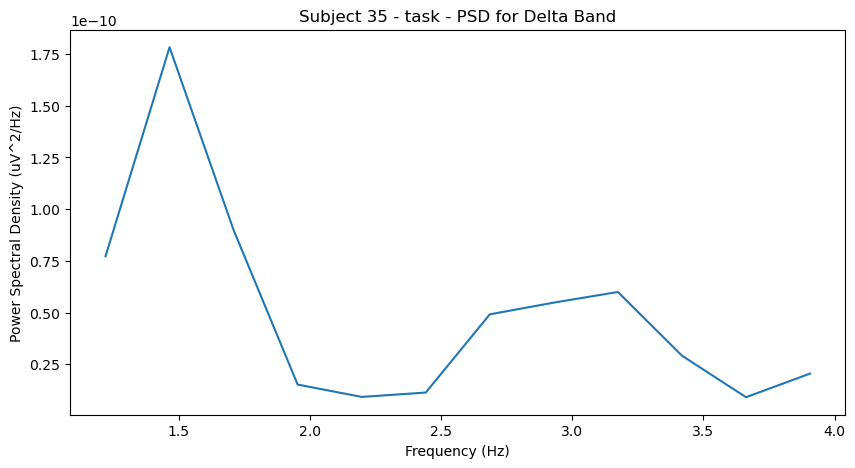

Effective window size : 4.096 (s)


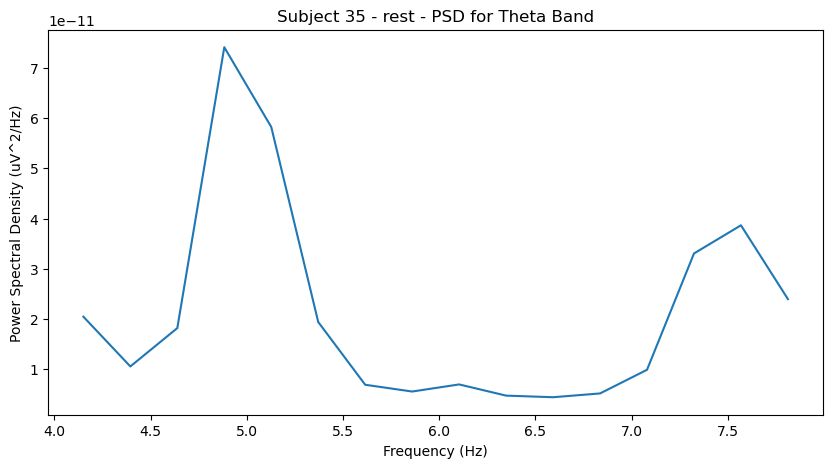

Effective window size : 4.096 (s)


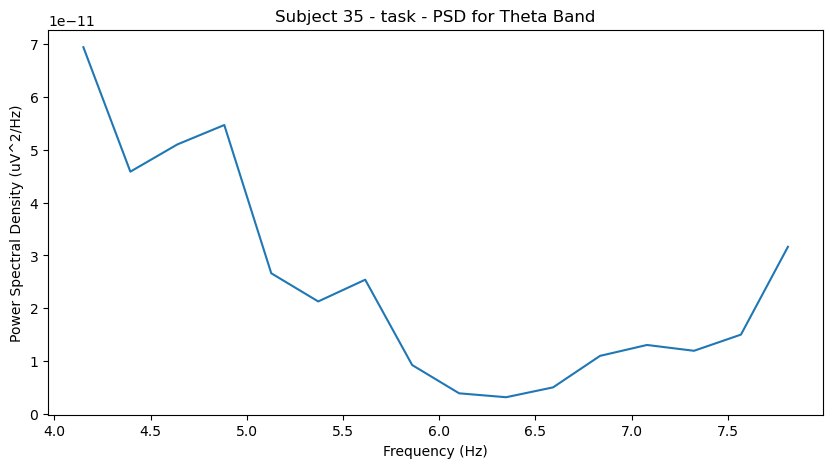

Effective window size : 4.096 (s)


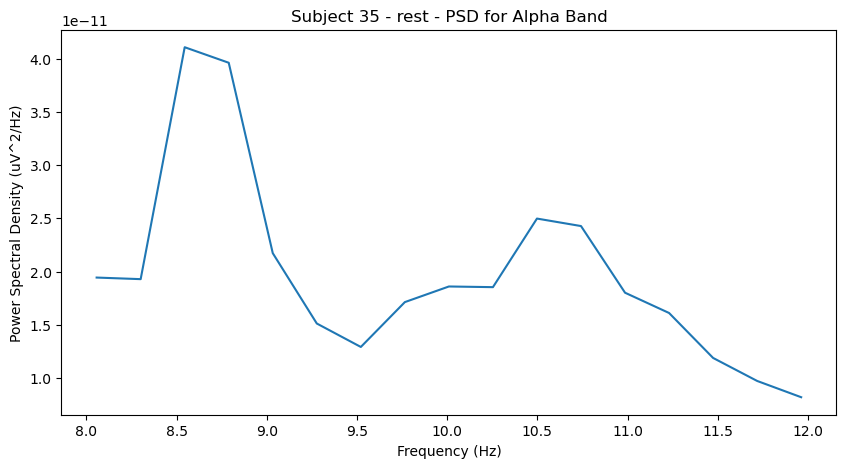

Effective window size : 4.096 (s)


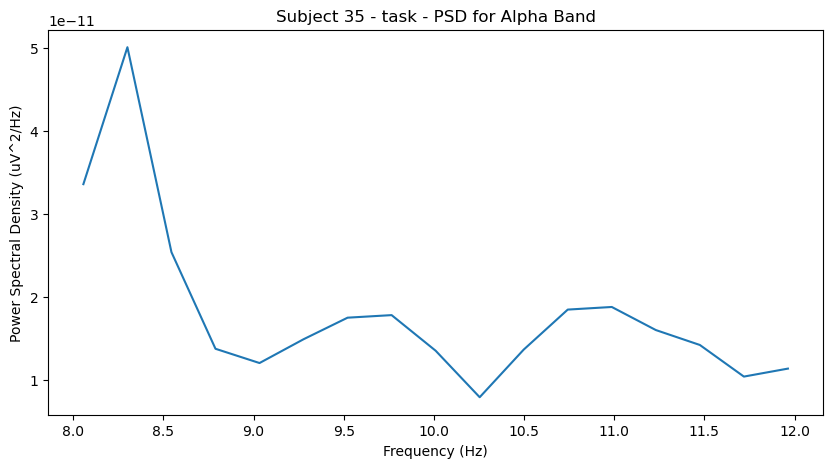

Effective window size : 4.096 (s)


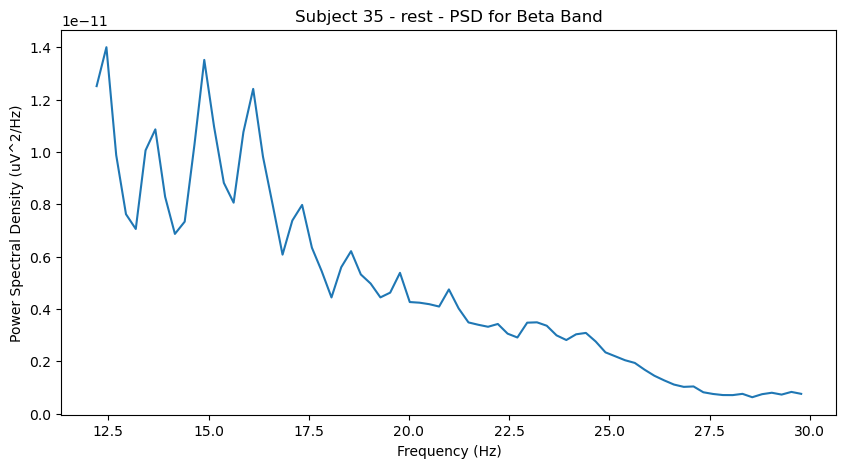

Effective window size : 4.096 (s)


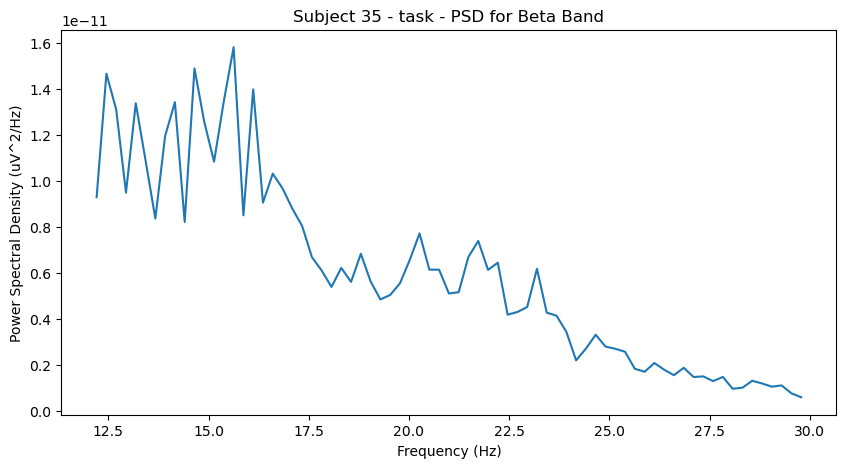

Effective window size : 4.096 (s)


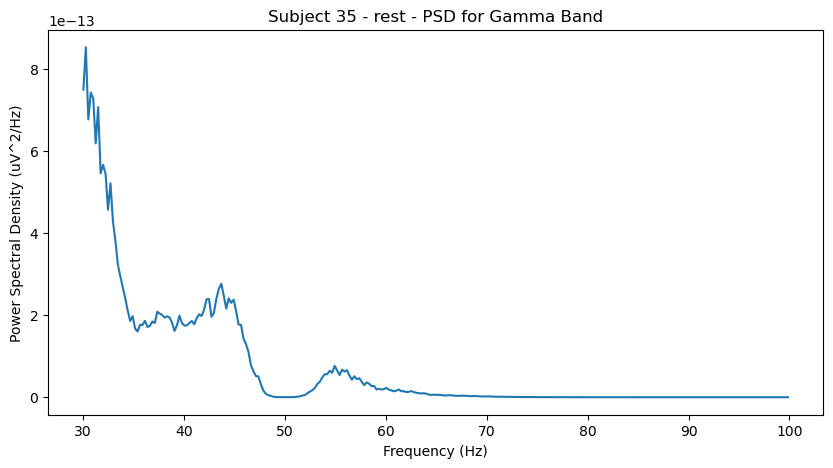

Effective window size : 4.096 (s)


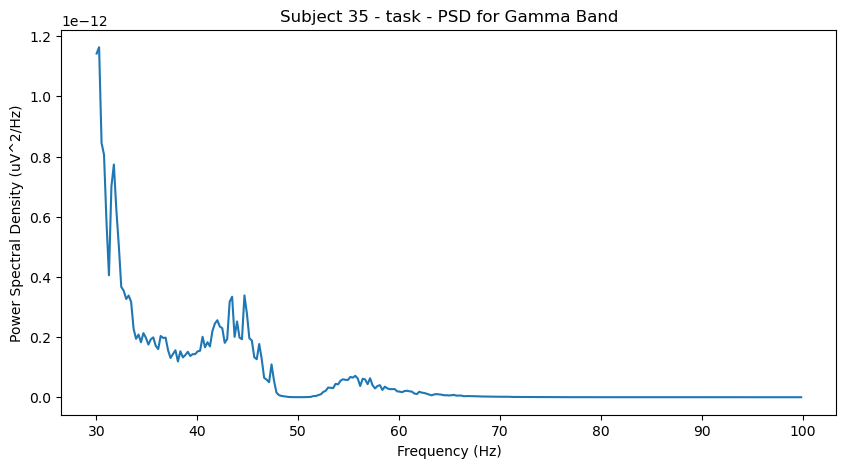

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 35/36
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject35_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 90999  =      0.000 ...   181.998 secs...
Extracting EDF parameters from F:\6th sem\IIt\eeg-during-mental-arithmetic-tasks-1.0.0\Subject35_2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 30999  =      0.000 ...    61.998 secs...
Effective window size : 4.096 (s)


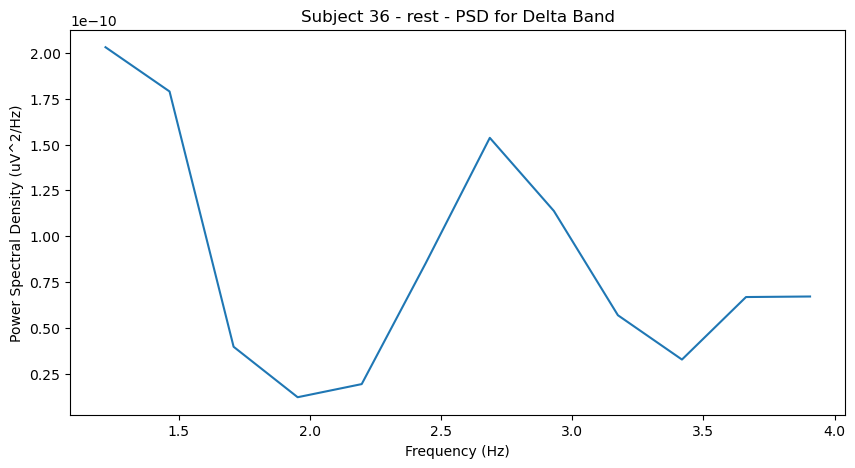

Effective window size : 4.096 (s)


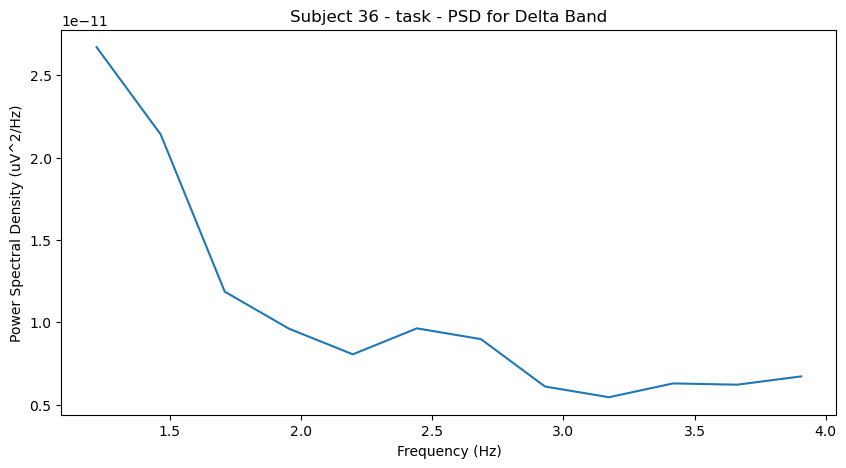

Effective window size : 4.096 (s)


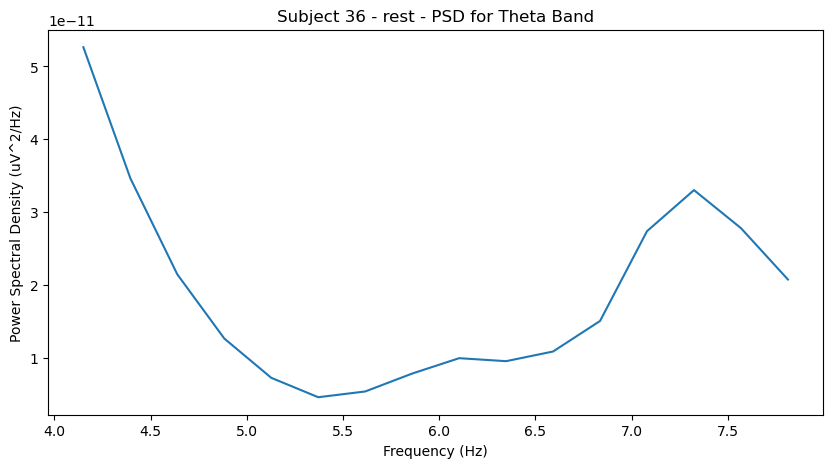

Effective window size : 4.096 (s)


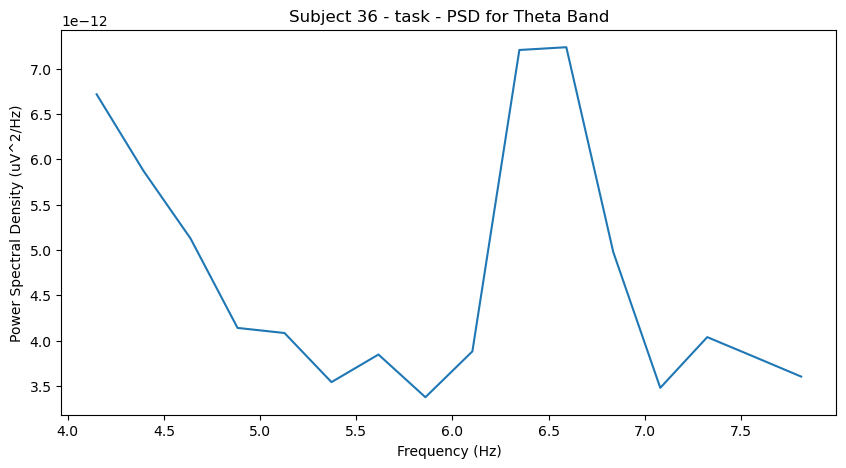

Effective window size : 4.096 (s)


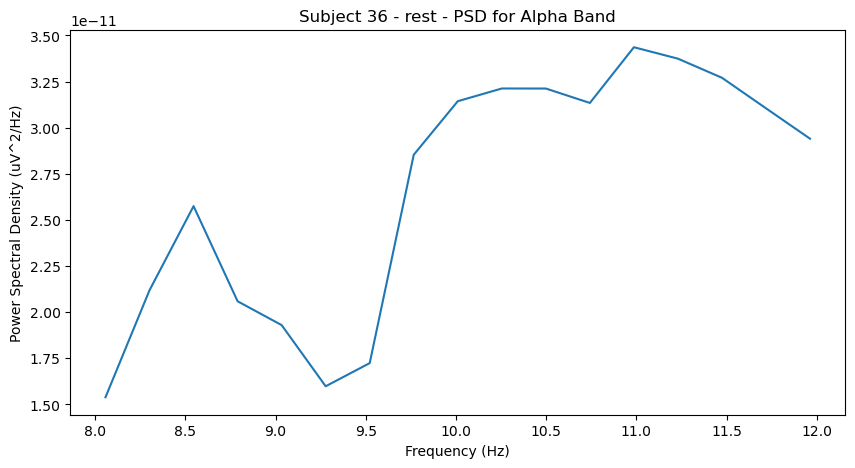

Effective window size : 4.096 (s)


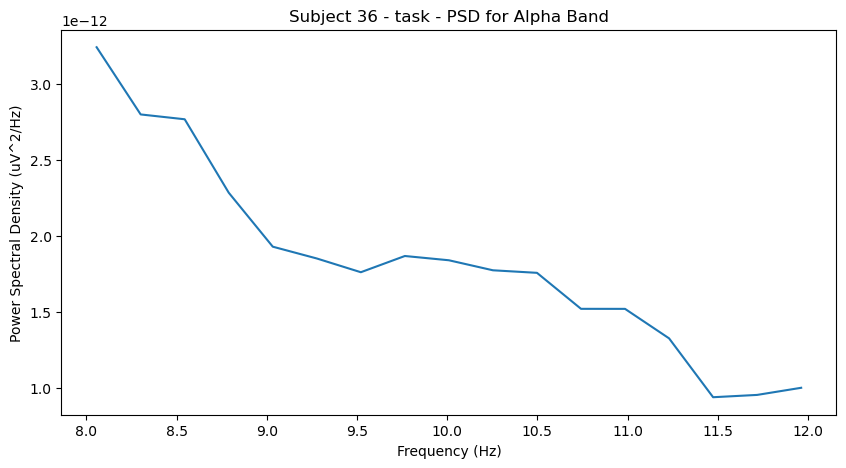

Effective window size : 4.096 (s)


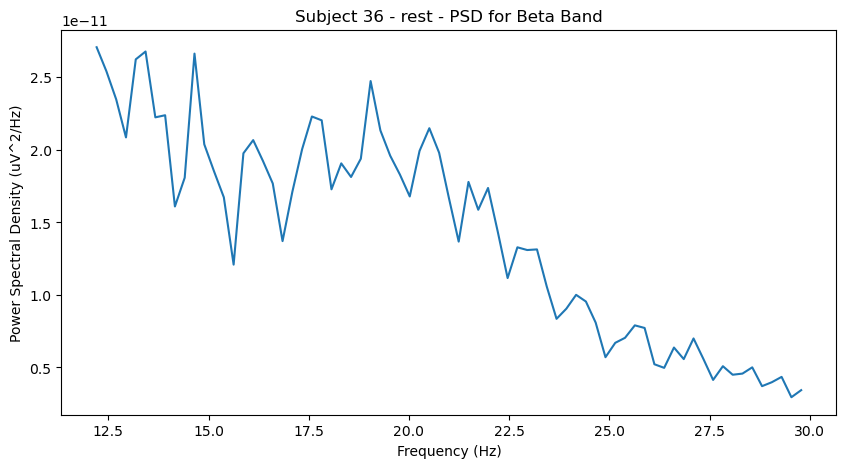

Effective window size : 4.096 (s)


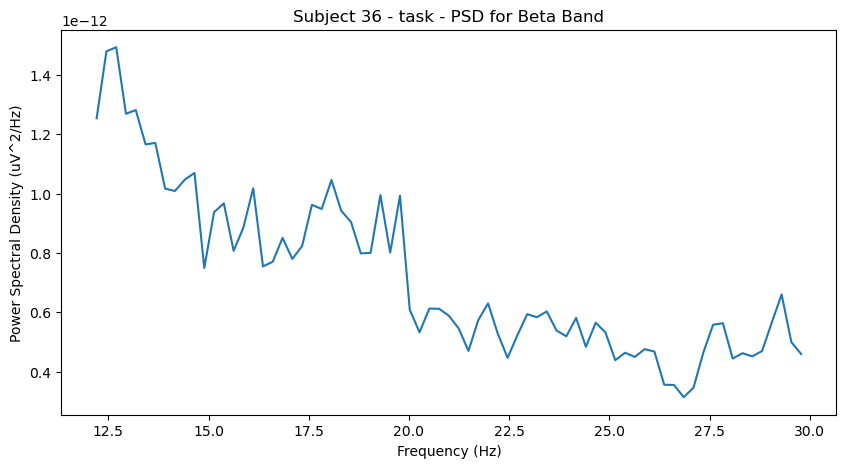

Effective window size : 4.096 (s)


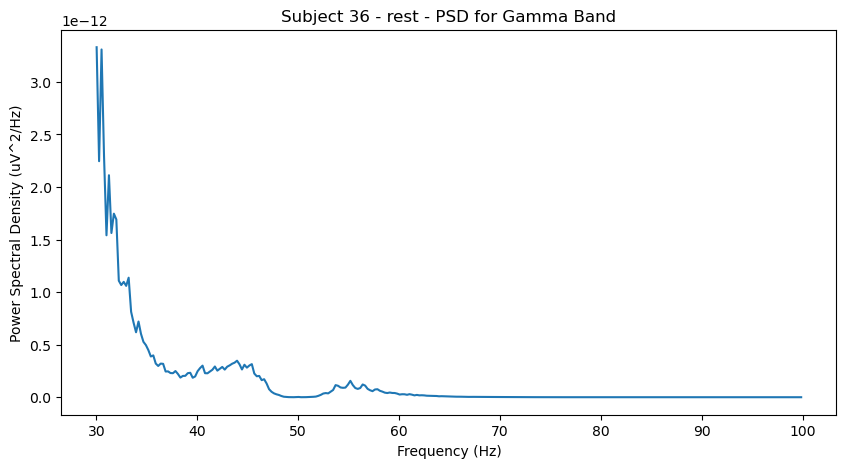

Effective window size : 4.096 (s)


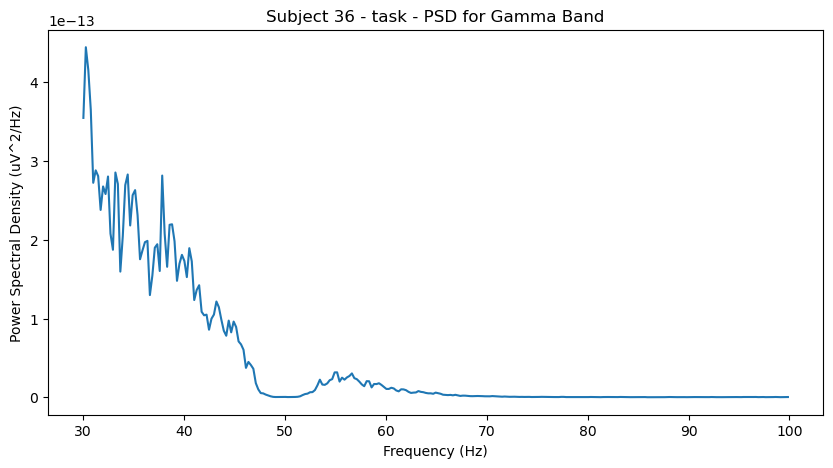

Effective window size : 4.096 (s)
Effective window size : 4.096 (s)
Processed subject 36/36


In [9]:
# Processing of each subject's rest and task files
for i, (rest_file, task_file) in enumerate(zip(rest_files, task_files)):
    raw_rest = mne.io.read_raw_edf(os.path.join(data_path, rest_file), preload=True)
    raw_task = mne.io.read_raw_edf(os.path.join(data_path, task_file), preload=True)
    
    subject = i + 1
    for band_name, band in bands.items():
        psd_rest, freqs_rest = calculate_psd(raw_rest, band)
        plot_psd(psd_rest, freqs_rest, band_name, 'rest', subject)
        
        psd_task, freqs_task = calculate_psd(raw_task, band)
        plot_psd(psd_task, freqs_task, band_name, 'task', subject)
    
    band_psd_rest = calculate_band_psd(raw_rest, bands)
    band_psd_task = calculate_band_psd(raw_task, bands)
    
    for band in bands:
        all_band_psd_rest[band].append(band_psd_rest[band])
        all_band_psd_task[band].append(band_psd_task[band])
    
    print(f"Processed subject {subject}/{len(rest_files)}")

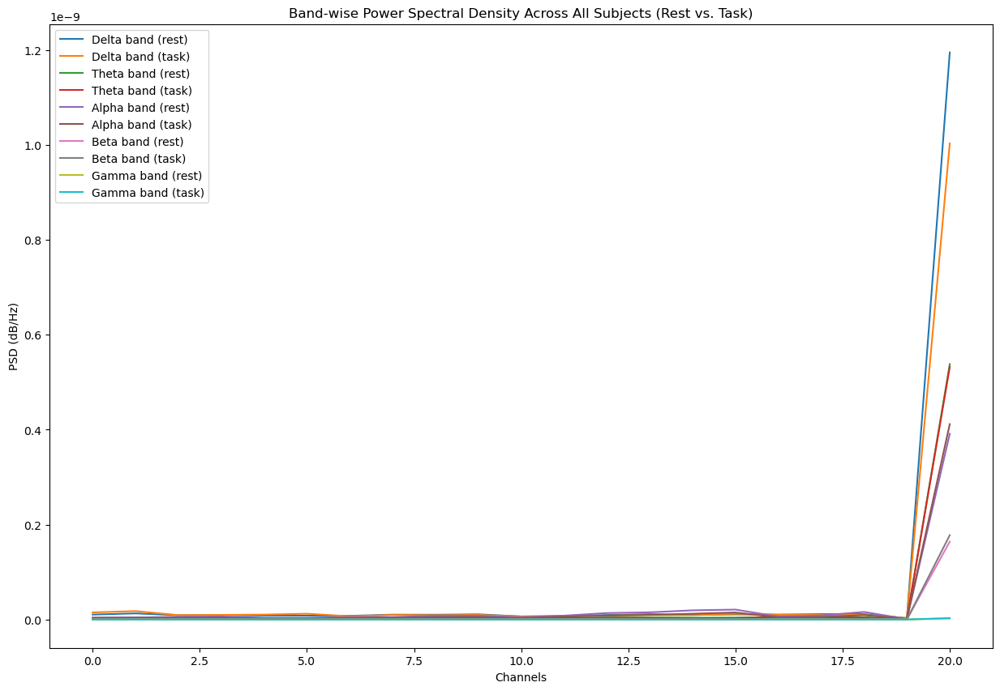

In [10]:
#ploting mean PSD
plt.figure(figsize=(15, 10))
for band in bands:
    mean_psd_rest = np.mean(all_band_psd_rest[band], axis=0)
    mean_psd_task = np.mean(all_band_psd_task[band], axis=0)
    plt.plot(mean_psd_rest, label=f'{band} band (rest)')
    plt.plot(mean_psd_task, label=f'{band} band (task)')

plt.legend()
plt.title('Band-wise Power Spectral Density Across All Subjects (Rest vs. Task)')
plt.xlabel('Channels')
plt.ylabel('PSD (dB/Hz)')
plt.show()

In [11]:
#Preaparing data for classification by concatenating
X_rest = []
X_task = []

for band in bands:
    X_rest.append(np.mean(all_band_psd_rest[band], axis=1))
    X_task.append(np.mean(all_band_psd_task[band], axis=1))

X_rest = np.stack(X_rest, axis=1)
X_task = np.stack(X_task, axis=1)

y_rest = np.zeros(X_rest.shape[0])
y_task = np.ones(X_task.shape[0])

X = np.concatenate((X_rest, X_task), axis=0)
y = np.concatenate((y_rest, y_task), axis=0)

In [12]:
#Standarizing  features and splitting data into train and validation
scaler = StandardScaler()
X = scaler.fit_transform(X)


X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1, 1))
X_val = X_val.reshape((X_val.shape[0], X_val.shape[1], 1, 1))

y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_val = tf.keras.utils.to_categorical(y_val, num_classes=2)

In [13]:
# Defining EEGNet model and compile
def create_EEGNet(nb_classes, Chans=5, Samples=1, dropoutRate=0.5):
    input1 = layers.Input(shape=(Chans, Samples, 1))
    
    block1 = layers.Conv2D(32, (1, Samples), padding='same', use_bias=False)(input1)
    block1 = layers.BatchNormalization()(block1)
    block1 = layers.DepthwiseConv2D((Chans, 1), use_bias=False, depth_multiplier=2, depthwise_constraint=tf.keras.constraints.MaxNorm(1.))(block1)
    block1 = layers.BatchNormalization()(block1)
    block1 = layers.Activation('elu')(block1)
    block1 = layers.AveragePooling2D((1, 1))(block1)
    block1 = layers.Dropout(dropoutRate)(block1)

    block2 = layers.SeparableConv2D(32, (1, 1), use_bias=False, padding='same')(block1)
    block2 = layers.BatchNormalization()(block2)
    block2 = layers.Activation('elu')(block2)
    block2 = layers.AveragePooling2D((1, 1))(block2)
    block2 = layers.Dropout(dropoutRate)(block2)

    flatten = layers.Flatten(name='flatten')(block2)
    dense = layers.Dense(nb_classes, name='dense', kernel_constraint=tf.keras.constraints.MaxNorm(0.25))(flatten)
    softmax = layers.Activation('softmax', name='softmax')(dense)

    return models.Model(inputs=input1, outputs=softmax)

eegnet = create_EEGNet(nb_classes=2, Chans=5, Samples=1)
eegnet.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
eegnet.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 5, 1, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 5, 1, 32)       │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 5, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d                │ (None, 1, 1, 64)       │           320 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1, 1, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 1, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d               │ (None, 1, 1, 64)       │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d                │ (None, 1, 1, 32)       │         2,112 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 1, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_1             │ (None, 1, 1, 32)       │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │            66 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Activation)            │ (None, 2)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,042 (11.88 KB)

 Trainable params: 2,786 (10.88 KB)

 Non-trainable params: 256 (1.00 KB)

In [14]:
#defining TSCeption model and compile
def create_TSCeption(nb_classes, Chans=5, Samples=1, dropoutRate=0.5):
    input1 = layers.Input(shape=(Chans, Samples, 1))
    
    conv1 = layers.Conv2D(32, (1, 1), padding='same', activation='relu')(input1)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.MaxPooling2D((1, 1))(conv1)

    conv2 = layers.Conv2D(64, (1, 1), padding='same', activation='relu')(conv1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.MaxPooling2D((1, 1))(conv2)
    
    conv3 = layers.Conv2D(128, (1, 1), padding='same', activation='relu')(conv2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.MaxPooling2D((1, 1))(conv3)
    
    flatten = layers.Flatten()(conv3)
    dense = layers.Dense(256, activation='relu')(flatten)
    dense = layers.Dropout(dropoutRate)(dense)
    
    output = layers.Dense(nb_classes, activation='softmax')(dense)
    
    return models.Model(inputs=input1, outputs=output)

tsception = create_TSCeption(nb_classes=2, Chans=5, Samples=1)
tsception.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
tsception.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 5, 1, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 5, 1, 32)       │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 5, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 5, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 1, 64)       │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 5, 1, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 5, 1, 128)      │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 1, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 640)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       164,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 176,002 (687.51 KB)

 Trainable params: 175,554 (685.76 KB)

 Non-trainable params: 448 (1.75 KB)

In [20]:
#defining VAE model with encoder and decoder 
from tensorflow.keras import layers, models, backend as K
import tensorflow as tf
import numpy as np


class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = K.shape(z_mean)[0]
        dim = K.int_shape(z_mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + K.exp(0.5 * z_log_var) * epsilon


class VAELossLayer(layers.Layer):
    def call(self, inputs):
        inputs, outputs, z_mean, z_log_var = inputs
        reconstruction_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(inputs, outputs))
        reconstruction_loss *= np.prod(input_shape)
        kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
        kl_loss = K.sum(kl_loss, axis=-1)
        kl_loss *= -0.5
        total_loss = reconstruction_loss + kl_loss
        self.add_loss(total_loss)
        return outputs

def create_VAE(input_shape, latent_dim=2):
   
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)
    
    z_mean = layers.Dense(latent_dim, name='z_mean')(x)
    z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
    z = Sampling()([z_mean, z_log_var])
    
    encoder = models.Model(inputs, [z_mean, z_log_var, z], name='encoder')
    
    
    latent_inputs = layers.Input(shape=(latent_dim,), name='z_sampling')
    x = layers.Dense(128, activation='relu')(latent_inputs)
    x = layers.Dense(64 * 1 * 1, activation='relu')(x)  
    x = layers.Reshape((1, 1, 64))(x)
    x = layers.Conv2DTranspose(64, 3, activation='relu', padding='same')(x)
    x = layers.UpSampling2D((5, 1))(x) 
    outputs = layers.Conv2DTranspose(input_shape[2], 3, activation='sigmoid', padding='same')(x)
    
    decoder = models.Model(latent_inputs, outputs, name='decoder')
    
    
    outputs = decoder(encoder(inputs)[2])
    vae_outputs = VAELossLayer()([inputs, outputs, z_mean, z_log_var])
    vae = models.Model(inputs, vae_outputs, name='vae')
    
    vae.compile(optimizer='adam')
    
    return vae

input_shape = (5, 1, 1)
vae = create_VAE(input_shape=input_shape, latent_dim=2)
vae.summary()


Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 5, 1, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 5, 1, 32)  │        320 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 3, 1, 32)  │          0 │ conv2d_17[0][0]   │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 3, 1, 64)  │     18,496 │ max_pooling2d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 2, 1, 64)  │          0 │ conv2d_18[0][0]   │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_6 (Flatten) │ (None, 128)       │          0 │ max_pooling2d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder             │ [(None, 2),       │     35,844 │ input_layer_7[0]… │
│ (Functional)        │ (None, 2), (None, │            │                   │
│                     │ 2)]               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 128)       │     16,512 │ flatten_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder             │ (None, 5, 1, 1)   │     46,145 │ encoder[0][2]     │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 2)         │        258 │ dense_14[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 2)         │        258 │ dense_14[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_loss_layer_4    │ (None, 5, 1, 1)   │          0 │ input_layer_7[0]… │
│ (VAELossLayer)      │                   │            │ decoder[0][0],    │
│                     │                   │            │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 81,989 (320.27 KB)

 Trainable params: 81,989 (320.27 KB)

 Non-trainable params: 0 (0.00 B)

In [21]:
#Training and Evaluating EEGNet model
history_eegnet = eegnet.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val))
y_pred_eegnet = np.argmax(eegnet.predict(X_val), axis=1)
y_true = np.argmax(y_val, axis=1)
acc_eegnet = accuracy_score(y_true, y_pred_eegnet)
prec_eegnet = precision_score(y_true, y_pred_eegnet)
recall_eegnet = recall_score(y_true, y_pred_eegnet)
f1_eegnet = f1_score(y_true, y_pred_eegnet)

print(f"EEGNet - Accuracy: {acc_eegnet}, Precision: {prec_eegnet}, Recall: {recall_eegnet}, F1-score: {f1_eegnet}")

Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 203ms/step - accuracy: 0.4616 - loss: 0.9414 - val_accuracy: 0.6667 - val_loss: 0.6929
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5501 - loss: 0.6693 - val_accuracy: 0.5333 - val_loss: 0.6931
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.3394 - loss: 0.7411 - val_accuracy: 0.4000 - val_loss: 0.6935
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5371 - loss: 0.6878 - val_accuracy: 0.2667 - val_loss: 0.6937
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5773 - loss: 0.6999 - val_accuracy: 0.3333 - val_loss: 0.6940
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5188 - loss: 0.7029 - val_accuracy: 0.3333 - val_loss: 0.6945
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4942 - loss: 0.7175 - val_accuracy: 0.3333 - val_loss: 0.6949
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5046 - loss: 0.6983 - val_accuracy: 0.3333 - val_loss: 0.6953

In [22]:
# Training and Evaluating TSCeption model
history_tsception = tsception.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val))
y_pred_tsception = np.argmax(tsception.predict(X_val), axis=1)
acc_tsception = accuracy_score(y_true, y_pred_tsception)
prec_tsception = precision_score(y_true, y_pred_tsception)
recall_tsception = recall_score(y_true, y_pred_tsception)
f1_tsception = f1_score(y_true, y_pred_tsception)

print(f"TSCeption - Accuracy: {acc_tsception}, Precision: {prec_tsception}, Recall: {recall_tsception}, F1-score: {f1_tsception}")

Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 462ms/step - accuracy: 0.4929 - loss: 1.1162 - val_accuracy: 0.5333 - val_loss: 0.6882
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6398 - loss: 0.9077 - val_accuracy: 0.5333 - val_loss: 0.6879
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.7308 - loss: 0.6797 - val_accuracy: 0.6667 - val_loss: 0.6833
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7178 - loss: 0.6257 - val_accuracy: 0.7333 - val_loss: 0.6779
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.7529 - loss: 0.5700 - val_accuracy: 0.6667 - val_loss: 0.6765
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.7425 - loss: 0.4795 - val_accuracy: 0.6000 - val_loss: 0.6803
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.8193 - loss: 0.4447 - val_accuracy: 0.4667 - val_loss: 0.6857
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.7646 - loss: 0.4219 - val_accuracy: 0.4667 - val_loss: 0.6874

In [25]:
#Training VAE model
vae.fit(X_train, epochs=50, batch_size=32, validation_data=(X_val, None))


Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: -214797.8281 - val_loss: -290854.6875
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: -1389045.6250 - val_loss: -135267.2500
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: -1650159.6250 - val_loss: -348197.3125
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: -4123608.7500 - val_loss: -389341.0625
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 2186141.7500 - val_loss: -448033.7188
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: -3860032.5000 - val_loss: -481611.0625
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: -1853635.1250 - val_loss: -370561.8125
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: -2872969.5000 - val_loss: -552042.2500
Epoch 9/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: -2010417.3750 - val_loss: -258155.2500
Epoch 10/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: -1468365.6250 - val_loss: -403942.2812
Epoch 11/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2

In [26]:
#Evaluating VAE model
loss = vae.evaluate(X_val, X_val, verbose=0)
print(f'Validation Loss: {loss}')

num_samples = 10
decoded_samples = vae.predict(X_val[:num_samples])


mse = np.mean(np.square(X_val[:num_samples] - decoded_samples))
print(f'Mean Squared Error (MSE) for reconstruction: {mse}')




Validation Loss: -54302440.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Mean Squared Error (MSE) for reconstruction: 0.9474342495022162


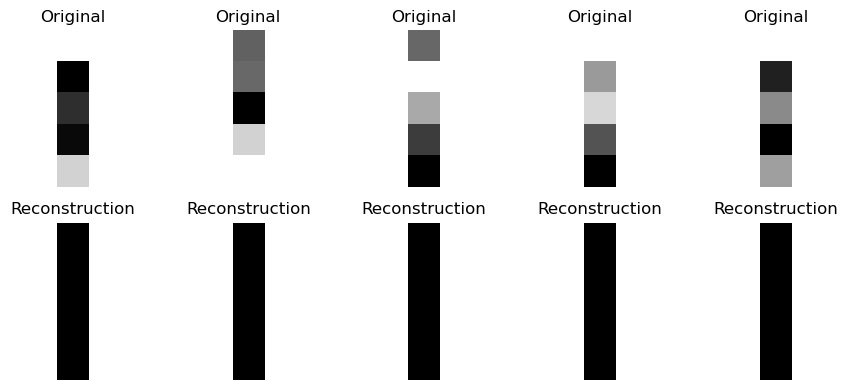

In [27]:
#Visualizing original and reconstructed samples
import matplotlib.pyplot as plt

n = min(num_samples, 5)  
plt.figure(figsize=(10, 4))
for i in range(n):
    
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(X_val[i].reshape(input_shape[:-1]), cmap='gray')
    plt.title('Original')
    plt.axis('off')
    
   
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_samples[i].reshape(input_shape[:-1]), cmap='gray')
    plt.title('Reconstruction')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [28]:
#saving models
eegnet.save('eegnet_model.h5')
tsception.save('tsception_model.h5')
vae.save('vae_model.h5')

In [ ]:
#Summary

#1. Loading and preparing data
#EEG data is loaded from designated directories, and files are divided into task and rest states according to their names.
#Calculates the Power Spectral Density for each band and defines frequency bands for EEG analysis.
#Plots PSDs for several subjects in both the rest and task states.

In [ ]:
#2.Utilized models

#EEGNet: It seeks to effectively identify patterns in EEG waves.
#TSCeption: It combines convolutional and pooling layers to extract hierarchical features from input data.
#VAE: The system is comprised of a probabilistic encoder and decoder network that are linked via a latent space.

In [ ]:
#3.Evalution and Metrics

#Models are assessed using measures like F1-score, recall, accuracy, and precision.
#Compares the way the TSCeption and EEGNet models perform on classification tests.
#Evaluates Mean Squared Error and reconstruction quality for the VAE.

In [ ]:
#4.Visualization and Saving:

#Visualizes original and reconstructed EEG samples from the VAE.
#Saves trained models for future use.

In [ ]:
#This code provides:
#Extensive workflow that focuses on EEG data analysis 
#Latent representation learning utilizing neural networks and VAEs,
#From data loading and preprocessing to deep learning modeling and evaluation.

In [ ]:
#EEGNet's overall performance metrics seem to suffer as a result of its apparent difficulty appropriately classifying negative events.
#TSCeption performs better than any other metric, demonstrating its efficacy in EEG classification tasks.
#VAE indicates a validation loss calculation problem. 
#Reconstruction's MSE is reasonable, indicating a respectable level of reconstruction quality.
